README:  
Introcuction: This script is for figure 4 in fullscope analysis(celltype spatial DTU feature analysis)  
Author: Y0NEKO  
Time: 2024.03.28  

In [2]:
#load package
.libPaths(c("/cluster/home/liuhengxin/software/miniconda3_2/envs/r-kernel/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3/envs/r4.1.2/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3_2/envs/Rsplot/lib/R/library"))
library(data.table)
library(qs)
library(GenomicRanges)
library(GenomicFeatures)
library(rtracklayer)
library(dplyr)
library(ggbio)
library(reshape2)
library(ggsci)
library(viridis)
library(ggpubr)
library(ggh4x)
library(ggtranscript)
library(khroma)
library(bambu)
library(ggdensity)
library(Seurat)
library(scCustomize)
library(ComplexUpset)
library(ComplexHeatmap)

qs 0.25.5

Warning message:
“package ‘GenomicRanges’ was built under R version 4.3.3”
Loading required package: stats4

Loading required package: BiocGenerics

Warning message:
“package ‘BiocGenerics’ was built under R version 4.3.2”

Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors

Warning message:
“package ‘S4Vectors’ was built under R version 4.3.3”

Attaching package: ‘S4Vectors’


The following objects are masked from ‘packa

In [3]:
library(randomcoloR )
library(ggsignif) # Significance Brackets for 'ggplot2'
library(gghalves)

Warning message:
"package 'ggsignif' was built under R version 4.3.3"


In [7]:
#load data
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
MySplit = function(str,sep, n){
  return(unlist(lapply(strsplit(str,sep),"[[",n)))
}
cellan = read.csv("../ref/cell_type_type20230220-macaque1-contour2_v1.csv")
cellan = unique(cellan[,c("subclass","class")])
areaan = read.csv("../ref/area_annotation.csv")
gtf = rtracklayer::import("ref/bambu_extended_annotations_novelname.gtf")
areaan = unique(areaan[c("L0","L3")])
colnames(areaan) = c("lobe","area")
areaan[areaan$area == "1/2",]$area = "1|2"
refgdf = read.csv(file = "ref/disease_gene/Total_gene_list_summary_24_10_30.csv")

In [4]:
#transtls = qread("data/reads_full_anotation/read_trans_stat_list_24_04_19.qs")
#fsraw = qread("data/reads_full_anotation/main_data_read_total_annotation_24_04_19.qs")
fsraw.cor = qread("data/reads_full_anotation/main_data_read_total_annotation_delete_multiread_24_09_04.qs")

fsraw.cor = fsraw.cor[fsraw.cor$layer %in% paste0("l",1:6),]
#srtt = qread("data/meta_cell_ngs/umap_srt_combined_24_04")

In [467]:
fsraw = qread("data/reads_full_anotation/main_data_read_total_annotation_24_09_04.qs")

In [8]:
isosigls.cl = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_dedup_celltype_24_09_17.qs")
isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_24_09_04.qs")

In [5]:
transtls = qread("data/reads_full_anotation/read_trans_stat_list_dedup_fsrawcor_24_09_04.qs")

In [6]:
longbed = qread("ref/long_read_mapping_total_rawnano_total_fil_24_11_12.qs")

In [6]:
dir.create("result/figure4")

In [6]:
suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC',"PVALB",'SST','ASC','OLG','OPC','MG','EC','VLMC')
length(suborder)
#setdiff(unique(cellprop.lobe$subclass),suborder)
subclassan = data.frame("subclass" = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC','PVALB','SST','ASC','OLG','OPC','MG','EC','VLMC'),
                      "class" = c('sGLU','sGLU','sGLU','sGLU','sGLU',
                                  'dGLU','dGLU','dGLU','dGLU','dGLU',
                                  'GABA','GABA','GABA','GABA','GABA','GABA',"GABA",
                                 'NN-ASC','NN-OLG','NN','NN','NN','NN'))

[1] 23

In [7]:
cellmd = read.csv(file = "result/figure3/sigiso_subclass_transcript_dr_cluster_tab.csv")
head(cellmd)

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj,dr2,cluster,class,clusteran
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<chr>
1,ABCB9,XM_015431732.1,L2,6,24,0.25000000,0.1093299,0.08119588,0.16880412,N,0.02467568,0.9717002,0.14067010,5,1,surface-GLU
2,ABCB9,XM_015431732.1,L2/3,1,41,0.02439024,0.1093299,0.12631783,-0.10192759,N,0.02467568,0.9717002,-0.08493965,5,1,surface-GLU
3,ABCB9,XM_015431732.1,L3/4,3,45,0.06666667,0.1093299,0.11786254,-0.05119588,N,0.02467568,0.9717002,-0.04266323,5,2,deep-GLU
4,ABCB9,XM_015431732.1,L4,2,24,0.08333333,0.1093299,0.11452921,-0.03119588,N,0.02467568,0.9717002,-0.02599657,5,2,deep-GLU
5,ABCB9,XM_015431732.1,L4/5,1,43,0.02325581,0.1093299,0.12654472,-0.10328890,N,0.02467568,0.9717002,-0.08607408,5,2,deep-GLU
6,ABCB9,XM_015431732.1,L4/5/6,5,24,0.20833333,0.1093299,0.08952921,0.11880412,N,0.02467568,0.9717002,0.09900343,5,2,deep-GLU


In [7]:
theme_presentation<- function(base_size = 16, base_family = "") {
  # Starts with theme_grey and then modify some parts
  theme_bw(base_size = base_size, base_family = base_family) %+replace%
    theme(
      strip.background = element_blank(),
      strip.text.x = element_text(size=16,colour="white"),
      strip.text.y = element_text(size=16,colour="white"),
      axis.text.x = element_blank(),
      axis.text.y = element_blank(),
      axis.ticks =  element_blank(), 
      axis.title.x= element_blank(),
      axis.title.y= element_blank(),
      panel.background = element_rect(fill="black"), 
      panel.border =element_blank(),  
      panel.grid.major = element_blank(), 
      panel.grid.minor = element_blank(), 
      panel.margin = unit(1.0, "lines"), 
      plot.background = element_rect(fill="black"), 
      plot.title =element_text(size=16,colour="white"), 
      # plot.margin = unit(c(1,  1, 1, 1), "lines"),
      legend.background=element_rect(fill='black'),
      legend.title=element_text(size=12,colour="white"),
      legend.text=element_text(size=12,colour="white"),
      legend.key = element_rect( fill = 'black'),
      # legend.key.size = unit(c(0, 0), "lines"),
      axis.line.x = element_blank(),
      axis.line.y = element_blank()
    )
}

### Case plot function

In [23]:
#case plot
BuildPlotBed = function(npclf,nanobed,groupname,geneex,sigtr = NULL){
    readgroup = npclf[npclf$gene_id == geneex,]
    # readgroup = readgroup[readgroup$arealayer %in% paste0("l",1:6),]
    readgroup = unique(readgroup[c("readid","transcript_id","gene_id",
                                   groupname)])
    # readgroup = readgroup %>% group_by(readid) %>% 
    #   mutate(transgroup = 
    #            paste(unique(transcript_id)[order(unique(transcript_id))],
    #                              collapse = "|"))
    readgrt = nanobed[nanobed$name %in% readgroup$readid,]
    readgrt$group = readgroup[match(readgrt$name,
                                    readgroup$readid),
                              groupname]
    # readgrt$transcript_id = readgroup[match(readgrt$name,readgroup$readid),
    #                                   "transcript_id"]
    # readgrt$transgroup = readgroup[match(readgrt$name,readgroup$readid),
    #                                   "transgroup"]
    
    grtdfl = as.data.frame(readgrt)
    colnames(grtdfl)[ncol(grtdfl)] = "group"
    colnames(grtdfl)[6] = "readid"
    grtdfl = merge(grtdfl,readgroup[c("readid",
                              "transcript_id")],
          by = "readid")
    grtdfl = grtdfl[order(grtdfl$transcript_id,
                          grtdfl$start,grtdfl$end),]
    grtdfl = grtdfl[!is.na(grtdfl$group) &
                      grtdfl$group != "",]
    grtdfl
    grtdfl$readord = paste0(grtdfl$transcript_id,"-",grtdfl$readid)
    grtdfl = grtdfl %>% group_by(group) %>% 
      mutate(orid = as.numeric(factor(readord,
                                      levels = unique(readord)))) %>%
      mutate(oridnorm = orid/max(orid))
    grtdfl$sig = "black"
    grtdfl[grtdfl$group %in% sigtr, "sig"] = "red"
    return(grtdfl)
}

IsoformReadPlot = function(gtfp, grtdfl, geneex, onlyhub = T,mycolor = NULL){
    library(randomcoloR)
    library(ggbio)
    library(ggtranscript)
    tartrans = gtfp[which(gtfp$gene_id == geneex),]
    tartrans = as.data.frame(tartrans)
    tartrans = tartrans[tartrans$type == "exon",]
    tartrans = tartrans[order(tartrans$transcript_id),]
    tartrans$orid = as.numeric(factor(tartrans$transcript_id,levels = unique(tartrans$transcript_id)))
    tartrans$group = NA
    if(onlyhub){
      grtdfl = grtdfl %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
      grtdfl$readord = paste0(grtdfl$transcript_id,"-",grtdfl$readid)
      grtdfl = grtdfl %>% group_by(group) %>% 
        mutate(orid = as.numeric(factor(readord,
                                        levels = unique(readord)))) %>%
        mutate(oridnorm = orid/max(orid))
      tartrans = tartrans[tartrans$transcript_id %in% grtdfl$transcript_id,]
    }
    # tartrans = merge(tartrans,unique(grtdfl[c("transcript_id",
    #                                           "transgroup")]),
    #                  by = "transcript_id")
    tartranstx = tartrans %>% group_by(transcript_id,orid) %>% 
      summarise(start = min(start),end = max(end))
    tartranstx$group = NA
    mylim = c(min(tartranstx$start)-1000,max(tartranstx$end)+1000)
    library(ggh4x)
    
    #facetcol = list()
    #facetcoldf = unique(grtdfl[c("group","sig")])
    #facetcoldf = facetcoldf[order(facetcoldf$group,decreasing = F),]
    #for (i in 1:nrow(facetcoldf)) {
    #  facetcol[[i]] = element_text(color = facetcoldf[i,]$sig)
    #}
    #facetcol[[nrow(facetcoldf)+1]] = element_text(color = "black")
    grtdflin = to_intron(grtdfl,
                     "readord")
    no_of_colors = length(unique(grtdfl$transcript_id)) 
    colorful_palette = distinctColorPalette(no_of_colors) 
    names(colorful_palette) = unique(grtdfl$transcript_id)
    if(!is.null(mycolor)){
        colorful_palette = mycolor
    }

    
    pc = ggplot(grtdfl,aes(x = start,xend = end,
                      y = orid,
                      yend = orid,
                      fill = transcript_id,color = transcript_id)) +
      geom_segment(size = 0.5) +
      geom_segment(data = grtdflin,
                   aes(x = start,xend = end,
                       y = orid,
                       yend = orid),
                   size = 0.03,alpha = 0.5,color = "grey") +
      geom_range(data = tartrans,
                 aes(xstart = start,xend = end,
                     y = orid,
                     fill = transcript_id,color = transcript_id),
                 size = 0.2) +
      geom_intron(data = to_intron(tartrans,
                                   "transcript_id"),
                  aes(xstart = start,xend = end,strand = strand),
                  size = 0.2,
                  arrow.min.intron.length = 200,
                  arrow = arrow(length=unit(0.3,"cm"))) +
      geom_text(data = tartranstx,
                aes(x = (start + end) / 2,y = orid,
                    label = transcript_id),
                size = 3, vjust = -0.1, color = "black") +
     # facet_grid2(group~.,scales = "free",
     #             strip = strip_themed(
     #               text_y = facetcol
    #            )) +
      facet_wrap(group~.,scales = "free",ncol = 1,strip.position = "top") +
      scale_x_continuous(limits = mylim)+
      scale_color_manual(values = colorful_palette) +
      scale_fill_manual(values = colorful_palette) +
      # scale_fill_discreterainbow() +
      # scale_color_discreterainbow() +
      theme_void() + 
      ggtitle(geneex) +
      theme(legend.position = "none",
            panel.spacing = unit(0,'lines'),
            strip.background = element_rect(fill = NA,color = NA),
           strip.placement = "outside",
           plot.title = element_text(hjust = 0.5))
    pc
    
    return(pc)
}
#fsraw.cor = fsraw[fsraw$layer %in% paste0("l",1:6),]
#
IsoformReadPlotTotal = function(fsraw,isosigi,longbed,gtf,geneex,hubtrans = NULL,onlyhub = F,mycolors =NULL){
    transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
    if(!is.null(hubtrans)){
        transname = hubtrans
    }
    if(is.null(mycolors)){
        mycolors = distinctColorPalette(length(transname))
        names(mycolors) = transname
    }
    grtdfl = BuildPlotBed(fsraw,longbed,'areatr',geneex,NULL)
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
    pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub,mycolors)
    pci1
    return(pci1)
}

CaseCountPlotBox = function(fsraw,geneex,transname,mycolors = NULL){
    npcase1 = fsraw[fsraw$gene_id == geneex,]
    npcase1 = npcase1[npcase1$transcript_id %in% transname,]
    if(is.null(mycolors)){
        mycolors = distinctColorPalette(length(unique(npcase1$transcript_id)))
    }
    npcase1 = npcase1 %>% 
        group_by(areatr,chunk) %>%
        mutate(genecount = length(unique(readid))) %>% 
        filter(genecount > 10) %>%
        group_by(areatr,chunk,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
    npcase1 = npcase1[npcase1$areatr != "",]
    
    npcase1$rate = npcase1$count/npcase1$genecount

    npcase1$transid = as.numeric(as.factor(npcase1$transcript_id))
    npcase1$cmpgroup = paste0(substr(npcase1$transid,1,1),
                            "-",npcase1$areatr)
    comparisons = list()
    classid = as.character(unique(npcase1$areatr))
    n = 1
    for(i in 1:length(classid)){
        for(j in (i+1):length(classid)){
            comparisons[[n]] = c(classid[i],classid[j])
            n = n + 1
        }
    }
    
    npcase1m = npcase1 %>% group_by(areatr,transcript_id) %>% summarise(mean = mean(rate))
    
    pci2 = ggplot(npcase1,
                  aes(x = areatr, y = rate, color = transcript_id)) +
      geom_boxplot() +
      geom_point(data = npcase1m,aes(x = areatr, y = mean,
                                    color = transcript_id),
                 position = position_dodge(0.75)) +
      # geom_line(data = npcase1m,aes(x = areatr, y = mean,
      #                              group = transcript_id),
      #           position = position_dodge(0.75)) +
      stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,ref.group = ".all.") + 
      scale_color_manual(values = mycolors) +
      theme_pubr() + 
    theme(axis.text.x = element_text(angle = 45,vjust = 0.5)) +
    xlab("") + ylab("Isoform read ratio")
    return(pci2)
}

CasePlotTotalClass = function(fsraw,isosigi,gtf,geneex,hubtrans = NULL,markdfb,edgesdf){
    transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
    if(!is.null(hubtrans)){
        transname = hubtrans
    }
    mycolors = distinctColorPalette(length(transname))
    print(mycolors)
    names(mycolors) = transname
    grtdfl = BuildPlotBed(fsraw,longbed,'areatr',geneex,NULL)
    print(head(grtdfl))
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
    pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub = F,mycolors)
    pci1
#ggexport(p0c1,filename = "processed/figures/f3/bambu_cell_case_NNvsNeuron_CDC42.pdf",
#           width = 6,height = 5)

    npcase1 = fsraw[fsraw$gene_id == geneex,]
    npcase1 = npcase1 %>% 
        group_by(areatr,chunk) %>%
        mutate(genecount = length(unique(readid))) %>% 
        filter(genecount > 10) %>%
        group_by(areatr,chunk,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
    npcase1 = npcase1[npcase1$areatr != "",]
    npcase1 = npcase1[npcase1$transcript_id %in% transname,]
    npcase1$rate = npcase1$count/npcase1$genecount

    npcase1$transid = as.numeric(as.factor(npcase1$transcript_id))
    npcase1$cmpgroup = paste0(substr(npcase1$transid,1,1),
                            "-",npcase1$areatr)
    comparisons = list()
    classid = as.character(unique(npcase1$areatr))
    n = 1
    for(i in 1:length(classid)){
        for(j in (i+1):length(classid)){
            comparisons[[n]] = c(classid[i],classid[j])
            n = n + 1
        }
    }


    
    npcase1m = npcase1 %>% group_by(areatr,transcript_id) %>% summarise(mean = mean(rate))
    
#library(ggstatsplot)

    pci2 = ggplot(npcase1,
                  aes(x = areatr, y = rate, color = transcript_id)) +
      geom_boxplot() +
      geom_point(data = npcase1m,aes(x = areatr, y = mean,
                                    color = transcript_id),
                 position = position_dodge(0.75)) +
      geom_line(data = npcase1m,aes(x = areatr, y = mean,
                                   group = transcript_id),
                position = position_dodge(0.75)) +
      stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,ref.group = ".all.") + 
      scale_color_manual(values = mycolors) +
      theme_pubr() + xlab("") + ylab("Isoform read ratio")
    
#     pci2 = ggbarplot(npcase1,
#                     x = "areatr", y = "rate", 
#                     fill = "areatr",size = 0.5,
#                     width = 0.7,facet.by = "transcript_id",
#                     add = c("mean_se")) +
#         geom_jitter(data = npcase1,
#                 aes(x = areatr, y = rate),size = 0.3,
#                     width = 0.25) +
#         scale_fill_flatui() +
# #        scale_fill_manual(values = mycolors) +
#         stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,
#                            ref.group = ".all.") + 
#         xlab("") + ylab("Isoform ratio") + labs(fill = "") +
#         theme_pubr() + 
#     theme(axis.text.x = element_blank(),
#          axis.ticks.x = element_blank(),
#           legend.position = "bottom")
#     pci2
    pci3 = MarkerSpPlot(fsraw.cor,markdfb,geneex,hubtrans,edgesdf,200)
    #pci3 = MarkerSpPlot(fsrawdp.cell,fsrawdp.cellb,geneex,mycolors,hubtrans)
    
    pci = ggarrange(ggarrange(pci1,pci2,widths = c(1.5,2),ncol = 1),pci3,nrow = 1)
    return(pci)
}

#fsraw.cor = fsraw[fsraw$layer %in% paste0("l",1:6),]
#
CasePlotTotalClass = function(fsraw,isosigi,gtf,geneex,hubtrans = NULL){
    transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
    if(!is.null(hubtrans)){
        transname = hubtrans
    }
    mycolors = distinctColorPalette(length(transname))
    print(mycolors)
    names(mycolors) = transname
    grtdfl = BuildPlotBed(fsraw,longbed,'areatr',geneex,NULL)
    print(head(grtdfl))
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
    pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub = T,mycolors)
    pci1
#ggexport(p0c1,filename = "processed/figures/f3/bambu_cell_case_NNvsNeuron_CDC42.pdf",
#           width = 6,height = 5)

    npcase1 = fsraw[fsraw$gene_id == geneex,]
    npcase1 = npcase1 %>% 
        group_by(areatr,chunk) %>%
        mutate(genecount = length(unique(readid))) %>% 
        filter(genecount > 10) %>%
        group_by(areatr,chunk,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
    npcase1 = npcase1[npcase1$areatr != "",]
    npcase1 = npcase1[npcase1$transcript_id %in% transname,]
    npcase1$rate = npcase1$count/npcase1$genecount

    npcase1$transid = as.numeric(as.factor(npcase1$transcript_id))
    npcase1$cmpgroup = paste0(substr(npcase1$transid,1,1),
                            "-",npcase1$areatr)
    comparisons = list()
    classid = as.character(unique(npcase1$areatr))
    n = 1
    for(i in 1:length(classid)){
        for(j in (i+1):length(classid)){
            comparisons[[n]] = c(classid[i],classid[j])
            n = n + 1
        }
    }
    
    pci2 = ggbarplot(npcase1,
                    x = "areatr", y = "rate", 
                    fill = "areatr",size = 0.5,
                    width = 0.7,facet.by = "transcript_id",
                    add = c("mean_se")) +
        geom_jitter(data = npcase1,
                aes(x = areatr, y = rate),size = 0.3,
                    width = 0.25) +
        scale_fill_flatui() +
#        scale_fill_manual(values = mycolors) +
        stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,
                           ref.group = ".all.") + 
        xlab("") + ylab("Isoform ratio") + labs(fill = "") +
        theme_pubr() + 
    theme(axis.text.x = element_blank(),
         axis.ticks.x = element_blank(),
          legend.position = "bottom")
    pci2

    pci3 = MarkerSpPlot(fsrawdp.cell,fsrawdp.cellb,geneex,edgesdf,mycolors,hubtrans)
    
    pci = ggarrange(ggarrange(pci1,pci2,widths = c(1.5,1),ncol = 1),pci3,nrow = 1)
    return(pci)
}


In [21]:
#spatial point plot
MarkerSpPlot = function(npclfdp.cell,npclfdp.cellb,geneex,edgesdf,mycolor = NULL,hubtrans = NULL){
    markdf = npclfdp.cell[npclfdp.cell$gene_id %in% geneex,]
    if(!is.null(hubtrans)){
        markdf = markdf[markdf$transcript_id %in% hubtrans,]
    }
    markdfb = npclfdp.cellb[!npclfdp.cellb$cell_id %in% markdf$cell_id,]
    markdf = markdf %>% group_by(cell_id,gene_id) %>% mutate(readrate = readnum/sum(readnum))
    markdf = markdf[markdf$readrate > 0.5,]
    markdfst = markdf %>% group_by(transcript_id) %>% summarise(cellnum = length(cell_id))
    markdfst$cellpop = markdfst$cellnum/sum(markdfst$cellnum)
    markdfst = markdfst[markdfst$cellpop > 0.01,]
    markdf = markdf[markdf$transcript_id %in% markdfst$transcript_id,]

    if(is.null(mycolor)){
        mycolor = distinctColorPalette(length(unique(markdf$transcript_id)))
    }
    
    pmkpti = ggplot() +
      scattermore::geom_scattermore(
        data = markdfb,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.05
      ) +
      geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2),
                 size = 0.005,color = "white",alpha = 0.25) + 
      geom_point(data = markdf,
                 aes(x,y,color = transcript_id,size = readnum)) + 
      scale_size(range = c(0.05,0.1)) +
      # facet_wrap(~gene_id,nrow = 2) +
      theme_void() + 
      scale_color_manual(values = mycolor) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 6)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 2),
            size = "none") +
      scale_y_reverse() + scale_x_reverse()
    pmkpti
    return(pmkpti)
}
  # selectedhub  = c("APOE","CALB1","NEFM","SCN1B","SMYD2","PLP1")

In [701]:
#filter isoform and stat diversity
genetrst = fsrawdp %>% group_by(layer,gene_id) %>% 
    mutate(readnumt = length(unique(readid))) %>% 
    group_by(layer,gene_id,transcript_id)  %>% 
    summarise(readnum = length(unique(readid)),
              readnumt = readnumt[1],
              readrate = readnum/readnumt)
fsgenest = fsrawdp %>% group_by(layer, gene_id) %>% summarise(readnum = length(unique(readid)))
summary(genetrst$readrate)
genetrstf = genetrst[genetrst$readrate > 0.05,]

`summarise()` has grouped output by 'layer', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.


     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0000076 0.1052632 0.9756098 0.6545633 1.0000000 1.0000000 

In [639]:
pref = qread("../ref/area_figure_an.qs")

fsrawdp.cell = fsrawdp[fsrawdp$class != "",] %>% 
    group_by(cell_id,gene_id,transcript_id,class,subclass) %>%
    summarise(x = mean(x),y = mean(y),
              readnum = length(unique(readid)))
fsrawdp.cellb = qread("data//reads_full_anotation/longread_cell_position_24_03_29.qs")
fsrawdp.cell = fsrawdp.cell %>% group_by(cell_id,gene_id) %>% mutate(readnumg = sum(readnum),transprop = readnum/readnumg)
summary(fsrawdp.cell$transprop)
fsrawdp.cellf = fsrawdp.cell[fsrawdp.cell$transprop > 0.8,]
nrow(fsrawdp.cell)
nrow(fsrawdp.cellf)
#fsrawdp.cellf = fsrawdp.cellf[fsrawdp.cellf$transcript_id %in% genetrstf$transcript_id,]
nrow(fsrawdp.cellf)


`summarise()` has grouped output by 'cell_id', 'gene_id', 'transcript_id',
'class'. You can override using the `.groups` argument.


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.05556 1.00000 1.00000 0.99580 1.00000 1.00000 

[1] 13508004

[1] 13397480

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'table' in selecting a method for function '%in%': object 'genetrstf' not found


In [640]:
edgesdf = pref$layeredges
edgesdf = edgesdf[edgesdf$areaid %in% paste0("l",1:6),]
head(edgesdf)

,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,areaid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1385,7285,15438,46436,64705,46518,64693,46540.49,65132.87,46469.34,64646.63,0,0,l1
1386,16616,14951,46175,64676,46269,64674,46231.50,65121.50,46222.69,64707.37,0,0,l1
1387,33735,16616,46030,64696,46175,64676,46208.15,65451.96,46115.36,64779.21,0,0,l1
1388,3003,20924,46995,64656,46782,64591,46877.42,64659.80,46837.73,64789.86,0,0,l1
1389,4687,20924,46649,64706,46782,64591,46837.73,64789.86,46793.15,64738.31,0,0,l1
1390,32454,32318,47230,64665,47072,64696,47156.98,64710.96,47480.06,66357.65,0,0,l1


In [642]:
fsraw.cor = fsrawdp[fsrawdp$layer %in% paste0("l",1:6),]

## Subclass Marker gene analysis

In [8]:
srtt = qread("data/meta_cell_ngs/umap_srt_combined_with_isoform_24_10_24.qs")

In [9]:
cellanuq = qread("ref/cellball_annotation_n10_24_10_24.qs")
cellanuq = cellanuq %>% group_by(cell_id) %>% filter(n() == 1)
cellanuq = cellanuq[cellanuq$layer %in% paste0("l",1:6),]
cellanuq = cellanuq[cellanuq$cellnum > 3,]
fsraw.cor$metacell = cellanuq[match(fsraw.cor$cell_id,cellanuq$cell_id),]$metacell

In [10]:
suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC','SST','ASC','OPC','OLG','MG','EC','VLMC')
mkcase = c("SLC17A7","GPR83","CUX2","PDZD2","CUX1","MYLK","PLCH1","RORB","IL1RAPL2","ETV1","TLE4","SEMA3E","GAD1","GAD2","ADARB2","LAMP5","FBXL7","KIT","EYA4","CALB2","RELN,
           VIP","SOX6","DAMTSL1","PVALB","SST","CALB1","SLC1A2","SLC1A3","PTPRZ1","PDGFRA","COL9A1","PLP1","ITGAM","COL1A2")

In [14]:
fsraw.cor$areatr = fsraw.cor$subclass
genetrstfi = fsraw.cor %>% group_by(areatr,gene_id) %>% 
        mutate(readnumt = length(unique(readid))) %>% 
        group_by(areatr,gene_id,transcript_id)  %>% 
        summarise(readnum = length(unique(readid)),
                  readnumt = readnumt[1],
                  readrate = readnum/readnumt)
genetrstfi = genetrstfi %>% group_by(areatr,gene_id) %>% mutate(transnum = length(unique(transcript_id)))

genetrstfi.st = genetrstfi %>% group_by(gene_id,transcript_id) %>% summarise(readnum = sum(readnum))
genetrstfi.st = genetrstfi.st %>% group_by(gene_id) %>% mutate(readrate = readnum/sum(readnum))
nrow(genetrstfi.st)
genetrstfi.st = genetrstfi.st[genetrstfi.st$readrate > 0.05,]
nrow(genetrstfi.st)
genetrstfi = genetrstfi[genetrstfi$transcript_id %in% genetrstfi.st$transcript_id,]

`summarise()` has grouped output by 'areatr', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


[1] 86393

[1] 60879

In [15]:
# features = rownames(srtt)
# features = features[MySplit(features,"-",1) %in% mkcase]
fsraw.cor$areatr = fsraw.cor$subclass
fsraw.cor = fsraw.cor %>% group_by(areatr) %>% mutate(metacelln = length(unique(metacell)),readnumt = length(unique(readid)))
mkex = fsraw.cor[(fsraw.cor$gene_id %in% mkcase) & fsraw.cor$areatr != "",]
mkex = mkex %>% group_by(areatr,gene_id,transcript_id) %>% 
summarise(metacellp = length(unique(metacell))/metacelln[1],
          readnum = length(unique(readid)),readnumt = readnumt[1],
          readnorm = readnum/readnumt)
mkex = mkex %>% group_by(gene_id,transcript_id) %>% mutate(readnorm = scale(readnorm),cellpnorm = scale(metacellp))
#objp = as.data.frame(srt.spi[["RNA"]]$scale.data)
#objp = objp[features,]
#objp = objp[!is.na(objp),]
#objp$transcript_id = rownames(objp)
#objp = melt(objp)
#objp$gene_id = MySplit(objp$transcript_id,"-",1)
#objp$areatr = MySplit(as.character(objp$variable),"-",1)
#objp = objp %>% group_by(gene_id,areatr,transcript_id) %>% summarise(scalen = mean(value))

mkdfi = genetrstfi[genetrstfi$gene_id %in% mkcase,]
mkdfi = merge(mkdfi,mkex,by = c("gene_id","areatr","transcript_id"))

mkdfi = mkdfi[!is.na(mkdfi$areatr) & mkdfi$areatr != "EC",]
mkdfi = mkdfi[mkdfi$areatr %in% suborder & mkdfi$gene_id %in% mkcase,]
suborder = suborder[suborder %in% mkdfi$areatr]
mkcase = mkcase[mkcase %in% mkdfi$gene_id]
mkdfi$areatr = factor(mkdfi$areatr,levels = rev(suborder))
mkdfi$gene_id = factor(mkdfi$gene_id,levels = mkcase)
mkdfi = mkdfi[!is.nan(mkdfi$readnorm),]
head(mkdfi)

`summarise()` has grouped output by 'areatr', 'gene_id'. You can override using
the `.groups` argument.


,gene_id,areatr,transcript_id,readnum.x,readnumt.x,readrate,transnum,metacellp,readnum.y,readnumt.y,readnorm,cellpnorm
,<fct>,<fct>,<chr>,<int>,<int>,<dbl>,<int>,<dbl>,<int>,<int>,"<dbl[,1]>","<dbl[,1]>"
1,ADARB2,ASC,ADARB2-WeiLab-1,2,4,0.5000000,2,0.0007401925,2,1139619,-0.3415468,-0.6091831
2,ADARB2,ASC,XM_005564500.2,2,4,0.5000000,2,0.0003700962,2,1139619,-0.5464550,-0.6060585
3,ADARB2,L2,ADARB2-WeiLab-1,1,7,0.1428571,2,0.0004863813,1,1447205,-0.3588964,-0.7918567
4,ADARB2,L2,XM_005564500.2,6,7,0.8571429,2,0.0024319066,6,1447205,-0.4520190,-0.4273403
5,ADARB2,L2/3,ADARB2-WeiLab-1,7,10,0.7000000,2,0.0008574491,7,3797345,-0.3401050,-0.5247908
6,ADARB2,L2/3,XM_005564500.2,3,10,0.3000000,2,0.0004287245,3,3797345,-0.5845677,-0.6009765


file saved to result/figure4/subclass_marker_case_plot_24_10_28.pdf



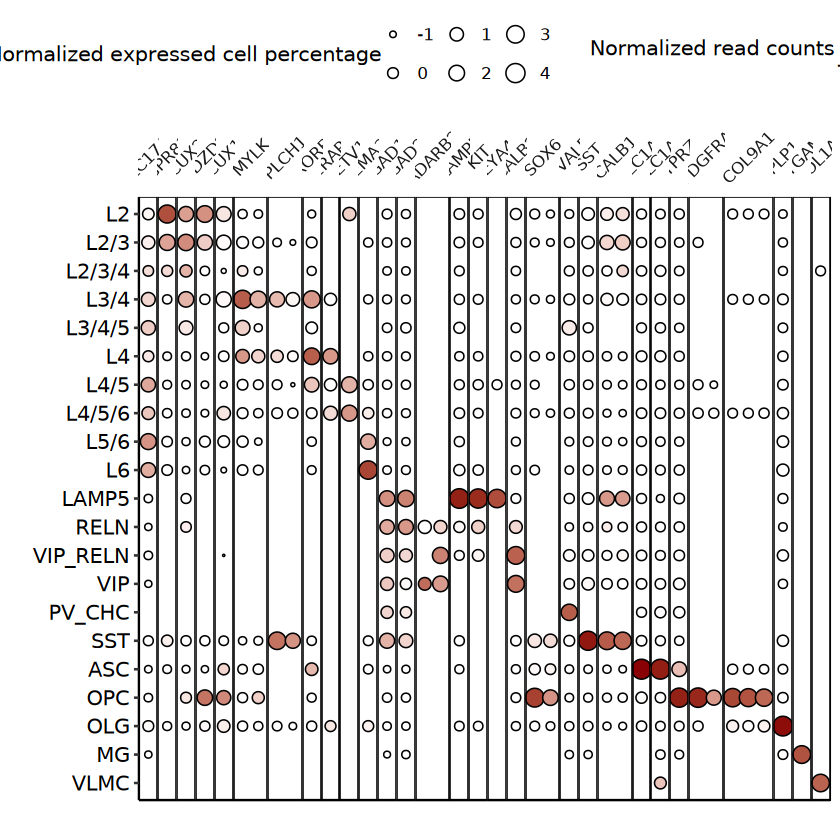

In [18]:
#
pt = ggplot(mkdfi[mkdfi$`readnumt.x` > 10,],aes(x = areatr,y = transcript_id,fill = readnorm,size = cellpnorm)) + geom_point(shape = 21) + theme_pubr() + 
scale_fill_gradient2(low = "white",high = rgb(137,1,4,maxColorValue = 255)) + 
facet_grid(~gene_id,scales = "free",space = "free") + 
#geom_vline(xintercept = vertical.lines,lty="dashed", color = "black", linewidth = 0.5) +
scale_size_continuous(range = c(0.01,5)) +
theme(axis.text.x = element_blank(),axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(angle = 45,vjust = 0.5),
     panel.border = element_rect(fill = NA)) +
coord_flip() + labs(x = "",y = "",fill = "Normalized read counts",size = "Normalized expressed cell percentage")
#vertical.lines = seq(1.5,nrow(objprect)-0.5,1)

pt
ggexport(pt,filename = "result/figure4/subclass_marker_case_plot_24_10_28.pdf",width = 18,height = 5)

## Subclass analysis

### Subclass DTU stat

In [55]:
clusteran = read.csv("result/figure3/sigiso_class_transcript_dr_cluster_heatmap_module_ana_24_09_17.csv")
clusteran = unique(clusteran[,1:3])
head(clusteran)
clusteran$cluster = paste0(clusteran$cluster, " specific")

,gene_id,transcript_id,cluster
,<chr>,<chr>,<chr>
1,ABCC5,XM_005546512.2,NN
4,ACOT8,XM_005569186.2,NN
7,ACSL6,XM_015451371.1,NN
10,ADAM15,XM_005541615.2,GLU
13,AEBP2,XM_005570299.2,NN
16,AFAP1L2,XM_005566488.2,GLU


In [135]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N" & isosigi$sig != "Y",]
write.csv(isosigi,file = "result/figure4/DTU_list_subclass_total_24_09_17.csv",row.names = F, quote = F)
isosigi = isosigi %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) == 1)
write.csv(isosigi,file = "result/figure4/DTU_list_subclass_uique_total_24_09_17.csv",row.names = F, quote = F)

,group,txid,type
,<chr>,<chr>,<chr>
1,Among all,NM_001284010.1,isoform
2,Among all,XM_015430724.1,isoform
3,Among all,NM_001284079.1,isoform
4,Among all,XM_005559881.2,isoform
5,Among all,XM_005546512.2,isoform
6,Among all,XM_005546513.2,isoform


`summarise()` has grouped output by 'type'. You can override using the
`.groups` argument.
file saved to result/figure4/dtu_number_stat_subclass_upset_24_09_17.pdf



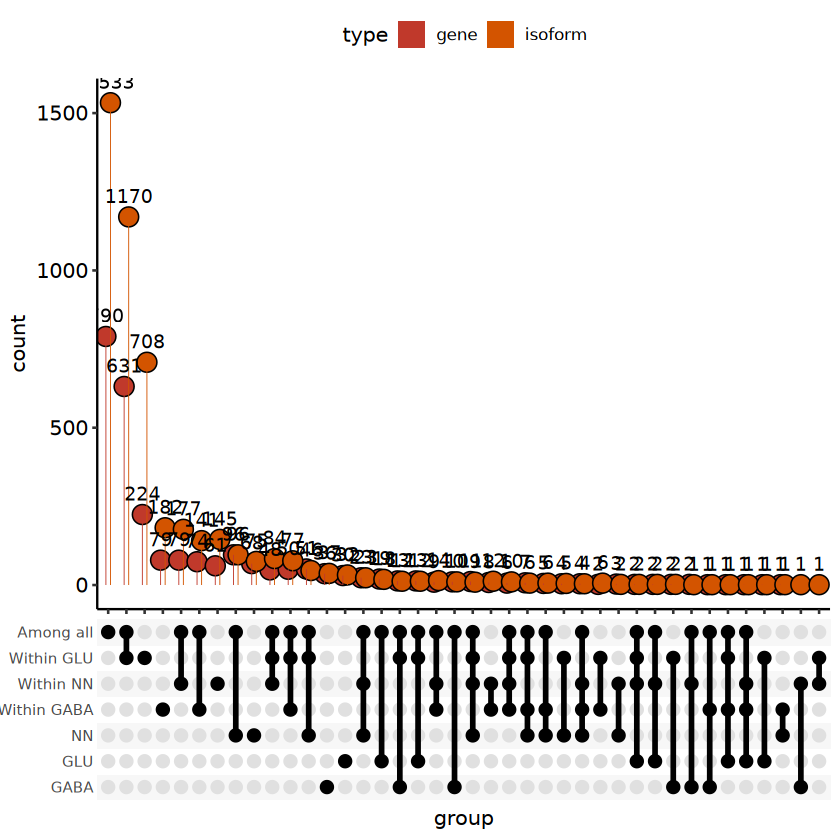

In [51]:
#basic plot
dtustdf = NULL

dtustdfup = isosigls$subclass
dtustdfup = dtustdfup[dtustdfup$sig != "N" & dtustdfup$sig != "Y",c("transcript_id","gene_id")]
dtustdfup = data.frame("group" = "Among all",
                       "txid" = c(unique(dtustdfup$transcript_id),unique(dtustdfup$gene_id)), 
                       "type" = c(rep("isoform",length(unique(dtustdfup$transcript_id))), rep("gene",length(unique(dtustdfup$gene_id)))))

dtustdfup2 = data.frame("group" = c(clusteran$cluster,clusteran$cluster),
                       "txid" = c(clusteran$transcript_id,clusteran$gene_id), 
                       "type" = c(rep("isoform",length(clusteran$transcript_id)), rep("gene",length(clusteran$gene_id))))
dtustdfup = rbind(dtustdfup,dtustdfup2)

isosigls.cl2 = isosigls.cl
#names(isosigls.cl2) = c("Neuron vs NN","GABA vs NN","GLU vs NN","GABA vs GLU","Within GABA","Within GLU","Within NN")
names(isosigls.cl2) = c("Within GABA","Within GLU","Within NN")
for(i in 1:length(isosigls.cl2)){
    tdtui = isosigls.cl2[[i]]
    hubti = unique(tdtui[tdtui$sig != "N" & abs(tdtui$dr) > 0.1,]$transcript_id)
    hubti = hubti[hubti %in% fsraw.cor$transcript_id]
    hubgi = unique(tdtui[tdtui$sig != "N" & abs(tdtui$dr) > 0.1,]$gene_id)
    dtustdf = rbind(dtustdf,data.frame("group" = names(isosigls.cl2)[i],
                                       "count" = c(length(unique(hubti)),length(unique(hubgi))),
                                       "type" = c("isoform","gene")))
    dtustdfup = rbind(dtustdfup,data.frame("group" = names(isosigls.cl2)[i], "txid" = c(hubti,hubgi), 
                                           "type" = c(rep("isoform",length(hubti)), rep("gene",length(hubgi))) ))
}

#dtustdfup = dcast(dtustdfup,txid+type~group,fun.aggregate = length)
head(dtustdfup)
library(ggupset)
#dtustdfup = dtustdfup[,c("txid","type","group")]
#dtustdfup2 = dtustdfup[dtustdfup$group %in% c("Within GLU","Within GABA", "Within NN", "Among all"),] %>%
dtustdfup2 = dtustdfup %>%
  group_by(type,txid) %>%
  summarize(group = list(group))
pisonup1 = ggplot(data = dtustdfup2,aes(x = group,fill = type))+ 
    scale_x_upset() + 
    geom_point(stat = "count",position = position_dodge(0.5),shape = 21,size = 5) + 
    geom_bar(position = position_dodge(0.5),width = 0.1) +
    geom_text(stat = "count",aes(label=after_stat(count)),position = position_dodge(0.5),vjust = -1) + 
    scale_fill_flatui() +
    scale_color_flatui() +
    theme_pubr()
pisonup1
ggexport(pisonup1,filename = "result/figure4/dtu_number_stat_subclass_upset_24_09_17.pdf",width = 7,height = 5)

,group,txid,type
,<chr>,<chr>,<chr>
1,Subclass unique,AACS,gene
2,Subclass unique,AAGAB,gene
3,Subclass unique,ABCC5,gene
4,Subclass unique,ABHD12B,gene
5,Subclass unique,ABHD2,gene
6,Subclass unique,ABLIM1,gene


`summarise()` has grouped output by 'type'. You can override using the
`.groups` argument.
file saved to result/figure4/dtu_number_stat_subclass_upset_gene_24_09_17.pdf



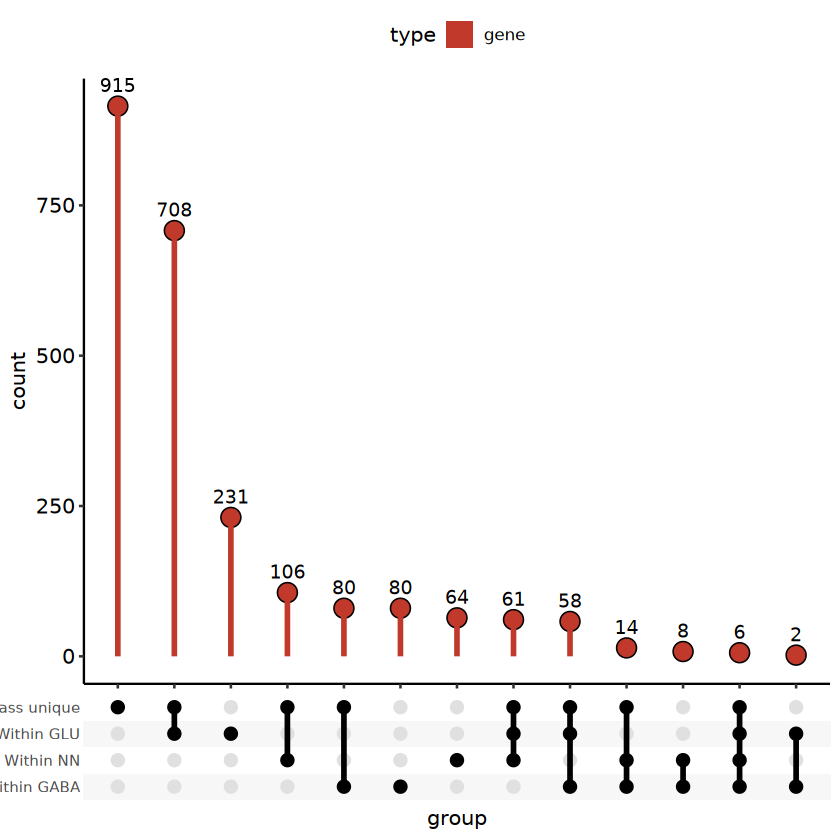

In [181]:
#basic plot
dtustdf = NULL

dtustdfup = isosigls$subclass
dtustdfup = dtustdfup[dtustdfup$sig != "N" & dtustdfup$sig != "Y",c("transcript_id","gene_id","areatr")]
#dtustdfup = dtustdfup %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) == 1)
dtustdfup = data.frame("group" = "Subclass unique",
                       "txid" = c(unique(dtustdfup$gene_id)), 
                       "type" = c(rep("gene",length(unique(dtustdfup$gene_id)))))

# dtustdfup2 = data.frame("group" = c(clusteran$cluster,clusteran$cluster),
#                        "txid" = c(clusteran$gene_id), 
#                        "type" = c( rep("gene",length(clusteran$gene_id))))
# dtustdfup = rbind(dtustdfup,dtustdfup2)

isosigls.cl2 = isosigls.cl
#names(isosigls.cl2) = c("Neuron vs NN","GABA vs NN","GLU vs NN","GABA vs GLU","Within GABA","Within GLU","Within NN")
names(isosigls.cl2) = c("Within GABA","Within GLU","Within NN")
for(i in 1:length(isosigls.cl2)){
    tdtui = isosigls.cl2[[i]]
    hubti = unique(tdtui[tdtui$sig != "N" & abs(tdtui$dr) > 0.1,]$transcript_id)
    hubti = hubti[hubti %in% fsraw.cor$transcript_id]
    hubgi = unique(tdtui[tdtui$sig != "N" & abs(tdtui$dr) > 0.1,]$gene_id)
    dtustdf = rbind(dtustdf,data.frame("group" = names(isosigls.cl2)[i],
                                       "count" = c(length(unique(hubgi))),
                                       "type" = c("gene")))
    dtustdfup = rbind(dtustdfup,data.frame("group" = names(isosigls.cl2)[i], "txid" = c(hubgi), 
                                           "type" = c( rep("gene",length(hubgi))) ))
}

#dtustdfup = dcast(dtustdfup,txid+type~group,fun.aggregate = length)
head(dtustdfup)
library(ggupset)
#dtustdfup = dtustdfup[,c("txid","type","group")]
#dtustdfup2 = dtustdfup[dtustdfup$group %in% c("Within GLU","Within GABA", "Within NN", "Among all"),] %>%
dtustdfup2 = dtustdfup %>%
  group_by(type,txid) %>%
  summarize(group = list(group))
pisonup1 = ggplot(data = dtustdfup2,aes(x = group,fill = type))+ 
    scale_x_upset(n_intersections = 20) + 
    geom_point(stat = "count",position = position_dodge(0.5),shape = 21,size = 5) + 
    geom_bar(position = position_dodge(0.5),width = 0.1) +
    geom_text(stat = "count",aes(label=after_stat(count)),position = position_dodge(0.5),vjust = -1) + 
    scale_fill_flatui() +
    scale_color_flatui() +
    theme_pubr()
pisonup1
ggexport(pisonup1,filename = "result/figure4/dtu_number_stat_subclass_upset_gene_24_09_17.pdf",width = 7,height = 5)

In [103]:
cellst = fsraw.cor %>% group_by(subclass) %>% summarise(readnum = length(unique(readid)))

,areatr,count,group,class,readnum
,<chr>,<int>,<chr>,<chr>,<int>
1,ASC,751,gene,NonNeuron,1139619
2,ASC,1075,isoform,NonNeuron,1139619
3,L2,656,isoform,GLU,1447205
4,L2,491,gene,GLU,1447205
5,L2/3,469,isoform,GLU,3797345
6,L2/3,359,gene,GLU,3797345


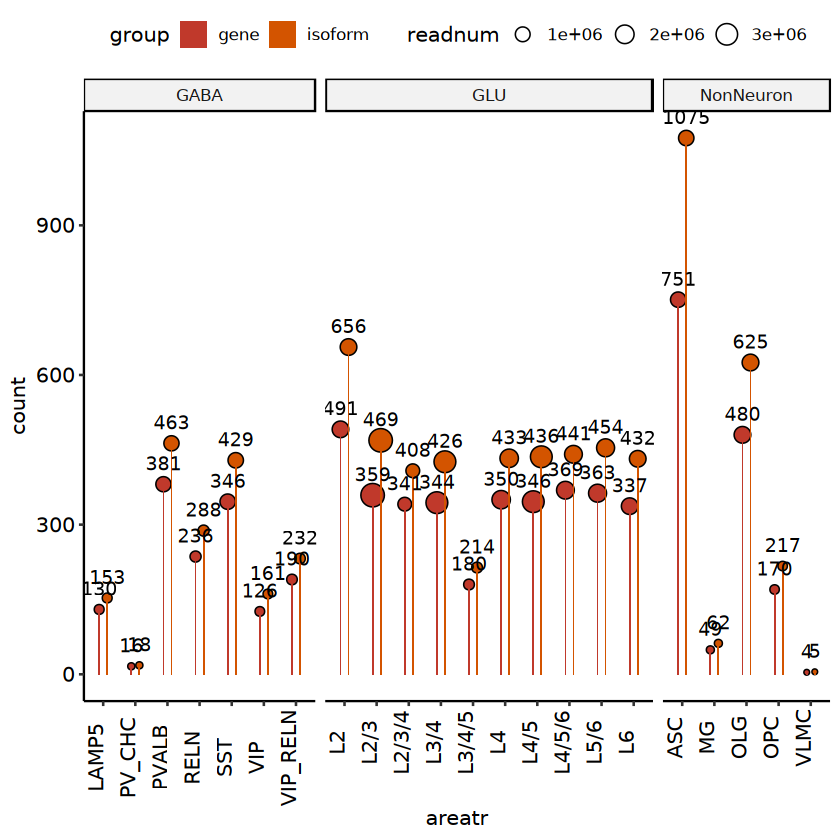

In [179]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N" & isosigi$sig != "Y",]
#isosigi = isosigi %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) == 1)
dtustdfg = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(gene_id)),group = "gene")
dtustdft = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(transcript_id)),group = "isoform")
dtustdf = rbind(dtustdfg,dtustdft)
dtustdf = merge(dtustdf,cellan,by.x ="areatr",by.y = "subclass")
dtustdf = merge(dtustdf,cellst,by.x ="areatr",by.y = "subclass")
head(dtustdf)
pison1 = ggplot(data = dtustdf,aes(x = areatr,y = count,fill = group))+ 
    geom_point(aes(size = readnum),position = position_dodge(0.5),shape = 21) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~class,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_flatui() +
    scale_color_flatui() +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0))
pison1

In [180]:
ggexport(pison1,filename = "result/figure4/dtu_number_stat_subclass_stat_unique_24_09_17.pdf",width = 7,height = 5)

file saved to result/figure4/dtu_number_stat_subclass_stat_unique_24_09_17.pdf



,areatr,count,group,class,readnum
,<chr>,<int>,<chr>,<chr>,<int>
1,L2,158,gene,GLU,1447205
2,L2,187,isoform,GLU,1447205
3,L2/3,68,gene,GLU,3797345
4,L2/3,72,isoform,GLU,3797345
5,L2/3/4,102,isoform,GLU,790631
6,L2/3/4,94,gene,GLU,790631


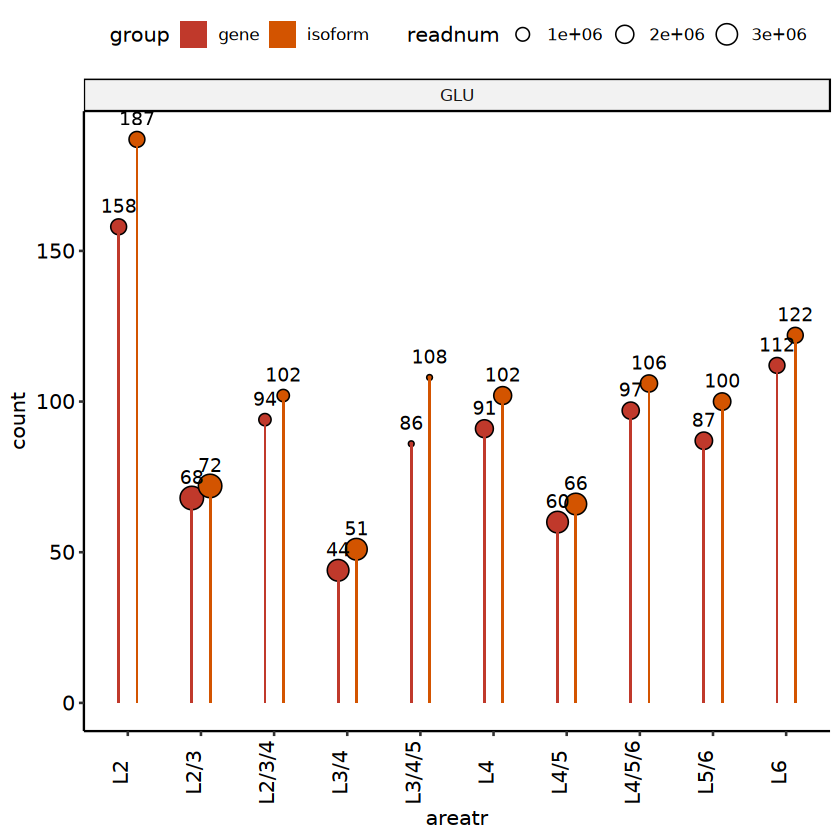

In [115]:
isosigi = isosigls.cl$GLU_GLU
isosigi = isosigi[isosigi$sig != "N" & isosigi$sig != "Y",]
dtustdfg = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(gene_id)),group = "gene")
dtustdft = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(transcript_id)),group = "isoform")
dtustdf = rbind(dtustdfg,dtustdft)
dtustdf = merge(dtustdf,cellan,by.x ="areatr",by.y = "subclass")
dtustdf = merge(dtustdf,cellst,by.x ="areatr",by.y = "subclass")
head(dtustdf)
pison2 = ggplot(data = dtustdf,aes(x = areatr,y = count,fill = group))+ 
    geom_point(aes(size = readnum),position = position_dodge(0.5),shape = 21) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~class,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_flatui() +
    scale_color_flatui() +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0))
pison2

### Subclass DTU Clone analysis

In [66]:
subclassan = data.frame("subclass" = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC','PVALB','SST','ASC','OLG','OPC','MG','EC','VLMC'),
                      "class" = c('sGLU','sGLU','sGLU','sGLU','sGLU',
                                  'dGLU','dGLU','dGLU','dGLU','dGLU',
                                  'GABA','GABA','GABA','GABA','GABA','GABA',"GABA",
                                 'NN-ASC','NN-OLG','NN','NN','NN','NN'))
transm = transtls$layer
transm = transm %>% group_by(transcript_id) %>% summarise(meanrelative = sum(count)/sum(genecount))

In [90]:
transt = transtls$subclass
transt = transt[!is.na(transt$areatr),]
transt = transt[transt$areatr != "",]
transt$relative = transt$count/transt$genecount

transtf = transt[transt$count > 10,]
isosigt = merge(transtf,transm,by = "transcript_id")
isosigt$dr = isosigt$relative - isosigt$meanrelative
#isosigt$dr = isosigt$relative - isosigt$otherrelative

In [28]:
#GLU clone cluster
library(ComplexHeatmap)

DTUCloneCluster = function(isosigi,n){
    hubtrans = unique(isosigi[isosigi$sig != "N" & isosigi$sig != "Y",]$transcript_id)
    isosigf2 = isosigi[isosigi$transcript_id %in% hubtrans,]
    isosigf2$dr2 = isosigf2$relative - isosigf2$meanrelative
    print(length(unique(isosigf2$transcript_id)))
    #isosigf2 = isosigc[isosigc$transcript_id %in% isosigf2$transcript_id,]
    isosigf2 = isosigf2 %>% group_by(transcript_id) %>% filter(max(abs(dr2)) > 0.1)
    isosigf2 = isosigf2 %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
    #length(unique(isosigf2$transcript_id))
    print(length(unique(isosigf2$gene_id)))
    isosigf.mx1 = dcast(isosigf2,transcript_id~areatr,value.var = "dr2",fun.aggregate = sum)
    rownames(isosigf.mx1) = isosigf.mx1$transcript_id;isosigf.mx1 = isosigf.mx1[-1]
    
    fit = kmeans(isosigf.mx1,n)
    split <- factor(as.character(fit$cluster), levels=as.character(c(1:n)))
  #  splitc = subclassan[match(colnames(isosigf.mx1),subclassan$subclass),]$class
  #  splitc <- factor(splitc, levels=c("sGLU","dGLU","GABA","NN-ASC","NN-OLG","NN"))
    library(circlize)
    col_fun = colorRamp2(c(-0.4, 0, 0.4), hcl_palette = "RdBu",reverse = T)
    isosigf.mx1 = as.matrix(isosigf.mx1)
    pcloneht1 = Heatmap(isosigf.mx1,show_row_names = F,row_split = split,name = "delta Isoform\n ratio",col = col_fun)
    return(pcloneht1)
}

[1] 2740

[1] 2595
[1] 1859


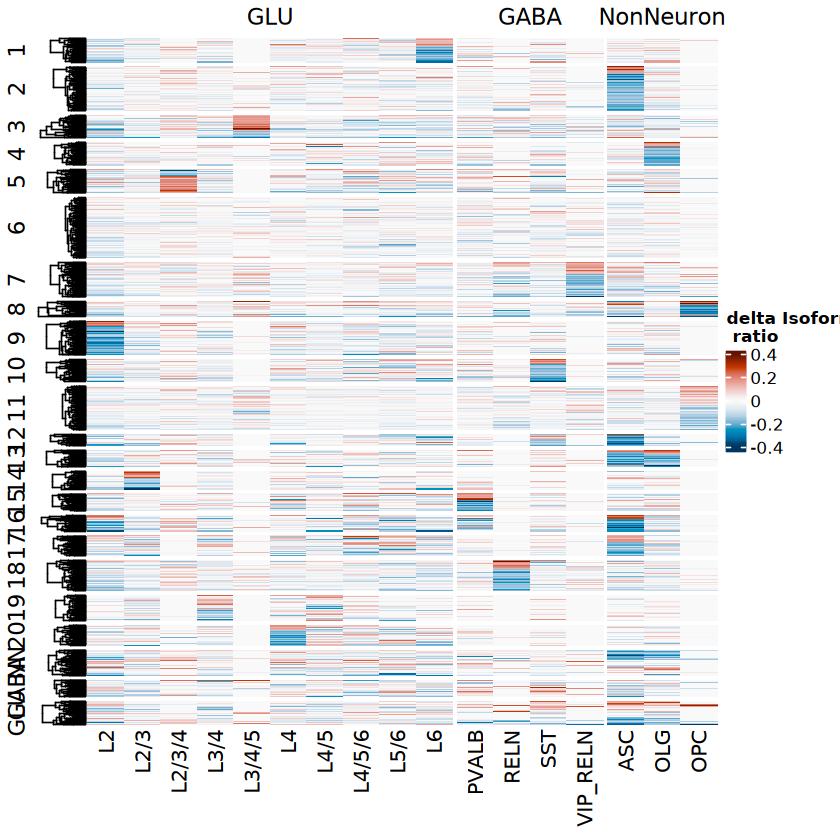

In [81]:

dtumkdf.hub = qread("result/figure3/class_DTU_by_subclass_ttest_24_11_05.qs")
dtumkdf.hub[dtumkdf.hub$cluster == "NonNeuron",]$cluster = "NN"
isosig4 = isosigls$subclass;hubtrans4 = unique(isosig4[isosig4$sig != "N" & isosig4$count > 20,]$transcript_id)
hubtrans6 = unique(dtumkdf.hub$transcript_id)
hubtrans7 = unique(isosigi2[isosigi2$sig != "N",]$transcript_id)
#hubtrans = c(hubtrans1,hubtrans2,hubtrans3,hubtrans4,hubtrans5)
hubtrans = c(hubtrans4,hubtrans6)
#hubtrans = c(hubtrans6)
length(hubtrans)
#isosighub = isosighub %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) == 1)
#isosighub = isosighub[isosighub$areatr %in% c("L2","ASC","OLG"),]
isosigi = isosigt[isosigt$transcript_id %in% hubtrans,]
isosigi = isosigi[!isosigi$areatr %in% c("MG","PV_CHC","VLMC","VIP","LAMP5") & isosigi$count > 10,]
isosigi$sig = "sig"

#isosigi$dr2 = isosigi$relative - isosigi$meanrelative
print(length(unique(isosigi$transcript_id)))
#isosigi = isosigi %>% group_by(transcript_id) %>% filter(max(abs(dr)) > 0.1)
#isosigi = isosigi %>% group_by(transcript_id) %>% filter(count[which.max(abs(dr))] > 20)
isosigi = isosigi %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
#isosigi = isosigi[isosigi$count > 10,]
print(length(unique(isosigi$gene_id)))
isosigf.mx1 = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx1) = isosigf.mx1$transcript_id;isosigf.mx1 = isosigf.mx1[-1]

n = 20
fit = kmeans(abs(isosigf.mx1),n)
fitcl = fit$cluster
fitcl[names(fitcl) %in% dtumkdf.hub$transcript_id] = 
    dtumkdf.hub[match(names(fitcl[names(fitcl) %in% dtumkdf.hub$transcript_id]),
                      dtumkdf.hub$transcript_id),]$cluster
# netinfo.iso$transcript_id = substr(netinfo.iso$trans_id,
#                                    nchar(netinfo.iso$gene_id)+2,
#                                    nchar(netinfo.iso$trans_id))
# fitcl[names(fitcl) %in% netinfo.iso$transcript_id] = 
#     netinfo.iso[match(names(fitcl[names(fitcl) %in% netinfo.iso$transcript_id]),
#                       netinfo.iso$transcript_id),]$moduleColor

levelid = c(as.character(1:20),"NN","GABA","GLU")
levelid = levelid[levelid %in% as.character(fitcl)]
split <- factor(as.character(fitcl),levels = levelid)
splitc = cellan[match(colnames(isosigf.mx1),cellan$subclass),]$class
splitc <- factor(splitc, levels=c("GLU","GABA","NonNeuron"))
names(split) = names(fitcl)
names(splitc) = names(colnames(isosigf.mx1))
library(circlize)
col_fun = colorRamp2(c(-0.4, 0, 0.4), hcl_palette = "RdBu",reverse = T)
isosigf.mx1 = as.matrix(isosigf.mx1) 
pcloneht.total = Heatmap(isosigf.mx1,show_row_names = F,row_split = split, 
                         cluster_row_slices = FALSE,
                         cluster_columns = FALSE,
                         column_split = splitc,name = "delta Isoform\n ratio",col = col_fun)
#pcloneht.total = DTUCloneCluster(isosigi,10)
pcloneht.total

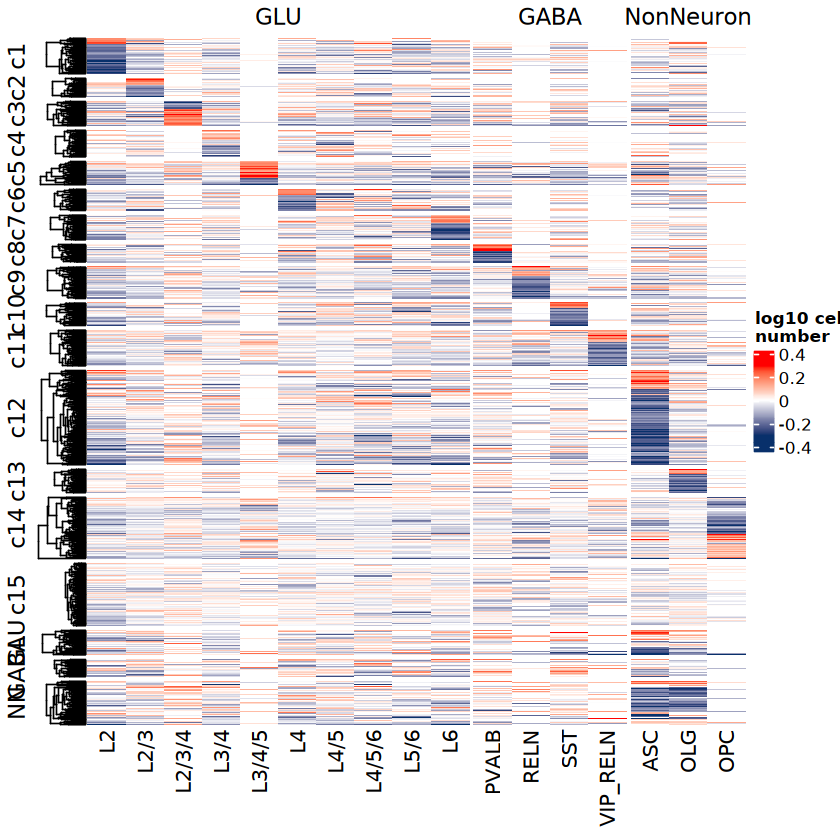

In [87]:
clist = list("c1" = c(9),"c2" = c(14),"c3" = c(5),
            "c4" = c(19),"c5" = c(3),"c6" = c(20),
             "c7" = c(1),"c8"=c(15),"c9" = c(18),
             "c10" = c(10),"c11" = c(7),"c12" = c(2,12,16,17),
             "c13" = c(4),"c14" = c(8,11),"c15" = c(6),
             "GLU" = "GLU","GABA" = "GABA","NN" = c("NN","13")
            )

MergeCluster = function(htls,clist){
  #merge cluster
  split = as.character(htls$rowcluster)
  for (i in 1:length(clist)) {
    split[which(as.character(split) %in% as.character(clist[[i]]))] = names(clist)[i]
  }
  # 
  split = factor(as.character(split), levels = names(clist))
  names(split) = names(htls$rowcluster)
  reorder.hmap = Heatmap(htls$ht@matrix, 
                         name = "delta Isoform\n ratio",
                         row_split = split,
                         column_split = htls$colcluster,
                         # cluster_rows = F,
                         cluster_columns = F,
                         cluster_row_slices = FALSE,
                         cluster_column_slices = FALSE,
                         show_row_names = F,
                         col = colorRamp2(c(-0.3,0,0.3), 
                                          c("#08306B", "white", "red")),
                         column_order = htls$colorder
  )
  reorder.hmap
  htls$rowcluster = split
  htls$ht = reorder.hmap
  return(htls)
}
htls = list(rowcluster = split,ht = pcloneht.total,colcluster = splitc)

htls_od = MergeCluster(htls,clist)
htls_od$ht

In [91]:
#pcloneht.total
ggexport(htls_od$ht,filename = "result/figure4/DTU_clone_cluster_total_24_11_05.pdf",width = 5,height = 7)

file saved to result/figure4/DTU_clone_cluster_total_24_11_05.pdf



In [219]:
head(dtumkdf.hub)

,gene_id,transcript_id,pvalue,dr,cluster,qvalue
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>
16,ABCC5,XM_005546512.2,0.001969214,0.1571313,GLU,1
182,ANAPC4,XM_005554612.2,0.014178056,0.1214028,GLU,1
248,APBB3,XM_005557979.2,0.048700128,-0.1000114,GLU,1
286,ARFIP2,XM_005578789.2,0.000655739,-0.1232940,GLU,1
350,ARVCF,XM_005567964.2,0.017739128,-0.1075129,GLU,1
357,ASH2L,XM_005563066.2,0.000149255,-0.1061145,GLU,1


In [230]:
library(ComplexHeatmap)
isosigc = isosigls$class
isosigc$dr2 = isosigc$relative - isosigc$meanrelative
isosigf2 = isosigc[isosigc$transcript_id %in% c(dtumkdf.hub$transcript_id),]
isosigf2 = isosigf2 %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isosigf.mx1 = dcast(isosigf2,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigf.mx1) = isosigf.mx1$transcript_id;isosigf.mx1 = isosigf.mx1[-1]

split = rownames(isosigf.mx1)
names(split) = rownames(isosigf.mx1)
split = dtumkdf.hub[match(names(split),dtumkdf.hub$transcript_id),]$cluster
#splitc = c(4,1,1,1,2,2,2,2,2,2,2,3,5,3,3,3,3,3)
#splitc <- factor(splitc, levels=as.character(c(1:m)))
#reorder.hmap <- Heatmap(as.matrix(cellmxfn), split=split, cluster_row_slices = FALSE,
#                          show_row_names = F,column_order = cellorder)
#reorder.hmap
library(circlize)
col_fun = colorRamp2(c(-0.3, 0, 0.3), c("#08306B", "white", "red"))
isosigf.mx1 = as.matrix(isosigf.mx1)
isosigf.mx1 = isosigf.mx1[,c("GLU","GABA","NonNeuron")]
pcloneht1 = Heatmap(isosigf.mx1,show_row_names = F,row_split = split,border = TRUE,cluster_columns = F,
                    name = "delta Isoform\n ratio",col = col_fun)
pcloneht1

In [232]:
colnames(isosigf.mx1)

[1] "GABA"      "GLU"       "NonNeuron"

file saved to result/figure4/DTU_clone_cluster_inclass_24_11_05.pdf



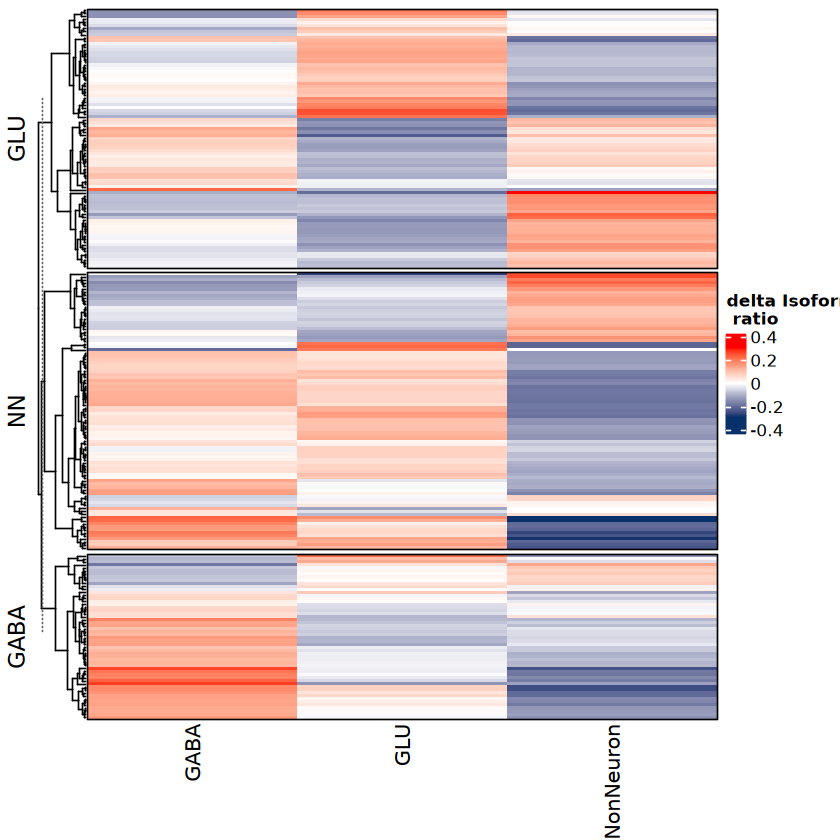

In [231]:
ggexport(pcloneht1,filename = "result/figure4/DTU_clone_cluster_inclass_24_11_05.pdf",width = 3,height = 4.5)
pcloneht1

,transcript_id,areatr,gene_id
,<chr>,<fct>,<chr>
35,DDRGK1-WeiLab-1,c5,DDRGK1


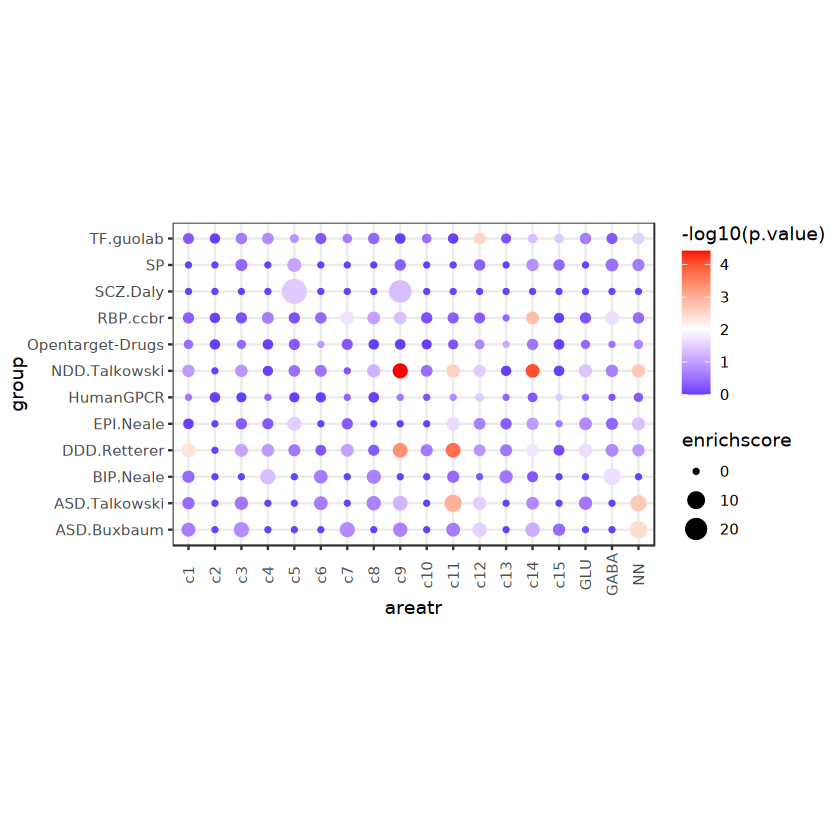

In [88]:
FishEnrich = function(geneset,funcset,total_genen){
    drugovl = intersect(unique(funcset),geneset)
    geneset_size <- length(geneset)    # 感兴趣的基因集大小
    functional_category_size <- length(unique(funcset))  # 特定功能类别中的基因总数
    both <- length(drugovl)  # 两个集合都包含的基因数量
    total_genes <- 20000  # 整个基因组中的基因总数

    contingency_table <- matrix(c(both, geneset_size - both, 
                              functional_category_size - both, 
                              total_genes - (geneset_size + functional_category_size - both)), 
                            nrow = 2)

    # 进行Fisher精确检验
    fisher_test_result <- fisher.test(contingency_table)
    # 输出p值
    p_value <- fisher_test_result$p.value

    # 计算富集分数（Enrichment Ratio），这通常是感兴趣的基因集中具有特定功能的基因比例与整个基因组中该功能基因比例的比值
    enrichment_ratio <- (both / geneset_size) / (functional_category_size / total_genes)
    res = data.frame("p.value" = p_value,"enrichscore" = enrichment_ratio,"overlap_size" = both,
                     "term_size" = functional_category_size,"query_size" = geneset_size,
                    "overlap_ratio" = both/functional_category_size)
    return(res)
}

subcldf = data.frame(transcript_id = names(htls_od$rowcluster),areatr = htls_od$rowcluster)
subcldf = merge(subcldf,unique(isosigi[,c("gene_id","transcript_id")]),by = "transcript_id")
subcldf[subcldf$gene_id == "DDRGK1",]
areatrs = unique(subcldf$areatr)
goana = NULL
sourceid = unique(refgdf$source)
for(i in 1:length(areatrs)){
    isosigii = subcldf[subcldf$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    for(j in 1:length(sourceid)){
        refgene = unique(refgdf[refgdf$source == sourceid[j],]$gene_id)
        goanai = FishEnrich(hubgene,refgene,20000)
        goanai$group = sourceid[j]
        goanai$areatr = areatrs[i]
        goana = rbind(goana,goanai)
    }
}
ph = ggplot(goana,aes(x = areatr,y = group, color = -log10(p.value),size = enrichscore)) + geom_point() + theme_bw() + 
theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = 2) + coord_fixed()
ph

[1] 579  22

[1] 579  22

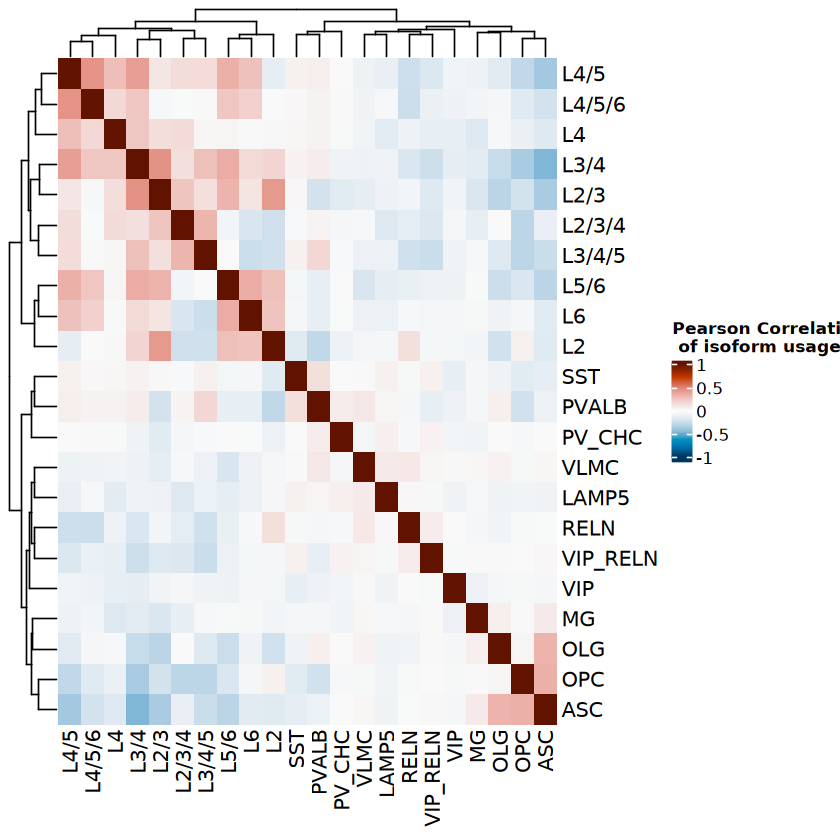

In [44]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
#isosigi = isosigt
#isosigf = isosigi[isosigi$sig != "N",]
#isosigf = isosigf %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) == 1)
#isosigf = isosigi[isosigi$transcript_id %in% isosigf$transcript_id,]
#isosigf$dr2 = isosigf$relative - isosigf$meanrelative
#isosigf1 = isosigf1[!isosigf1$areatr %in% c("EC"),]
isosigi = isosigi %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) > 17)
isosig.mx = dcast(isosigi,transcript_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosig.mx) = isosig.mx$transcript_id;isosig.mx = isosig.mx[-1]
dim(isosig.mx)
#isosig.mx = isosig.mx[,colSums(isosig.mx > 0) > 100]
dim(isosig.mx)
isosig.st = cor(isosig.mx,method = "pearson")
#isosig.st
library(circlize)
library(ComplexHeatmap)
splitc = colnames(isosig.st)
names(splitc) = colnames(isosig.st)
splitc = cellan[match(names(splitc),cellan$subclass),]$class
col_fun = colorRamp2(c(-1, 0, 1), hcl_palette = "RdBu",reverse = T)
pcorht = Heatmap(isosig.st,name = "Pearson Correlation\n of isoform usage",col = col_fun)
                 #column_split = splitc,row_split = splitc)
pcorht

In [ ]:
pcorht
ggexport(pcorht,filename = "result/figure3/DTU_clone_cluster_cor_between_class_total_24_12_09.pdf",width = 6.3,height = 5)

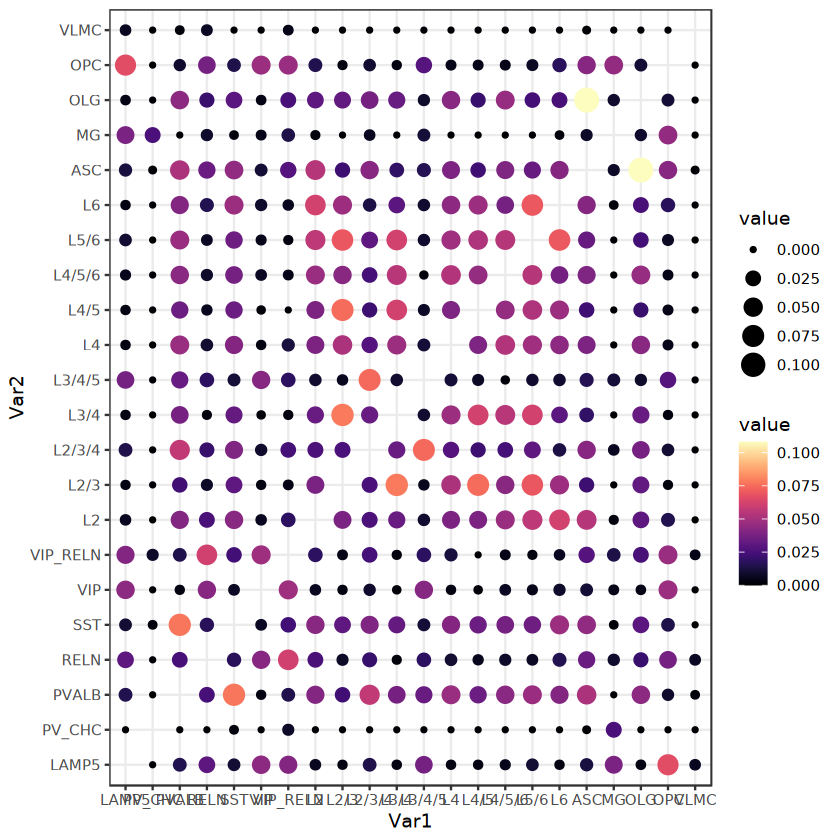

In [151]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
#isosigi = isosigt[isosigt$transcript_id %in% hubtrans,]
areatrs = unique(isosigi$areatr)
argenels = list()
for(i in 1:length(areatrs)){
    isosigi.ari = isosigi[isosigi$areatr == areatrs[i],]
    argenels[[i]] = unique(paste0(isosigi.ari$transcript_id,"-",isosigi.ari$sig))
    names(argenels)[i] = areatrs[i]
}
MyJaccard = function(genels1,genels2){
    calculate_jaccard <- function(list1, list2) {
      intersection <- length(intersect(list1, list2))
      union <- length(union(list1, list2))
      jaccard_score <- intersection / union
      return(jaccard_score)
    }
    num_groups1 = length(genels1)
    num_groups2 = length(genels2)
    jaccard_matrix <- matrix(0, nrow = num_groups1, ncol = num_groups2)
    
    for (i in 1:num_groups1) {
      for (j in 1:num_groups2) {
        jaccard_matrix[i, j] <- calculate_jaccard(genels1[[i]], genels2[[j]])
      }
    }
    rownames(jaccard_matrix) <- names(genels1)
    colnames(jaccard_matrix) <- names(genels2)
    return(jaccard_matrix)
}
jcmx = MyJaccard(argenels,argenels)
jcmxdf = melt(jcmx)
jcmxdf = jcmxdf[jcmxdf$Var1 != jcmxdf$Var2,]
cellan = cellan[order(cellan$class,cellan$subclass),]
jcmxdf$Var1 = factor(jcmxdf$Var1,levels = cellan$subclass)
jcmxdf$Var2 = factor(jcmxdf$Var2,levels = cellan$subclass)
ggplot(jcmxdf,aes(x = Var1,y = Var2)) + geom_point(aes(size = value,color = value)) + 
scale_color_viridis(option = "A") + theme_bw()

In [175]:
col_fun = colorRamp2(c(0,0.05, 0.15), hcl_palette = "RdBu",reverse = T)
test = Heatmap(jcmx,col = col_fun)
test

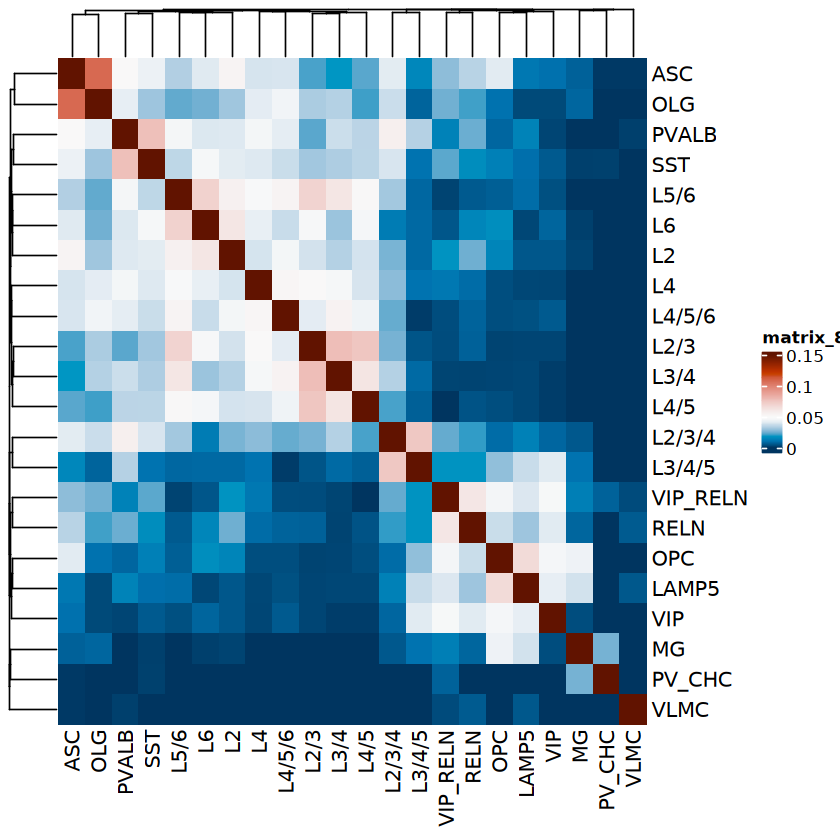

In [176]:
test

Warning message:
"Returning more (or less) than 1 row per `summarise()` group was deprecated in
dplyr 1.1.0.
ℹ Please use `reframe()` instead.
ℹ When switching from `summarise()` to `reframe()`, remember that `reframe()`
  always returns an ungrouped data frame and adjust accordingly."
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'txid'. You can override using the
`.groups` argument.
Warning message:
"Removed 1070 rows containing non-finite outside the scale range
(`stat_count()`)."
Warning message:
"Removed 1070 rows containing non-finite outside the scale range
(`stat_count()`)."
Warning message:
"Removed 1070 rows containing non-finite outside the scale range
(`stat_count()`)."


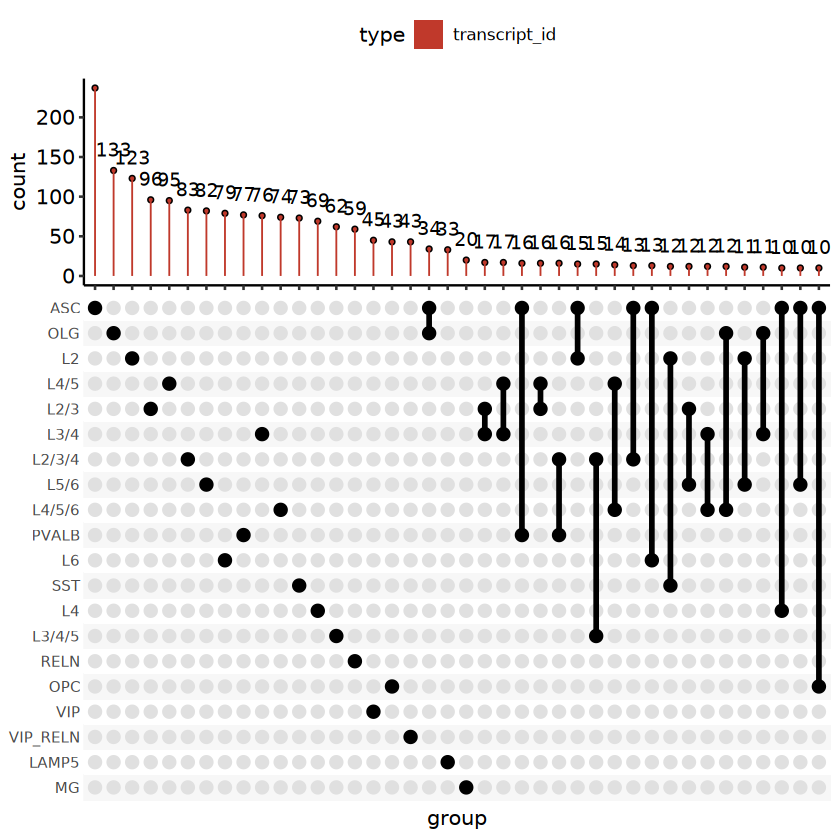

In [129]:
library(ggupset)
dtustdf = NULL

dtustdfup = isosigls$subclass
dtustdfup = dtustdfup[dtustdfup$sig == "Up",c("areatr","transcript_id","gene_id")]
dtustdfup = dtustdfup %>% group_by(areatr) %>% summarize(txid = unique(transcript_id),
                                                         type = rep("transcript_id",length(unique(transcript_id))))

dtustdfup = dtustdfup %>%
  group_by(txid,type) %>%
  summarize(group = list(areatr))
pisonup1 = ggplot(data = dtustdfup,aes(x = group,fill = type))+ 
    scale_x_upset(n_intersections = 40) +  
    geom_point(stat = "count",shape = 21,size = 1) + 
    geom_bar(width = 0.1,size = 0.1) +
    geom_text(stat = "count",aes(label=after_stat(count)),
              position = position_dodge(0.5),vjust = -1) + 
    scale_fill_flatui() +
    scale_color_flatui() +
    theme_pubr()
pisonup1

,areatr,count,group,class
,<fct>,<int>,<chr>,<chr>
1,ASC,751,gene,NonNeuron
2,L2,491,gene,GLU
3,L2/3,359,gene,GLU
4,L2/3/4,341,gene,GLU
5,L3/4,344,gene,GLU
6,L3/4/5,180,gene,GLU


file saved to result/figure4/dtu_number_stat_subclass_stat_total_24_11_05.pdf



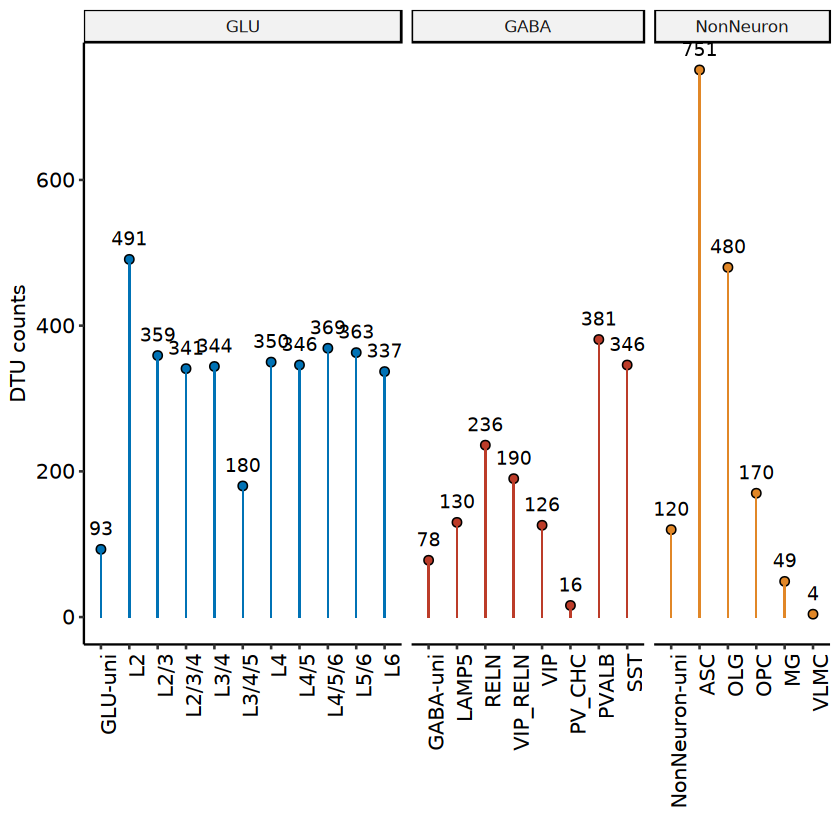

In [239]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
#isosigi = isosigi %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) == 1)
dtustdfg = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(gene_id)),group = "gene")
dtustdfg.cl = dtumkdf.hub %>% group_by(cluster) %>% summarise(count = length(unique(gene_id)),group = "gene")
dtustdfg.cl[dtustdfg.cl$cluster == "NN",]$cluster = "NonNeuron"
colnames(dtustdfg.cl)[1] = "areatr"
dtustdfg.cl$class = dtustdfg.cl$areatr
dtustdfg.cl$areatr = paste0(dtustdfg.cl$areatr,"-uni")
dtustdfg = merge(dtustdfg,cellan,by.x ="areatr",by.y = "subclass")
dtustdf = rbind(dtustdfg,dtustdfg.cl)
dtustdf$areatr = factor(dtustdf$areatr,levels = c("GLU-uni","GABA-uni","NonNeuron-uni",suborder))
#dtustdft = isosigi %>% group_by(areatr) %>% summarise(count = length(unique(transcript_id)),group = "isoform")
#dtustdf = rbind(dtustdfg,dtustdft)
#dtustdf = merge(dtustdf,cellan,by.x ="areatr",by.y = "subclass")
#dtustdf = merge(dtustdf,cellst,by.x ="areatr",by.y = "subclass")
head(dtustdf)
dtustdf$classid = dtustdf$class
dtustdf$classid = factor(dtustdf$classid,levels = c("GLU","GABA","NonNeuron"))
pison1 = ggplot(data = dtustdf,aes(x = areatr,y = count,fill = class))+ 
    geom_point(position = position_dodge(0.5),shape = 21,size = 2) + 
    geom_bar(position = position_dodge(0.5),stat = "identity",width = 0.05) +
    facet_grid(~classid,space = "free",scale = "free") +
    geom_text(position = position_dodge(0.5),aes(label=count),vjust = -1) + 
    scale_fill_nejm() +
    scale_color_nejm() +
    theme_pubr() + theme(axis.text.x = element_text(angle = 90,hjust = 1),legend.position = "none") + 
xlab("") + ylab("DTU counts")
pison1
ggexport(pison1,filename = "result/figure4/dtu_number_stat_subclass_stat_total_24_11_05.pdf",width = 5,height = 3)

file saved to result/figure4/dtu_ratio_stat_step_subclass_stat_total_24_11_05.pdf



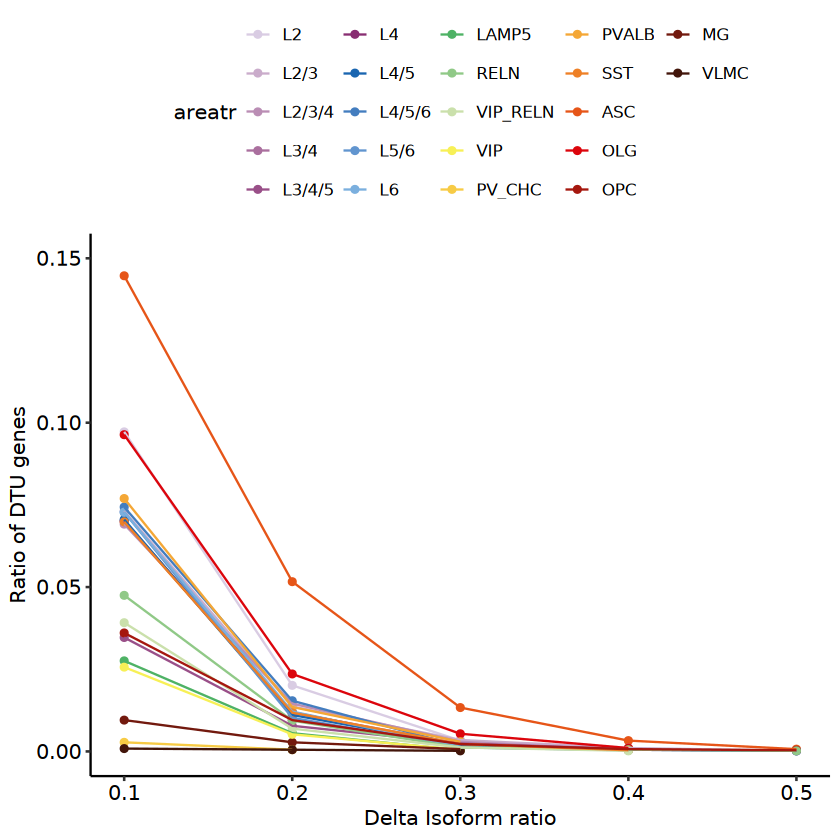

In [344]:
thred = c(0.1,0.2,0.3,0.4,0.5)
QutileDTUst = function(isosigi,thred){
    isostdf = NULL
    genenum = length(unique(isosigi$gene_id))
    for(i in thred){
        genesign = isosigi[abs(isosigi$dr) > i & isosigi$padj < 0.05,]
        isostdfi = genesign %>% group_by(areatr) %>% summarise(sign = length(unique(gene_id)))
        isostdfi$thred = i
        isostdf = rbind(isostdf,isostdfi)
    }
    isostdf$total = genenum
    isostdf$ratio = isostdf$sign/isostdf$total
    return(isostdf)
}
isostdf = QutileDTUst(isosigls$subclass,thred)

isostdf$areatr = factor(isostdf$areatr,levels = suborder)
p2.1 = ggplot(isostdf,aes(x = thred,y = ratio,color = areatr,group = areatr)) + geom_point() + geom_line() +
scale_y_continuous(limits = c(0,0.15)) + scale_color_discreterainbow() + theme_pubr() +
xlab("Delta Isoform ratio") + ylab("Ratio of DTU genes")
p2.1
ggexport(p2.1,filename = "result/figure4/dtu_ratio_stat_step_subclass_stat_total_24_11_05.pdf",width = 5,height = 5)

In [345]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
isosigi[isosigi$areatr %in% cellan[cellan$class == "GLU",]$subclass,]$areatr = "GLU"
isosigi[isosigi$areatr %in% cellan[cellan$class == "GABA",]$subclass,]$areatr = "GABA"
isosigi[isosigi$areatr %in% cellan[cellan$class == "NonNeuron",]$subclass,]$areatr = "NonNeuron"
isosigi = unique(isosigi[,c("transcript_id","sig","areatr")])
test = isosigi %>% group_by(transcript_id,sig) %>% summarise(arean = paste0(areatr[order(areatr)],collapse = "_"))
test = test  %>% group_by(transcript_id) %>% summarise(arean = paste0(arean[order(arean)],collapse = "-"))
# test[test$arean %in% c("GLU-GLU"),]$arean = "Within GLU"
# test[test$arean %in% c("NonNeuron-NonNeuron"),]$arean = "Within NN"
# test[test$arean %in% c("GABA-GABA"),]$arean = "Within GABA"
# test[!test$arean %in% c("Within GABA","Within GLU","Within NN",
#                          "GLU","GABA","NonNeuron"),]$arean = "other"

sigst = table(test$arean)
sigst[order(-sigst)]
sigst = as.data.frame(sigst)

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.



                                  GLU                             NonNeuron 
                                  819                                   504 
                                 GABA                               GLU-GLU 
                                  347                                   225 
                        GLU-NonNeuron                     GLU-GLU_NonNeuron 
                                  207                                   185 
                         GABA_GLU-GLU                    GABA_NonNeuron-GLU 
                                  134                                   112 
                             GABA-GLU                         GLU_NonNeuron 
                                  110                                   104 
               GABA_GLU-GLU_NonNeuron                              GABA_GLU 
                                  100                                    97 
                       GABA_NonNeuron                        GABA-NonNeuron

file saved to result/figure4/dtu_categary_stat_step_subclass_stat_total_24_11_05.pdf



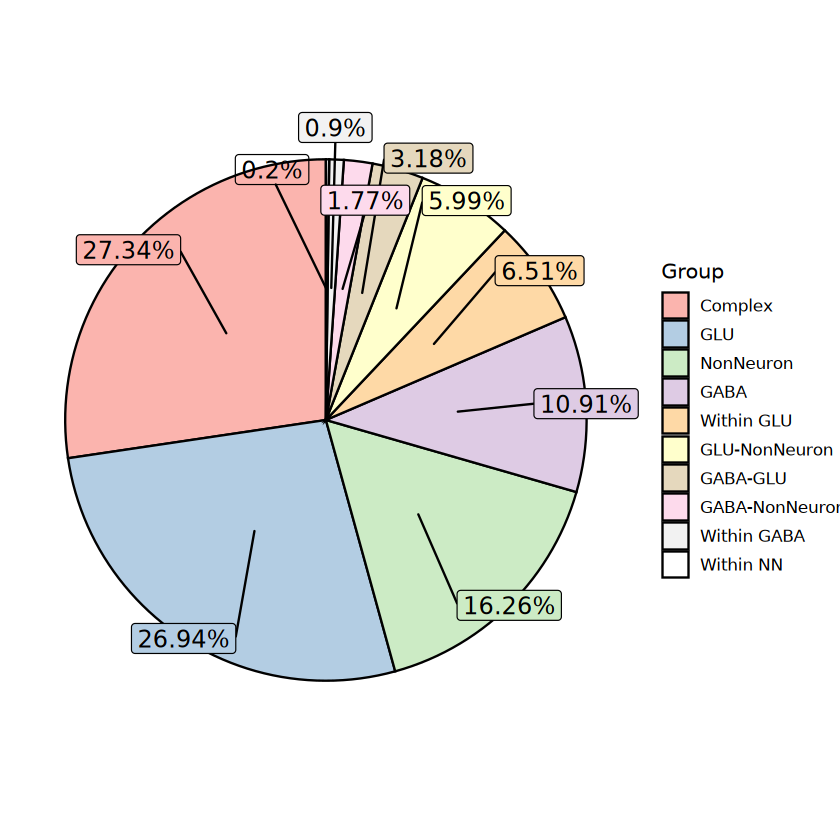

In [351]:
sigst$Var1 = as.character(sigst$Var1)
sigst[sigst$Var1 %in% c("GABA_NonNeuron-GLU","GLU-GABA_NonNeuron"),]$Var1 = "GLU"
sigst[sigst$Var1 %in% c("GABA_GLU-NonNeuron","NonNeuron-GABA_GLU"),]$Var1 = "NonNeuron"
sigst[sigst$Var1 %in% c("GABA-GLU_NonNeuron","GLU_NonNeuron-GABA"),]$Var1 = "GABA"
sigst[sigst$Var1 %in% c("GABA-GLU","GLU-GABA"),]$Var1 = "GABA-GLU"
sigst[sigst$Var1 %in% c("GABA-NonNeuron","NonNeuron-GABA"),]$Var1 = "GABA-NonNeuron"
sigst[sigst$Var1 %in% c("GLU-NonNeuron","NonNeuron-GLU"),]$Var1 = "GLU-NonNeuron"
sigst[sigst$Var1 %in% c("GLU-GLU"),]$Var1 = "Within GLU"
sigst[sigst$Var1 %in% c("NonNeuron-NonNeuron"),]$Var1 = "Within NN"
sigst[sigst$Var1 %in% c("GABA-GABA"),]$Var1 = "Within GABA"
sigst[!sigst$Var1 %in% c("Within GABA","Within GLU","Within NN",
                         "GLU","GABA","NonNeuron",
                         "GLU-NonNeuron","GABA-GLU","GABA-NonNeuron"
                        ),]$Var1 = "Complex"
sigst = sigst %>% group_by(Var1) %>% summarise(Freq = sum(Freq))
sigst = sigst[order(-sigst$Freq),]
sigst$Var1 = factor(sigst$Var1,levels = unique(sigst$Var1))
sigst$prop = sigst$Freq / sum(sigst$Freq)
sigst$label = paste0(as.character(round(sigst$prop*100,2)),"%")
# sigst$ymax <- cumsum(sigst$prop)
# sigst$ymin <- c(0, head(sigst$ymax, n=-1))
# sigst$labelPosition <- (sigst$ymax + sigst$ymin) / 2
#sigst$label <- paste0(sigst$Var1, "\n", sigst$label)

library(ggrepel)
library(tidyverse)

# Get the positions
sigst <- sigst %>% 
  mutate(csum = rev(cumsum(rev(prop))), 
         pos = prop/2 + lead(csum, 1),
         pos = if_else(is.na(pos), prop/2, pos))

p2.2 = ggplot(sigst, aes(x = "" , y = prop, fill = fct_inorder(Var1))) +
  geom_col(width = 1, color = 1) +
  coord_polar(theta = "y") +
  scale_fill_brewer(palette = "Pastel1") +
  geom_label_repel(data = sigst,
                   aes(y = pos, label = label),
                   size = 5, nudge_x = 0.5, show.legend = FALSE) +
  guides(fill = guide_legend(title = "Group")) +
  theme_void()
p2.2 
ggexport(p2.2,filename = "result/figure4/dtu_categary_stat_step_subclass_stat_total_24_11_05.pdf",width = 5,height = 5)
# sigst[1:15,]
# sum(sigst$prop[1:15])
# isosigi = isosigls$subclass
# isosigi = isosigi[isosigi$sig != "N",]
# test = isosigi[isosigi$transcript_id %in% test[!test$arean %in% c("GLU-GLU","GABA-GABA"),]$transcript_id,] %>% 
#     group_by(transcript_id,sig) %>% summarise(arean = paste0(areatr[order(areatr)],collapse = "_"))
# test = test  %>% group_by(transcript_id) %>% summarise(arean = paste0(arean[order(arean)],collapse = "-"))
# sigst = table(test$arean)

In [259]:
head(sigst)
sigst[sigst$Var1 %in% c("GLU-GLU"),]$Var1 = "Within-GLU"
sigst[sigst$Var1 %in% c("GABA-GLU"),]$Var1 = "Within-GLU"


,Var1,Freq
,<fct>,<int>
1,DownASC,70
2,DownASC-GABA,16
3,DownASC-GABA-GLU-OLG-UpGLU,1
4,DownASC-GABA-GLU-UpGABA-GLU,4
5,DownASC-GABA-GLU-UpGABA-GLU-OLG,2
6,DownASC-GABA-GLU-UpGLU,11


In [133]:
isosigt = isosigls$subclass
isosigi = isosigls.cl$GLU_GLU
isosighub = isosigi[isosigi$sig != "N" & isosigi$sig != "Y",]
#isosighub = isosighub %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) == 1)
#isosighub = isosighub[isosighub$areatr %in% c("L2","ASC","OLG"),]
isosigi = isosigt[isosigt$transcript_id %in% isosighub[isosighub$sig != "N",]$transcript_id ,]
isosigi$sig = "sig"
pcloneht.total = DTUCloneCluster(isosigi,6)
pcloneht.total

[1] 2014
[1] 916


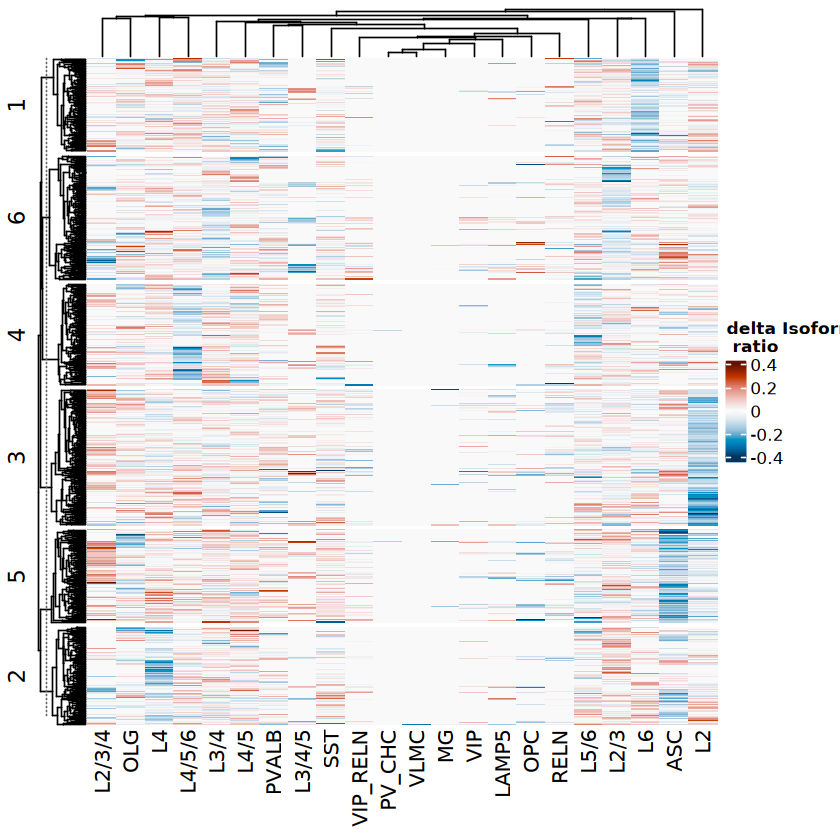

In [134]:
pcloneht.total

[1] 2152
[1] 1018


circlize version 0.4.16
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: https://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements and enhances circular visualization
  in R. Bioinformatics 2014.

This message can be suppressed by:
  suppressPackageStartupMessages(library(circlize))


file saved to result/figure4/DTU_clone_cluster_GLU_24_09_17.pdf



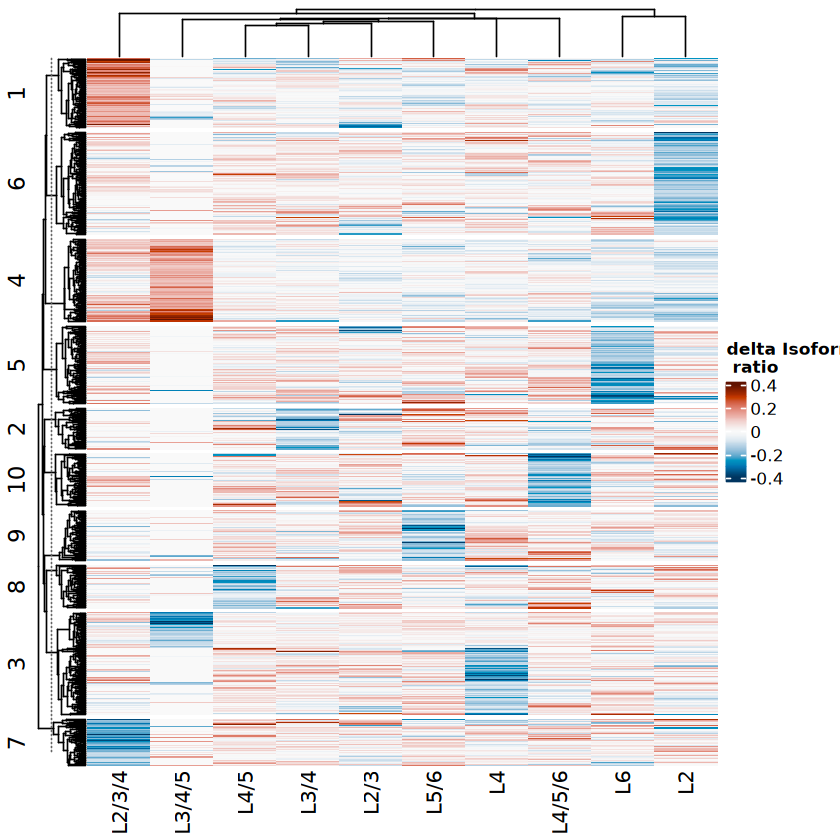

In [29]:
pcloneht.glu = DTUCloneCluster(isosigls.cl$GLU_GLU,10)
pcloneht.glu
ggexport(pcloneht.glu,filename = "result/figure4/DTU_clone_cluster_GLU_24_09_17.pdf",width = 5,height = 5)

[1] 469
[1] 214


file saved to result/figure4/DTU_clone_cluster_NN_24_09_17.pdf



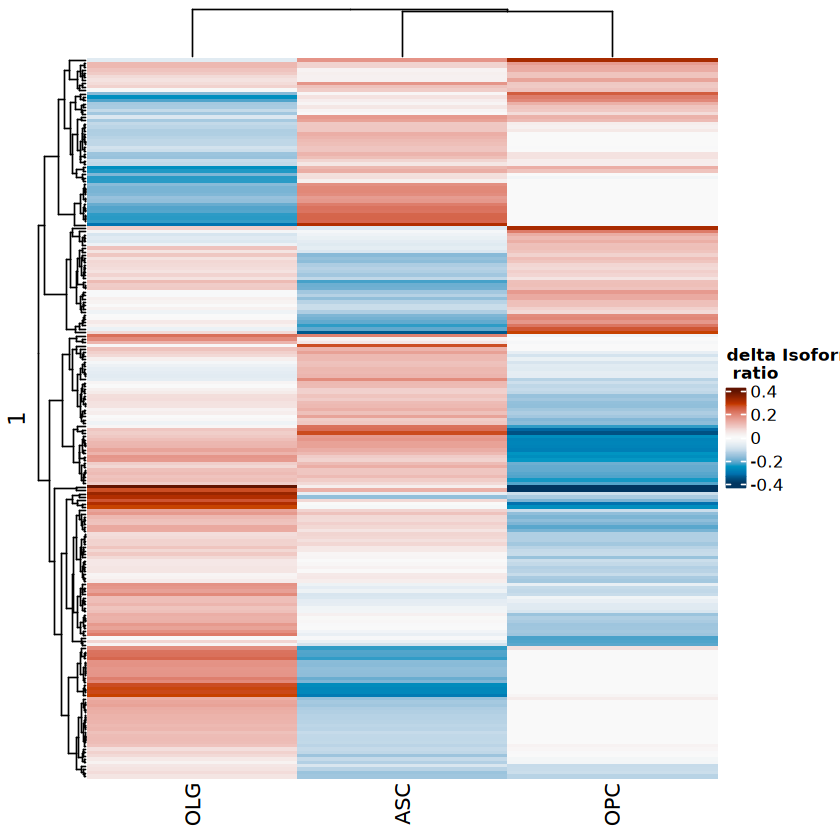

In [32]:
isosigi = isosigls.cl$NonNeuron_NonNeuron
isosigi = isosigi[!isosigi$areatr %in% c("MG","VLMC"),]
pcloneht.nn = DTUCloneCluster(isosigi,1)
pcloneht.nn
ggexport(pcloneht.nn,filename = "result/figure4/DTU_clone_cluster_NN_24_09_17.pdf",width = 3,height = 5)

[1] 412
[1] 219


file saved to result/figure4/DTU_clone_cluster_GABA_24_09_17.pdf



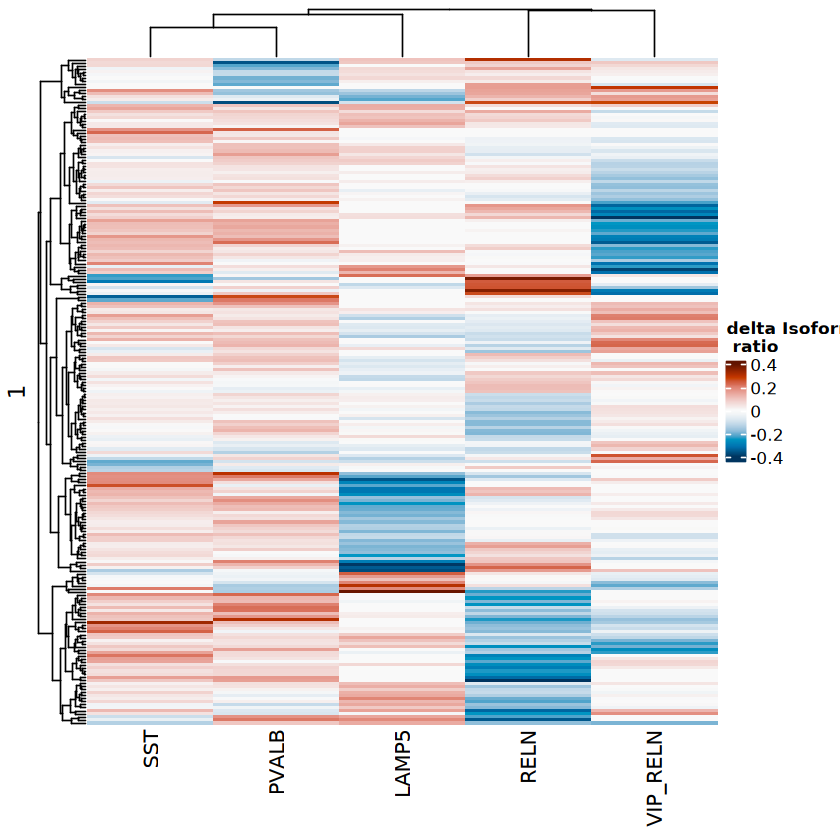

In [34]:
isosigi = isosigls.cl$GABA_GABA
isosigi = isosigi[!isosigi$areatr %in% c("VIP","PV_CHC"),]
pcloneht.gaba = DTUCloneCluster(isosigi,1)
pcloneht.gaba
ggexport(pcloneht.gaba,filename = "result/figure4/DTU_clone_cluster_GABA_24_09_17.pdf",width = 3,height = 5)

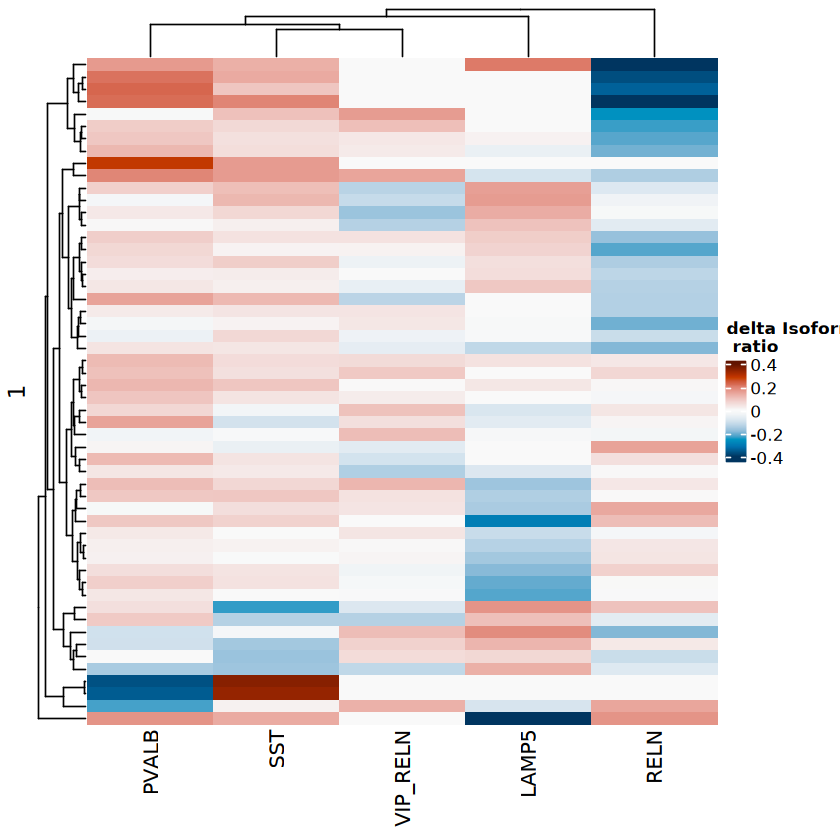

In [517]:
pcloneht.gaba

In [212]:
#fsraw.cor = fsrawdp[fsrawdp$subclass %in% cellan[cellan$class %in% c("GLU"),]$subclass,]
gmksi = unique(isosigi.st.hub$gene_id)
pcls.glu = list()
for(i in 1:length(gmksi)){
    print(i)
    grtdfl = BuildPlotBed(fsraw.cor,longbed,"subclass",gmksi[i],NULL)
    pcls.glu[[i]] = tryCatch(IsoformReadPlot(gtf, grtdfl, gmksi[i],onlyhub = T), 
                                                  error = function(e) NULL)
                               
}
ggexport(pcls.glu,filename = "result/figure4/dtu_case_ls_sGLU_dGLU_24_09_17.pdf",
           width = 10,height = 12)

[1] 1


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 2


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 3


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 4


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 5


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 6


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 7


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 8


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 9


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 10


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 11


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 12


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 13


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 14


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 15


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 16


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 17


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 18


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 19


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 20


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 21


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 22


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 23


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 24


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 25


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 26


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 27


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 28


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 29


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 30


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 31


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 32


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 33


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 34


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 35


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 36


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 37


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 38


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 39


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 40


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 41


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 42


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 43


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 44


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 45


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 46


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 47


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 48


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 49


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 50


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 51


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 52


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 53


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 54


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 55


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 56


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 57


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 58


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 59


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 60


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 61


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 62


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 63


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 64


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 65


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 66


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 67


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 68


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 69


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 70


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 71


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 72


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 73


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 74


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 75


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 76


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 77


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 78


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 79


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 80


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 81


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 82


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 83


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 84


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 85


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 86


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 87


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 88


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 89


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 90


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 91


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 92


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 93


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 94


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 95


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 96


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 97


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 98


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 99


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 100


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 101


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 102


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 103


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 104


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 39 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 32 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 10 rows containing missing values or values outside the scale range
(`geom_segm

In [84]:
ggexport(pcls.glu,filename = "result/figure4/dtu_case_ls_sGLU_dGLU_24_09_17.pdf",
           width = 10,height = 12)

Warning message:
"Using the `size` aesthetic in this geom was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` in the `default_aes` field and elsewhere instead."
Warning message:
"Removed 6 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 8 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 6 rows cont

In [539]:
#try GO analysis
library(gprofiler2)
MyGOPlot = function(hubgenei,ni,mytitle,mycolor = NULL){
    goi = gost(query = hubgenei,
               organism = "mfascicularis")
#godfi = CalOddRate(goi$result,5)
    godfi = goi$result
    godfi$gene_ratio = godfi$intersection_size/godfi$term_size
#godfi = godfi[godfi$p_value < 0.05,]
    godfi = godfi[godfi$intersection_size > 2,] %>% group_by(source) %>% arrange(gene_ratio) %>% 
    top_n(wt = gene_ratio,n = ni)
    godfi$term_name = factor(godfi$term_name,levels = unique(godfi$term_name))
    print(nrow(godfi))

    if(is.null(mycolor)){
        mycolor = pal_flatui("default")(length(unique(godfi$source)))
    }
    godfi = godfi[!godfi$term_name %in% c("cell junction","cytoplasm","cytosol","cytoskeleton"),]
    if(nrow(godfi) > 0){
        pgi = ggplot(godfi,
               aes(x = gene_ratio, y=term_name,fill = source)) + 
        geom_point(aes(size = intersection_size),shape = 21) +
        geom_bar(stat = "identity",width = 0.03) +
        geom_text(aes(label = term_name,x = 0),hjust = -0.01,vjust = -0.5) +
        scale_fill_manual(values = mycolor) +
 #       scale_fill_viridis(direction = 1,option = "A") +
        #scale_fill_distiller(direction = 1,palette = "Greens") +
    # scale_y_discrete(labels = rev(unique(godftf$term_name))) +
    #facet_grid(source~.,scales = "free",space = "free") + 
        xlab("gene counts") +
        theme_pubr() + theme(legend.position = "top",axis.text.y = element_blank()) +
        ggtitle(mytitle)
    }
    return(pgi)
    
}

MyGOCal = function(hubgenei,ni){
    goi = gost(query = hubgenei,
               organism = "mfascicularis")
#godfi = CalOddRate(goi$result,5)
    godfi = goi$result
    godfi$gene_ratio = godfi$intersection_size/godfi$term_size
#godfi = godfi[godfi$p_value < 0.05,]
    godfi = godfi[godfi$source %in% c("GO:BP","HP","KEGG"),]
    godfi = godfi[godfi$intersection_size > 2,] %>% arrange(-p_value) %>% 
    top_n(wt = gene_ratio,n = ni)
    godfi$term_name = factor(godfi$term_name,levels = unique(godfi$term_name))
    print(nrow(godfi))

    godfi = godfi[!godfi$term_name %in% c("cell junction","cytoplasm","cytosol","cytoskeleton"),]

    return(godfi)
    
}


#ggexport(pgi,filename = "result/figure3/sigiso_class_transcript_dr_cluster_heatmap_NN_GO_24_04_21.pdf",width = 4,height = 8)


In [ ]:
subcldf = data.frame(transcript_id = names(htls_od$rowcluster),areatr = htls_od$rowcluster)
subcldf = merge(subcldf,unique(isosigi[,c("gene_id","transcript_id")]),by = "transcript_id")
subcldf[subcldf$gene_id == "DDRGK1",]
areatrs = unique(subcldf$areatr)
goana = NULL
sourceid = unique(refgdf$source)
for(i in 1:length(areatrs)){
    isosigii = subcldf[subcldf$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    for(j in 1:length(sourceid)){
        refgene = unique(refgdf[refgdf$source == sourceid[j],]$gene_id)
        goanai = FishEnrich(hubgene,refgene,20000)
        goanai$group = sourceid[j]
        goanai$areatr = areatrs[i]
        goana = rbind(goana,goanai)
    }
}
ph = ggplot(goana,aes(x = areatr,y = group, color = -log10(p.value),size = enrichscore)) + geom_point() + theme_bw() + 
theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = 2) + coord_fixed()
ph

In [555]:
areatrs = unique(subcldf$areatr)
areatrs = areatrs[order(areatrs)]
areatrs = areatrs[1:15]
godf = NULL
for(i in 1:length(areatrs)){
    isosigii = subcldf[subcldf$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    print(length(hubgene))
    godfi = tryCatch(MyGOCal(hubgene,3),error = function(e) 0)
    if(!is.null(nrow(godfi))){
        if(nrow(godfi) > 0){
            godfi$areatr = areatrs[i]
            godf = rbind(godf,godfi)
        }
    }
}
pgot = ggplot(data = godf) + 
     # geom_rect(data = unique(godft[,c("term_name","source")]),
     #                               aes(ymin = as.numeric(term_name)-0.5,ymax = as.numeric(term_name)+0.5,
     #                                                        xmin = -Inf,xmax = Inf,fill = source),
     #            alpha = 0.2) +
    geom_point(aes(x = areatr,y = term_name,size = -log10(p_value),fill = source),shape = 21,color = "black") +
    geom_text(aes(y = term_name,label = term_name,x = 0,color = source),hjust = -0.01,vjust = -0.5) +
    # scale_color_manual(values = mycolor) +
#    facet_grid(group~.,scales = "free",space = "free") +
    theme_bw() +
    theme(axis.text.y = element_blank(),
       axis.ticks.y = element_blank(),
      panel.spacing = unit(0,'lines'),
      panel.grid.major = element_blank(),
      #panel.grid.minor = element_blank(),
      panel.border = element_rect(fill = NA)) + xlab("")
pgot

[1] 108
[1] 0
[1] 57
[1] 3
[1] 74
[1] 3
[1] 81
[1] 0
[1] 71
[1] 0
[1] 64
[1] 0
[1] 76
[1] 3
[1] 54
[1] 1
[1] 96
[1] 3
[1] 69


No results to show
Please make sure that the organism is correct or set significant = FALSE



[1] 110
[1] 3
[1] 288
[1] 3
[1] 72
[1] 0
[1] 187
[1] 3
[1] 192
[1] 3


ERROR while rich displaying an object: Error in `scale_continuous()`:
! Discrete values supplied to continuous scale.
ℹ Example values: "GO:BP", "HP", "HP", "GO:BP", and "GO:BP"

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
6.

file saved to result/figure4/sigiso_subclass_transcript_dr_cluster_heatmap_Within_GO_24_11_07.pdf



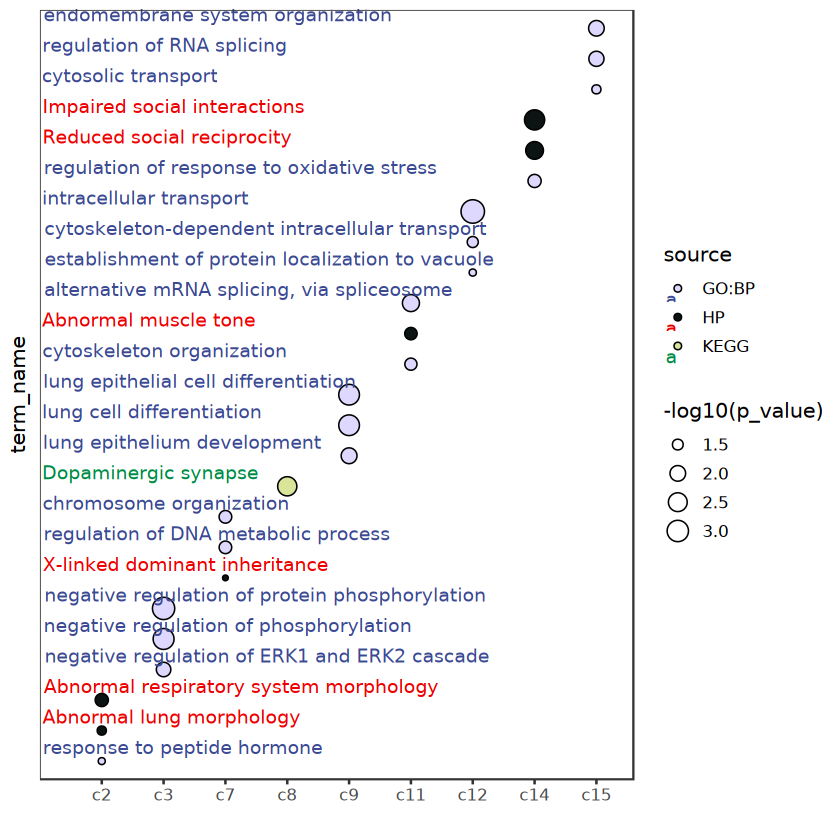

In [588]:
pgot = ggplot(data = godf) + 
     # geom_rect(data = unique(godft[,c("term_name","source")]),
     #                               aes(ymin = as.numeric(term_name)-0.5,ymax = as.numeric(term_name)+0.5,
     #                                                        xmin = -Inf,xmax = Inf,fill = source),
     #            alpha = 0.2) +
    geom_point(aes(x = areatr,y = term_name,size = -log10(p_value),fill = source),shape = 21,color = "black") +
    geom_text(aes(y = term_name,label = term_name,x = 0,color = source),hjust = -0.01,vjust = -0.5) +
    scale_fill_aaas() + 
    scale_color_aaas() + 
    # scale_color_manual(values = mycolor) +
#    facet_grid(group~.,scales = "free",space = "free") +
    theme_bw() +
    theme(axis.text.y = element_blank(),
       axis.ticks.y = element_blank(),
      panel.spacing = unit(0,'lines'),
      panel.grid.major = element_blank(),
      #panel.grid.minor = element_blank(),
      panel.border = element_rect(fill = NA)) + xlab("")
pgot
ggexport(pgot,filename = "result/figure4/sigiso_subclass_transcript_dr_cluster_heatmap_Within_GO_24_11_07.pdf",width = 6,height = 8)

In [194]:
mycolor = pal_flatui("default")(5)
names(mycolor) = c("GO:BP","GO:MF","GO:CC","HP","KEGG")

#hubgenei = unique(isosigi.st.hub$gene_id)
isosigi = isosigls.cl$NonNeuron_NonNeuron
hubgenei = unique(isosigi[isosigi$sig != "N" & isosigi$sig != "Y",]$gene_id)
length(hubgenei)
go1 = MyGOCal(hubgenei,10)
go1$group = "NN"

isosigi = isosigls.cl$GLU_GLU
hubgenei = unique(isosigi[isosigi$sig != "N" & isosigi$sig != "Y",]$gene_id)
length(hubgenei)
go2 = MyGOCal(hubgenei,10)
go2$group = "GLU"

isosigi = isosigls.cl$GABA_GABA
hubgenei = unique(isosigi[isosigi$sig != "N" & isosigi$sig != "Y",]$gene_id)
length(hubgenei)
go3 = MyGOCal(hubgenei,10)
go3$group = "GABA"
godfi = rbind(go1,go2,go3)



[1] 259

[1] 10


[1] 1066

[1] 10


[1] 248

[1] 10


file saved to result/figure4/sigiso_class_transcript_dr_cluster_heatmap_Within_GO_24_09_17.pdf



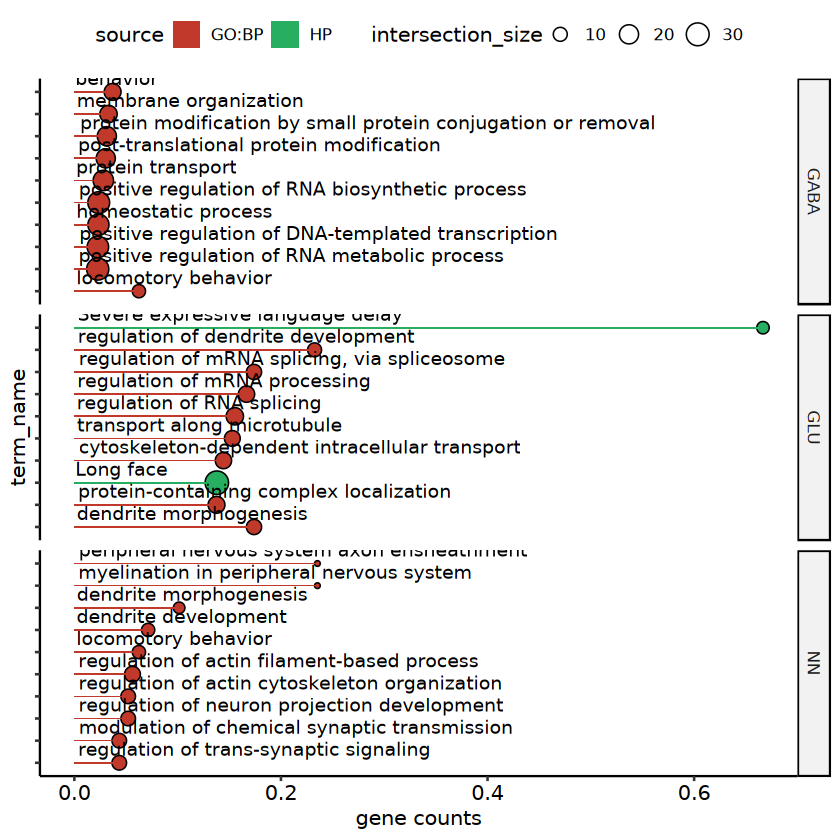

In [195]:
pgi = ggplot(godfi,
               aes(x = gene_ratio, y=term_name,fill = source)) + 
        geom_point(aes(size = intersection_size),shape = 21) +
        geom_bar(stat = "identity",width = 0.03) +
        geom_text(aes(label = term_name,x = 0),hjust = -0.01,vjust = -0.5) +
        scale_fill_manual(values = mycolor) +
 #       scale_fill_viridis(direction = 1,option = "A") +
        #scale_fill_distiller(direction = 1,palette = "Greens") +
    # scale_y_discrete(labels = rev(unique(godftf$term_name))) +
        facet_grid(group~.,scales = "free",space = "free") + 
        xlab("gene counts") +
        theme_pubr() + theme(legend.position = "top",axis.text.y = element_blank())
#        ggtitle(mytitle)
pgi
ggexport(pgi,filename = "result/figure4/sigiso_class_transcript_dr_cluster_heatmap_Within_GO_24_09_17.pdf",width = 4,height = 10)

### Subclass case plot

In [25]:
#find a DEG case
DefaultAssay(srtt) = "RNA"
Idents(srtt) = "subclass"
subclassmk = FindAllMarkers(srtt)
qsave(subclassmk,"result/figure4/subclass_srtt_marker_gene_24_10_28.qs")
head(subclassmk)
subclassmk.hub = subclassmk[subclassmk$p_val_adj < 0.05 & subclassmk$pct.1 > 0.25 & abs(subclassmk$avg_log2FC) > 1,]


Calculating cluster LAMP5

Calculating cluster PVALB

Calculating cluster PV_CHC

Calculating cluster RELN

Calculating cluster SST

Calculating cluster VIP

Calculating cluster VIP_RELN

Calculating cluster L2

Calculating cluster L2/3

Calculating cluster L2/3/4

Calculating cluster L3/4

Calculating cluster L3/4/5

Calculating cluster L4

Calculating cluster L4/5

Calculating cluster L4/5/6

Calculating cluster L5/6

Calculating cluster L6

Calculating cluster ASC

Calculating cluster EC

Calculating cluster MG

Calculating cluster OLG

Calculating cluster OPC

Calculating cluster VLMC



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
KIT,0.000000e+00,4.834011,0.819,0.087,0.000000e+00,LAMP5,KIT
LAMP5,0.000000e+00,3.825464,0.809,0.167,0.000000e+00,LAMP5,LAMP5
FBXL7,0.000000e+00,4.207251,0.738,0.107,0.000000e+00,LAMP5,FBXL7
EYA4,0.000000e+00,4.779605,0.458,0.040,0.000000e+00,LAMP5,EYA4
TACR1,0.000000e+00,4.704342,0.314,0.022,0.000000e+00,LAMP5,TACR1
ADARB2,1.846017e-266,3.374952,0.842,0.223,3.317847e-262,LAMP5,ADARB2


[1] 15479

In [27]:
subclassmk.hub %>% group_by(cluster) %>% summarise(gn = length(gene))
deg.gene = unique(subclassmk.hub$gene)
length(deg.gene)

cluster,gn
<fct>,<int>
LAMP5,179
PVALB,122
PV_CHC,106
RELN,133
SST,91
VIP,73
VIP_RELN,110
L2,155
L2/3,63


[1] 2027

In [ ]:
#fsraw.cor = fsrawdp[fsrawdp$subclass %in% cellan[cellan$class %in% c("GLU"),]$subclass,]
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
gmksi = unique(isosigi$gene_id)
length(gmksi)
pcls.glu = list()
for(i in 1:length(gmksi)){
    print(i)
    grtdfl = BuildPlotBed(fsraw.cor,longbed,"subclass",gmksi[i],NULL)
    pcls.glu[[i]] = tryCatch(IsoformReadPlot(gtf, grtdfl, gmksi[i],onlyhub = T), 
                                                  error = function(e) NULL)
                               
}
ggexport(pcls.glu,filename = "result/figure4/dtu_case_ls_subclass_24_09_17.pdf",
           width = 10,height = 18)
                             

[1] 1948

[1] 1


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 2


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 3


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 4


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 5


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 6


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 7


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 8


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 9


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 10


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 11


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 12


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 13


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 14


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 15


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 16


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 17


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 18


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 19


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 20


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 21


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 22


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 23


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 24


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 25


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 26


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 27


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 28


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 29


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 30


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 31


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 32


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 33


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 34


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 35


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 36


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 37


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 38


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 39


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 40


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 41


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 42


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 43


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 44


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 45


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 46


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 47


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 48


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 49


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 50


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 51


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 52


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 53


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 54


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 55


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 56


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 57


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 58


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 59


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 60


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 61


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 62


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 63


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 64


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 65


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 66


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 67


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 68


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 69


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 70


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 71


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 72


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 73


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 74


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 75


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 76


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 77


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 78


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 79


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 80


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 81


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 82


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 83


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 84


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 85


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 86


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 87


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 88


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 89


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 90


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 91


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 92


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 93


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 94


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 95


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 96


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 97


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 98


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 99


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 100


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 101


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 102


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 103


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 104


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 105


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 106


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 107


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 108


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 109


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 110


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 111


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 112


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 113


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 114


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 115


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 116


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 117


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 118


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 119


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 120


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 121


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 122


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 123


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 124


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 125


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 126


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 127


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 128


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 129


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 130


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 131


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 132


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 133


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 134


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 135


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 136


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 137


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 138


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 139


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 140


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 141


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 142


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 143


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 144


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 145


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 146


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 147


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 148


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 149


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 150


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 151


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 152


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 153


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 154


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 155


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 156


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 157


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 158


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 159


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 160


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 161


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 162


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 163


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 164


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 165


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 166


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 167


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 168


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 169


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 170


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 171


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 172


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 173


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 174


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 175


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 176


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 177


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 178


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 179


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 180


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 181


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 182


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 183


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 184


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 185


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 186


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 187


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 188


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 189


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 190


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 191


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 192


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 193


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 194


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 195


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 196


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 197


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 198


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 199


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 200


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 201


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 202


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 203


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 204


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 205


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 206


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 207


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 208


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 209


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 210


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 211


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 212


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 213


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 214


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 215


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 216


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 217


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 218


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 219


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 220


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 221


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 222


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 223


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 224


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 225


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 226


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 227


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 228


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 229


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 230


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 231


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 232


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 233


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 234


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 235


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 236


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 237


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 238


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 239


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 240


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 241


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 242


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 243


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 244


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 245


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 246


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 247


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 248


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 249


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 250


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 251


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 252


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 253


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 254


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 255


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 256


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 257


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 258


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 259


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 260


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 261


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 262


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 263


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 264


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


In [356]:
#isosigi = isosigls$subclass
#isosigi = isosigi[isosigi$sig != "N",]
casect = fsraw.cor[fsraw.cor$subclass != "",] %>% group_by(class,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(class,subclass,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)


`summarise()` has grouped output by 'class', 'subclass', 'gene_id'. You can
override using the `.groups` argument.


In [481]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
isosigi = isosigi %>% group_by(transcript_id,sig) %>% filter(n() == 1)
isosigi = isosigi[isosigi$count > 50,]
isosigi = isosigi %>% group_by(areatr) %>% top_n(wt = abs(dr),n = 10)
isosigi[isosigi$areatr == 'SST',]

In [517]:
#isosigi = isosigls$subclass
#isosigi = isosigi[isosigi$sig != "N",]
casect = fsraw.cor[fsraw.cor$subclass != "",] %>% group_by(class,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(class,subclass,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)

caseg = c("CLDND1","EIF5A","DDRGK1","ARPP19","ARPP21","IDH3B","GRIP1",
          "SIVA1","TUSC3","BCAN","SEPT8","NTRK2",'DNAJC7',"CAPRIN1","DBNDD2")
#caseg = unique(isosigi$gene_id)
isosigi2 = isosigls$subclass
isosigi2 = isosigi2[isosigi2$sig != "N",]
#isosigi2 = isosigi2[isosigi2$gene_id %in% caseg & isosigi2$sig != "N",] %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
#isosigi = isosigi[isosigi$count > 20,]

casecti = casect[casect$gene_id %in% caseg & casect$transcript_id %in% isosigi2$transcript_id,]
# casecti[!(casecti$transcript_id %in% isosigi2$transcript_id),]$transcript_id = "other"
# casecti = casecti %>% group_by(gene_id,transcript_id,class,subclass) %>% summarise(count = sum(count),
#                                                                             genecount = sum(genecount),
#                                                                             rate = count/genecount)
casecti = casecti[casecti$genecount > 10,]
casecti = casecti[!casecti$subclass %in% c("VLMC","VIP","PV_CHC","MG"),]

casecti = casecti %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,class+subclass+gene_id~id,value.var = "rate")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$class,casectl$subclass),]
casectl$groupid = as.numeric(factor(casectl$subclass,levels = suborder[suborder %in% casectl$subclass]))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = caseg))
head(casectl)
library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$sig = 'N'
casectl[paste0(casectl$subclass,casectl$gene_id) %in% paste0(isosigi$areatr,isosigi$gene_id),]$sig = "Y"
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
casectl$gene_id = factor(casectl$gene_id,levels = caseg)
plt = ggplot() + 
      geom_scatterpie(data = casectl[casectl$gene_id %in% caseg, ],
                      aes(y = groupid, x = geneidn, group = groupid,color = sig,
                                           r = 0.4),
                      cols=colnames(casectl)[4:(4+ison-1)]) + 
      coord_fixed() +
      scale_y_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = suborder[suborder %in% casectl$subclass]) +
      scale_x_continuous(breaks = c(1:length(caseg)),labels = caseg) +
      scale_color_manual(values = c("white","black")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_nejm() +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure4/case_subclass_isoform_rate_stat_pie_24_11_07.pdf",width = 6,height = 8)

,class,subclass,gene_id,1,2,3,4,groupid,geneidn
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,GABA,LAMP5,ARPP19,0.4000000,0.5076923,0.00000,0.00000,11,4
2,GABA,LAMP5,ARPP21,0.3750000,0.3125000,0.03125,0.15625,11,5
3,GABA,LAMP5,BCAN,0.6956522,0.0000000,0.00000,0.00000,11,10
4,GABA,LAMP5,CAPRIN1,0.5151515,0.4848485,0.00000,0.00000,11,14
5,GABA,LAMP5,CLDND1,0.8125000,0.0625000,0.00000,0.00000,11,1
6,GABA,LAMP5,DBNDD2,0.6875000,0.2083333,0.00000,0.00000,11,15


file saved to result/figure4/case_subclass_isoform_rate_stat_pie_24_11_07.pdf



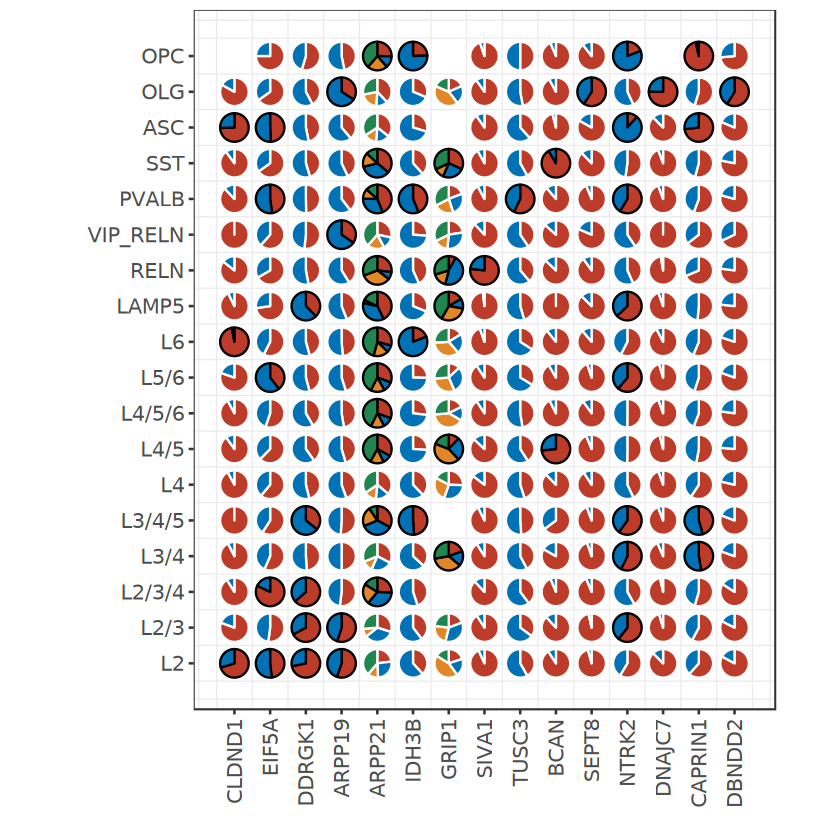

In [518]:
library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$sig = 'N'
casectl[paste0(casectl$subclass,casectl$gene_id) %in% paste0(isosigi$areatr,isosigi$gene_id),]$sig = "Y"
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
casectl$gene_id = factor(casectl$gene_id,levels = caseg)
plt = ggplot() + 
      geom_scatterpie(data = casectl[casectl$gene_id %in% caseg, ],
                      aes(y = groupid, x = geneidn, group = groupid,color = sig,
                                           r = 0.4),
                      cols=colnames(casectl)[4:(4+ison-1)]) + 
      coord_fixed() +
      scale_y_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = suborder[suborder %in% casectl$subclass]) +
      scale_x_continuous(breaks = c(1:length(caseg)),labels = caseg) +
      scale_color_manual(values = c("white","black")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_nejm() +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure4/case_subclass_isoform_rate_stat_pie_24_11_07.pdf",width = 6,height = 8)

file saved to result/figure4/case_subclass_isoform_rate_stat_TUSC3_24_09_11.pdf



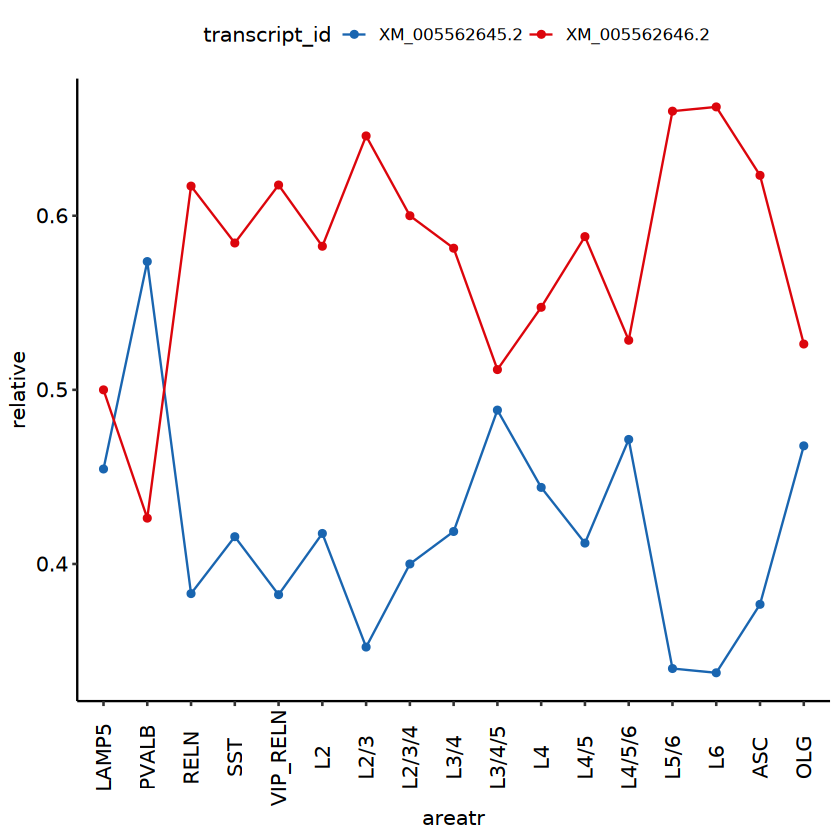

In [14]:
isosigi = isosigls$subclass
isosighub = isosigi[isosigi$gene_id == "TUSC3",]
isosighub = isosighub[!isosighub$areatr %in% c("VLMC","VIP","PV_CHC","MG"),]
isosighub = isosighub[isosighub$count > 5,]
isosighub = merge(isosighub,cellan,by.x = "areatr",by.y = "subclass")
isosighub = isosighub[order(isosighub$class,isosighub$areatr),]
isosighub$areatr = factor(isosighub$areatr,levels = unique(isosighub$areatr))
#head(isosighub)
pc = ggplot(isosighub,aes(x = areatr, y = relative, color = transcript_id,group = transcript_id)) + geom_point() + geom_line() + 
scale_color_discreterainbow() +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))
pc
ggexport(pc,filename = "result/figure4/case_subclass_isoform_rate_stat_TUSC3_24_09_11.pdf",width = 4,height = 4)

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 52 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 27 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 5 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`geom_se

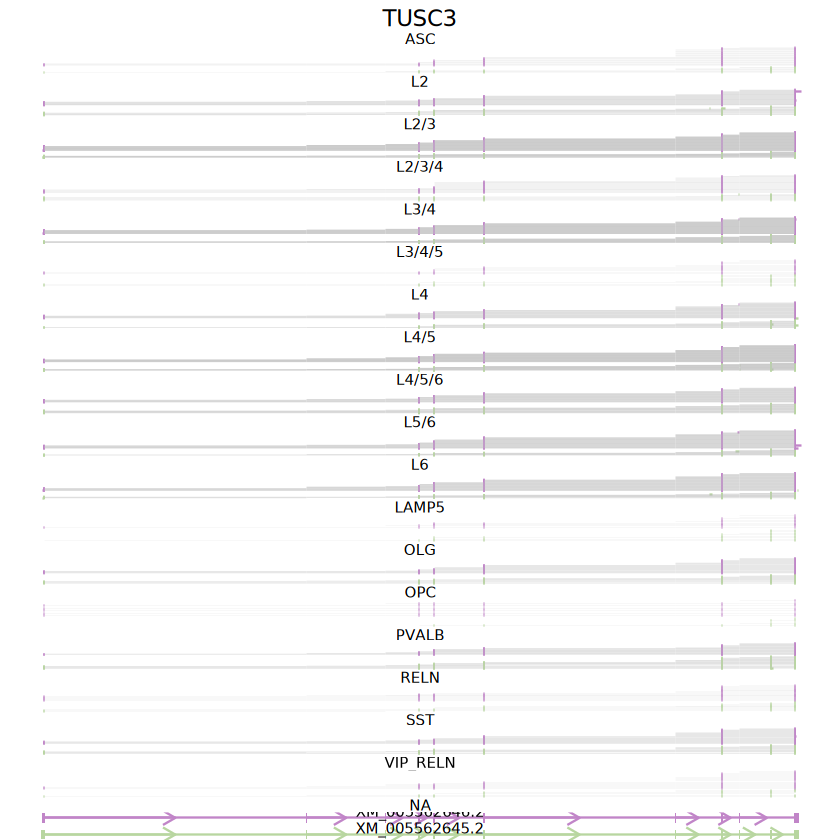

In [16]:
geneex = "TUSC3"
grtdfl = BuildPlotBed(fsraw.cor[!fsraw.cor$subclass %in% c("VLMC","VIP","PV_CHC","MG") &
                                fsraw.cor$transcript_id %in% isosighub$transcript_id, ],longbed,"subclass",geneex,NULL)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = T), 
                                                  error = function(e) NULL)
pci
fileid = paste0("result/figure4/dtu_case_ls_subclass_",geneex,"_24_09_17.pdf")
ggexport(pci,filename = fileid,
           width = 10,height = 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
ARPP19,3.702372e-23,-0.7890696,0.705,0.835,6.654273e-19,LAMP5,ARPP19
ARPP19.1,7.352772e-36,-0.4756371,0.780,0.836,1.321514e-31,PVALB,ARPP19
ARPP19.2,6.695871e-11,-1.1292790,0.564,0.834,1.203449e-06,PV_CHC,ARPP19
ARPP19.3,3.891791e-29,-0.6575030,0.703,0.836,6.994717e-25,RELN,ARPP19
ARPP19.4,5.774158e-20,-0.3638636,0.797,0.835,1.037789e-15,SST,ARPP19
ARPP19.5,8.228295e-04,-0.2324522,0.798,0.834,1.000000e+00,VIP,ARPP19
ARPP19.6,1.490150e-10,-0.4248341,0.766,0.834,2.678247e-06,VIP_RELN,ARPP19
ARPP19.7,7.341431e-48,0.3144039,0.906,0.829,1.319475e-43,L2,ARPP19
ARPP19.8,0.000000e+00,0.8893989,0.945,0.818,0.000000e+00,L2/3,ARPP19


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 238 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 164 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 6 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 20 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 8 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 8 rows containing missing values or values outside the scale range
(`geo

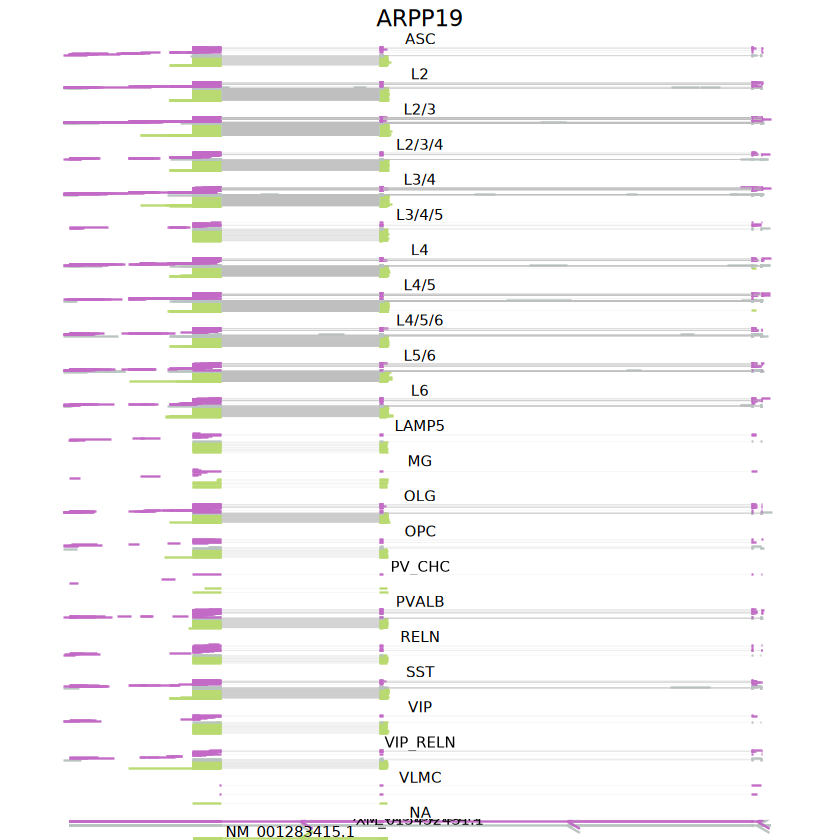

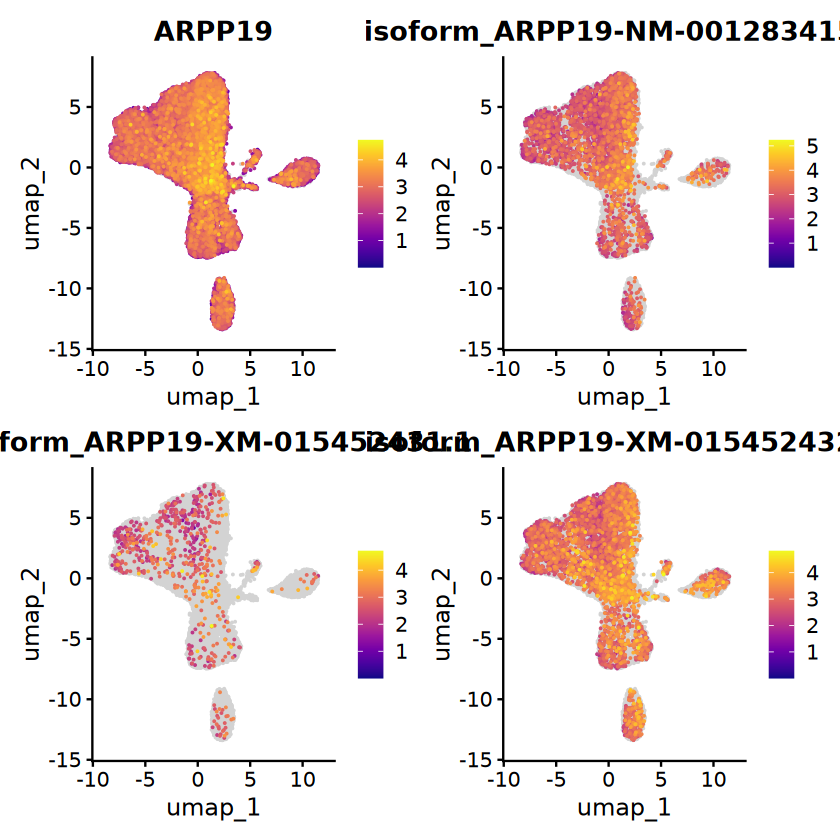

In [40]:
subclassmk[subclassmk$gene == "ARPP19",]
geneex = "ARPP19"
IsoformReadPlotTotal(fsraw.cor,isosigi,longbed,gtf,geneex,NULL,TRUE,NULL)
    featuresi = unique(isosigi[isosigi$gene_id == geneex,]$transcript_id)
    featuresi = gsub("_","-",featuresi)
    featuresi = paste0(geneex,"-",featuresi)
    featuresi = c(geneex,featuresi)
FeaturePlot_scCustom(seurat_object = srtt, features = featuresi,
                                  order = T,colors_use = pal)

In [42]:
isosigi = isosigls$subclass
isosigi.hub = isosigi[isosigi$sig != "N" & isosigi$genecount > 300,]
subclassmk.hub = subclassmk[subclassmk$p_val_adj < 0.05 & subclassmk$pct.1 > 0.25 & abs(subclassmk$avg_log2FC) > 1,]
subclassmk.hubf = subclassmk.hub[subclassmk.hub$gene %in% isosigi.hub$gene_id,]
hubgenes = unique(subclassmk.hubf$gene)
length(hubgenes)
isosigi.hub = isosigi.hub[isosigi.hub$gene_id %in% hubgenes,]
fsraw.cor$areatr = fsraw.cor$subclass
psubcls = list()
psubcmkls = list()
pal <- viridis(n = 10, option = "C")
for(i in 1:length(hubgenes)){
    geneex = hubgenes[i]
    psubcls[[i]] = IsoformReadPlotTotal(fsraw.cor,isosigi,longbed,gtf,geneex,NULL,TRUE,NULL)
    featuresi = unique(isosigi.hub[isosigi.hub$gene_id == geneex,]$transcript_id)
    featuresi = gsub("_","-",featuresi)
    featuresi = paste0(geneex,"-",featuresi)
    featuresi = c(geneex,featuresi)
    psubcmkls[[i]] = FeaturePlot_scCustom(seurat_object = srtt, features = featuresi,
                                  order = T,colors_use = pal)
}
ggexport(psubcls,filename = "result/figure4/dtu_case_ls_subclass_in_degls_24_10_27.pdf",width = 10,height = 20)
ggexport(psubcmkls,filename = "result/figure4/dtu_case_ls_subclass_in_degls_umap_24_10_27.pdf",width = 8,height = 8)

[1] 48

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Could not find ARPP21-XM-005545496.2 in the default search locations, found in 'ISOFORM' assay instead"
Warning message:
"Could not find ARPP21-XM-015444956.1 in the default search locations, found in 'ISOFORM' assay instead"
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Could not find KCNIP4-NM-001284944.1 in the default search locations, found in 'ISOFORM' assay instead"
Warning message:
"Could not find KCNIP4-XM-005554562.2 in the default search locations, found in 'ISOFORM' assay instead"
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Could not find CNTNAP2-CNTNAP2-WeiLab-1 in the default search locations, found in 'ISOFORM' assay instead"
Warning message:
"Could not find CNTNAP2-XM-005551079.2 in the default search locations

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 63 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 37 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 5 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`geom_seg

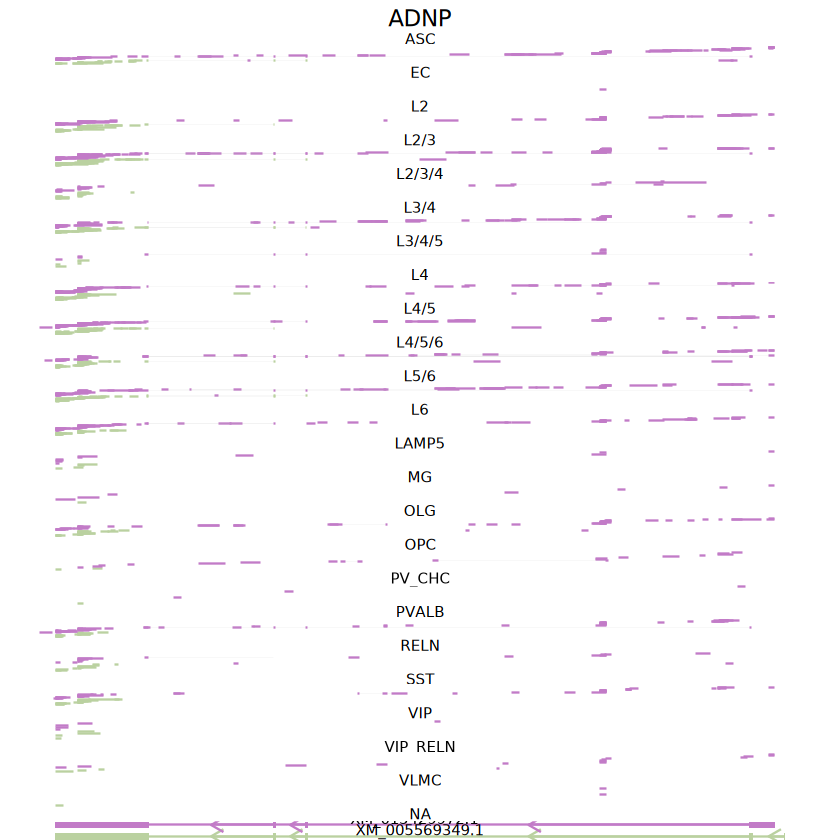

In [163]:
geneex = "ADNP"
grtdfl = BuildPlotBed(fsraw.cor,longbed,"subclass",geneex,NULL)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = T), 
                                                  error = function(e) NULL)
pci

[1] "XM_005546167.2" "XM_005546170.2" "XM_005546172.2"

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Using the `size` aesthetic in this geom was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` in the `default_aes` field and elsewhere instead."
Warning message:
"Removed 14 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 11 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."


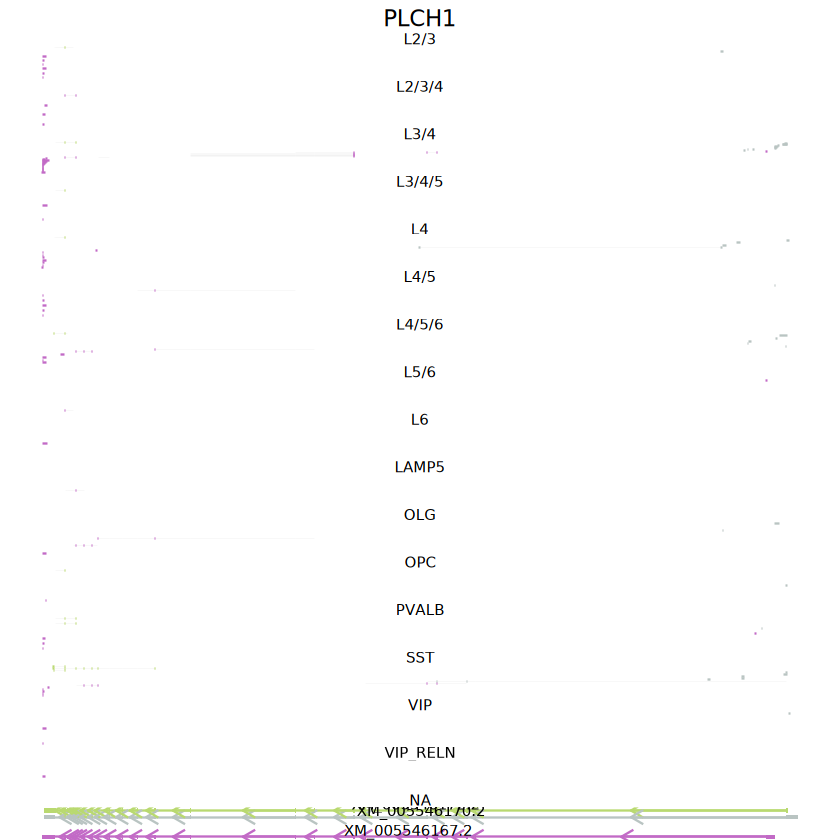

In [24]:
geneex = "PLCH1"
isosigi = isosigls$class
unique(isosigi[isosigi$gene_id == geneex,]$transcript_id)
fsraw.cor$areatr = fsraw.cor$subclass
IsoformReadPlotTotal(fsraw.cor,isosigi,longbed,gtf,geneex,NULL,TRUE,NULL)


### Subclass contribution stat

In [161]:
# isosiggl = isosigls.cl$GLU_GLU
# huntrans1 = unique(isosiggl[isosiggl$sig %in% c("Up","Down"),]$transcript_id)
# isosigga = isosigls.cl$GABA_GABA
# huntrans2 = unique(isosigga[isosigga$sig %in% c("Up","Down"),]$transcript_id)
# isosignn = isosigls.cl$NonNeuron_NonNeuron
# huntrans3 = unique(isosignn[isosignn$sig %in% c("Up","Down"),]$transcript_id)
# huntrans = c(huntrans1,huntrans2,huntrans3)
isosigi = isosigls$subclass
huntrans = unique(isosigi[isosigi$sig %in% c("Up","Down"),]$transcript_id)

isosiggl = isosigi[isosigi$transcript_id %in% huntrans & isosigi$areatr %in% cellan[cellan$class == "GLU",]$subclass,]
isosiggl = isosiggl[isosiggl$count > 10,]
isosiggl = isosiggl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigga = isosigi[isosigi$transcript_id %in% huntrans & isosigi$areatr %in% cellan[cellan$class == "GABA",]$subclass,]
isosigga = isosigga[isosigga$count > 10,]
isosigga = isosigga %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosignn = isosigi[isosigi$transcript_id %in% huntrans & isosigi$areatr %in% cellan[cellan$class == "NonNeuron",]$subclass,]
isosignn = isosignn[isosignn$count > 10,]
isosignn = isosignn %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosiggl,isosigga,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosignn,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AACS,NM_001284010.1,0.17748918,1024,0.08448093,0.167565139
2,ABCC5,XM_005546512.2,0.06851852,692,0.13766234,0.275702734
3,ABHD2,XM_005560462.2,0.21158301,390,0.08681319,0.109890110
4,ABLIM1,XM_005566500.2,0.16936488,693,0.17857143,0.008712016
5,ACADM,XM_005542992.2,0.10416667,643,0.12946429,0.095238095
6,ACBD5,ACBD5-WeiLab-1,0.16368286,192,0.08149038,0.003411306


[1] 1590

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01295 0.11842 0.16880 0.18079 0.22676 0.55250 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.04738 0.09524 0.11410 0.16636 0.48345 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.07547 0.13767 0.14223 0.19914 0.44643 

Warning message:
"The plyr::rename operation has created duplicates for the following name(s): (`colour`)"
file saved to result/figure4/class_within_subclass_dtu_delta_tern_24_11_05.pdf



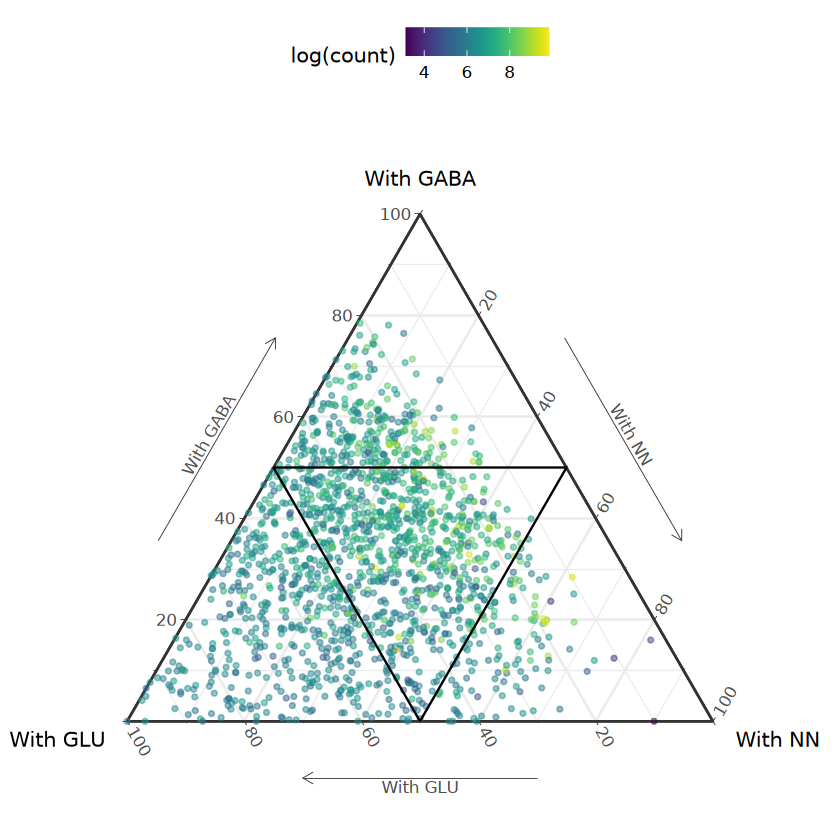

In [189]:
hubtrans = c("XM_015434930.1","XM_005545495.2","DDRGK1-WeiLab-1","XM_005576035.2","XM_005592027.2")
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubtrans = NULL
hubgene = c("ARPP21","DDRGK1","CAPRIN1","SLC8A1","ARL2BP")
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,color = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(alpha = 0.5,size = 1) + 
   # geom_text(data=isosigtri[isosigtri$sig != "N",],
   #           aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50) +
geom_Tline(Tintercept=0.50) +
geom_Rline(Rintercept=0.50) +
xlab("With GLU")+ 
ylab("With GABA")+
zlab("With NN")+ 
scale_color_viridis() +
theme(legend.position = "top")
p2
ggexport(p2,filename = "result/figure4/class_within_subclass_dtu_delta_tern_24_11_05.pdf",width = 4,height = 4)

### Subclass function disease analysis

#### Disease gene list build

In [55]:
#ASD & NDD
library(readxl)
Dsgdf = NULL
df.ASD.ra = read_excel("ref/disease_gene/41588_2022_1104_MOESM3_ESM.xlsx", sheet = 15)
#head(df.ASD.ra)
Dsgdf.ASD.talk = data.frame("gene_id" = unique(df.ASD.ra[df.ASD.ra$FDR_ASD < 0.01,]$gene),"source" = "ASD.Talkowski","group" = "ASD")
Dsgdf.NDD.talk = data.frame("gene_id" = unique(df.ASD.ra[df.ASD.ra$FDR_DD < 0.01,]$gene),"source" = "NDD.Talkowski","group" = "NDD")

In [112]:
#SCZ
df.SCZ.ra = read_excel("ref/disease_gene/41586_2022_4556_MOESM3_ESM.xlsx", sheet = 3)
Dsgdf.SCZ = data.frame("gene_id" = df.SCZ.ra[1:10,]$`Gene Symbol`,"source" = "SCZ.Daly","group" = "SCZ")

In [83]:
#BIP
df.BIP = read.csv("ref/disease_gene/Bipolar_Disorder_results_2024_10_30_10_36_25.csv")
library(org.Hs.eg.db)
gene_info = AnnotationDbi::select(org.Hs.eg.db, keys = df.BIP$Gene, columns = c("SYMBOL"), keytype = "ENSEMBL")
head(gene_info)
colnames(gene_info) = c("Gene","gene_symbol")
df.BIP = merge(df.BIP,gene_info,by = "Gene")
#head(df.BIP)
hubgenei1 = df.BIP[df.BIP$`Damaging.Missense.Fisher.p.val` < 0.01 & !is.na(df.BIP$`Damaging.Missense.Fisher.p.val`),]$gene_symbol
hubgenei2 = df.BIP[df.BIP$`PTV.Fisher.p.val` < 0.01 & !is.na(df.BIP$`PTV.Fisher.p.val`),]$gene_symbol
hubgenei = c(hubgenei1,hubgenei2)
Dsgdf.BIP = data.frame("gene_id" = hubgenei,"source" = "BIP.Neale","group" = "BIP")

In [91]:
#EPI
df.EPI = read.table("ref/disease_gene/Epi25_gene_results.tsv",header = T)
head(df.EPI)
gene_info = AnnotationDbi::select(org.Hs.eg.db, keys = df.EPI$gene_id, columns = c("SYMBOL"), keytype = "ENSEMBL")
colnames(gene_info) = c("gene_id","gene_symbol")
df.EPI = merge(df.EPI,gene_info,by = "gene_id")
df.EPI = df.EPI[df.EPI$group == "EPI",]
hubgenei1 = df.EPI[df.EPI$`damaging_missense_pval` < 0.01 & !is.na(df.EPI$`damaging_missense_pval`),]$gene_symbol
hubgenei2 = df.EPI[df.EPI$`ptv_pval` < 0.01 & !is.na(df.EPI$`ptv_pval`),]$gene_symbol
hubgenei = unique(c(hubgenei1,hubgenei2))
length(hubgenei)
Dsgdf.EPI= data.frame("gene_id" = hubgenei,"source" = "EPI.Neale","group" = "EPI")

,gene_id,group,n_cases,n_controls,damaging_missense_case_count,damaging_missense_control_count,damaging_missense_pval,damaging_missense_OR,ptv_case_count,ptv_control_count,ptv_pval,ptv_OR
,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,ENSG00000000003,DEE,1938,33444,0,0,NA,NA,0,4,0.81663,1.44020
2,ENSG00000000003,EPI,20979,33444,0,0,NA,NA,1,4,0.35264,0.43023
3,ENSG00000000003,GGE,5499,33444,0,0,NA,NA,0,4,0.70914,0.59502
4,ENSG00000000003,NAFE,9219,33444,0,0,NA,NA,1,4,0.94254,1.07330
5,ENSG00000000005,DEE,1938,33444,0,0,NA,NA,1,2,0.11354,7.16540
6,ENSG00000000005,EPI,20979,33444,0,0,NA,NA,1,2,0.92038,1.12100


'select()' returned many:many mapping between keys and columns



[1] 195

In [139]:
#ASC 2
df.ASD = read.table("ref/disease_gene/ASC_gene_results.tsv",header = T)
gene_info = AnnotationDbi::select(org.Hs.eg.db, keys = df.ASD$gene_id, columns = c("SYMBOL"), keytype = "ENSEMBL")
colnames(gene_info) = c("gene_id","gene_symbol")
df.ASD = merge(df.ASD,gene_info,by = "gene_id")
head(df.ASD)
hubgenei = unique(df.ASD[df.ASD$qval < 0.01 & !is.na(df.ASD$qval),]$gene_symbol)
length(hubgenei)
Dsgdf.ASD = data.frame("gene_id" = hubgenei,"source" = "ASD.Buxbaum","group" = "ASD")

'select()' returned 1:many mapping between keys and columns



,gene_id,group,xcase_dn_ptv,xcont_dn_ptv,xcase_dn_misb,xcont_dn_misb,xcase_dn_misa,xcont_dn_misa,xcase_dbs_ptv,xcont_dbs_ptv,xcase_swe_ptv,xcont_swe_ptv,xcase_tut,xcont_tut,qval,gene_symbol
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<chr>
1,.,All,0,0,0,0,0,0,0,0,0,0,0,2,0.91586,NA
2,0,All,0,0,0,0,0,0,0,0,0,0,0,0,0.90572,NA
3,ENSG00000000419,All,0,0,0,0,0,0,1,2,0,0,0,5,0.92150,DPM1
4,ENSG00000000457,All,0,0,0,0,0,0,1,1,0,0,1,2,0.92924,SCYL3
5,ENSG00000000460,All,0,0,0,0,0,0,0,2,1,2,10,5,0.86686,FIRRM
6,ENSG00000000938,All,0,0,0,0,0,1,0,0,0,0,0,0,0.92270,FGR


[1] 47

In [101]:
#DDD
df.DDD = read_excel("ref/disease_gene/41586_2020_2832_MOESM4_ESM.xlsx")
df.DDD = df.DDD[df.DDD$significant == TRUE, ]
hubgenei = unique(df.DDD$symbol)
length(unique(hubgenei))
Dsgdf.DDD = data.frame("gene_id" = hubgenei,"source" = "DDD.Retterer","group" = "DDD")

[1] 285

In [140]:
Dsgdf = rbind(Dsgdf.ASD.talk,Dsgdf.NDD.talk,Dsgdf.SCZ,Dsgdf.BIP,Dsgdf.EPI,Dsgdf.ASC,Dsgdf.DDD)
Dsgdf %>% group_by(group,source) %>% summarise(genenum = length(unique(gene_id)))
write.csv(Dsgdf,file = "ref/disease_gene/Disease_gene_list_summary_24_10_30.csv",quote = F,row.names = F)

`summarise()` has grouped output by 'group'. You can override using the
`.groups` argument.


group,source,genenum
<chr>,<chr>,<int>
ASD,ASD.Buxbaum,47
ASD,ASD.Talkowski,83
BIP,BIP.Neale,87
DDD,DDD.Retterer,285
EPI,EPI.Neale,195
NDD,NDD.Talkowski,341
SCZ,SCZ.Daly,10


[1] "ADNP"      "AKAP11"    "AKT3"      "ALG13"     "ANK1"      "ANK2"     
  [7] "ANK3"      "ANKRD12"   "ASB8"      "AUTS2"     "AXIN1"     "BCL11A"   
 [13] "CAMK2B"    "CAMTA1"    "CAPZB"     "CASK"      "CBX5"      "CDC42"    
 [19] "CEP63"     "CHD9"      "CLTC"      "CNKSR2"    "COL4A3BP"  "CTBP1"    
 [25] "CTNNB1"    "DDX3X"     "DNM1"      "DNM1L"     "DPYSL4"    "DYRK1A"   
 [31] "EHMT1"     "EIF5A"     "EP300"     "ERF"       "FAF1"      "FAM184A"  
 [37] "FBXW11"    "FBXW7"     "FGF12"     "FGFR1"     "GFOD2"     "GNAO1"    
 [43] "GNB1"      "GRIA3"     "GRIN1"     "GSK3B"     "GTF3A"     "HDAC8"    
 [49] "HERC1"     "HNRNPU"    "HRAS"      "IQSEC2"    "JAG1"      "KAT6B"    
 [55] "KDM4B"     "KDM5C"     "KIDINS220" "KIF1A"     "KLHL20"    "KMT2C"    
 [61] "KMT2E"     "KMT5B"     "KRAS"      "MARK2"     "MBD5"      "MEF2C"    
 [67] "MFN2"      "MKX"       "MYO18A"    "MYT1L"     "NAT9"      "NF1"      
 [73] "NFIB"      "NFIX"      "NRXN1"     "NSD1"      "PAK1"      "PCBP2"    
 [79] "PDCD10"    "PDE10A"    "PDE4D"     "PFKP"      "PGLS"      "PIK3CA"   
 [85] "PIK3R1"    "POGZ"      "POLR3GL"   "PPP2CA"    "PRKAR1A"   "PSMC5"    
 [91] "PTPRD"     "QRICH1"    "RERE"      "RFX3"      "RORA"      "SETBP1"   
 [97] "SETD5"     "SLC35A2"   "SMARCB1"   "SMARCC2"   "SMARCE1"   "SMC1A"    
[103] "SNUPN"     "SON"       "SPEN"      "SPTAN1"    "SPTBN1"    "SRCIN1"   
[109] "SRRM2"     "SYNCRIP"   "SYNE1"     "SYT1"      "TAF1"      "TANC2"    
[115] "TCF12"     "TCF7L2"    "THSD7A"    "TLK2"      "TMCC2"     "TMEM106B" 
[121] "TMEM260"   "TNIK"      "TRPM3"     "TRRAP"     "TSC1"      "TSEN54"   
[127] "UBE3A"     "UGGT2"     "USP9X"     "VPS54"     "WDR37"     "ZBTB20"   
[133] "ZC4H2"     "ZEB2"      "ZMYND8"    "ZNF292"    "ZNF462"    "ZNF532"   
[139] "ZNF644"

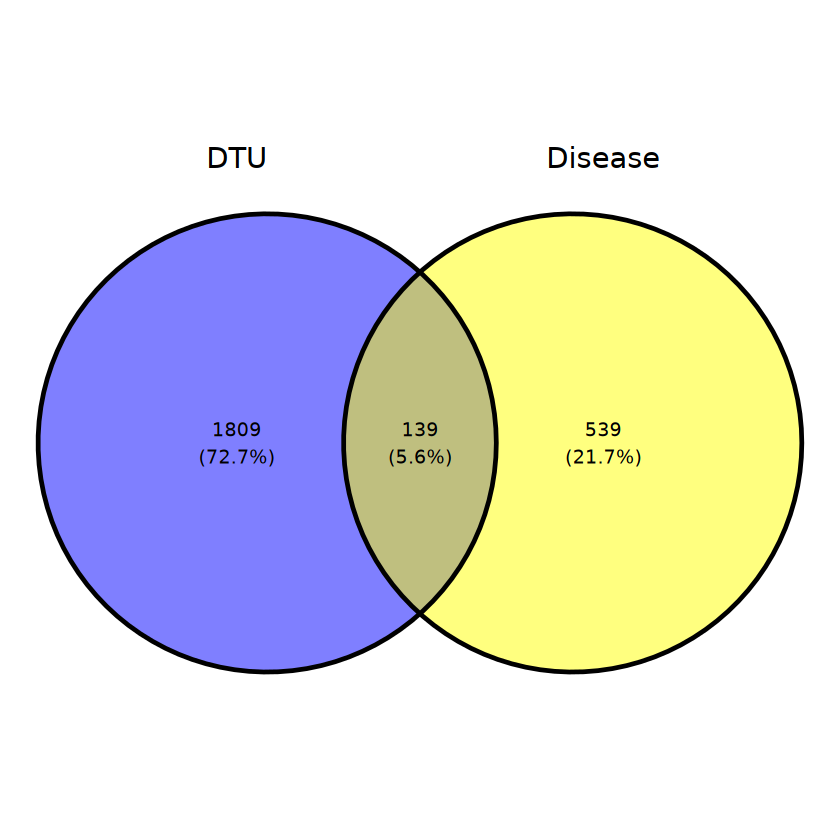

[1] "AKT3"    "ALG13"   "ASXL1"   "CAMTA1"  "CAPZB"   "DLK2"    "EIF5A"  
 [8] "GRIA3"   "HECW2"   "KCNQ2"   "MEF2C"   "MYO18A"  "NFIX"    "NPRL3"  
[15] "PDCD10"  "PFKP"    "POGZ"    "PRKAR2A" "PTPRD"   "RAI1"    "RERE"   
[22] "RORA"    "SCN8A"   "SLC35A2" "SOX5"    "THSD7A"  "TNIK"    "TTI1"   
[29] "U2AF2"   "UGGT2"   "USP9X"   "VPS54"

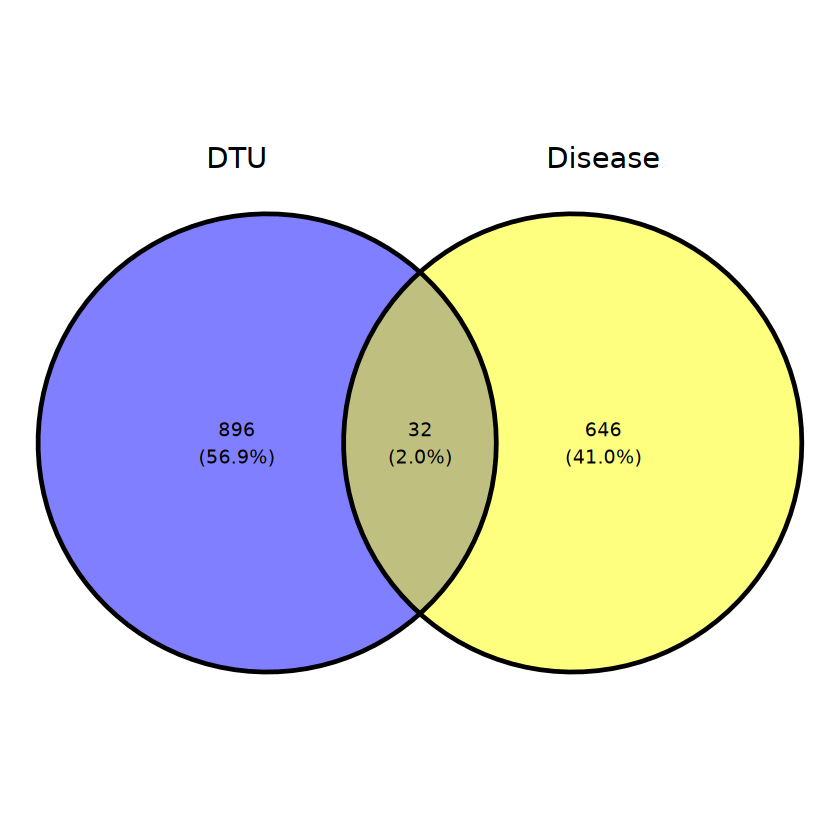

[1] "ALKBH8"   "ASXL1"    "AUTS2"    "BBS9"     "CEP63"    "CHD8"    
 [7] "COL4A3BP" "CREBBP"   "DLG4"     "ENTPD1"   "FRMPD2"   "GRIN2B"  
[13] "HERC1"    "IQSEC2"   "KCNT2"    "KMT2C"    "MARK2"    "MYO18A"  
[19] "NALCN"    "PDE10A"   "PDE4D"    "PIP5K1C"  "RARB"     "RERE"    
[25] "RFX3"     "SETBP1"   "SMARCE1"  "SPTAN1"   "SRCAP"    "TCF7L2"  
[31] "TIGD6"    "TMEM260"  "TRPM3"    "TSC1"     "UGGT2"    "USP9X"   
[37] "VPS54"    "WDR45"    "WHSC1"    "ZBTB7A"   "ZMYM2"    "ZNF532"  
[43] "ZSCAN26"

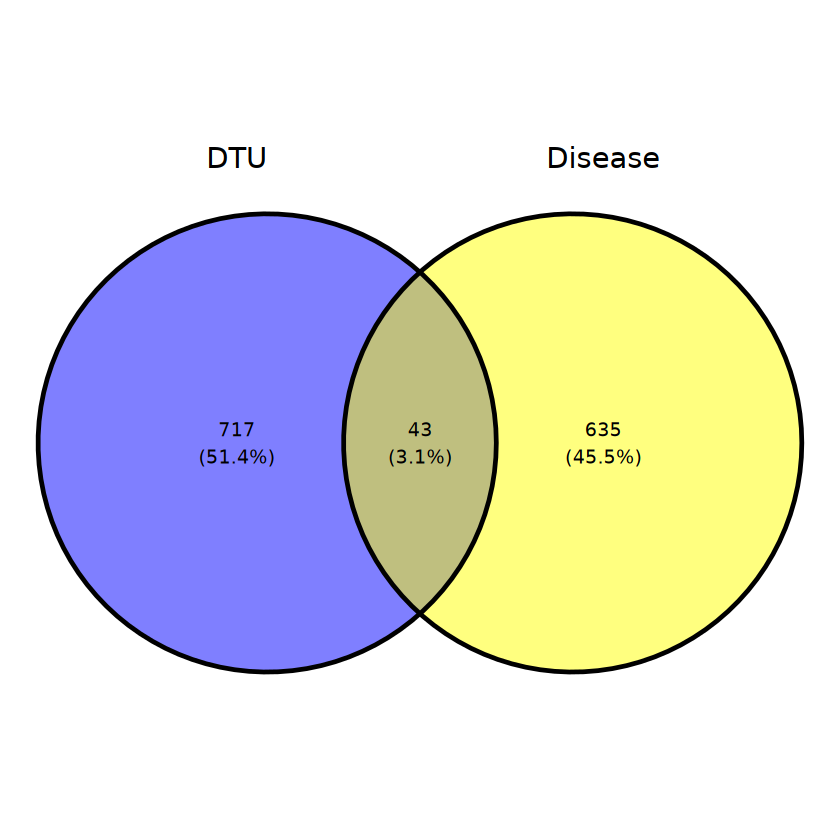

[1] "ABL1"     "ACTL6B"   "ADGRB2"   "ADNP"     "ALG13"    "AMACR"   
  [7] "ANK2"     "ANK3"     "ASB8"     "ASXL2"    "AUTS2"    "AXIN1"   
 [13] "BCL11A"   "BRPF1"    "CACNA1E"  "CAMTA1"   "CAPZB"    "CBX5"    
 [19] "CDC27"    "CDC42"    "CHD8"     "CHD9"     "CNKSR2"   "COL4A3BP"
 [25] "CREBBP"   "DLG4"     "DNM1L"    "DPF2"     "DPYSL4"   "EFTUD2"  
 [31] "EIF5A"    "EP300"    "FAM184A"  "FYTTD1"   "GFOD2"    "GNAO1"   
 [37] "GRIA3"    "HECW2"    "HERC1"    "HNRNPD"   "INHBA"    "IQSEC2"  
 [43] "KAT6B"    "KCNMA1"   "KCNQ2"    "KDM5C"    "KIF1A"    "KLHL20"  
 [49] "KMT2C"    "KRAS"     "MARK2"    "MINK1"    "MORC2"    "MYO18A"  
 [55] "MYT1L"    "NALCN"    "NRXN1"    "PAK1"     "PCBP2"    "PDE10A"  
 [61] "PDE4D"    "PDHA1"    "PDLIM3"   "PFKP"     "PGLS"     "PIK3CA"  
 [67] "PLEKHA8"  "POLR3GL"  "PRKAR1A"  "PTPRD"    "RAI1"     "RERE"    
 [73] "RFX3"     "SCN8A"    "SLC35A2"  "SMARCE1"  "SORCS1"   "SOX5"    
 [79] "SRCAP"    "SRCIN1"   "TAF1"     "TIGD6"    "TMEM106B" "TMEM161A"
 [85] "TMEM260"  "TNIK"     "TNRC6B"   "TRPM3"    "TSC1"     "U2AF2"   
 [91] "USP16"    "USP9X"    "WDR37"    "WDR45"    "WDR48"    "WHSC1"   
 [97] "ZMYM2"    "ZMYND8"   "ZNF584"   "ZSCAN26"

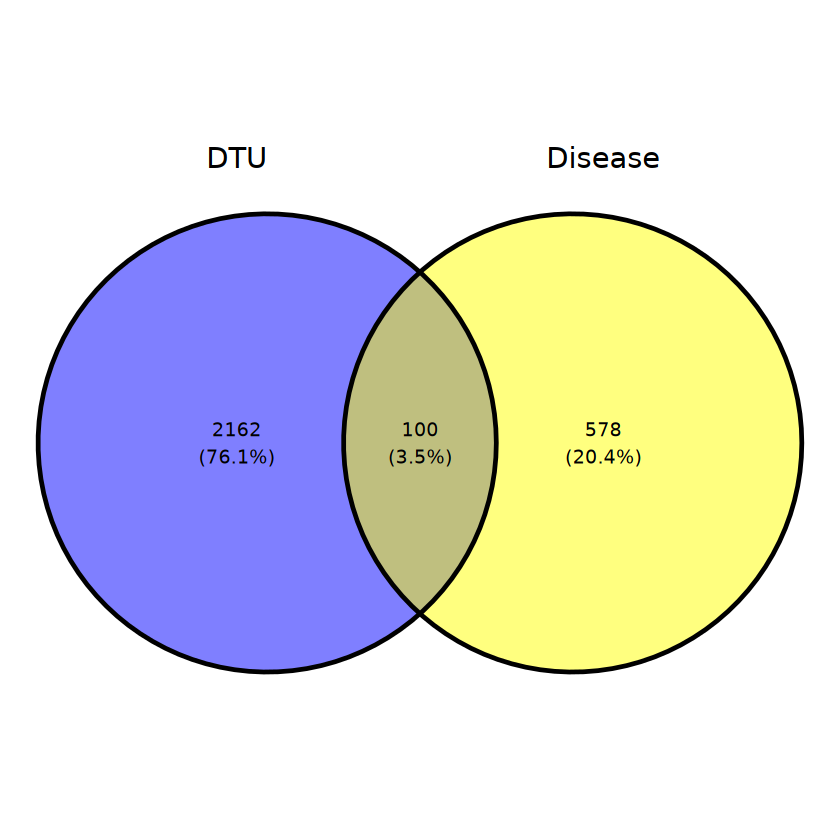

In [120]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
ggvenn(list("DTU" = unique(isosigi$gene_id),"Disease" = Dsgdf$gene_id))
hubgene = intersect(Dsgdf$gene_id,unique(isosigi$gene_id))
hubgene[order(hubgene)]

isosigi = isosigls$layer
isosigi = isosigi[isosigi$sig != "N",]
ggvenn(list("DTU" = unique(isosigi$gene_id),"Disease" = Dsgdf$gene_id))
hubgene = intersect(Dsgdf$gene_id,unique(isosigi$gene_id))
hubgene[order(hubgene)]

isosigi = isosigls$lobe
isosigi = isosigi[isosigi$sig != "N",]
ggvenn(list("DTU" = unique(isosigi$gene_id),"Disease" = Dsgdf$gene_id))
hubgene = intersect(Dsgdf$gene_id,unique(isosigi$gene_id))
hubgene[order(hubgene)]

isosigi = isosigls$subcortical
isosigi = isosigi[isosigi$sig != "N",]
ggvenn(list("DTU" = unique(isosigi$gene_id),"Disease" = Dsgdf$gene_id))
hubgene = intersect(Dsgdf$gene_id,unique(isosigi$gene_id))
hubgene[order(hubgene)]

#### Other category

In [620]:
library(readxl)
all_sheets <- read_excel("ref/human_Brain_drug_target_and_GPCR_20240826.xlsx", sheet = 1)
dggenedf1 = data.frame("gene_id" = unlist(all_sheets[,1]),"source" = "HumanGPCR","group" = "hGPCR")
dggenedf2 = data.frame("gene_id" = unlist(all_sheets[,2]),"source" = "Opentarget-Drugs","group" = "OPD")

tfgene = read.delim("ref/Macaca_fascicularis_TF.txt")
tfgenedf = data.frame("gene_id" = unique(tfgene$Symbol),"source" = "TF.guolab","group" = "TF")
spgene = read.delim("ref/splicing_factor_gene_in_macaca_fas.txt")
spgenedf = data.frame("gene_id" = unique(spgene$Symbol),"source" = "SP","group" = "SP")

rbpgene = read.csv("ref/RBPDB_v1.3.1_proteins_human_2012-11-21.csv",header = F)
rbpgenedf = data.frame("gene_id" = unique(rbpgene$V5),"source" = "RBP.ccbr","group" = "RBP")

Vipgdf = rbind(dggenedf1,dggenedf2,tfgenedf,rbpgenedf,spgenedf)
write.csv(Vipgdf,file = "ref/disease_gene/Other_gene_list_summary_24_10_30.csv",quote = F,row.names = F)

In [621]:
refgdf = rbind(Dsgdf,Vipgdf)
refgdf = refgdf[!is.na(refgdf$gene_id),]
write.csv(refgdf,file = "ref/disease_gene/Total_gene_list_summary_24_10_30.csv",quote = F,row.names = F)

In [196]:
refgdf = refgdf[!is.na(refgdf$gene_id),]
refgdf.st = refgdf %>% group_by(gene_id) %>% summarise(sn = length(source))
#refgdf.st[refgdf.st$sn > 4,]
hubgene = c('GNAO1','GRIN1','CAMTA1')
refgdf[refgdf$gene_id %in% hubgene,]

,gene_id,source,group
,<chr>,<chr>,<chr>
227,CAMTA1,NDD.Talkowski,NDD
306,GNAO1,NDD.Talkowski,NDD
335,GRIN1,NDD.Talkowski,NDD
797,CAMTA1,DDD.Retterer,DDD
858,GNAO1,DDD.Retterer,DDD
863,GRIN1,DDD.Retterer,DDD
Opentarget-Drugs288,GRIN1,Opentarget-Drugs,OPD
6641,CAMTA1,TF.guolab,TF


In [189]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
#unique(isosigi[isosigi$gene_id %in% refgdf.st[refgdf.st$sn > 1,]$gene_id,]$gene_id)
isosigi.hub = isosigi[isosigi$gene_id %in% refgdf.st$gene_id,]
unique(isosigi.hub[order(-isosigi.hub$genecount),]$gene_id)
hubgene = c('GNAO1','GRIN1','CAMTA1')

[1] "ADNP"      "AKAP11"    "ANK2"      "AUTS2"     "BCL11A"    "CAMK2B"   
 [7] "CAMTA1"    "CLTC"      "CTBP1"     "CTNNB1"    "DNM1"      "DNM1L"    
[13] "DYRK1A"    "EHMT1"     "EP300"     "ERF"       "FBXW7"     "FGFR1"    
[19] "GNAO1"     "GNB1"      "GRIA3"     "GRIN1"     "GSK3B"     "GTF3A"    
[25] "HDAC8"     "HNRNPU"    "HRAS"      "KAT6B"     "KIDINS220" "KIF1A"    
[31] "KMT2C"     "KMT2E"     "KMT5B"     "KRAS"      "MARK2"     "MBD5"     
[37] "MEF2C"     "MKX"       "MYT1L"     "NF1"       "NFE2L2"    "NFIB"     
[43] "NFIX"      "NR3C2"     "NRXN1"     "NSD1"      "PCBP2"     "PDE10A"   
[49] "PDE4D"     "PIK3CA"    "PIK3R1"    "POGZ"      "PPARD"     "PPP2CA"   
[55] "PSMC5"     "QRICH1"    "RFX3"      "RORA"      "SETBP1"    "SETD5"    
[61] "SMARCB1"   "SMARCC2"   "SMARCE1"   "SMC1A"     "SON"       "SPEN"     
[67] "SPTAN1"    "SRRM2"     "SYNCRIP"   "SYT1"      "TANC2"     "TCF12"    
[73] "TCF7L2"    "THRA"      "THRB"      "TLK2"      "TRRAP"     "TSC1"     
[79] "UBE3A"     "ZBTB20"    "ZEB2"      "ZGPAT"     "ZNF292"    "ZNF462"   
[85] "ZNF532"    "ZNF644"

[1] "SYT1"      "GNAO1"     "ZBTB20"    "FBXW7"     "SPTAN1"    "SRRM2"    
 [7] "ZEB2"      "GRIA3"     "ANK2"      "KMT2E"     "KMT2C"     "CLTC"     
[13] "ADNP"      "CAMTA1"    "PDE4D"     "SETBP1"    "DYRK1A"    "KRAS"     
[19] "POGZ"      "SETD5"     "RORA"      "TCF7L2"    "GRIN1"     "KMT5B"    
[25] "AUTS2"     "PDE10A"    "MYT1L"     "EP300"     "UBE3A"     "CTNNB1"   
[31] "SYNCRIP"   "ZNF292"    "PSMC5"     "GNB1"      "SMARCE1"   "SPEN"     
[37] "NSD1"      "KAT6B"     "THRA"      "ZNF532"    "ZNF644"    "PCBP2"    
[43] "NFIB"      "MEF2C"     "TANC2"     "DNM1L"     "HNRNPU"    "SMC1A"    
[49] "RFX3"      "SMARCC2"   "SON"       "NFE2L2"    "NR3C2"     "GSK3B"    
[55] "PPP2CA"    "SMARCB1"   "FGFR1"     "PIK3CA"    "KIF1A"     "THRB"     
[61] "TRRAP"     "TSC1"      "ZGPAT"     "EHMT1"     "PPARD"     "NFIX"     
[67] "HRAS"      "MBD5"      "NRXN1"     "PIK3R1"    "TLK2"      "ZNF462"   
[73] "MKX"       "NF1"       "QRICH1"    "HDAC8"     "MARK2"     "TCF12"    
[79] "KIDINS220" "BCL11A"    "CTBP1"     "AKAP11"    "CAMK2B"    "ERF"      
[85] "DNM1"      "GTF3A"

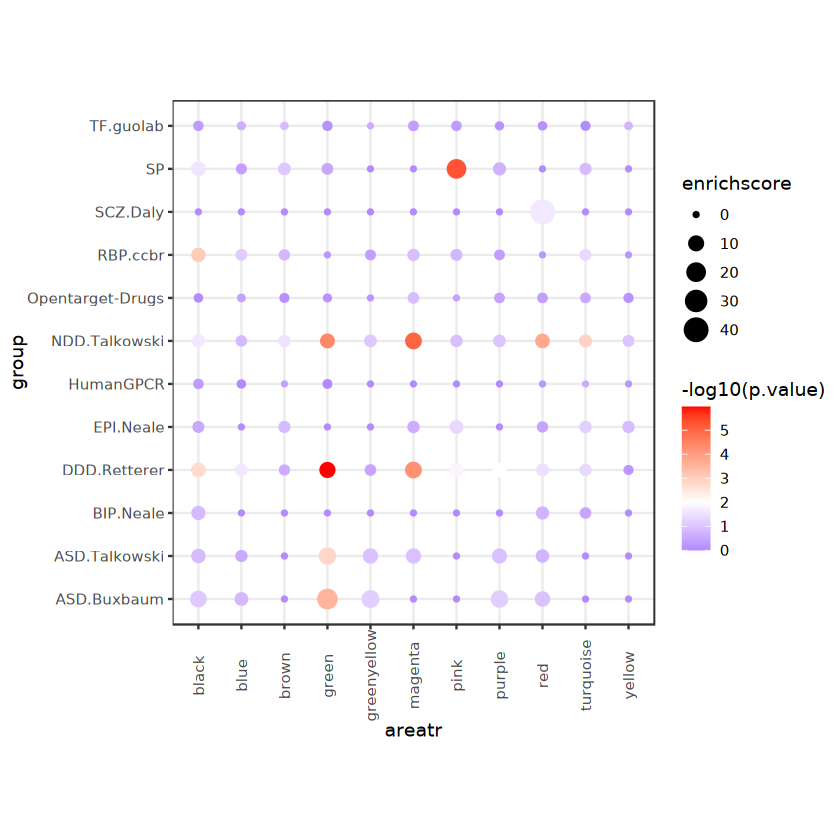

In [801]:
isosigt = NULL
isosigi = isosigls$lobe;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "lobe";isosigt = rbind(isosigt,isosigi)
isosigi = isosigls$layer;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "layer";isosigt = rbind(isosigt,isosigi)
isosigi = isosigls$subclass;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "subclass";isosigt = rbind(isosigt,isosigi)
isosigi = isosigls$class;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "class";isosigt = rbind(isosigt,isosigi)
isosigi = isosigls$subcortical;isosigi = isosigi[isosigi$sig != "N",];isosigi$areatr = "subcortical";isosigt = rbind(isosigt,isosigi)
# isosigt = unique(isosigt[,c("areatr","gene_id")])
#isosigi = isosigls$subcortical;isosigi = isosigi[isosigi$sig != "N",]
# isosigi1 = isosigls.cl$NonNeuron_NonNeuron;isosigi1 = isosigi1[isosigi1$sig != "N",];isosigi1$areatr = "NN-with"
# isosigi2 = isosigls.cl$GABA_GABA;isosigi2 = isosigi2[isosigi2$sig != "N",];isosigi2$areatr = "GABA-with"
# isosigi3 = isosigls.cl$GLU_GLU;isosigi3 = isosigi3[isosigi3$sig != "N",];isosigi3$areatr = "GLU-with"
# isosigt = rbind(isosigi1,isosigi2,isosigi3)
# isosigt = unique(isosigt[,c("areatr","gene_id")])
# isosigi = isosigls$subclass;isosigi = isosigi[isosigi$sig != "N",]
# isosigt = rbind(isosigi[,c("areatr","gene_id")],isosigt)
#isosigt = isosigt %>% group_by(gene_id,transcript_id) %>% filter(length(unique(areatr)) == 1)
#isosigt = isosigi

isosigt = netinfo.iso
colnames(isosigt)[2] = "areatr"
isosigt = isosigt[isosigt$areatr != "grey",]

# isosigt = isosigls$subclass;isosigt = isosigt[isosigt$sig != "N",];
#isosigt = isosigt %>% group_by(gene_id,transcript_id,sig) %>% filter(length(unique(areatr)) == 1)
#isosigt = subcldf
areatrs = unique(isosigt$areatr)

FishEnrich = function(geneset,funcset,total_genen){
    drugovl = intersect(unique(funcset),geneset)
    geneset_size <- length(geneset)    # 感兴趣的基因集大小
    functional_category_size <- length(unique(funcset))  # 特定功能类别中的基因总数
    both <- length(drugovl)  # 两个集合都包含的基因数量
    total_genes <- 20000  # 整个基因组中的基因总数

    contingency_table <- matrix(c(both, geneset_size - both, 
                              functional_category_size - both, 
                              total_genes - (geneset_size + functional_category_size - both)), 
                            nrow = 2)

    # 进行Fisher精确检验
    fisher_test_result <- fisher.test(contingency_table)
    # 输出p值
    p_value <- fisher_test_result$p.value

    # 计算富集分数（Enrichment Ratio），这通常是感兴趣的基因集中具有特定功能的基因比例与整个基因组中该功能基因比例的比值
    enrichment_ratio <- (both / geneset_size) / (functional_category_size / total_genes)
    res = data.frame("p.value" = p_value,"enrichscore" = enrichment_ratio,"overlap_size" = both,
                     "term_size" = functional_category_size,"query_size" = geneset_size,
                    "overlap_ratio" = both/functional_category_size)
    return(res)
}

goana = NULL
sourceid = unique(refgdf$source)
for(i in 1:length(areatrs)){
    isosigii = isosigt[isosigt$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    for(j in 1:length(sourceid)){
        refgene = unique(refgdf[refgdf$source == sourceid[j],]$gene_id)
        goanai = FishEnrich(hubgene,refgene,20000)
        goanai$group = sourceid[j]
        goanai$areatr = areatrs[i]
        goana = rbind(goana,goanai)
    }
}
ph = ggplot(goana,aes(x = areatr,y = group, color = -log10(p.value),size = enrichscore)) + geom_point() + theme_bw() + 
theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = 2) + coord_fixed()
ph

In [639]:
hubgene = isosigt[isosigt$areatr == "green",]$gene_id
refgene = refgdf[refgdf$source == "ASD.Buxbaum",]$gene_id
hubgene
refgene
intersect(hubgene,refgene)

[1] "ADNP"            "ARL2BP"          "ATP5S"           "BambuGene113631"
 [5] "BCL11A"          "BTRC"            "C1H1orf123"      "CAMLG"          
 [9] "CCDC12"          "CHD5"            "CHD5"            "CMC2"           
[13] "CMC2"            "COPS5"           "COPS5"           "CTBP1"          
[17] "CTNNB1"          "DNAJA2"          "DNM1L"           "DNM1L"          
[21] "DTX3"            "EMC7"            "EMC7"            "FEZ1"           
[25] "GDAP1L1"         "GLS"             "GPR137"          "INTS1"          
[29] "KCNAB2"          "KIDINS220"       "LOC102144989"    "LOC107128490"   
[33] "LOC107128490"    "LOC107130874"    "MFN2"            "MKKS"           
[37] "MOBP"            "MPC1"            "MRPS36"          "NCOA2"          
[41] "NRSN1"           "NRSN1"           "NUDC"            "OLA1"           
[45] "PACSIN1"         "PCNP"            "PEX5L"           "PITHD1"         
[49] "PLEKHA6"         "POP5"            "POP7"            "PPP1R7"         
[53] "SEPT11"          "SEPT11"          "SEPT7"           "SEPT7"          
[57] "SMARCC2"         "SOD2"            "THRA"            "THRA"           
[61] "TMEM50B"         "UBE3A"           "UBXN1"           "UCHL5"          
[65] "YDJC"

[1] "AP2S1"   "ARID1B"  "KMT2C"   "DPYSL2"  "WAC"     "CHD8"    "ADNP"   
 [8] "RAI1"    "KMT5B"   "FOXP1"   "ASH1L"   "KDM5B"   "DNMT3A"  "BCL11A" 
[15] "MED13L"  "KDM6B"   "SCN2A"   "POGZ"    "ANK2"    "GIGYF1"  "TLK2"   
[22] "MKX"     "SLC6A1"  "DYRK1A"  "SHANK2"  "GABRB3"  "MAP1A"   "ANKRD11"
[29] "CTNNB1"  "SETD5"   "SIN3A"   "DSCAM"   "PTEN"    "CHD2"    "DEAF1"  
[36] "TBL1XR1" "NRXN1"   "SRPRA"   "KCNQ3"   "MYT1L"   "PAX5"    "DYNC1H1"
[43] "SYNGAP1" "RORB"    "MBD5"    "SHANK3"  "GRIN2B"

[1] "ADNP"   "BCL11A" "CTNNB1"

[1] 2
[1] 0
[1] 10
[1] 0


No results to show
Please make sure that the organism is correct or set significant = FALSE



[1] 3
[1] 0
[1] 0
[1] 0
[1] 5
[1] 0


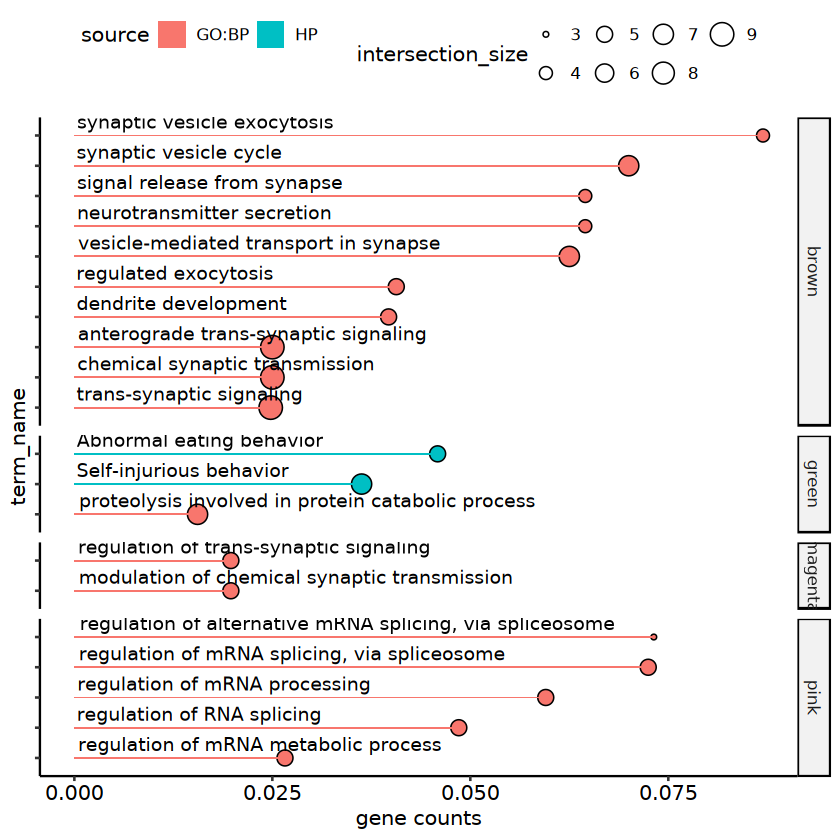

In [619]:
areatrs = unique(isosigt$areatr)
godf = NULL
for(i in 1:length(areatrs)){
    isosigii = isosigt[isosigt$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    godfi = tryCatch(MyGOCal(hubgene,10),error = function(e) 0)
    if(!is.null(nrow(godfi))){
        if(nrow(godfi) > 0){
            godfi$areatr = areatrs[i]
            godf = rbind(godf,godfi)
        }
    }
}
pgi = ggplot(godf,
               aes(x = gene_ratio, y=term_name,fill = source)) + 
        geom_point(aes(size = intersection_size),shape = 21) +
        geom_bar(stat = "identity",width = 0.03) +
        geom_text(aes(label = term_name,x = 0),hjust = -0.01,vjust = -0.5) +
 #       scale_fill_viridis(direction = 1,option = "A") +
        #scale_fill_distiller(direction = 1,palette = "Greens") +
    # scale_y_discrete(labels = rev(unique(godftf$term_name))) +
        facet_grid(areatr~.,scales = "free",space = "free") + 
        xlab("gene counts") +
        theme_pubr() + theme(legend.position = "top",axis.text.y = element_blank())
#        ggtitle(mytitle)
pgi

,p.value,enrichscore,overlap_size,term_size,query_size,overlap_ratio,group,areatr
,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<chr>,<chr>
1,0.0143627245,3.494304,5,82,349,0.06097561,ASD.Talkowski,ASC
2,0.0003391613,2.696781,16,340,349,0.04705882,NDD.Talkowski,ASC
3,1.0000000000,0.000000,0,10,349,0.00000000,SCZ.Daly,ASC
4,0.4098426203,0.000000,0,87,349,0.00000000,BIP.Neale,ASC
5,0.0023180433,2.938800,10,195,349,0.05128205,EPI.Neale,ASC
6,0.0090092320,4.877157,4,47,349,0.08510638,ASD.Buxbaum,ASC


    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.000000 0.004773 0.008554 0.011494 0.100000 

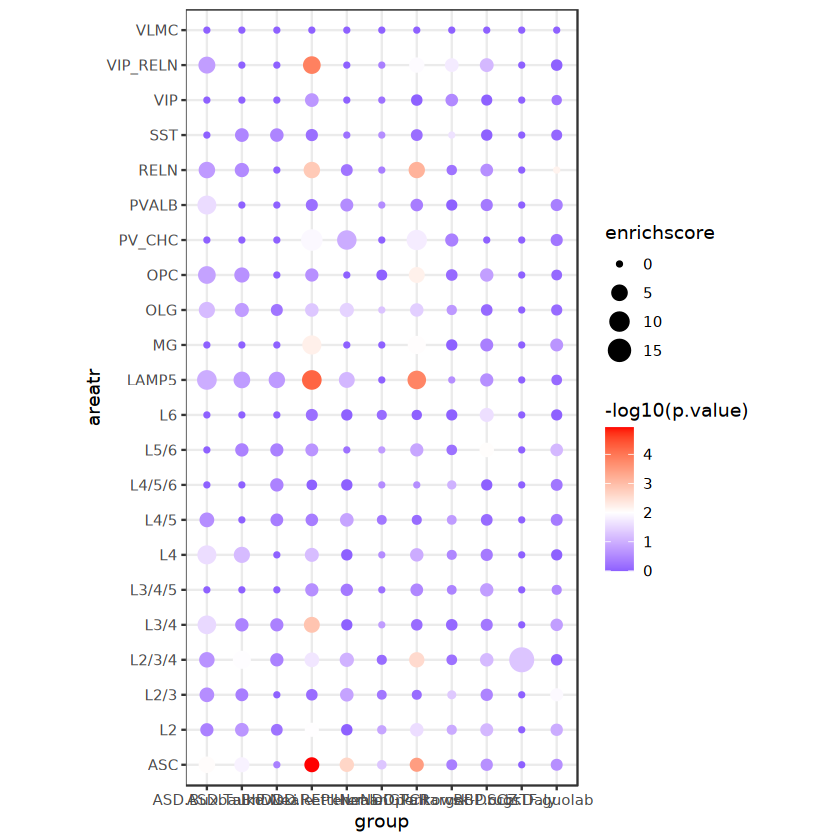

In [214]:
head(goana)
summary(goana$overlap_ratio)
#goana[goana$overlap_ratio > 0.1,]
goana$fdr = p.adjust(goana$`p.value`)

ph = ggplot(goana,aes(y = areatr,x = group, color = -log10(p.value),size = enrichscore)) + geom_point() + theme_bw() + 
scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = 2) + coord_fixed()
ph

In [ ]:
ggexport(ph,filename = "result/figure4/subclass_dtu_enrich_analysis_24_10_30.pdf",width = 8,height = 4)

#### WGCNA calculate

In [219]:
BiocManager::install("WGCNA")   # WGCNA is available on CRAN
library(WGCNA)

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.r-project.org

Bioconductor version 3.18 (BiocManager 1.30.22), R 4.3.1 (2023-06-16)

Installing package(s) 'WGCNA'

also installing the dependencies 'impute', 'preprocessCore', 'GO.db'


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Old packages: 'abind', 'amap', 'AnnotationHub', 'ape', 'aplot', 'arrow',
  'askpass', 'backports', 'bambu', 'beachmat', 'BiocFileCache', 'BiocManager',
  'BiocVersion', 'bit', 'bit64', 'bitops', 'boot', 'brio', 'broom',
  'broom.helpers', 'BSgenome', 'bslib', 'checkmate', 'cli', 'clock', 'cluster',
  'clusterSim', 'codetools', 'colorspace', 'commonmark', 'corrplot', 'cpp11',
  'crayon', 'credentials', 'crul', 'curl', 'data.table', 'dbscan',
  'dendextend', 'DESeq2', 'digest', 'diptest', 'dotCall64', 'downlit', 'dqrng',
  'e1071', 'edgeR', 'emmea

##### Isoform usage

In [608]:
#construct data structure
# isodf = fsraw.cor[fsraw.cor$class != "",] %>% group_by(gene_id,transcript_id,subclass) %>% summarise(count = length(readid))
# isodf = isodf %>% group_by(gene_id,subclass) %>% mutate(genecount = sum(count),relative = count/genecount)
# isodf = isodf %>% group_by(gene_id,transcript_id) %>% mutate(meanrelative = mean(relative),)
# isodf = isodf[isodf$genecount > 20,]
isosigi = isosigls$subclass
hubtrans = isosigi[isosigi$sig != "N",]$transcript_id
for(i in length(isosigls.cl)){
    isosigi = isosigls.cl[[i]]
    hubtransi = isosigi[isosigi$sig != "N",]$transcript_id
    hubtrans = c(hubtrans,hubtransi)
}
isosigi = isosigls$subclass
isodf = isosigi[isosigi$transcript_id %in% hubtrans,]
isodf$transcript_id = paste0(isodf$gene_id, "-", isodf$transcript_id)
isodf = isodf[isodf$genecount > 20 & isodf$count > 5,]
#isodf = isodf %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isodat = dcast(isodf,areatr~transcript_id,value.var = "relative",fun.aggregate = sum)
rownames(isodat) = isodat$areatr;isodat = isodat[,-1]
#isodat = isodat[rownames(isodat) %in% cellan[cellan$class == "GLU",]$subclass,]
isodatf = isodat[ ,colSums(isodat > 0) > 15]
isodatf = isodatf[rowSums(isodatf > 0) > 400,]
rownames(isodatf)
dim(isodat)
dim(isodatf)

[1] "ASC"      "L2"       "L2/3"     "L2/3/4"   "L3/4"     "L3/4/5"  
 [7] "L4"       "L4/5"     "L4/5/6"   "L5/6"     "L6"       "LAMP5"   
[13] "OLG"      "OPC"      "PVALB"    "RELN"     "SST"      "VIP"     
[19] "VIP_RELN"

[1]   22 3564

[1]  19 816

   Power SFT.R.sq  slope truncated.R.sq mean.k. median.k. max.k.
1      1   0.4360  1.780          0.938  251.00   245.000  351.0
2      2   0.0221  0.172          0.755  114.00   106.000  208.0
3      3   0.2420 -0.418          0.706   62.70    54.100  142.0
4      4   0.7330 -0.783          0.838   38.80    30.500  106.0
5      5   0.8890 -0.931          0.903   26.10    18.400   83.1
6      6   0.9540 -1.010          0.948   18.60    11.800   67.6
7      7   0.9630 -1.060          0.953   14.00     7.890   56.6
8      8   0.9770 -1.070          0.971   10.90     5.490   48.8
9      9   0.9830 -1.110          0.982    8.78     3.960   43.3
10    10   0.9880 -1.120          0.987    7.25     2.920   39.1
11    11   0.9710 -1.130          0.965    6.12     2.210   35.6
12    12   0.9890 -1.130          0.986    5.25     1.760   32.8
13    13   0.9880 -1.130          0.985    4.58     1.450   30.5
14    14   0.9850 -1.140          0.981    4.04     1.200   28.5
15    15   0.9830 -1.160 

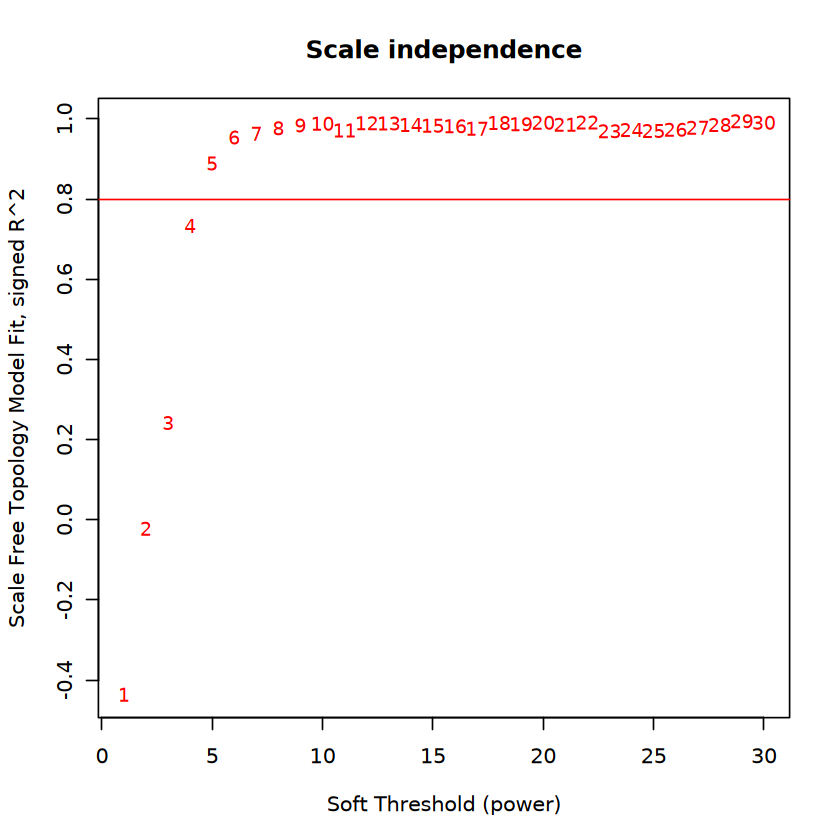

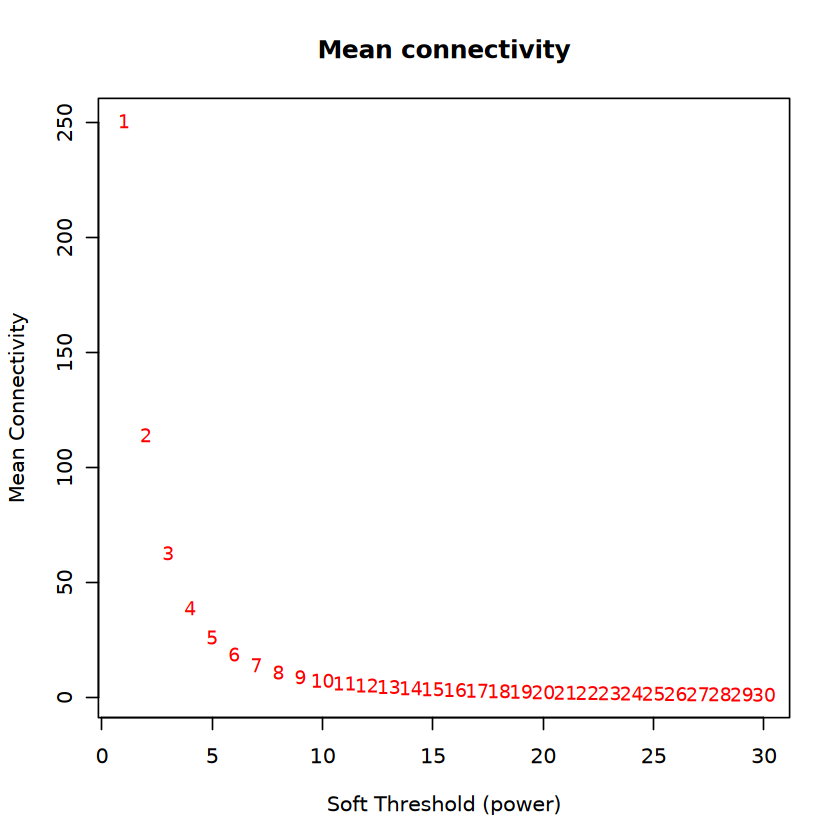

In [609]:
powers = c(seq(from = 1, to=30, by=1));
sft = pickSoftThreshold(isodatf, powerVector = powers,corFnc = cor,corOptions = list(use = 'p'),networkType = "unsigned")
# Plot the results
cex1 = 0.9;
# Scale-free topology fit index as a function of the soft-thresholding power
plot(sft$fitIndices[,1], -sign(sft$fitIndices[,3])*sft$fitIndices[,2],xlab="Soft Threshold (power)",ylab="Scale Free Topology Model Fit, signed R^2",type="n", main = paste("Scale independence"));
text(sft$fitIndices[,1], -sign(sft$fitIndices[,3])*sft$fitIndices[,2],labels=powers,cex=cex1,col="red");
# Red line corresponds to using an R^2 cut-off
abline(h=0.80,col="red")
# Mean connectivity as a function of the soft-thresholding power
plot(sft$fitIndices[,1], sft$fitIndices[,5],xlab="Soft Threshold (power)",ylab="Mean Connectivity", type="n",main = paste("Mean connectivity"))
text(sft$fitIndices[,1], sft$fitIndices[,5], labels=powers, cex=cex1,col="red")

TOM calculation: adjacency..
..will not use multithreading.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.


dynamicMods
  0   1   2   3   4   5   6   7   8   9  10  11 
 86 124  99  95  75  65  61  49  48  45  37  32 

dynamicColors
      black        blue       brown       green greenyellow        grey 
         49          99          95          65          32          86 
    magenta        pink      purple         red   turquoise      yellow 
         45          48          37          61         124          75 

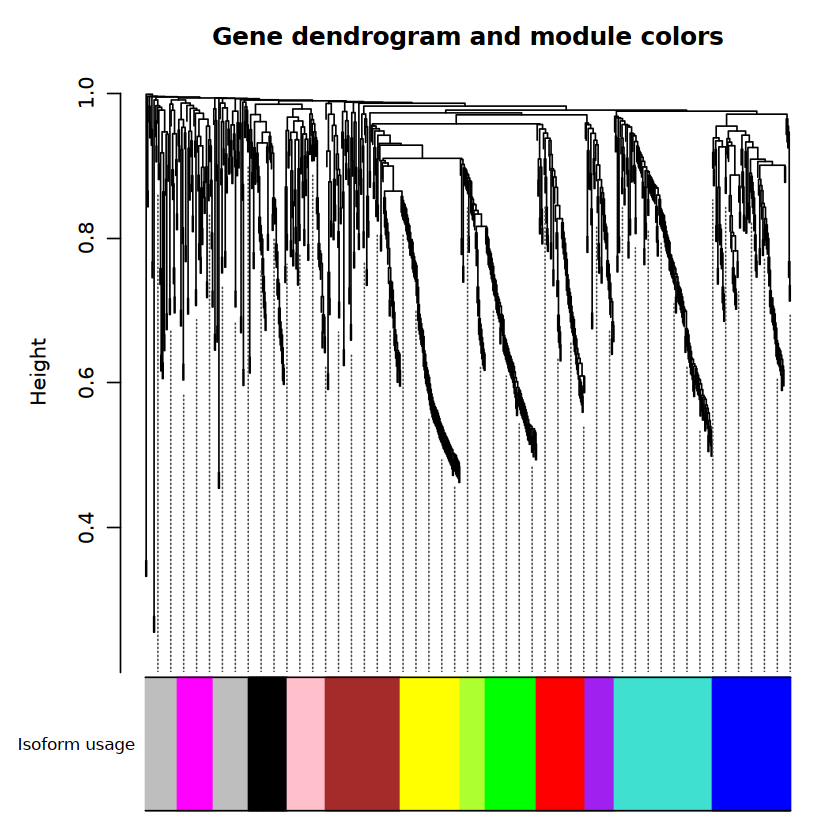

In [612]:
library(flashClust)
TOMType = "unsigned"
softPower = 7;
adjacency = adjacency(isodatf, power = softPower)
TOM= TOMsimilarityFromExpr(isodatf,networkType = "unsigned", TOMType = "unsigned", power = softPower);
colnames(TOM) = rownames(TOM) = colnames(isodatf)
dissTOM = 1-TOM
geneTree = flashClust(as.dist(dissTOM),method="average");
minModuleSize = 20;
dynamicMods = cutreeDynamic(dendro = geneTree,  method="tree", minClusterSize = minModuleSize);
table(dynamicMods)
dynamicColors = labels2colors(dynamicMods)
table(dynamicColors)
plotDendroAndColors(geneTree, dynamicColors, "Isoform usage", dendroLabels = FALSE, hang = 0.03, addGuide = TRUE, 
                    guideHang = 0.05, main = "Gene dendrogram and module colors")
#plot the resulting clustering tree (dendrogram)

In [613]:
#Create the dataframe since the beginning
netinfo.iso = data.frame(trans_id = colnames(isodatf),
                       moduleColor = dynamicColors)
netinfo.iso$gene_id = MySplit(netinfo.iso$trans_id,"-",1)
netinfo.iso[netinfo.iso$gene_id == "ARPP19",]
netinfo.iso[netinfo.iso$gene_id == "DDRGK1",]
netinfo.iso[netinfo.iso$gene_id == "ARPP21",]
netinfo.iso[netinfo.iso$gene_id == "MYL6",]
netinfo.iso[netinfo.iso$gene_id == "NTRK2",]

,trans_id,moduleColor,gene_id
,<chr>,<chr>,<chr>
59,ARPP19-NM_001283415.1,grey,ARPP19
60,ARPP19-XM_015452432.1,grey,ARPP19


,trans_id,moduleColor,gene_id
,<chr>,<chr>,<chr>
215,DDRGK1-DDRGK1-WeiLab-1,grey,DDRGK1
216,DDRGK1-XM_005568473.2,grey,DDRGK1


,trans_id,moduleColor,gene_id
,<chr>,<chr>,<chr>
61,ARPP21-XM_005545480.2,grey,ARPP21
62,ARPP21-XM_005545496.2,black,ARPP21
63,ARPP21-XM_015444950.1,grey,ARPP21
64,ARPP21-XM_015444956.1,black,ARPP21


,trans_id,moduleColor,gene_id
,<chr>,<chr>,<chr>
481,MYL6-MYL6-WeiLab-1,brown,MYL6
482,MYL6-MYL6-WeiLab-2,brown,MYL6


,trans_id,moduleColor,gene_id
,<chr>,<chr>,<chr>
514,NTRK2-XM_005582045.2,magenta,NTRK2
515,NTRK2-XM_005582051.2,magenta,NTRK2


      areatr
sig    ASC L2 L2/3 L2/3/4 L3/4 L3/4/5 L4 L4/5 L4/5/6 L5/6 L6 LAMP5 MG OLG OPC
  Down  11  2    0      5    0      4  1    0      0    1  2     2  2   2   7
  N     30 44   47     34   47     11 46   47     48   47 44    43 10  46  34
  Up     7  2    1      9    1     20  1    1      0    0  2     3  0   0   7
      areatr
sig    PV_CHC PVALB RELN SST VIP VIP_RELN VLMC
  Down      1     0    1   2   1        5    0
  N         5    46   45  46  41       40    4
  Up        0     2    2   0   5        3    0

Warning message:
"The input is a data frame-like object, convert it to a matrix."


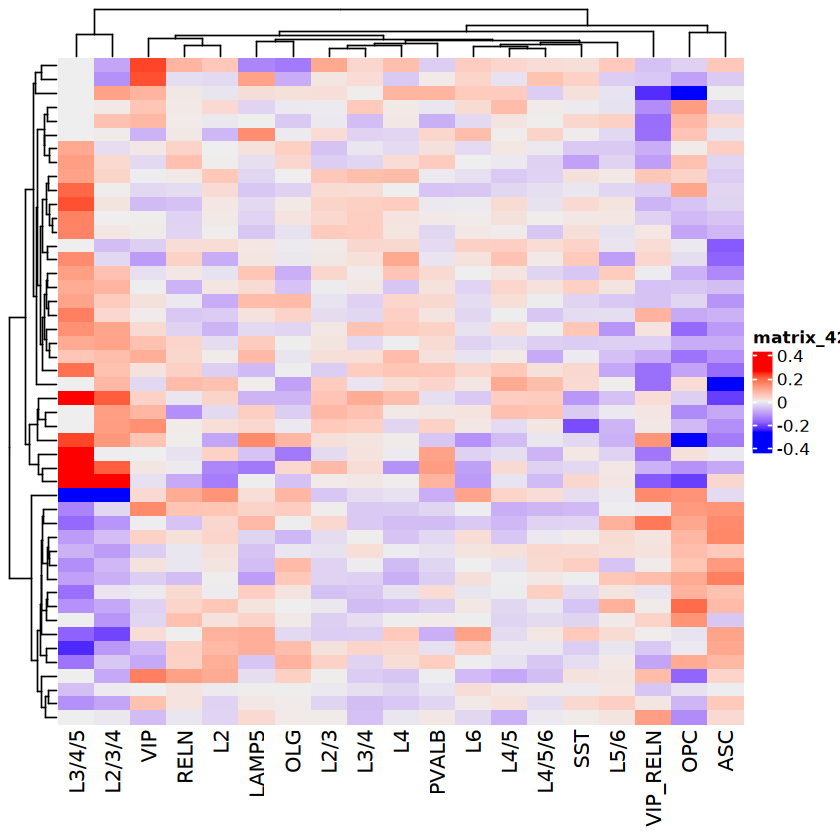

In [635]:
hubtrans = netinfo.iso[netinfo.iso$moduleColor == "pink",]$trans_id
hubgenes = unique(netinfo.iso[netinfo.iso$moduleColor == "green",]$gene_id)
isosigi = isosigls$subclass
isosigi$trans_id = paste0(isosigi$gene_id,"-",isosigi$transcript_id)
isosigi = isosigi[isosigi$trans_id %in% hubtrans,]
table(isosigi[,c("sig","areatr")])
isosigimx = dcast(isosigi[isosigi$areatr %in% rownames(isodatf),],trans_id~areatr,value.var = "dr",fun.aggregate = sum)
rownames(isosigimx) = isosigimx$trans_id;isosigimx = isosigimx[,-1]
Heatmap(isosigimx,show_row_names = F)
#ggplot(isosigi,aes(x = areatr,y = dr)) + geom_boxplot()

In [626]:
hubgenes = hubgenes[hubgenes %in% refgdf$gene_id]
isosigi = isosigls$subclass
fsraw.cor$areatr = fsraw.cor$subclass
pcls = list()
for(i in 1:length(hubgenes)){
    geneex = hubgenes[i]
    pcls[[i]] = IsoformReadPlotTotal(fsraw.cor,isosigi,longbed,gtf,geneex,NULL,TRUE,NULL)
}
ggexport(pcls,filename = "result/figure4/WGCNA_Module_hubgreen_gene_readsplice_case_24_10_31.pdf",width = 5, height = 10)

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


In [627]:
hubgenes

[1] "ADGRB3"  "ZBTB20"  "NTRK2"   "SYNE1"   "SYT1"    "RCAN2"   "GRIA3"  
 [8] "PAK1"    "FBXW7"   "RNPC3"   "CAPZB"   "ZEB2"    "CCDC88A" "GNAO1"

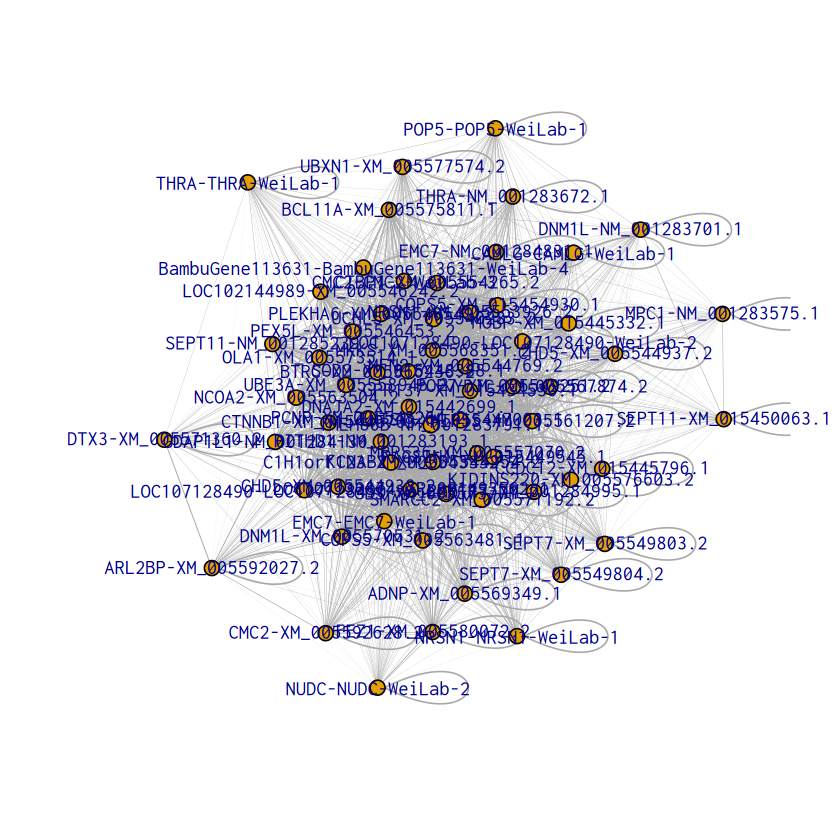

In [617]:
# 选择模块，例如："turquoise"
library(igraph)
module = "green"
inModule = which(dynamicColors == module)
# 提取模块中的基因名
modGenes = colnames(isodatf)[inModule]
#modGenes
# 提取模块内基因的邻接矩阵
modAdjacency = adjacency(isodatf[,modGenes], power = softPower)
# 创建图对象
g <- graph.adjacency(modAdjacency, mode = "undirected", weighted = TRUE)
plot(g, vertex.label = V(g)$name, vertex.size = 5, edge.width = E(g)$weight)

In [618]:
# 假设MEs是模块特征基因的表达矩阵，datExpr是所有基因的表达矩阵
# 计算MM
#MEs = isodatf[,modGenes]
# geneModuleMembership = cor(isodatf, MEs, use = "p")
# geneModuleMembership
# # 计算GS，这里以某个表型变量trait为例
# geneTraitSignificance = cor(isodatf, c(0,rep(1,16)), use = "p")
# geneTraitSignificance
# # 设置MM和GS的阈值
# mmThreshold = 0.8
# gsThreshold = 0.8

# 筛选核心基因
coreGenes = chooseTopHubInEachModule(
   isodatf, 
   dynamicColors, 
   omitColors = "grey", 
   power = 20, 
   type = "unsigned")
coreGenes

black                       blue 
     "MXI1-XM_005566405.2"      "HAX1-XM_005541672.2" 
                     brown                      green 
    "CLCN3-XM_005556276.2"     "INTS1-XM_015447003.1" 
               greenyellow                    magenta 
   "PITPNB-XM_005567707.2"     "GNAO1-XM_005591961.1" 
                      pink                     purple 
      "QKI-XM_015448512.1"    "NDUFS2-XM_005541198.2" 
                       red                  turquoise 
"C6H5orf24-XM_005557806.2"     "MEGF8-XM_015442051.1" 
                    yellow 
  "FAM109B-XM_005567113.2"

In [822]:
wgcnasum = list("isodatf" = isodatf,"TOM" = TOM,"genetree" = geneTree,"netinfo.iso" = netinfo.iso)
qsave(wgcnasum,file = "result/figure4/WGCNA_df_24_11_06.qs")

##### Gene express

In [ ]:
#construct data structure
isodf = fsraw.cor[fsraw.cor$class != "",] %>% group_by(gene_id,transcript_id,subclass) %>% summarise(count = length(readid))
isodf = isodf %>% group_by(gene_id,subclass) %>% mutate(genecount = sum(count),relative = count/genecount)
isodf = isodf[isodf$genecount > 20,]
isosigi = isosigls$subclass
isodf = isodf[isodf$transcript_id %in% isosigi[isosigi$sig != "N",]$transcript_id,]
isodf$transcript_id = paste0(isodf$gene_id, "-", isodf$transcript_id)
isodf = isodf %>% group_by(gene_id,transcript_id) %>% mutate(meanrelative = mean(relative))
isodf = isodf %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isodat = dcast(isodf,subclass~transcript_id,value.var = "relative",fun.aggregate = sum)
rownames(isodat) = isodat$subclass;isodat = isodat[,-1]
isodatf = isodat[ ,colSums(isodat > 0) > 15]
isodatf = isodatf[rowSums(isodatf > 0) > ncol(isodatf)*(3/4),]
dim(isodat)
dim(isodatf)

In [ ]:
powers = c(seq(from = 1, to=30, by=2));
sft = pickSoftThreshold(isodatf, powerVector = powers,corFnc = cor,corOptions = list(use = 'p'),networkType = "unsigned")
# Plot the results
cex1 = 0.9;
# Scale-free topology fit index as a function of the soft-thresholding power
plot(sft$fitIndices[,1], -sign(sft$fitIndices[,3])*sft$fitIndices[,2],xlab="Soft Threshold (power)",ylab="Scale Free Topology Model Fit, signed R^2",type="n", main = paste("Scale independence"));
text(sft$fitIndices[,1], -sign(sft$fitIndices[,3])*sft$fitIndices[,2],labels=powers,cex=cex1,col="red");
# Red line corresponds to using an R^2 cut-off
abline(h=0.80,col="red")
# Mean connectivity as a function of the soft-thresholding power
plot(sft$fitIndices[,1], sft$fitIndices[,5],xlab="Soft Threshold (power)",ylab="Mean Connectivity", type="n",main = paste("Mean connectivity"))
text(sft$fitIndices[,1], sft$fitIndices[,5], labels=powers, cex=cex1,col="red")

### Calculate jaccard score

In [173]:
#jaccard score between module and layer
MyJaccard = function(genels1,genels2){
    calculate_jaccard <- function(list1, list2) {
      intersection <- length(intersect(list1, list2))
      union <- length(union(list1, list2))
      jaccard_score <- intersection / union
      return(jaccard_score)
    }
    num_groups1 = length(genels1)
    num_groups2 = length(genels2)
    jaccard_matrix <- matrix(0, nrow = num_groups1, ncol = num_groups2)
    
    for (i in 1:num_groups1) {
      for (j in 1:num_groups2) {
        jaccard_matrix[i, j] <- calculate_jaccard(genels1[[i]], genels2[[j]])
      }
    }
    rownames(jaccard_matrix) <- names(genels1)
    colnames(jaccard_matrix) <- names(genels2)
    return(jaccard_matrix)
}
  MyJaccarddf = function(isosig1, isosig2){
    sigglscl = list()
    areatrs = unique(isosig1$areatr)
    for (i in 1:length(areatrs)) {
      sigglscli = isosig1[isosig1$sig!="N" & isosig1$sig != "Y" &
                            isosig1$areatr == areatrs[i],]
      sigglscl[[i]] = unique(paste0(sigglscli$transcript_id,"-",sigglscli$sig))
    }
    names(sigglscl) = areatrs
    
    sigglscl2 = list()
    areatrs = unique(isosig2$areatr)
    for (i in 1:length(areatrs)) {
      sigglscl2i = isosig2[isosig2$sig!="N" & isosig2$sig != "Y" &
                            isosig2$areatr == areatrs[i],]
      sigglscl2[[i]] = unique(paste0(sigglscl2i$transcript_id,"-",sigglscl2i$sig))
    }
    names(sigglscl2) = areatrs
    
    subclcor = MyJaccard(sigglscl,sigglscl2)
    subclcor[subclcor == 1] = NA
    return(subclcor)
  }
  MyJaccarddf2 = function(isosigls.cl, isosig2){
    sigglscl = list()
    for (i in 1:length(isosigls.cl)) {
      sigglscli = isosigls.cl[[i]][isosigls.cl[[i]]$sig!="N" &
                                     isosigls.cl[[i]]$sig != "Y",]
      sigglscl[[i]] = unique(paste0(sigglscli$transcript_id,"-",sigglscli$sig))
    }
    names(sigglscl) = names(isosigls.cl)
    
    sigglscl2 = list()
    areatrs = unique(isosig2$areatr)
    for (i in 1:length(areatrs)) {
      sigglscl2i = isosig2[isosig2$sig!="N" & isosig2$sig != "Y" &
                             isosig2$areatr == areatrs[i],]
      sigglscl2[[i]] = unique(paste0(sigglscl2i$transcript_id,"-",sigglscl2i$sig))
    }
    names(sigglscl2) = areatrs
    
    subclcor = MyJaccard(sigglscl,sigglscl2)
    subclcor[subclcor == 1] = NA
    return(subclcor)
  }


,Var1,Var2,value
,<fct>,<fct>,<dbl>
1,L2,l1,0.035846724
2,L2/3,l1,0.014473684
3,L2/3/4,l1,0.028714107
4,L3/4,l1,0.012784091
5,L3/4/5,l1,0.002824859
6,L4,l1,0.021739130


file saved to result/figure4/layer_subclass_dtu_jacardscore_24_05_02.pdf



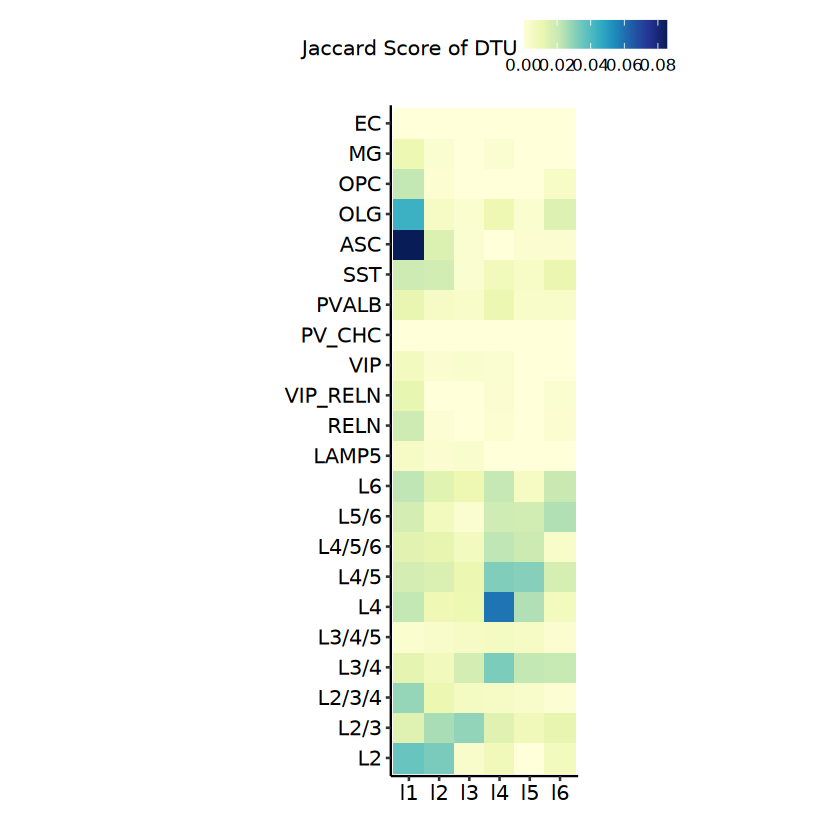

In [521]:
isosigi = rbind(isosigls$subclass,isosigls.cl$GLU_GLU,isosigls.cl$GABA_GABA,isosigls.cl$NonNeuron_NonNeuron)

mjc = MyJaccarddf(isosigi,isosigls$layer)
library(RColorBrewer)
mjc = mjc[suborder,paste0("l",1:6)]
mjcl = melt(mjc)
#mjcht = Heatmap(mjc,col =  colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100),cluster_columns = F,
#                cluster_rows = F,name = "Jaccard score\n by DTUs")
#mjcht
#ggexport(mjcht,filename = "result/figure4/iso_sig_subclass_layer_jaccard_heatmap_24_04_14.pdf", width = 5,height = 5)
head(mjcl)
p = ggplot(mjcl[as.character(mjcl$Var1) != "VLMC",],aes(x = Var2,y = Var1,fill = value)) + geom_tile() +
theme_pubr() + scale_fill_gradientn(colors = colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100)) + coord_fixed() + xlab("") + ylab("") + 
labs(fill = "Jaccard Score of DTU")
p
ggexport(p,filename = "result/figure4/layer_subclass_dtu_jacardscore_24_05_02.pdf",width = 5,height = 5)

,Var1,Var2,value
,<fct>,<fct>,<dbl>
1,L2,l1,0.035846724
2,L2/3,l1,0.014473684
3,L2/3/4,l1,0.028714107
4,L3/4,l1,0.012784091
5,L3/4/5,l1,0.002824859
6,L4,l1,0.021739130


file saved to result/figure4/lobe_subclass_dtu_jacardscore_24_05_02.pdf



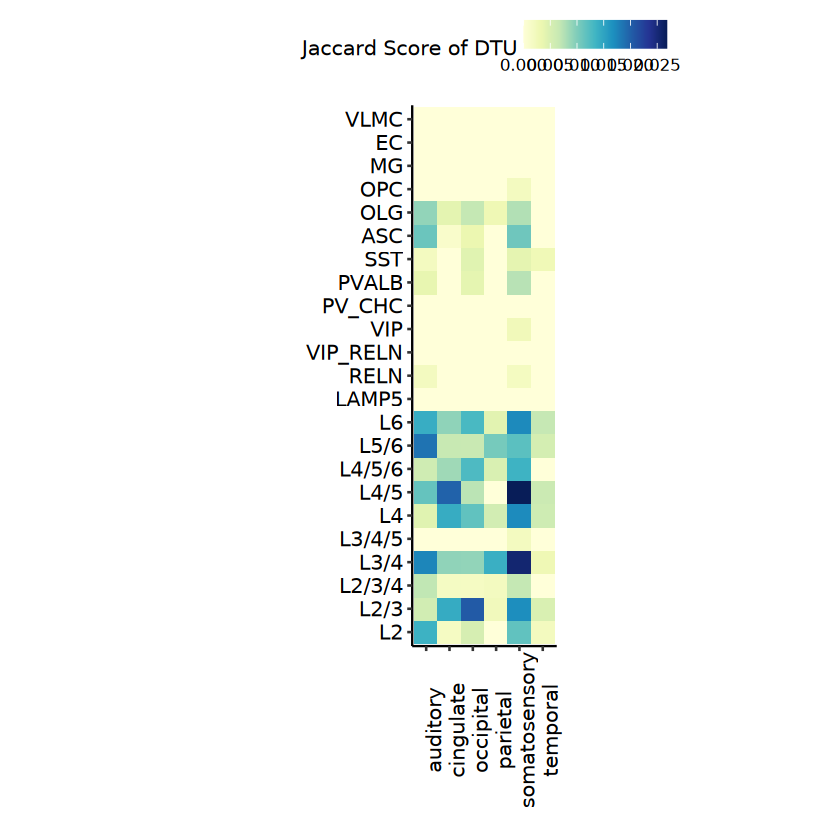

In [522]:
mjc = MyJaccarddf(isosigi,isosigls$lobe)
library(RColorBrewer)
mjc = mjc[suborder,]
mjclb = melt(mjc)
#mjcht = Heatmap(mjc,col =  colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100),cluster_columns = F,
#                cluster_rows = F,name = "Jaccard score\n by DTUs")
#mjcht
#ggexport(mjcht,filename = "result/figure4/iso_sig_subclass_layer_jaccard_heatmap_24_04_14.pdf", width = 5,height = 5)
head(mjcl)
p2 = ggplot(mjclb,aes(x = Var2,y = Var1,fill = value)) + geom_tile() +
theme_pubr() + scale_fill_gradientn(colors = colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100)) + coord_fixed() + xlab("") + ylab("") + 
labs(fill = "Jaccard Score of DTU") + theme(axis.text.x = element_text(angle = 90))
p2
ggexport(p2,filename = "result/figure4/lobe_subclass_dtu_jacardscore_24_05_02.pdf",width = 5,height = 5)

In [289]:
mjc = MyJaccarddf(isosigls$layer,isosigls.cl$NonNeuron_NonNeuron)
library(RColorBrewer)
mjcht = Heatmap(mjc,col =  colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100),name = "Jaccard score\n by DTUs")
mjcht

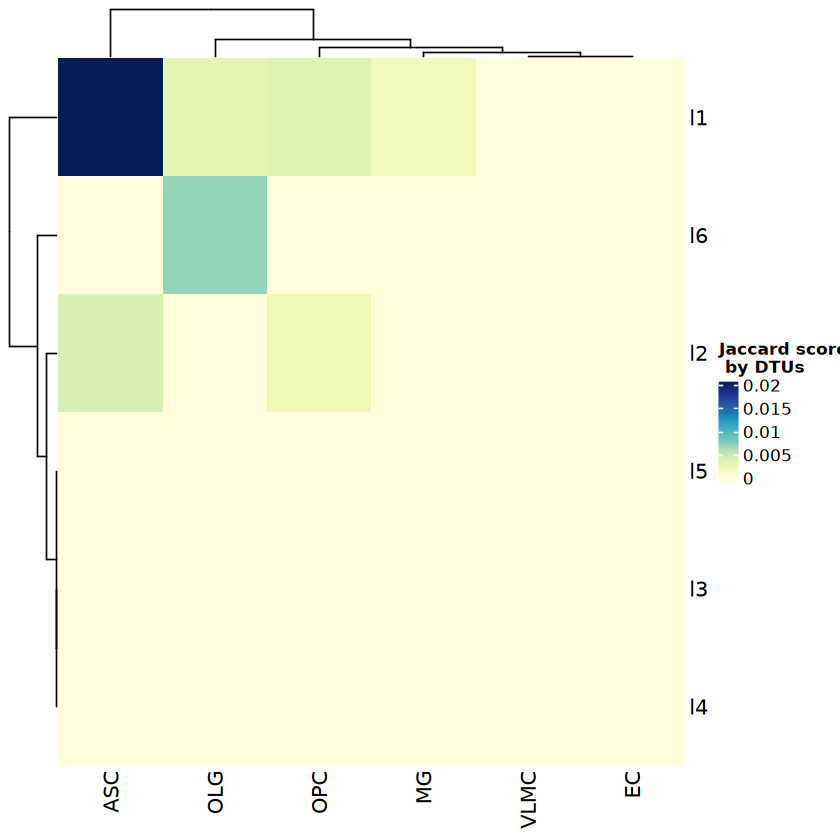

In [290]:
mjcht

In [544]:
#build transcript_id list
isosigl = isosigls$layer
isosigl = isosigl[isosigl$sig == "Up",]
table(isosigl$areatr)

isols1 = list()
isols2 = list()

id1 = unique(isosigl$areatr)
id2 = unique(cellmd$cluster)
for(i in 1:length(id1)){
    isoi = isosigl[isosigl$areatr == id1[i],]
    isoi = unique(isoi$transcript_id)
    isols1[[i]] = isoi
}
names(isols1) = id1

for(i in 1:length(id2)){
    isoi = cellmd[cellmd$cluster == id2[i],]
    isoi = unique(isoi$transcript_id)
    isols2[[i]] = isoi
}
names(isols2) = id2

layermdjc = MyJaccard(isols1,isols2)
layermdjc


 l1  l2  l3  l4  l5  l6 
172  35  27  30  21  48 

,5,4,2,3,1,6
l1,0.009803922,0.025362319,0,0.000000000,0.000000000,0.004310345
l6,0.005434783,0.006329114,0,0.017142857,0.006535948,0.000000000
l4,0.006024096,0.000000000,0,0.006289308,0.038167939,0.000000000
l3,0.000000000,0.000000000,0,0.012903226,0.000000000,0.000000000
l2,0.000000000,0.000000000,0,0.000000000,0.000000000,0.021276596
l5,0.006369427,0.000000000,0,0.013422819,0.016000000,0.000000000


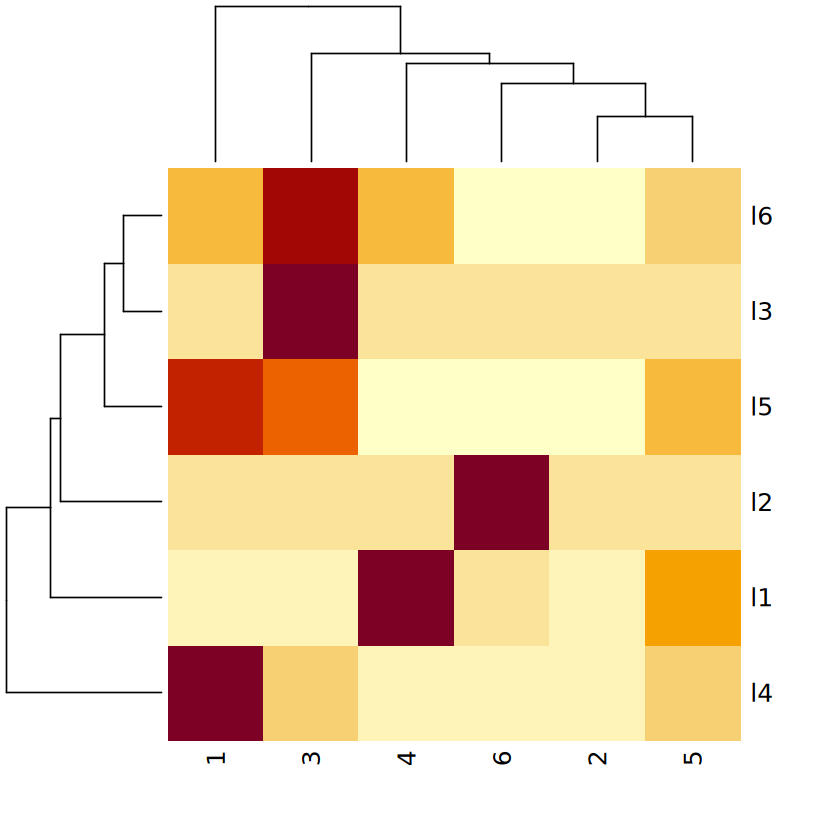

In [545]:
heatmap(layermdjc)

#### Calculate k-neighbor distance

In [549]:
#Calculate module pattern
cellmd.st = cellmd[!is.na(cellmd$class),] %>% group_by(cluster,clusteran) %>% summarise(mdr = mean(dr2))
head(cellmd.st)
cellmd.ls = list()
cellmd.st = dcast(cellmd.st,cluster~clusteran,value.var = "mdr",fun.aggregate = sum)
clusterid = unique(cellmd.st$cluster)
for(i in 1:length(clusterid)){
    cellmd.sti = cellmd.st[cellmd.st$cluster == clusterid[i],]
    cellmd.sti = unlist(cellmd.sti[,-1])
    names(cellmd.sti) = colnames(cellmd.st)[-1]
    print(cellmd.sti)
    cellmd.ls[[i]] = cellmd.sti
}


`summarise()` has grouped output by 'cluster'. You can override using the
`.groups` argument.


cluster,clusteran,mdr
<int>,<chr>,<dbl>
1,GABA,0.0151466954
1,deep-GLU,-0.0009923244
1,nonNeuron-ASC,-0.0136234204
1,nonNeuron-OLG,0.0697766721
1,surface-GLU,-0.0299957546
2,GABA,-0.0664543346


     deep-GLU          GABA nonNeuron-ASC nonNeuron-OLG   surface-GLU 
-0.0009923244  0.0151466954 -0.0136234204  0.0697766721 -0.0299957546 
     deep-GLU          GABA nonNeuron-ASC nonNeuron-OLG   surface-GLU 
 0.0204264536 -0.0664543346 -0.0001297193  0.0114182203  0.0364441056 
     deep-GLU          GABA nonNeuron-ASC nonNeuron-OLG   surface-GLU 
   0.02319531    0.01219149   -0.17881646   -0.02057099    0.01978618 
     deep-GLU          GABA nonNeuron-ASC nonNeuron-OLG   surface-GLU 
 -0.023566588  -0.004557875   0.152983791   0.054069374  -0.026282945 
     deep-GLU          GABA nonNeuron-ASC nonNeuron-OLG   surface-GLU 
 -0.010917348   0.014164735   0.015640861   0.010653904  -0.001596928 
     deep-GLU          GABA nonNeuron-ASC nonNeuron-OLG   surface-GLU 
  0.014137831   0.009198508   0.016987827  -0.155325525   0.021366795 


In [555]:
isosigl = isosigls$layer
isosigl = isosigl[isosigl$sig == "Up",]
isosigl = isosigl[,c("areatr","transcript_id")]
colnames(isosigl)[1] = "layer"
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = merge(isosigs,isosigl,by = "transcript_id")
isosigs = isosigs[!isosigs$areatr %in% c("MG","PV_CHC","EC","VLMC","OPC"),]
subclassan = data.frame("subclass" = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC','PVALB','SST','ASC','OLG','OPC','MG','EC','VLMC'),
                      "class" = c('surface-GLU','surface-GLU','surface-GLU','deep-GLU','deep-GLU',
                                  'deep-GLU','deep-GLU','deep-GLU','deep-GLU','deep-GLU',
                                  'GABA','GABA','GABA','GABA','GABA','GABA',"GABA",
                                 'nonNeuron-ASC','nonNeuron-OLG','nonNeuron','nonNeuron','nonNeuron','nonNeuron'))
isosigs$clonecl = subclassan[match(isosigs$areatr,subclassan$subclass),]$class
isosigs.st = isosigs %>% group_by(transcript_id,clonecl,layer) %>% summarise(mdr = mean(dr2))
head(isosigs.st)
transids = unique(isosigs$transcript_id)
length(transids)



`summarise()` has grouped output by 'transcript_id', 'clonecl'. You can
override using the `.groups` argument.


transcript_id,clonecl,layer,mdr
<chr>,<chr>,<chr>,<dbl>
AP4E1-WeiLab-2,deep-GLU,l6,-0.005538302
AP4E1-WeiLab-2,surface-GLU,l6,0.011076605
BIN1-WeiLab-2,deep-GLU,l2,-0.010642861
BIN1-WeiLab-2,nonNeuron-OLG,l2,-0.084923428
BIN1-WeiLab-2,surface-GLU,l2,0.127494873
BambuGene103646-WeiLab-1,GABA,l1,0.020302333


[1] 259

In [556]:
#isosigs.sti = isosigs.st[isosigs.st$transcript_id == transids[i],]
isosigs.st = isosigs.st %>% group_by(transcript_id,layer) %>% filter(length(unique(clonecl)) == 5)
isosigs.st = isosigs.st[order(isosigs.st$transcript_id,isosigs.st$layer,isosigs.st$clonecl),]
disst = isosigs.st %>% group_by(transcript_id,layer) %>% 
summarise(distances = sapply(cellmd.ls, function(pattern) {
      sqrt(sum((unlist(pattern) - unlist(mdr))^2))
    }), cluster = 1:6)
head(disst)

Warning message:
"Returning more (or less) than 1 row per `summarise()` group was deprecated in
dplyr 1.1.0.
ℹ Please use `reframe()` instead.
ℹ When switching from `summarise()` to `reframe()`, remember that `reframe()`
  always returns an ungrouped data frame and adjust accordingly."
`summarise()` has grouped output by 'transcript_id', 'layer'. You can override
using the `.groups` argument.


transcript_id,layer,distances,cluster
<chr>,<chr>,<dbl>,<int>
BambuGene103646-WeiLab-1,l1,0.20790447,1
BambuGene103646-WeiLab-1,l1,0.22007782,2
BambuGene103646-WeiLab-1,l1,0.37011978,3
BambuGene103646-WeiLab-1,l1,0.06300981,4
BambuGene103646-WeiLab-1,l1,0.17168990,5
BambuGene103646-WeiLab-1,l1,0.24186839,6


`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.


layer,cluster,transnum,transpop
<chr>,<int>,<int>,<dbl>
l1,1,10,0.07633588
l1,2,4,0.03053435
l1,4,84,0.64122137
l1,5,24,0.18320611
l1,6,9,0.06870229
l2,2,5,0.33333333


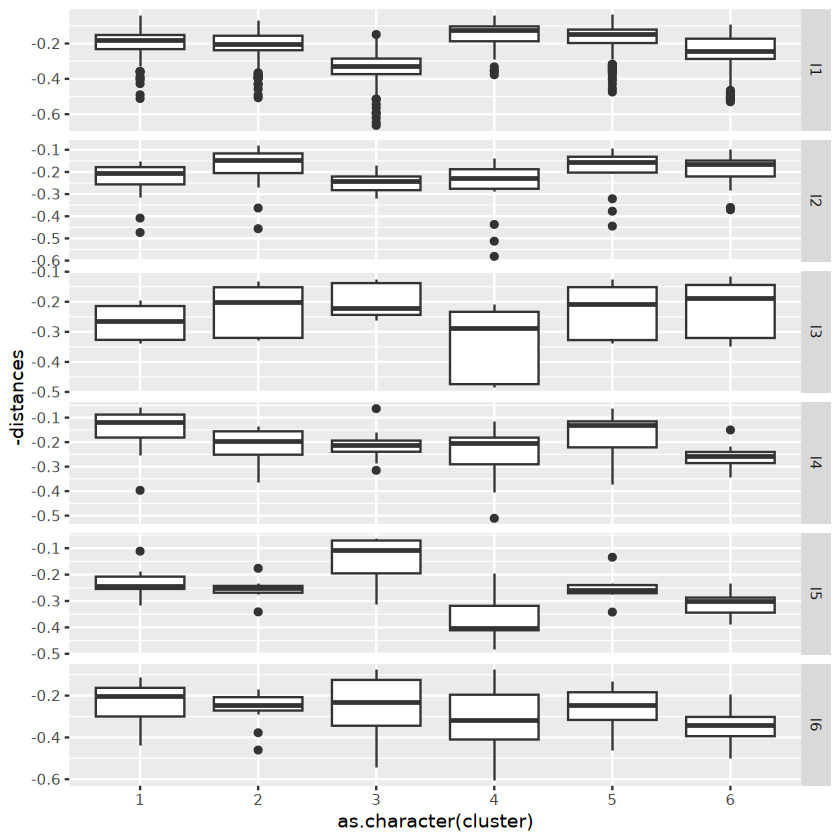

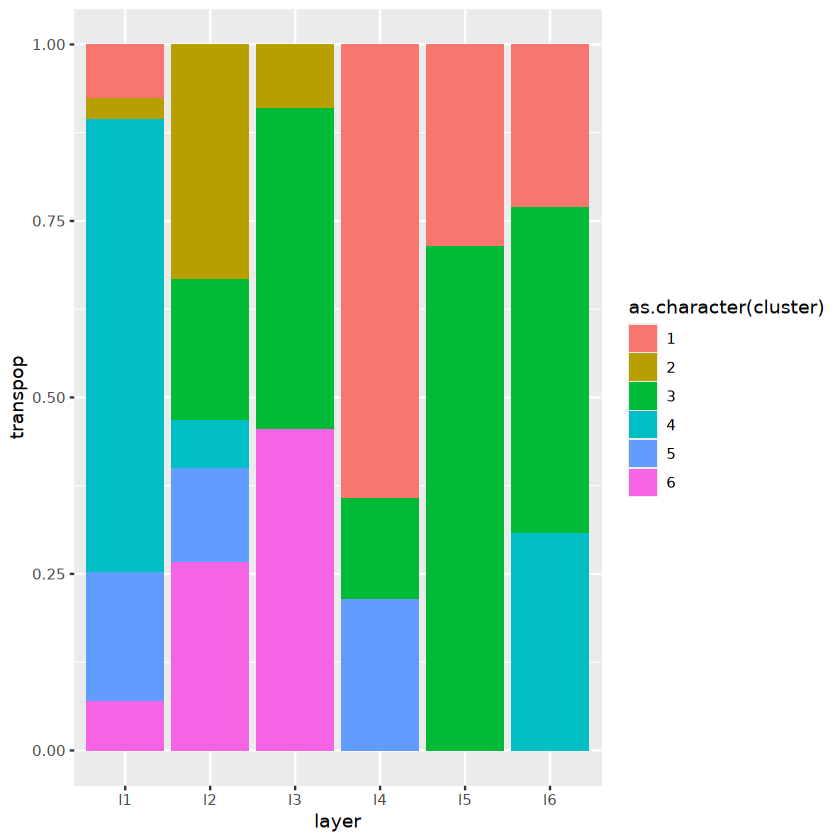

In [564]:
ggplot(disst,aes(x = as.character(cluster),y = -distances)) + geom_boxplot() +
facet_grid(layer~.,scales = "free")
disst2 = disst %>% group_by(layer,transcript_id) %>% summarise(cluster = cluster[which.min(distances)])
disst2 = disst2 %>% group_by(layer,cluster) %>% summarise(transnum = length(transcript_id))
disst2 = disst2 %>% group_by(layer) %>% mutate(transpop = transnum/sum(transnum))
head(disst2)
ggplot(disst2,aes(x = layer,y = transpop,fill = as.character(cluster))) + geom_bar(stat = "identity")

In [562]:
disst2

layer,cluster,transnum,transpop
<chr>,<int>,<int>,<dbl>


#### Calculate spatial module

In [622]:
#case 1
clusteran = read.csv("result/figure2/sigiso_layer_transcript_dr_cluster_tab.csv")
head(clusteran)

,cluster,transcript_id
,<int>,<chr>
1,5,AP4E1-WeiLab-2
2,3,APBA3-WeiLab-1
3,1,BambuGene103646-WeiLab-2
4,1,BambuGene11813-WeiLab-5
5,1,BambuGene127834-WeiLab-1
6,5,BambuGene44498-WeiLab-3


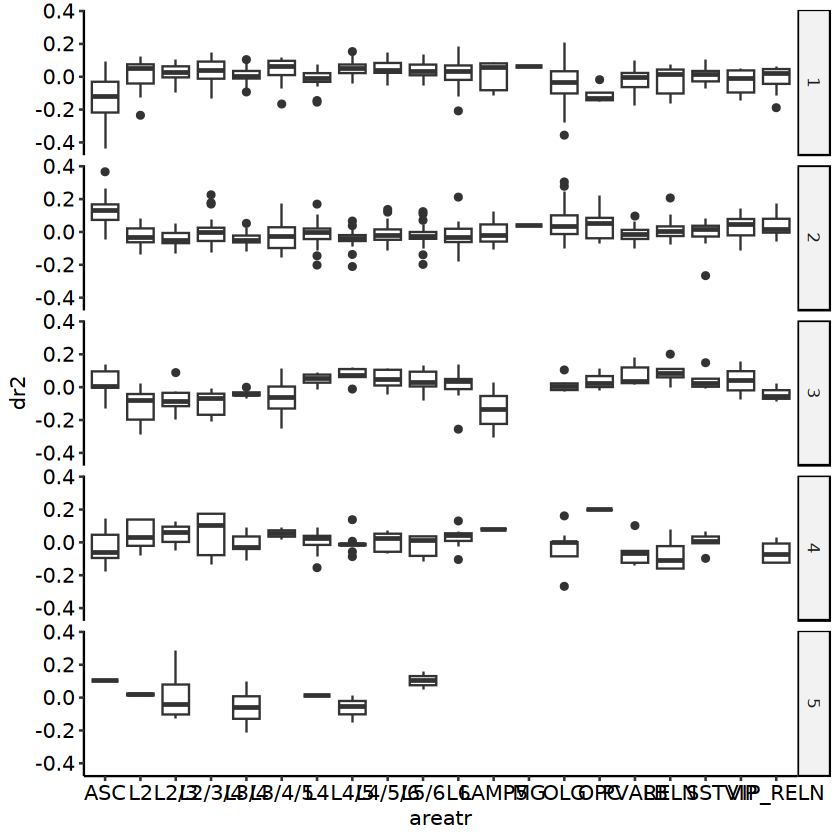

In [575]:
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = merge(isosigs,clusteran,by = "transcript_id")
ggplot(isosigs, aes(x = areatr,y = dr2)) + geom_boxplot() +
facet_grid(cluster~.) + theme_pubr()

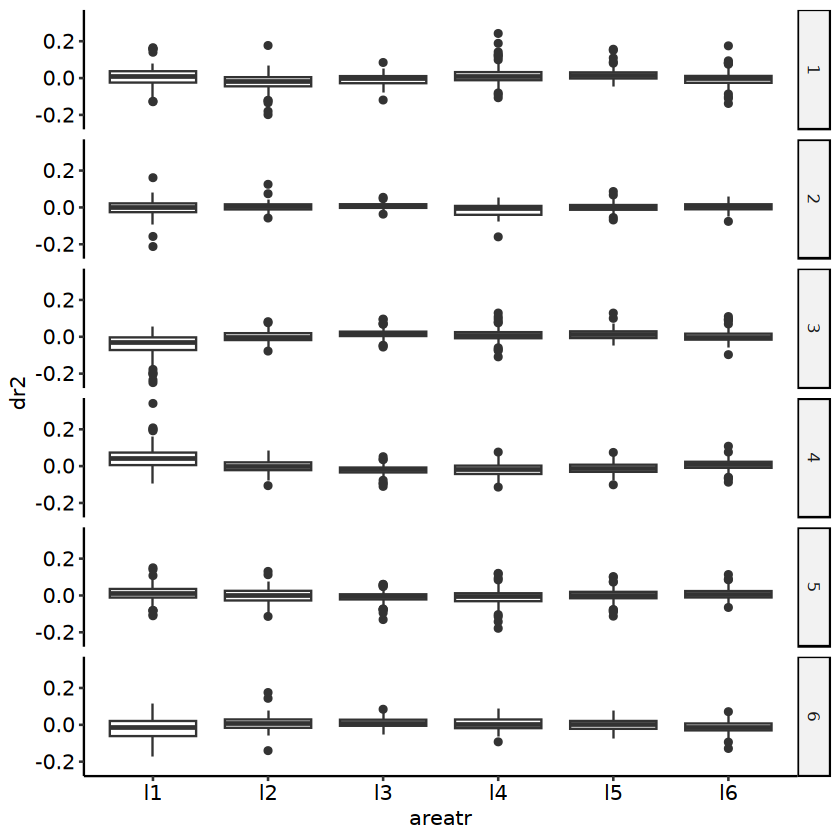

In [605]:
clusteran = unique(cellmd[,c("transcript_id","cluster")])
isosigs = isosigls$layer
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = merge(isosigs,clusteran,by = "transcript_id")
ggplot(isosigs, aes(x = areatr,y = dr2)) + geom_boxplot() +
facet_grid(cluster~.) + theme_pubr()

### Calculate layer and subclass dtu correlation

In [13]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig == "Up",]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig == "Up",]$transcript_id)
huntrans = c(huntrans1,huntrans2)
print(length(unique(huntrans)))

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl$drl = isosigl$relative - isosigl$meanrelative
isosigl = unique(isosigl[,c("transcript_id","areatr","drl")])
colnames(isosigl)[2] = "layer"

isosigc$drc = isosigc$relative - isosigc$meanrelative
isosigc = isosigc[,c("transcript_id","areatr","drc")]
colnames(isosigc)[2] = "subclass"
isosigc = merge(isosigc,isosigl,by = "transcript_id")
isosigc.st = isosigc %>% group_by(layer,subclass) %>% summarise(cor = cor(drl,drc))
head(isosigc.st)

[1] 3802


`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.


layer,subclass,cor
<chr>,<chr>,<dbl>
l1,ASC,0.41757652
l1,L2,-0.04085177
l1,L2/3,-0.18340814
l1,L2/3/4,-0.05157411
l1,L3/4,-0.19340122
l1,L3/4/5,-0.15121284


In [14]:
cellprop.layer = fsraw.cor[fsraw.cor$class != "",] %>% group_by(layer,class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.layer = cellprop.layer %>% group_by(layer) %>% mutate(cellprop = cellnum/sum(cellnum))
isosigc.st = merge(isosigc.st,cellprop.layer,by = c("layer","subclass"))

`summarise()` has grouped output by 'layer', 'class'. You can override using
the `.groups` argument.


file saved to result/figure4/layer_subclass_dtu_correlation_24_09_17.pdf



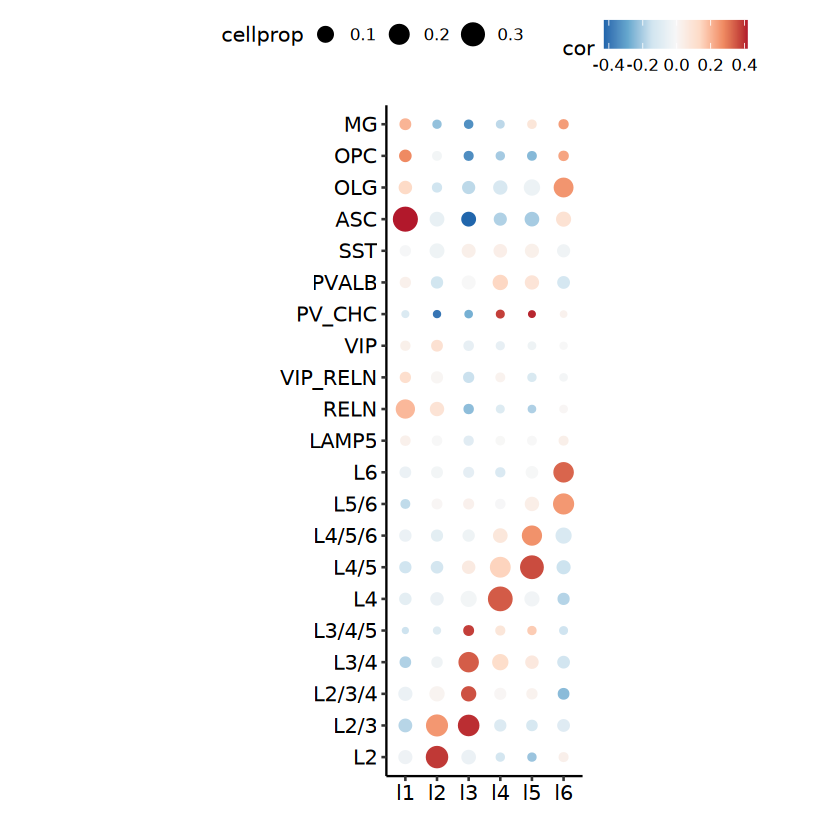

In [15]:

isosigc.st$subclass = factor(isosigc.st$subclass,levels = suborder)
p = ggplot(isosigc.st[as.character(isosigc.st$subclass) != "VLMC",],aes(x = layer,y = subclass,color = cor,size = cellprop)) + geom_point() +
theme_pubr() + scale_color_distiller(palette = "RdBu") + coord_fixed() + xlab("") + ylab("") + labs(fill = "Correlation of Delta Isoform ratio")
p
ggexport(p,filename = "result/figure4/layer_subclass_dtu_correlation_24_09_17.pdf",width = 5,height = 5)

[1] 3712


`summarise()` has grouped output by 'lobe'. You can override using the
`.groups` argument.


,layer,subclass,cor,class,cellnum,cellprop
,<chr>,<fct>,<dbl>,<chr>,<int>,<dbl>
1,l1,ASC,0.41757652,NonNeuron,5203,0.3358941252
2,l1,L2,-0.04085177,GLU,790,0.0510006456
3,l1,L2/3,-0.18340814,GLU,709,0.0457714655
4,l1,L2/3/4,-0.05157411,GLU,802,0.0517753389
5,l1,L3/4,-0.19340122,GLU,322,0.0207876049
6,l1,L3/4/5,-0.15121284,GLU,14,0.0009038089


`summarise()` has grouped output by 'lobe', 'class'. You can override using the
`.groups` argument.


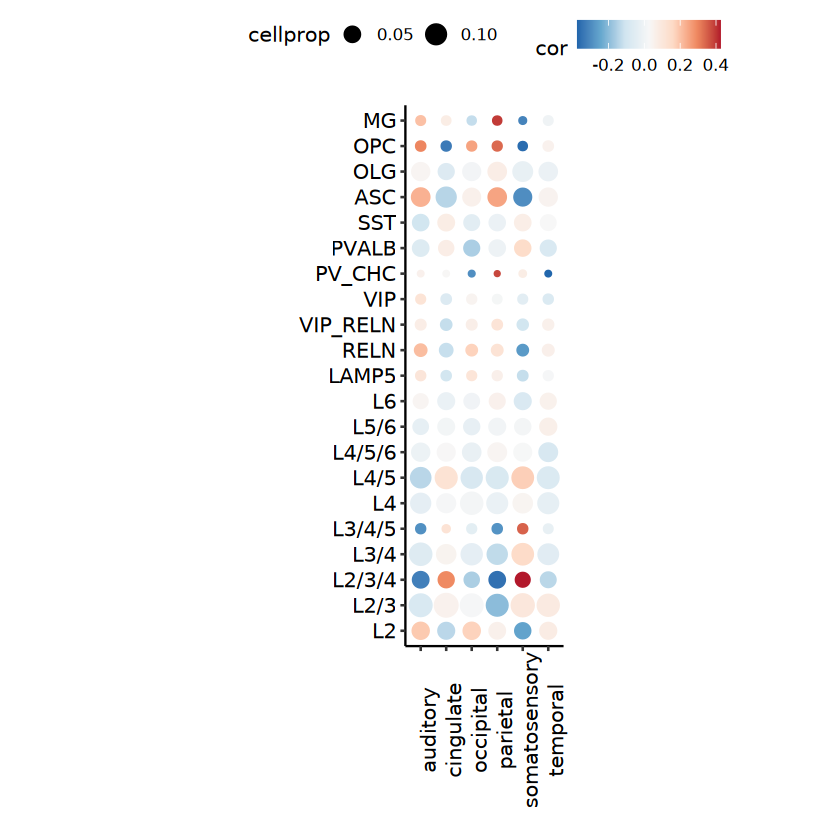

In [18]:
#
isosigl = isosigls$lobe
huntrans1 = unique(isosigl[isosigl$sig == "Up",]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig == "Up",]$transcript_id)
huntrans = c(huntrans1,huntrans2)
print(length(unique(huntrans)))

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl$drl = isosigl$relative - isosigl$meanrelative
isosigl = unique(isosigl[,c("transcript_id","areatr","drl")])
colnames(isosigl)[2] = "lobe"

isosigc$drc = isosigc$relative - isosigc$meanrelative
isosigc = isosigc[,c("transcript_id","areatr","drc")]
colnames(isosigc)[2] = "subclass"
isosigc = merge(isosigc,isosigl,by = "transcript_id")
isosigc.st2 = isosigc %>% group_by(lobe,subclass) %>% summarise(cor = cor(drl,drc))
head(isosigc.st)
cellprop.lobe = fsraw.cor[fsraw.cor$class != "",] %>% group_by(lobe,class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.lobe = cellprop.lobe %>% group_by(lobe) %>% mutate(cellprop = cellnum/sum(cellnum))
isosigc.st2 = merge(isosigc.st2,cellprop.lobe,by = c("lobe","subclass"))
isosigc.st2$subclass = factor(isosigc.st2$subclass,levels = suborder)
p = ggplot(isosigc.st2[as.character(isosigc.st2$subclass) != "VLMC",],aes(x = lobe,y = subclass,color = cor,size = cellprop)) + geom_point() +
theme_pubr() + scale_color_distiller(palette = "RdBu") + coord_fixed() + xlab("") + ylab("") + 
labs(fill = "Correlation of Delta Isoform ratio") + theme(axis.text.x = element_text(angle = 90))
p

In [19]:
ggexport(p,filename = "result/figure4/lobe_subclass_dtu_correlation_24_09_17.pdf",width = 6.5,height = 6.5)

file saved to result/figure4/lobe_subclass_dtu_correlation_24_09_17.pdf



In [21]:
head(isosigc.st)
head(isosigc.st2)

,layer,subclass,cor,class,cellnum,cellprop
,<chr>,<fct>,<dbl>,<chr>,<int>,<dbl>
1,l1,ASC,0.41757652,NonNeuron,5203,0.3358941252
2,l1,L2,-0.04085177,GLU,790,0.0510006456
3,l1,L2/3,-0.18340814,GLU,709,0.0457714655
4,l1,L2/3/4,-0.05157411,GLU,802,0.0517753389
5,l1,L3/4,-0.19340122,GLU,322,0.0207876049
6,l1,L3/4/5,-0.15121284,GLU,14,0.0009038089


,lobe,subclass,cor,class,cellnum,cellprop
,<chr>,<fct>,<dbl>,<chr>,<int>,<dbl>
1,auditory,ASC,0.22824732,NonNeuron,2455,0.070349887
2,auditory,L2,0.18811261,GLU,1987,0.056938992
3,auditory,L2/3,-0.07849187,GLU,4390,0.125798779
4,auditory,L2/3/4,-0.32334098,GLU,1784,0.051121873
5,auditory,L3/4,-0.06252491,GLU,4167,0.119408545
6,auditory,L3/4/5,-0.29058244,GLU,329,0.009427745


[1] 0.5256107

[1] -0.03083515

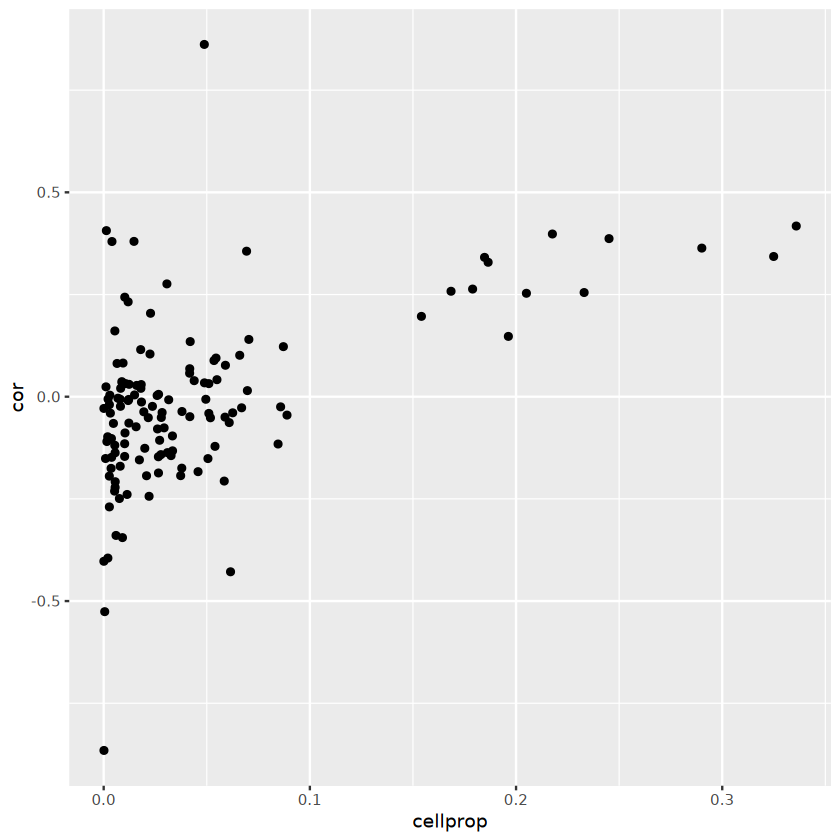

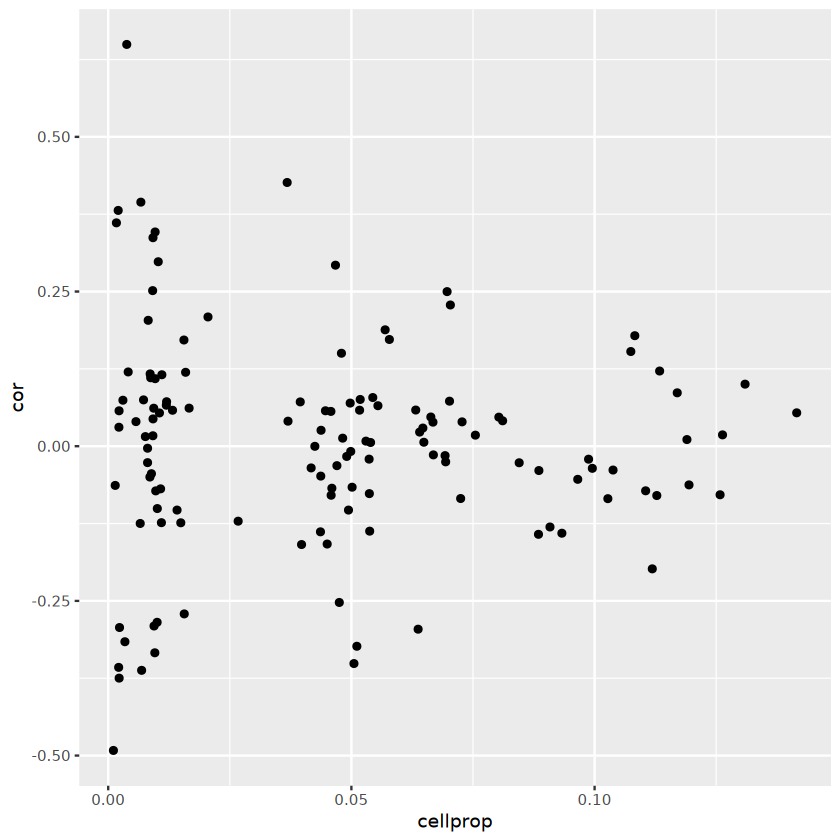

In [24]:
cor(isosigc.st$cor,isosigc.st$cellprop)
ggplot(isosigc.st,aes(x = cellprop, y = cor)) + geom_point()

cor(isosigc.st2$cor,isosigc.st2$cellprop)
ggplot(isosigc.st2,aes(x = cellprop, y = cor)) + geom_point()


### Calculate region/layer/subclass contribution 

In [60]:
#Cal each gene subclass/lobe/layer delta isoform
FullLengthTranSt = function(fs.info){
      transtl = fs.info %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
      transtl = transtl[transtl$areatr != "" &
                          !is.na(transtl$areatr),]
      return(transtl)
}

CalSigIsoform = function(transt){
  transt = transt[!is.na(transt$areatr),]
  transt = transt[transt$areatr != "",]
  transt$relative = transt$count/transt$genecount
  transtf = transt[transt$count > 5,]
  transtf = transt[transt$genecount > 20,]
  transtf = transtf %>% group_by(transcript_id) %>% 
    mutate(meanrelative = mean(relative),
           otherrelative = (sum(relative) - relative)/(n() - 1))
  transtf = transtf[which(transtf$meanrelative > 0.1),]
  transtf = transtf %>% group_by(transcript_id) %>% 
    filter(length(unique(areatr))>1)
  transtf = transtf %>% group_by(gene_id) %>% 
    filter(length(unique(transcript_id))>1)
  
  # transtf$lfc = log2(transtf$relative/transtf$meanrelative)
  transtf$dr = transtf$relative - transtf$otherrelative
  transtf$sig = "N"
  table(transtf$sig)
  
  transtf$pvalue = 1
  MyChiqTest = function(transcript_id, areatr, count){
    dat = data.frame(transcript_id = transcript_id, areatr = areatr,
                     count = count)
    dat = dcast(dat, areatr~transcript_id,
                value.var = "count",
                fun.aggregate = sum)
    rownames(dat) = dat$areatr;dat = dat[-1]
    p = tryCatch(chisq.test(as.matrix(dat))$p.value, 
                 error = function(e) NA)
    return(p)
  }
  transtf = transtf %>% group_by(gene_id) %>% 
    mutate(pvalue = MyChiqTest(transcript_id, areatr, count))
  transtf$padj = p.adjust(transtf$pvalue,method = "BH")
  # table(transtf[transtf$padj < 0.05,]$sig)
  transtf[transtf$pvalue < 0.05,]$sig = "Y"
  transtf[which(transtf$dr > 0.1 & transtf$pvalue < 0.05), "sig"] = "Up"
  transtf[which(transtf$dr < -0.1 & transtf$pvalue < 0.05), "sig"] = "Down"
  return(transtf)
}
#calculate ASC from different layer
fsrawdp.cor = fsrawdp[fsrawdp$class != "",]
fsrawdp.cor$areatr = paste0(fsrawdp.cor$lobe,"-",fsrawdp.cor$subclass)
transtsb = FullLengthTranSt(fsrawdp.cor)
#isosigsb = CalSigIsoform(transtsb)
#unique(isosigsb[isosigsb$sig != "N",]$gene_id)
#head(transtsb)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


In [61]:
#calculate delta cellprop and delta isoform ratio
transtsb$lobe = MySplit(transtsb$areatr,"-",1)
transtsb$subclass = MySplit(transtsb$areatr,"-",2)
transtsb$relative = transtsb$count/transtsb$genecount
#transtsbf = transtsb %>% group_by(transcript_id) %>% filter(mean(count) > 5)

transtsbf = transtsb %>% group_by(transcript_id,lobe) %>% 
    mutate(prop = genecount/sum(genecount),drc = relative - mean(relative))
transtsbf = transtsbf %>% group_by(transcript_id,subclass) %>% 
    mutate(drp = prop - mean(prop))

#transtsbf = transtsbf[transtsbf$count > 5,]
transtsbf = transtsbf %>% group_by(transcript_id,subclass) %>% 
    mutate(drb = relative - mean(relative))
#transtsbf = transtsbf[transtsbf$count > 5,]
#head(transtsbf)
# transtsbf$drbc = transtsbf$relative - transtsbf$mrc
# transtsbf$drcb = transtsbf$relative - transtsbf$mrb
 length(unique(transtsbf$transcript_id))

[1] 94646

[1] 543

[1] 543

[1] 540

file saved to result/figure4/spatial_contribution_diger_lobe_24_05_02.pdf



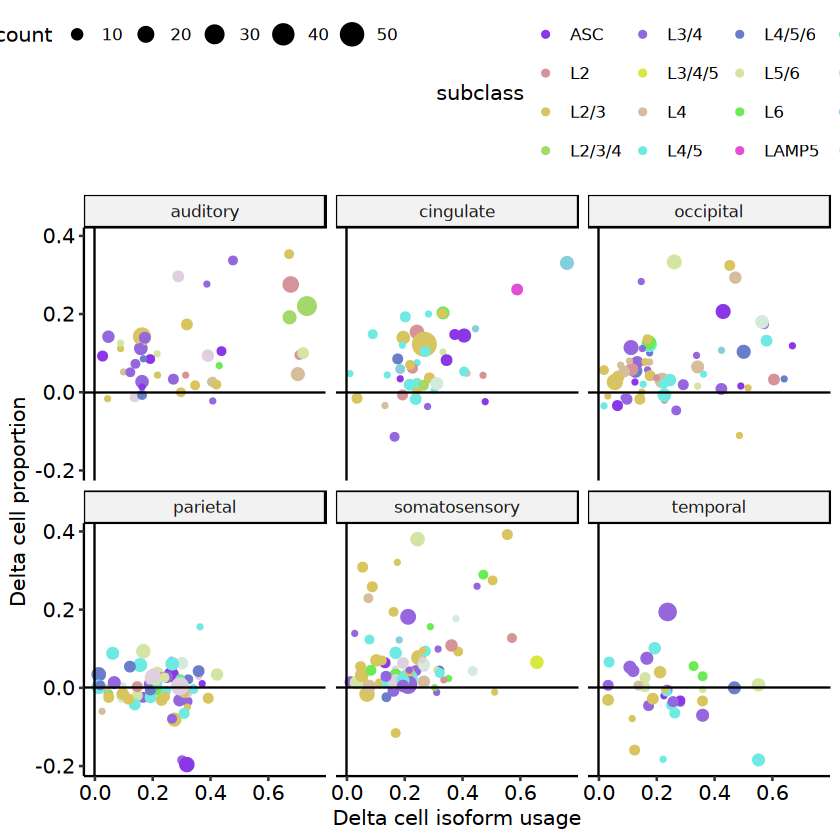

In [695]:
#transtsbf = transtsbf[transtsbf$drb > 0 & transtsbf$drc > 0,]
isosigb = isosigls$lobe
#huntrans3 = unique(isosigb[isosigb$sig == "Up",]$transcript_id)
isosigb = isosigb[isosigb$sig == "Up",]
isosigb = isosigb[,c("areatr","meanrelative","transcript_id")]
#isosigb = isosigb[isosigb$sig %in% c("Up"),]
colnames(isosigb)[1] = "lobe"
length(unique(isosigb$transcript_id))
#transtsbf2 = transtsbf %>% group_by(subclass,transcript_id) %>% filter(length(lobe) > 3)
transtsbf2 = merge(transtsbf,isosigb,by = c("transcript_id","lobe"))

length(unique(transtsbf2$transcript_id))
#transtsbf2 = transtsbf2[transtsbf2$relative < transtsbf2$meanrelative,]$sig = "N"
# transtsbf2.st = transtsbf2 %>% group_by(lobe,transcript_id) %>% summarise(mdrb = mean(drb))
#ggplot(transtsbf2.st,aes(x = lobe,y = mdrb)) + geom_boxplot()

# transtsbf2.st = transtsbf2 %>% group_by(lobe,transcript_id) %>% summarise(mdrp = mean(drp))
#ggplot(transtsbf2.st,aes(x = lobe,y = mdrp)) + geom_boxplot()
transtsbf2 = transtsbf2 %>% group_by(transcript_id,subclass) %>% mutate(meanrelativec = mean(relative))

transtsbf2 = transtsbf2[transtsbf2$drp != 0 | transtsbf2$drb != 0,]
transtsbf2$drc = transtsbf2$meanrelativec - transtsbf2$meanrelative
transtsbf2 = transtsbf2[transtsbf2$drc > 0.01,]
#transtsbf2$drc = transtsbf2$relative - transtsbf2$meanrelative
length(unique(transtsbf2$transcript_id))
library(ggtern)
library(ggpointdensity)

no_of_colors = length(unique(transtsbf$subclass)) 
colorful_palette = distinctColorPalette(no_of_colors) 
names(colorful_palette) = unique(transtsbf$subclass)

transtsbf2 = transtsbf2[transtsbf2$count > 5,]
p2 = ggplot(data=transtsbf2,aes(x = drc,y = drp, size = count,color = subclass)) + 
geom_point() +
geom_hline(yintercept=0) +
geom_vline(xintercept=0) +
facet_wrap(~lobe) +
#scale_fill_manual(values = sigcolor) +
scale_color_manual(values = colorful_palette) +
theme_pubr() + xlab("Delta cell isoform usage") + 
ylab("Delta cell proportion")
p2
ggexport(p2,filename = "result/figure4/spatial_contribution_diger_lobe_24_05_02.pdf",width = 6,height = 6)

In [641]:
head(transtsbf2)

,transcript_id,lobe,gene_id,areatr,count,genecount,subclass,relative,prop,drp,drb,meanrelative,sig,drc
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
10,ACBD7-WeiLab-1,temporal,ACBD7,temporal-ASC,21,60,ASC,0.3500000,0.2210526,0.014191683,-0.01476101,0.3229419,N,0.02705805
20,ACBD7-WeiLab-2,cingulate,ACBD7,cingulate-ASC,23,29,ASC,0.7931034,0.3239437,0.097495918,0.13050004,0.6047947,N,0.18830871
32,ACBD7-WeiLab-2,parietal,ACBD7,parietal-ASC,35,48,ASC,0.7291667,0.3240741,0.097626330,0.06656326,0.6047947,N,0.12437193
41,ACBD7-WeiLab-2,temporal,ACBD7,temporal-L6,23,24,L6,0.9583333,0.1191710,0.048025748,0.14583333,0.6047947,N,0.35353860
44,ACBD7-WeiLab-2,temporal,ACBD7,temporal-OLG,21,32,OLG,0.6562500,0.1088083,-0.008904301,-0.12660256,0.6047947,N,0.05145527
108,ADH5-WeiLab-3,parietal,ADH5,parietal-L4/5,24,52,L4/5,0.4615385,0.1481481,0.038653120,0.10066555,0.3504877,N,0.11105072


In [688]:
isosigb = isosigls$lobe
isosigb[isosigb$gene_id == "DDRGK1",]
isosigc = isosigls$subclass
isosigc[isosigc$gene_id == "CAPRIN1",]

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
DDRGK1,DDRGK1-WeiLab-1,auditory,653,2179,0.2996788,0.2842776,0.2811974,0.018481336,Y,1.682313e-12,2.683579e-10
DDRGK1,DDRGK1-WeiLab-1,cingulate,1257,3812,0.3297482,0.2842776,0.2751835,0.054564630,Y,1.682313e-12,2.683579e-10
DDRGK1,DDRGK1-WeiLab-1,occipital,594,2337,0.2541720,0.2842776,0.2902988,-0.036126748,Y,1.682313e-12,2.683579e-10
DDRGK1,DDRGK1-WeiLab-1,parietal,1532,5753,0.2662958,0.2842776,0.2878740,-0.021578152,Y,1.682313e-12,2.683579e-10
DDRGK1,DDRGK1-WeiLab-1,somatosensory,698,2490,0.2803213,0.2842776,0.2850689,-0.004747624,Y,1.682313e-12,2.683579e-10
DDRGK1,DDRGK1-WeiLab-1,temporal,2465,8949,0.2754498,0.2842776,0.2860432,-0.010593441,Y,1.682313e-12,2.683579e-10
DDRGK1,XM_005568473.2,auditory,1526,2179,0.7003212,0.7157224,0.7188026,-0.018481336,Y,1.682313e-12,2.683579e-10
DDRGK1,XM_005568473.2,cingulate,2555,3812,0.6702518,0.7157224,0.7248165,-0.054564630,Y,1.682313e-12,2.683579e-10
DDRGK1,XM_005568473.2,occipital,1743,2337,0.7458280,0.7157224,0.7097012,0.036126748,Y,1.682313e-12,2.683579e-10


gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
CAPRIN1,XM_005578232.2,ASC,149,193,0.7720207,0.6113328,0.6024056,0.169615080,Up,6.495118e-13,2.86636e-12
CAPRIN1,XM_005578232.2,L2,102,168,0.6071429,0.6113328,0.6115655,-0.004422670,Y,6.495118e-13,2.86636e-12
CAPRIN1,XM_005578232.2,L2/3,243,418,0.5813397,0.6113328,0.6129990,-0.031659322,Y,6.495118e-13,2.86636e-12
CAPRIN1,XM_005578232.2,L2/3/4,56,100,0.5600000,0.6113328,0.6141846,-0.054184574,Y,6.495118e-13,2.86636e-12
CAPRIN1,XM_005578232.2,L3/4,194,390,0.4974359,0.6113328,0.6176604,-0.120224460,Down,6.495118e-13,2.86636e-12
CAPRIN1,XM_005578232.2,L3/4/5,18,32,0.5625000,0.6113328,0.6140457,-0.051545685,Y,6.495118e-13,2.86636e-12
CAPRIN1,XM_005578232.2,L4,150,246,0.6097561,0.6113328,0.6114203,-0.001664249,Y,6.495118e-13,2.86636e-12
CAPRIN1,XM_005578232.2,L4/5,233,410,0.5682927,0.6113328,0.6137239,-0.045431187,Y,6.495118e-13,2.86636e-12
CAPRIN1,XM_005578232.2,L4/5/6,124,218,0.5688073,0.6113328,0.6136953,-0.044887938,Y,6.495118e-13,2.86636e-12


`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
file saved to result/figure4/spatial_contribution_diger_lobe_pie_24_05_02.pdf



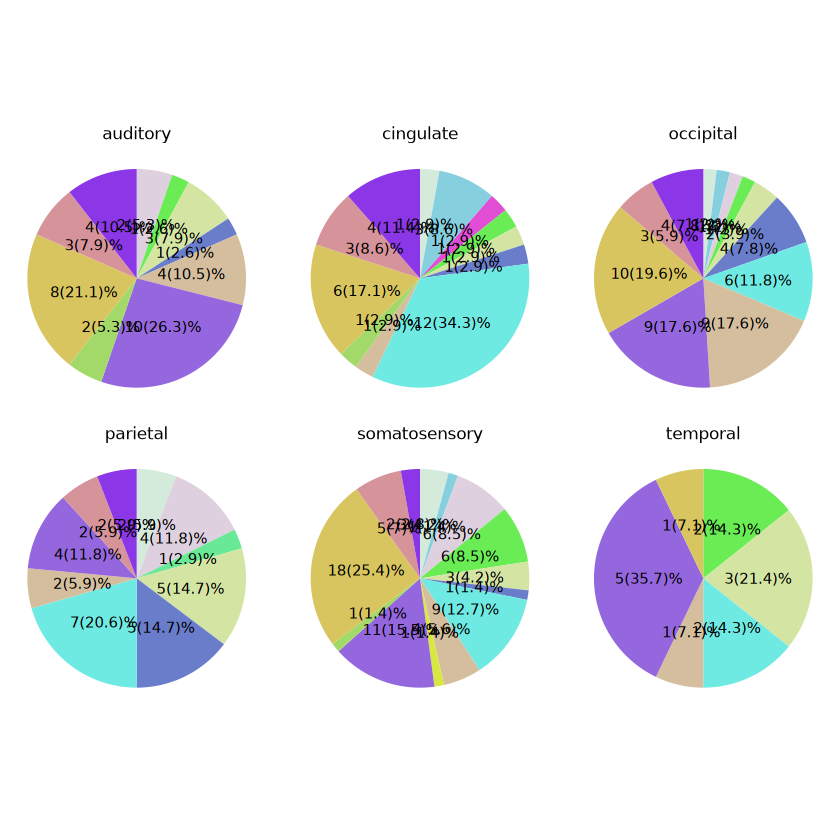

In [696]:
PiePlot = function(datadf,colorful_palette){
    datadf = datadf %>% group_by(areatr,group) %>% summarise(count = n())
    datadf <- datadf %>% group_by(areatr) %>% 
          arrange(desc(group)) %>%
          mutate(prop = count / sum(count) *100) %>%
          mutate(ypos = cumsum(prop)- 0.5*prop )
    datadf$proplabel = paste0(datadf$count,"(",round(datadf$prop,1),")%")

    p1.4 = ggplot(datadf, aes(x="", y=prop, fill=group)) +
          geom_bar(stat="identity", width=1, color= NA) +
          facet_wrap(~areatr) +
          coord_polar("y", start=0) +
          theme_void() + 
          theme(legend.position="none") +
          geom_text(aes(y = ypos, label = proplabel), color = "black", size=3) +
          scale_fill_manual(values = colorful_palette)
    return(p1.4)
}

transtsbf2.11 = transtsbf2[transtsbf2$drp > 0,]
transtsbf2.11$group = transtsbf2.11$subclass
transtsbf2.11$areatr = transtsbf2.11$lobe
grob11 = PiePlot(transtsbf2.11,colorful_palette)
grob11
ggexport(grob11,filename = "result/figure4/spatial_contribution_diger_lobe_pie_24_05_02.pdf",width = 6,height = 6)
# ybp_grob <- ggplotGrob(ybp)
# # Place box plots inside the scatter plot
# #::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
# xmin <- min(iris$Sepal.Length); xmax <- max(iris$Sepal.Length)
# ymin <- min(iris$Sepal.Width); ymax <- max(iris$Sepal.Width)
# yoffset <- (1/15)*ymax; xoffset <- (1/15)*xmax
# # Insert xbp_grob inside the scatter plot
# sp + annotation_custom(grob = xbp_grob, xmin = xmin, xmax = xmax, 
#                        ymin = ymin-yoffset, ymax = ymin+yoffset) +
#   # Insert ybp_grob inside the scatter plot
#   annotation_custom(grob = ybp_grob,
#                        xmin = xmin-xoffset, xmax = xmin+xoffset, 
#                        ymin = ymin, ymax = ymax)

In [26]:
fsrawdp.cor$areatr = paste0(fsrawdp.cor$layer,"-",fsrawdp.cor$subclass)
transtsl = FullLengthTranSt(fsrawdp.cor)
transtsl$layer = MySplit(transtsl$areatr,"-",1)
transtsl$subclass = MySplit(transtsl$areatr,"-",2)
transtsl$relative = transtsl$count/transtsl$genecount

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


transcript_id,drb,drc
<chr>,<dbl>,<dbl>
ABLIM1-WeiLab-1,0.00000000,0.00000000
ACP6-WeiLab-1,0.00000000,0.00000000
ADARB2-WeiLab-1,0.00000000,0.00000000
AGAP3-WeiLab-1,0.41732283,0.00000000
ALDOA-WeiLab-1,0.06181818,0.04814815
ALKBH6-WeiLab-1,0.00000000,0.00000000


transcript_id,drb,drc
<chr>,<dbl>,<dbl>
ABLIM1-WeiLab-1,0.00000000,0.00000000
ACP6-WeiLab-1,0.00000000,0.00000000
ADARB2-WeiLab-1,0.00000000,0.00000000
AGAP3-WeiLab-1,0.41732283,0.00000000
ALDOA-WeiLab-1,0.06181818,0.04814815
ALKBH6-WeiLab-1,0.00000000,0.00000000


In [217]:
transtslf = transtsl %>% group_by(transcript_id,layer) %>% 
    mutate(prop = count/sum(count))
transtslf = transtslf %>% group_by(transcript_id,subclass) %>% 
    mutate(drp = prop - mean(prop))

transtslf = transtslf[transtslf$count > 5,]
transtslf = transtslf %>% group_by(transcript_id,subclass) %>% 
    mutate(drb = relative - mean(relative))
#transtsbf = transtsbf[transtsbf$drb > 0 & transtsbf$drc > 0,]
length(unique(transtslf$transcript_id))


[1] 228

[1] 766

[1] 443

`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.
file saved to result/figure4/spatial_contribution_diger_layer_24_05_02.pdf

`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


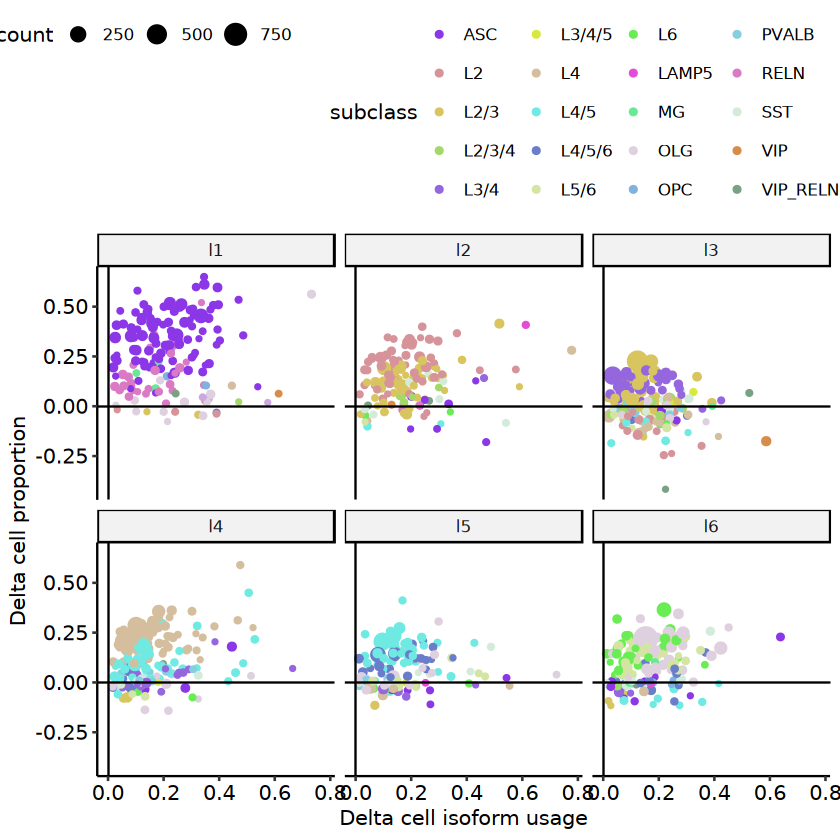

file saved to result/figure4/spatial_contribution_diger_layer_pie_24_05_02.pdf



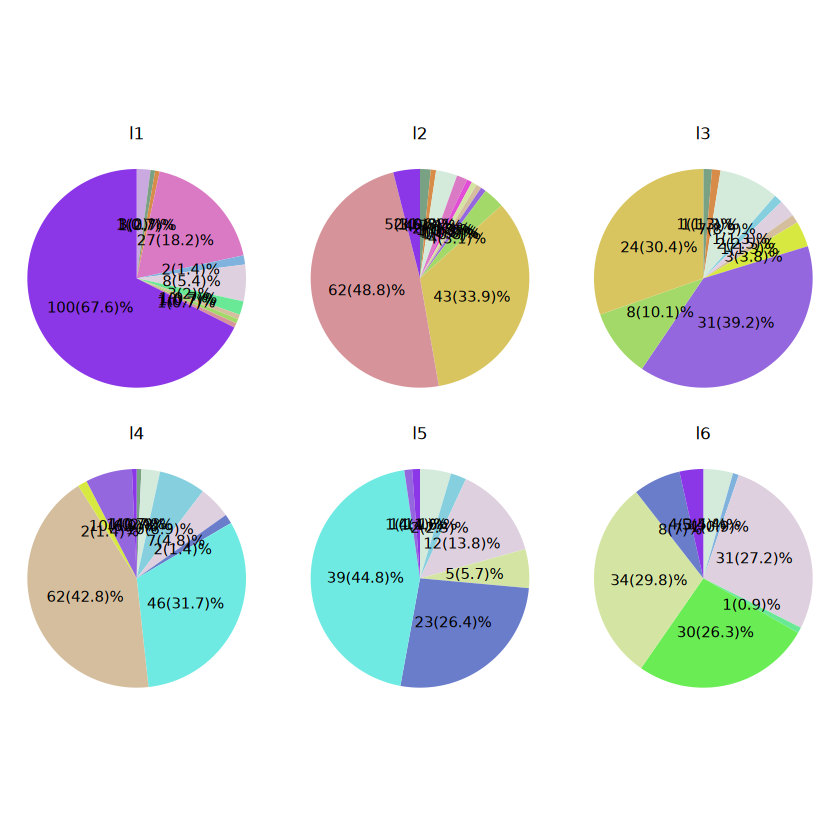

In [700]:
#head(transtslf2)
isosigl = isosigls$layer
#huntrans3 = unique(isosigb[isosigb$sig == "Up",]$transcript_id)
isosigl = isosigl[isosigl$sig == "Up",]
isosigl = isosigl[,c("areatr","meanrelative","transcript_id")]
colnames(isosigl)[1] = "layer"
length(unique(isosigl$transcript_id))
transtslf2 = merge(transtslf,isosigl,by = c("transcript_id","layer"))
length(unique(transtslf2$transcript_id))
transtslf2 = transtslf2 %>% group_by(transcript_id,subclass) %>% mutate(meanrelativec = mean(relative))

transtslf2 = transtslf2[transtslf2$drp != 0 | transtslf2$drb != 0,]
#transtslf2 = transtslf2[transtslf2$meanrelativec > transtslf2$meanrelative,]
transtslf2$drc = transtslf2$meanrelativec - transtslf2$meanrelative
transtslf2 = transtslf2[transtslf2$drc > 0.01,]

transtslf2.st = transtslf2 %>% group_by(layer,transcript_id) %>% summarise(mdrb = mean(drb))
#ggplot(transtslf2.st,aes(x = layer, y = mdrb)) + geom_boxplot()
transtslf2.st = transtslf2 %>% group_by(layer,transcript_id) %>% summarise(mdrp = mean(drp))
#ggplot(transtslf2.st,aes(x = layer, y = mdrp)) + geom_boxplot()
transtslf2 = transtslf2[transtslf2$count > 5,]
p2 = ggplot(data=transtslf2,aes(x = drc,y = drp,color = subclass,size = count)) + 
geom_point() +
geom_hline(yintercept=0) +
geom_vline(xintercept=0) +
facet_wrap(~layer) +
scale_color_manual(values = colorful_palette) +
theme_pubr() + xlab("Delta cell isoform usage") + 
ylab("Delta cell proportion")
p2
ggexport(p2,filename = "result/figure4/spatial_contribution_diger_layer_24_05_02.pdf",width = 6,height = 6)

transtslf2.11 = transtslf2[transtslf2$drp > 0,]
transtslf2.11$group = transtslf2.11$subclass
transtslf2.11$areatr = transtslf2.11$layer
grob11 = PiePlot(transtslf2.11,colorful_palette)
grob11
ggexport(grob11,filename = "result/figure4/spatial_contribution_diger_layer_pie_24_05_02.pdf",width = 6,height = 6)

In [75]:
head(transtslf)
head(transtsbf)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'transtslf' not found


#### Case Plot

In [7]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AATF,NM_001284760.1,0.07919799,1562,0.2876847,0.10975105
2,AATK,XM_015438936.1,0.09083488,8138,0.2377859,0.03737105
3,ABCA5,XM_005584799.2,0.09384724,355,0.1998682,0.07914868
4,ABCA5,XM_005584800.2,0.15165242,1732,0.2831962,0.09067009
5,ABCC5,XM_005546513.2,0.08575366,497,0.1817143,0.03261045
6,ABCC5,XM_005546515.2,0.11222668,3021,0.2133333,0.04348931


[1] 1788

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01011 0.05888 0.08814 0.10090 0.13009 0.41529 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.006393 0.043335 0.066038 0.078607 0.101477 0.530303 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0250  0.1856  0.2241  0.2386  0.2769  0.7105 

In [8]:
isosigtri$test = ((isosigtri$drc - isosigtri$drb) + (isosigtri$drc - isosigtri$drl)) / 2
isosigtri = isosigtri[order(-round(isosigtri$test,1),-isosigtri$count),]
isosigtri[1:50,]

,gene_id,transcript_id,drl,count,drc,drb,transname,test
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<dbl>
567,FSTL5,XM_005556201.2,0.14223990,1311,0.7105263,0.04663182,FSTL5-XM_005556201.2,0.6160905
88,ARL2BP,XM_005592027.2,0.03368957,4692,0.5340304,0.05341421,ARL2BP-XM_005592027.2,0.4904785
1489,SLC8A1,XM_005576035.2,0.09081354,2167,0.5510204,0.03087219,SLC8A1-XM_005576035.2,0.4901775
1300,PSME1_1,PSME1_1-WeiLab-1,0.11221625,1039,0.5935504,0.16639131,PSME1_1-WeiLab-1,0.4542467
87,ARL2BP,NM_001284624.1,0.03368957,718,0.5340304,0.05341421,ARL2BP-NM_001284624.1,0.4904785
874,LOC102141792,XR_001489183.1,0.14153846,674,0.5828544,0.10790117,LOC102141792-XR_001489183.1,0.4581346
1006,MBD2,XM_005586664.2,0.15230867,441,0.7010358,0.30613831,MBD2-XM_005586664.2,0.4718123
1672,TUBB2B,TUBB2B-WeiLab-1,0.07819669,14671,0.4318652,0.04429714,TUBB2B-WeiLab-1,0.3706183
1671,TUBB2B,NM_001283898.1,0.07819669,13586,0.4318652,0.04429714,TUBB2B-NM_001283898.1,0.3706183


Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_subclass_lobe_dtu_delta_tern_24_05_30.pdf



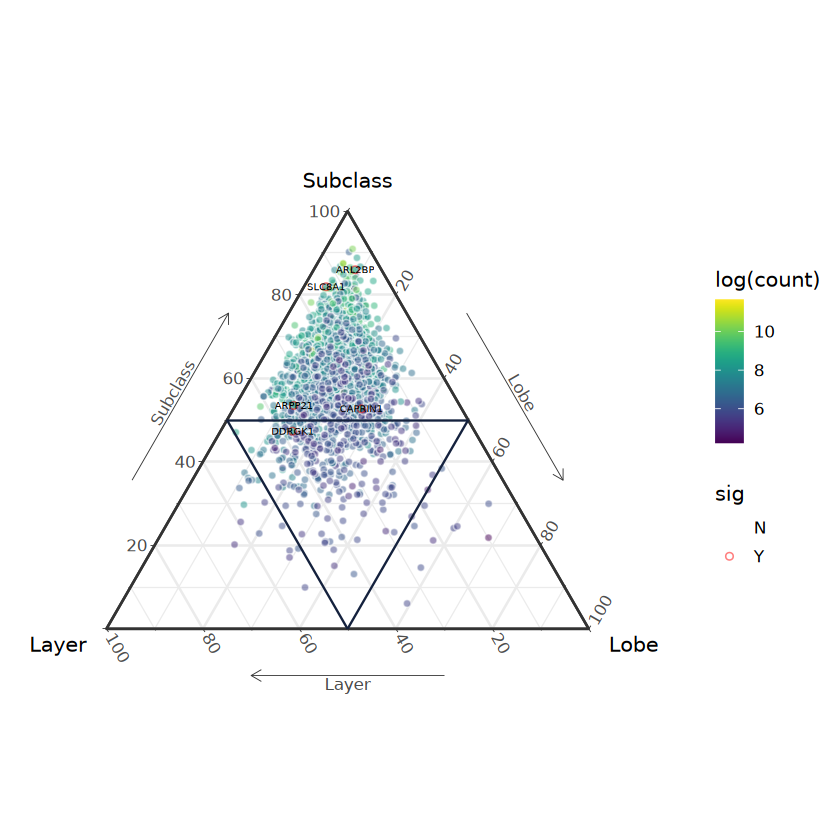

In [66]:
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = c("XM_015434930.1","XM_005545495.2","DDRGK1-WeiLab-1","XM_005576035.2","XM_005592027.2")
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = c("ARPP21","DDRGK1","CAPRIN1","SLC8A1","ARL2BP")
isosigtri$sig = "N"
isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
xlab("Layer")+ 
ylab("Subclass")+
zlab("Lobe")+ 
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_subclass_lobe_dtu_delta_tern_24_05_30.pdf",width = 5,height = 5)

In [76]:
fsrawdp.cor = fsrawdp[fsrawdp$subclass != "",]
fsrawdp.cor$areatr = paste0(fsrawdp.cor$lobe,"-",fsrawdp.cor$subclass)
transtsb = FullLengthTranSt(fsrawdp.cor)

fsrawdp.cor$areatr = paste0(fsrawdp.cor$layer,"-",fsrawdp.cor$subclass)
transtsl = FullLengthTranSt(fsrawdp.cor)

transtsb$lobe = MySplit(transtsb$areatr,"-",1)
transtsb$subclass = MySplit(transtsb$areatr,"-",2)

transtsl$layer = MySplit(transtsl$areatr,"-",1)
transtsl$subclass = MySplit(transtsl$areatr,"-",2)

transtsl$relative = transtsl$count/transtsl$genecount
transtsb$relative = transtsb$count/transtsb$genecount

transtsbf = transtsb[transtsb$count > 10,]
transtslf = transtsl[transtsl$count > 10,]

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


In [77]:
head(transtslf)

gene_id,transcript_id,areatr,count,genecount,layer,subclass,relative
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>
AAAS,XM_005571001.1,l3-L2/3,33,47,l3,L2/3,0.7021277
AAAS,XM_005571001.1,l3-L3/4,46,57,l3,L3/4,0.8070175
AAAS,XM_005571001.1,l4-L4/5,13,15,l4,L4/5,0.8666667
AAAS,XM_005571001.1,l5-L4/5,34,41,l5,L4/5,0.8292683
AAAS,XM_005571001.1,l5-L4/5/6,19,21,l5,L4/5/6,0.9047619
AAAS,XM_005571001.1,l6-L5/6,15,18,l6,L5/6,0.8333333


In [54]:
transtsblf.b = transtsbf %>% group_by(gene_id,transcript_id,subclass) %>% filter(length(lobe) > 1) %>% 
summarise(drb = max(relative) - min(relative),count = sum(count))
transtsblf.b =  transtsblf.b %>% group_by(gene_id,transcript_id) %>% summarise(drb = mean(drb),count = sum(count))

transtsblf.l = transtslf %>% group_by(gene_id,transcript_id,subclass) %>% filter(length(layer) > 1) %>% 
summarise(drl = max(relative) - min(relative))
transtsblf.l =  transtsblf.l %>% group_by(gene_id,transcript_id) %>% summarise(drl = mean(drl))

transtsblf.c = transtsbf %>% group_by(gene_id,transcript_id,lobe,layer) %>% filter(length(subclass) > 2) %>% 
summarise(drc = max(relative) - min(relative))
table(transtsblf.c$subclass)
transtsblf.c =  transtsblf.c %>% group_by(gene_id,transcript_id) %>% summarise(drc = mean(drc))

transtsblf.tri = merge(transtsblf.b,transtsblf.l,by = c("gene_id","transcript_id"))
transtsblf.tri = merge(transtsblf.tri,transtsblf.c,by = c("gene_id","transcript_id"))
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)
length(unique(transtsblf.tri$gene_id))
transtsblf.tri = transtsblf.tri[transtsblf.tri$transcript_id %in% huntrans,]
length(unique(transtsblf.tri$gene_id))
head(transtsblf.tri)

`summarise()` has grouped output by 'gene_id', 'transcript_id', 'subclass'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id', 'subclass'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id', 'lobe'. You can
override using the `.groups` argument.
Warning message:
"Unknown or uninitialised column: `subclass`."


< table of extent 0 >

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


[1] 5913

[1] 928

,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AACS,NM_001284010.1,0.12025492,821,0.04730284,0.1331495
2,AAGAB,XM_005559881.2,0.21150461,240,0.00619195,0.1911765
9,AATF,NM_001284760.1,0.08366941,176,0.05514706,0.1739130
10,AATK,XM_015438936.1,0.13367644,1839,0.11638453,0.1871014
14,ABCA5,XM_005584800.2,0.23427427,289,0.21969697,0.1948480
16,ABCC5,XM_005546515.2,0.16592482,670,0.13079099,0.1594182


In [35]:
#transtsblf.c = transtsblf %>% group_by(gene_id,transcript_id,lobe,layer) %>% filter(length(class) > 1) %>% 
#summarise(drc = max(relative) - min(relative))
#transtsblf.c =  transtsblf.c %>% group_by(gene_id,transcript_id) %>% summarise(drc = mean(drc))
tmp = transtsblf[transtsblf$gene_id == "CDC42",]
tmp[order(tmp$lobe,tmp$layer),]

gene_id,transcript_id,areatr,count,genecount,lobe,layer,class,relative
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>
CDC42,CDC42-WeiLab-1,auditory-l2-GLU,7,10,auditory,l2,GLU,0.7000000
CDC42,CDC42-WeiLab-1,auditory-l3-GABA,13,22,auditory,l3,GABA,0.5909091
CDC42,CDC42-WeiLab-1,auditory-l3-GLU,102,137,auditory,l3,GLU,0.7445255
CDC42,NM_001283401.1,auditory-l3-GABA,9,22,auditory,l3,GABA,0.4090909
CDC42,NM_001283401.1,auditory-l3-GLU,35,137,auditory,l3,GLU,0.2554745
CDC42,CDC42-WeiLab-1,auditory-l4-GLU,24,27,auditory,l4,GLU,0.8888889
CDC42,CDC42-WeiLab-1,auditory-l5-GABA,6,8,auditory,l5,GABA,0.7500000
CDC42,CDC42-WeiLab-1,auditory-l5-GLU,37,72,auditory,l5,GLU,0.5138889
CDC42,NM_001283401.1,auditory-l5-GLU,35,72,auditory,l5,GLU,0.4861111


In [55]:
summary(transtsblf.tri$drb)
summary(transtsblf.tri$drl)
summary(transtsblf.tri$drc)
transtsblf.tri[transtsblf.tri$gene_id == "CDC42",]
transtsblf.tri[transtsblf.tri$gene_id == "ARPP21",]
transtsblf.tri[transtsblf.tri$gene_id == "DDRGK1",]

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.005863 0.112041 0.138220 0.138712 0.163639 0.416667 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.08115 0.10896 0.11418 0.13553 0.57143 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.02515 0.15281 0.19172 0.19417 0.23074 0.63380 

,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
974,CDC42,CDC42-WeiLab-1,0.1800948,1815,0.1573981,0.3210301
975,CDC42,NM_001283401.1,0.1498511,369,0.1619691,0.3178933


,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
359,ARPP21,XM_005545495.2,0.1289648,1845,0.1096669,0.2940789
360,ARPP21,XM_015444956.1,0.1753120,5826,0.1598648,0.1937070


,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1386,DDRGK1,DDRGK1-WeiLab-1,0.1233081,1594,0.06584238,0.2193688
1387,DDRGK1,XM_005568473.2,0.1552486,5430,0.14435858,0.2195196


In [56]:
transtsblf.tri[transtsblf.tri$drb > transtsblf.tri$drl & (transtsblf.tri$drb - transtsblf.tri$drc) > 0.1,]
#transtsblf.tri[transtsblf.tri$gene_id == "CAPRIN1",]

,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
198,ANAPC16,XM_005565570.2,0.2327115,480,0.04930888,0.05844156
334,ARL6,XM_015445286.1,0.2083403,267,0.07558140,0.05188679
801,C8H8orf33,XM_005564438.2,0.2159513,205,0.05238095,0.03663004
898,CCDC127,XM_005556559.2,0.2362391,211,0.07193684,0.02514507
951,CD151,XM_005576810.2,0.2170614,183,0.11282051,0.05591398
1786,FAM13A,XM_005555404.2,0.1834905,301,0.04327674,0.07577088
2639,LAS1L,XM_005593786.2,0.2801282,102,0.09019608,0.14615385
2821,LOC102123466,XM_005545062.2,0.1956792,482,0.05718356,0.09140158
3132,LOC107128460,LOC107128460-WeiLab-1,0.2500000,81,0.14215686,0.11764706


[1] 928

Warning message in geom_text(data = transtsblf.tri[transtsblf.tri$sig != "N", ], :
"Ignoring unknown aesthetics: z"


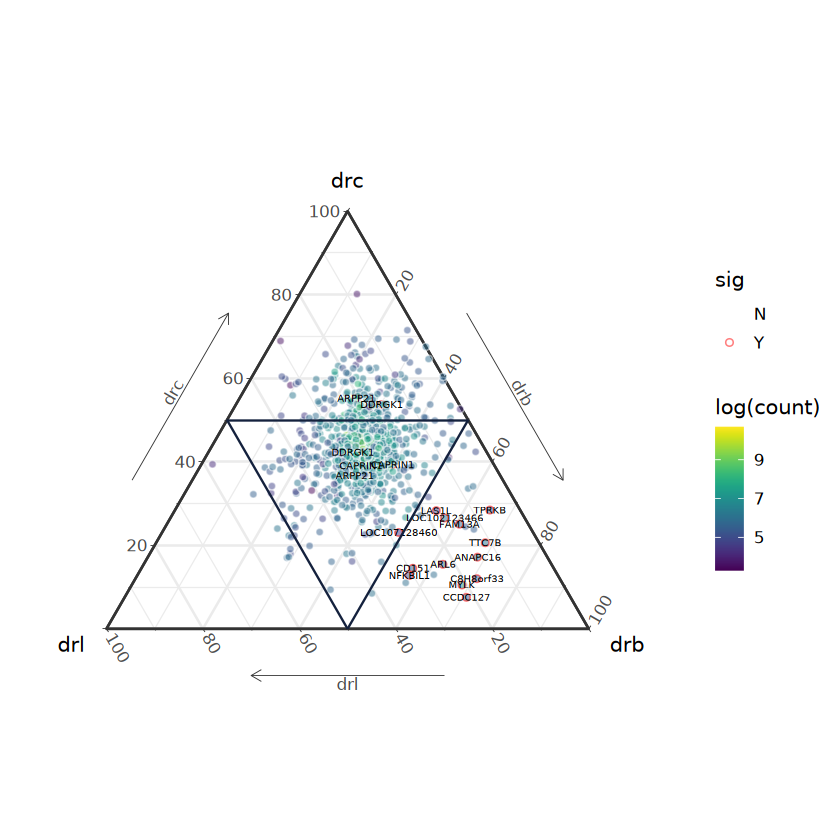

In [72]:
library(ggtern)
library(ggpointdensity)
library(ggrepel)

length(unique(transtsblf.tri$gene_id))

transtsblf.tri$sig = "N"
transtsblf.tri[((transtsblf.tri$drb - transtsblf.tri$drl) > 0.1 & (transtsblf.tri$drb - transtsblf.tri$drc) > 0.1) | 
               transtsblf.tri$gene_id %in% c("CAPRIN1","DDRGK1","ARPP21"),]$sig = "Y"
p2 = ggtern(data=transtsblf.tri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=transtsblf.tri[transtsblf.tri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
scale_fill_viridis() +
scale_color_manual(values = c("white","red"))

p2

Warning message:
"Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes."
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 20"


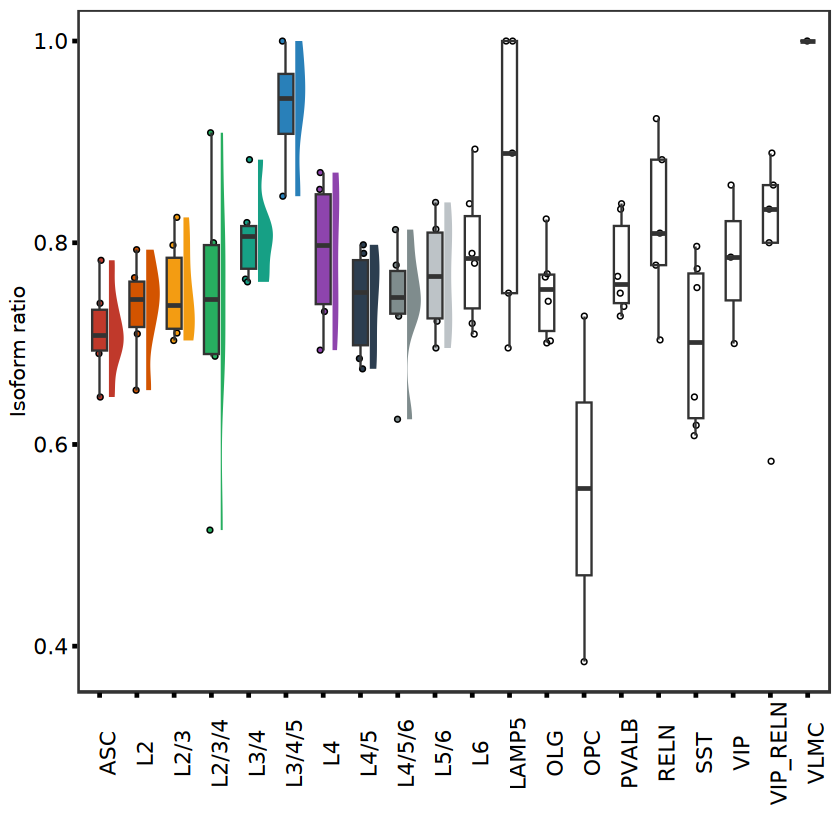

In [69]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
#ARL2BP
transex = c("XM_005571739.2")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtsb.case = transtsbf[transtsbf$transcript_id %in% transex,]
transtsb.case = transtsb.case %>% group_by(transcript_id) %>% filter(length(subclass) > 5)
transtsb.case = transtsb.case[transtsb.case$count > 5,]

isosigb = isosigls$lobe
isosigb = isosigb[,c("areatr","meanrelative","transcript_id")]

colnames(isosigb)[1] = "lobe"
transtsb.case = merge(transtsb.case,isosigb,by = c("lobe","transcript_id"))
transtsb.case$drc = transtsb.case$relative - transtsb.case$meanrelative
# pburble = ggplot(transtsb.case,aes(x = lobe,y = subclass,color = relative,size = prop)) + 
# geom_point() +
# facet_grid(~gene_id) +
# scale_color_viridis(option = "A") +
# theme_pubr() + theme(axis.text.x = element_blank()) +
# xlab("") + ylab("")
# pburble

pbox1 = ggplot(transtsb.case,aes(x = subclass,y = relative,fill = subclass)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw() +
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1


pbox2 = ggplot(transtsb.case,aes(x = subclass,y = relative,fill = subclass)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw() +
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox2
# pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
# pt
#ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_CAPRIN1_05_02.pdf",width = 5,height = 8)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AATF,NM_001284760.1,0.07919799,1562,0.16500067,0.10975105
2,AATF,XR_001485905.1,0.07919799,384,0.16500067,0.10975105
3,ABCA5,XM_005584800.2,0.15165242,1732,0.07619048,0.09067009
4,ACBD7,ACBD7-WeiLab-1,0.04128953,816,0.13892490,0.10884403
5,ACBD7,ACBD7-WeiLab-2,0.06521833,1528,0.14065336,0.03083393
6,ADAM15,XM_005541615.2,0.04175221,309,0.11891566,0.15707317


[1] 550

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0251  0.1001  0.1422  0.1475  0.1881  0.4056 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01078 0.05742 0.08676 0.09799 0.13458 0.36201 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.008276 0.078829 0.126063 0.129902 0.165022 0.565735 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_class_lobe_dtu_delta_tern_24_05_15.pdf



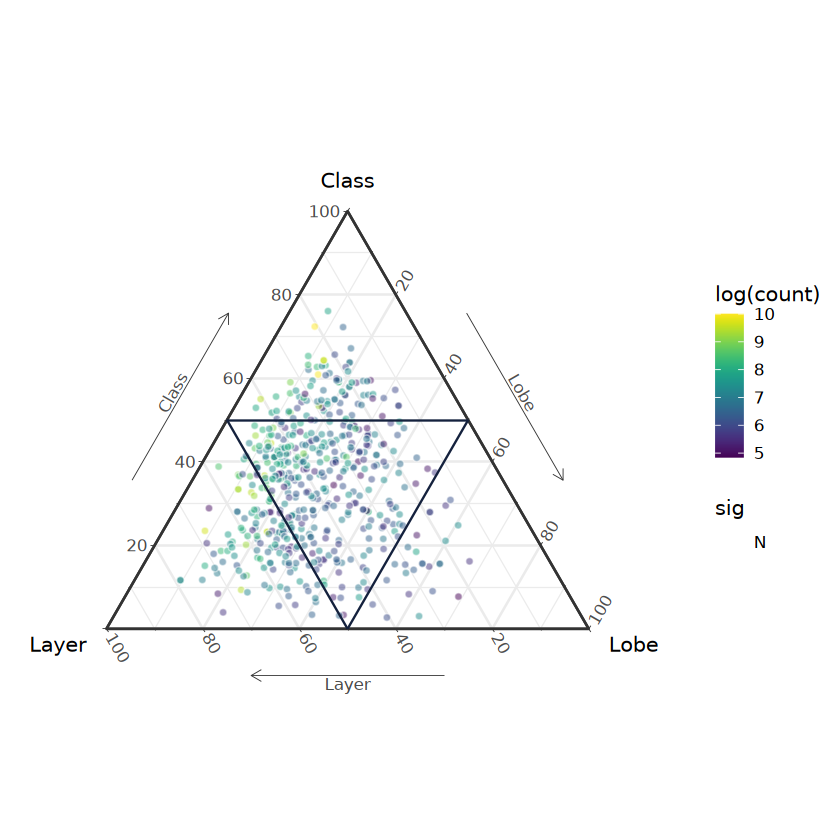

In [81]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls$class
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
xlab("Layer")+ 
ylab("Class")+
zlab("Lobe")+ 
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_class_lobe_dtu_delta_tern_24_05_15.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


[1] 1049

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01669 0.12365 0.16232 0.16537 0.20108 0.42141 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01580 0.07531 0.12327 0.12985 0.16769 0.53030 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.001277 0.151467 0.210101 0.216851 0.272821 0.814286 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_glu_lobe_dtu_delta_tern_24_05_15.pdf



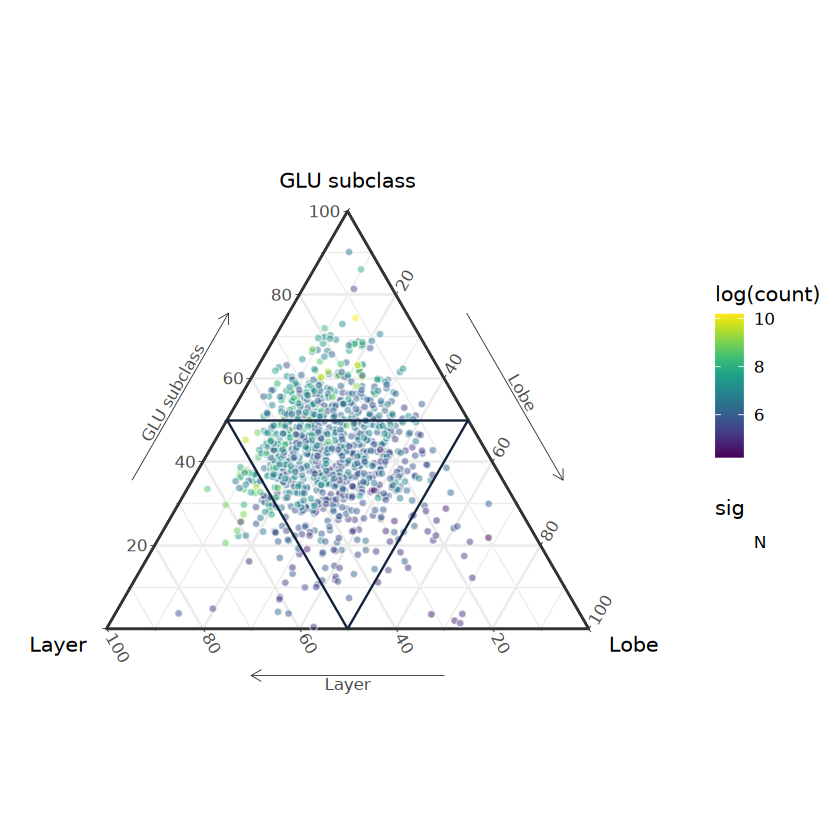

In [82]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls.cl$GLU_GLU
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
#head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
xlab("Layer")+ 
ylab("GLU subclass")+
zlab("Lobe")+ 
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_glu_lobe_dtu_delta_tern_24_05_15.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,ABCA5,XM_005584800.2,0.15165242,1732,0.1461538,0.09067009
2,ADAM15,XM_005541621.2,0.06618946,889,0.1364865,0.14005216
3,AHNAK,XM_005577589.2,0.24388262,1164,0.1461988,0.06520328
4,AIFM3,XM_015457402.1,0.13989126,5957,0.1041667,0.02694834
5,ANKRD42,XM_005579230.2,0.17714286,409,0.1640316,0.27139480
6,APMAP,XM_005568153.2,0.18530815,7595,0.1728778,0.03035467


[1] 413

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.02315 0.13553 0.16165 0.16424 0.19333 0.40076 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01035 0.06096 0.09263 0.09957 0.13506 0.35624 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.06593 0.13095 0.14389 0.19737 0.50179 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_gaba_lobe_dtu_delta_tern_24_05_15.pdf



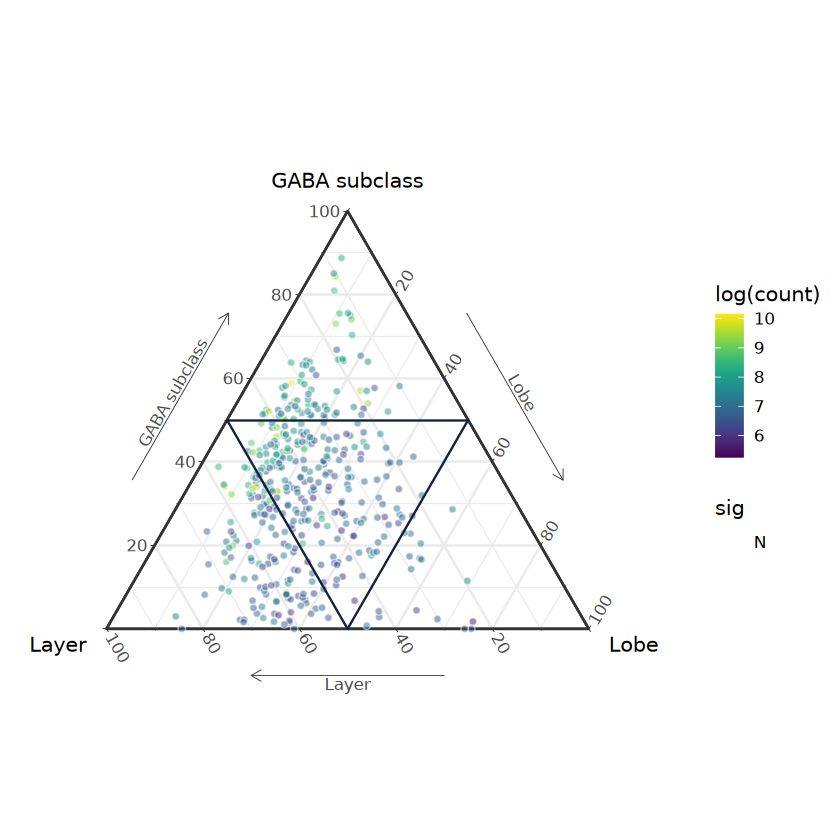

In [83]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls.cl$GABA_GABA
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
xlab("Layer")+ 
ylab("GABA subclass")+
zlab("Lobe")+ 
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_gaba_lobe_dtu_delta_tern_24_05_15.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AGAP3,AGAP3-WeiLab-1,0.06790365,10549,0.20301926,0.03567868
2,AGO3,XM_005543987.2,0.23554422,561,0.16349206,0.18847458
3,AGPAT4,XM_015448385.1,0.12665574,2085,0.24133007,0.02926455
4,AHNAK,XM_005577589.2,0.24388262,1164,0.07906977,0.06520328
5,AIFM3,XM_015457402.1,0.13989126,5957,0.20326376,0.02694834
6,ANXA6,NM_001284044.1,0.07904451,14656,0.29226211,0.01507873


[1] 380

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0211  0.1104  0.1568  0.1576  0.2007  0.4008 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.006393 0.054007 0.085086 0.099618 0.138101 0.362012 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0557  0.1250  0.1458  0.2125  0.5176 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_nn_lobe_dtu_delta_tern_24_05_02.pdf



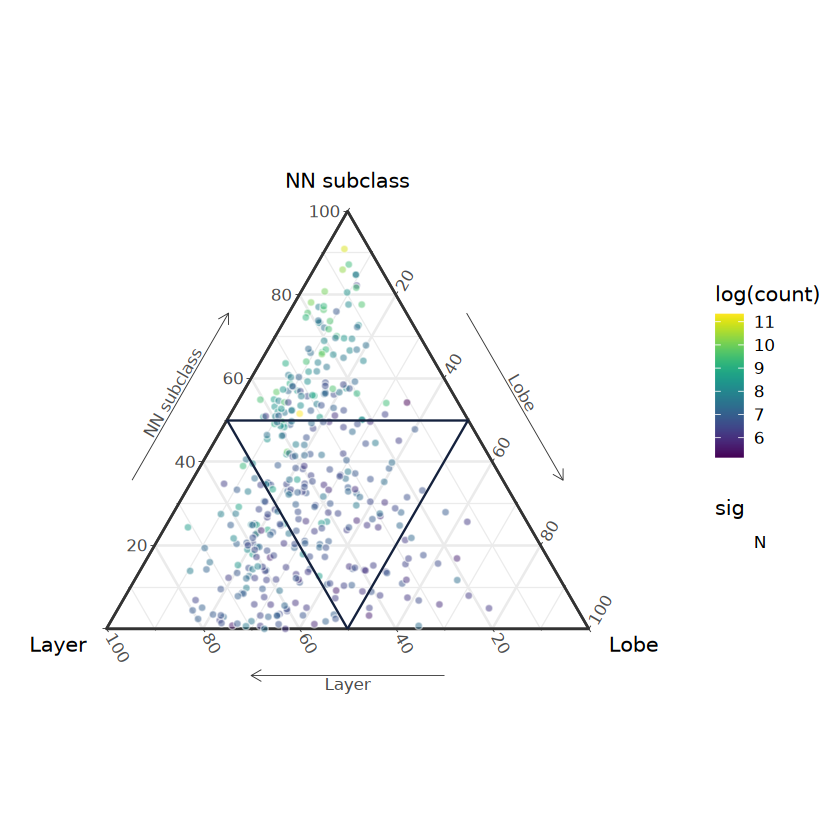

In [84]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig == "Up",]$transcript_id)
isosigc = isosigls.cl$NonNeuron_NonNeuron
huntrans2 = unique(isosigc[isosigc$sig == "Up",]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig == "Up",]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
scale_fill_viridis() +
xlab("Layer")+ 
ylab("NN subclass")+
zlab("Lobe")+ 
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_nn_lobe_dtu_delta_tern_24_05_02.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,ABLIM1,XM_005566500.2,0.18167406,1424,0.187418087,0.14631043
2,ACOT8,XM_005569186.2,0.29192547,596,0.008163265,0.12140175
3,ACSS1,XM_005568146.2,0.15625000,456,0.063950144,0.01987281
4,ADGRB3,XM_015449250.1,0.09395425,2455,0.207170224,0.07621951
5,ADIPOR2,XM_005569784.2,0.14772727,410,0.293729373,0.01987179
6,AGAP3,AGAP3-WeiLab-1,0.15811730,2796,0.203019261,0.18192488


[1] 374

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0136  0.1065  0.1688  0.1756  0.2360  0.4866 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00245 0.08333 0.13855 0.15367 0.20948 0.50179 

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0009837 0.0722242 0.1664032 0.1685317 0.2340624 0.5175593 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_nn_glu_gaba_delta_tern_24_05_15.pdf



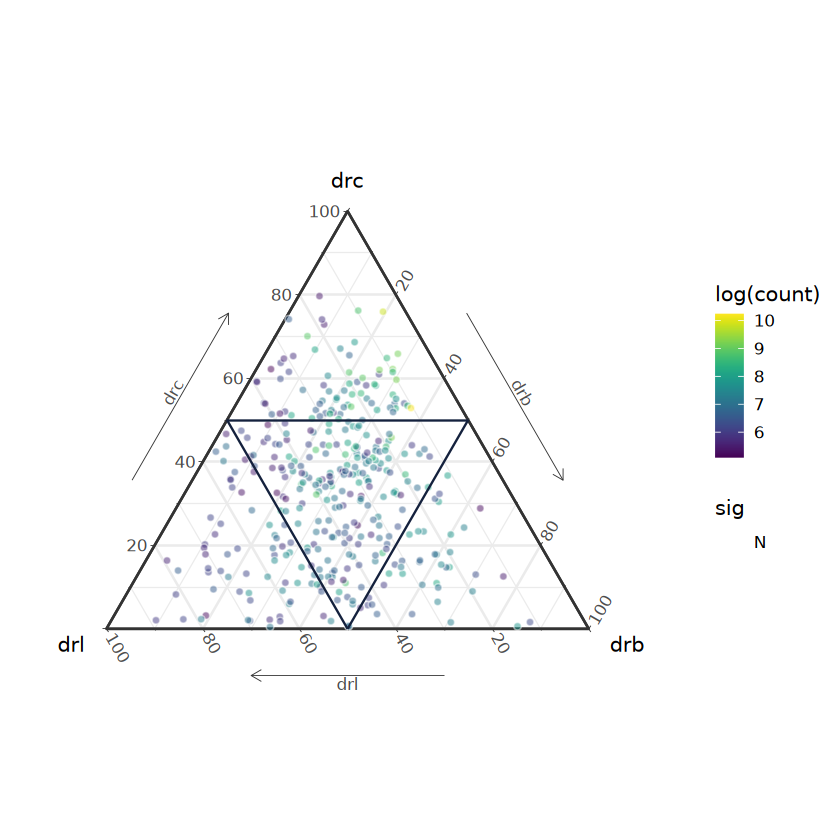

In [85]:
#
isosigl = isosigls.cl$GLU_GLU
huntrans1 = unique(isosigl[isosigl$sig == "Up",]$transcript_id)
isosigc = isosigls.cl$NonNeuron_NonNeuron
huntrans2 = unique(isosigc[isosigc$sig == "Up",]$transcript_id)
isosigb = isosigls.cl$GABA_GABA
huntrans3 = unique(isosigb[isosigb$sig == "Up",]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_nn_glu_gaba_delta_tern_24_05_15.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


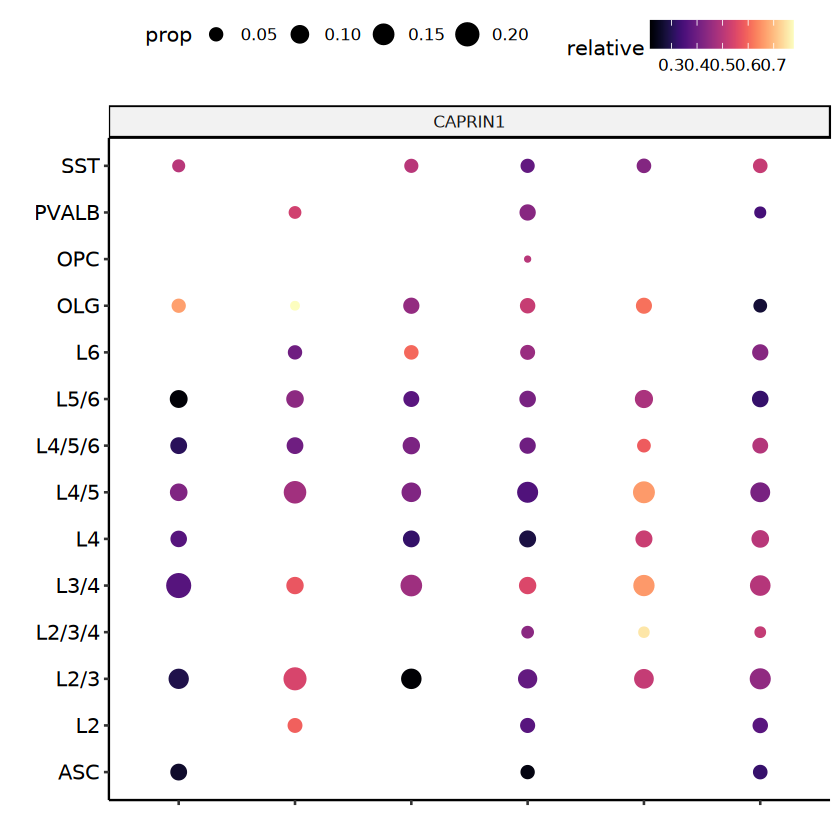

file saved to result/figure4/spatial_contribution_lobe_case_CAPRIN1_05_02.pdf



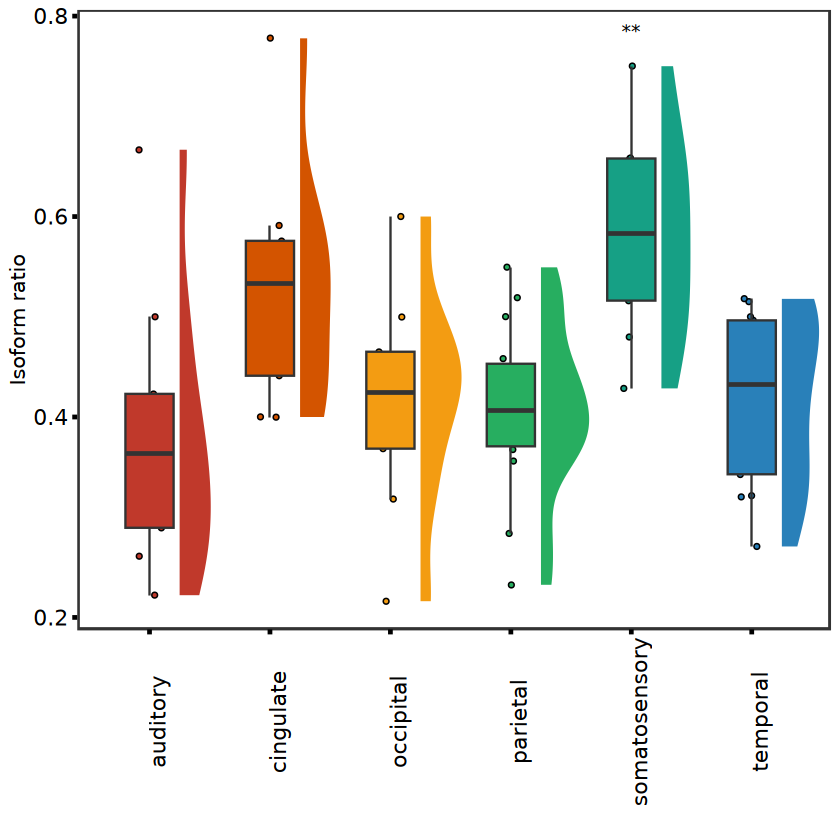

In [732]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("XM_015434930.1")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtsb.case = transtsbf[transtsbf$transcript_id %in% transex,]
transtsb.case = transtsb.case %>% group_by(transcript_id) %>% filter(length(subclass) > 5)
transtsb.case = transtsb.case[transtsb.case$count > 5,]

isosigb = isosigls$lobe
isosigb = isosigb[,c("areatr","meanrelative","transcript_id")]

colnames(isosigb)[1] = "lobe"
transtsb.case = merge(transtsb.case,isosigb,by = c("lobe","transcript_id"))
transtsb.case$drc = transtsb.case$relative - transtsb.case$meanrelative
pburble = ggplot(transtsb.case,aes(x = lobe,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtsb.case,aes(x = lobe,y = relative,fill = lobe)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_CAPRIN1_05_02.pdf",width = 5,height = 8)

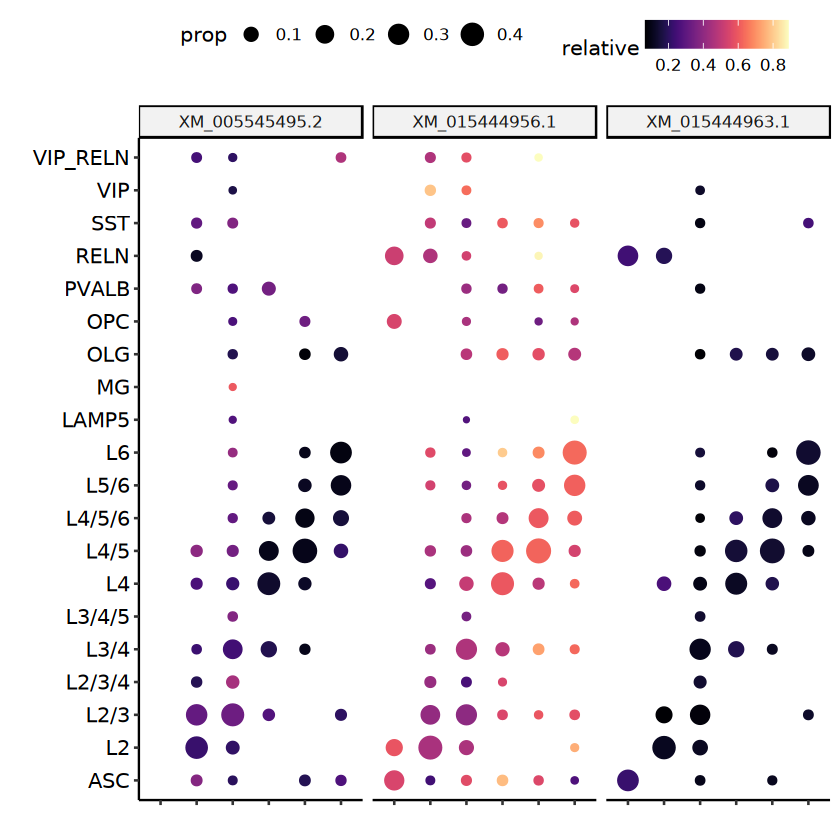

file saved to result/figure4/spatial_contribution_lobe_case_DDRGK1-WeiLab-1_05_02.pdf



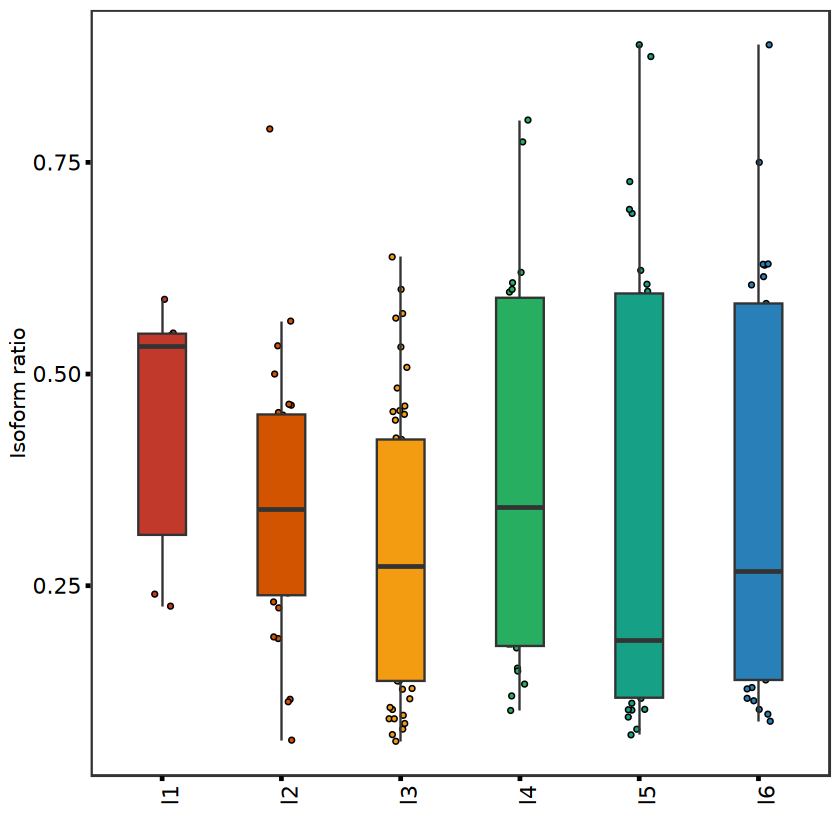

In [856]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("XM_005545495.2","XM_015444956.1","XM_015444963.1")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtslf.case = transtslf[transtslf$transcript_id %in% transex,]
transtslf.case = transtslf.case[transtslf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtslf.case,aes(x = layer,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~transcript_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtslf.case,aes(x = layer,y = relative,fill = layer)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_DDRGK1-WeiLab-1_05_02.pdf",width = 5,height = 8)

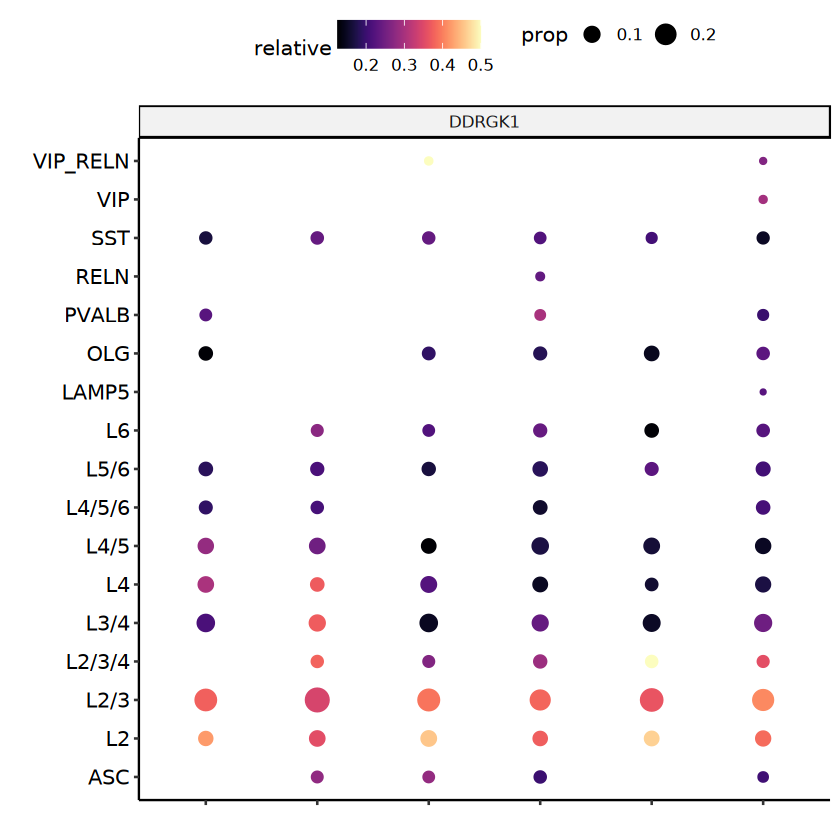

file saved to result/figure4/spatial_contribution_lobe_case_DDRGK1-WeiLab-1_05_02.pdf



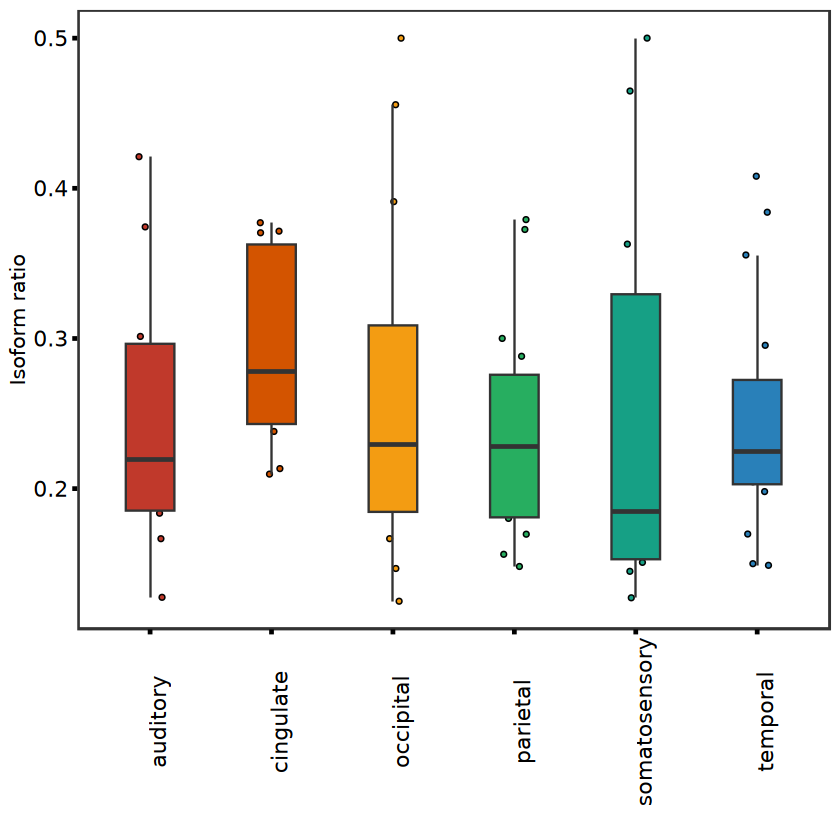

In [858]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("DDRGK1-WeiLab-1")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtsbf.case = transtsbf[transtsbf$transcript_id %in% transex,]
transtsbf.case = transtsbf.case[transtsbf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtsbf.case,aes(x = lobe,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtsbf.case,aes(x = lobe,y = relative,fill = lobe)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_DDRGK1-WeiLab-1_05_02.pdf",width = 5,height = 8)

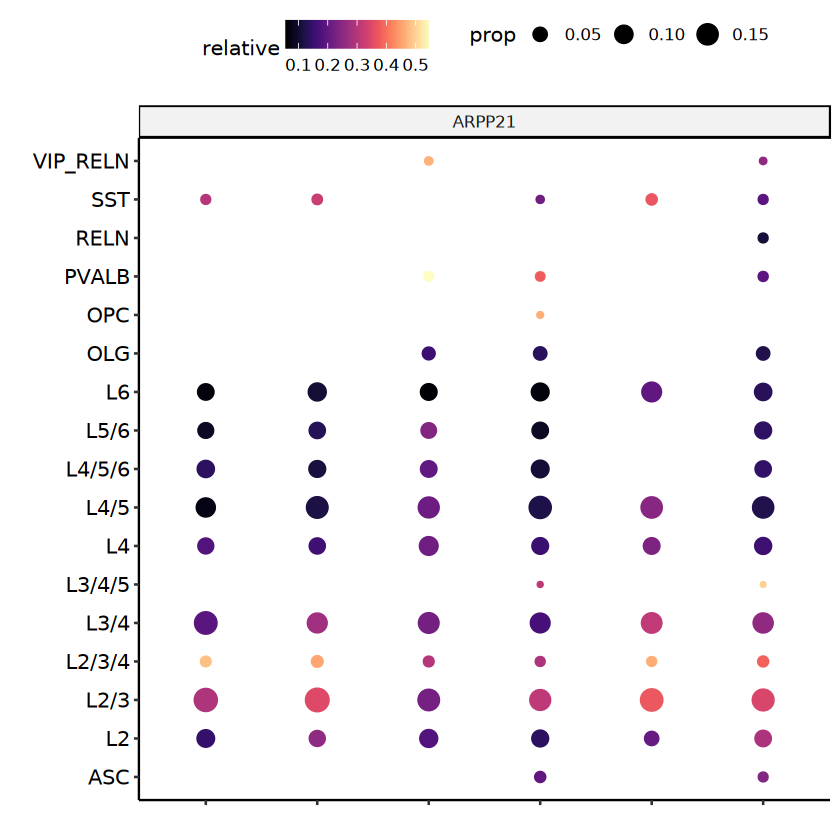

file saved to result/figure4/spatial_contribution_lobe_case_ARPP21_05_02.pdf



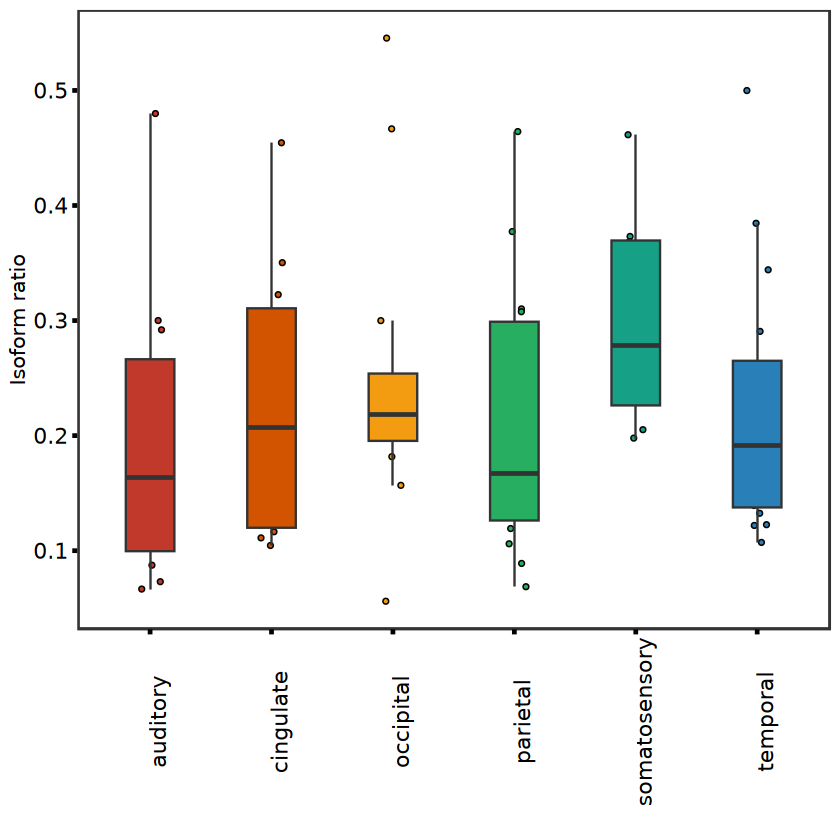

In [865]:
transex = c("XM_005545495.2")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtsbf.case = transtsbf[transtsbf$transcript_id %in% transex,]
transtsbf.case = transtsbf.case[transtsbf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtsbf.case,aes(x = lobe,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtsbf.case,aes(x = lobe,y = relative,fill = lobe)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_ARPP21_05_02.pdf",width = 5,height = 8)

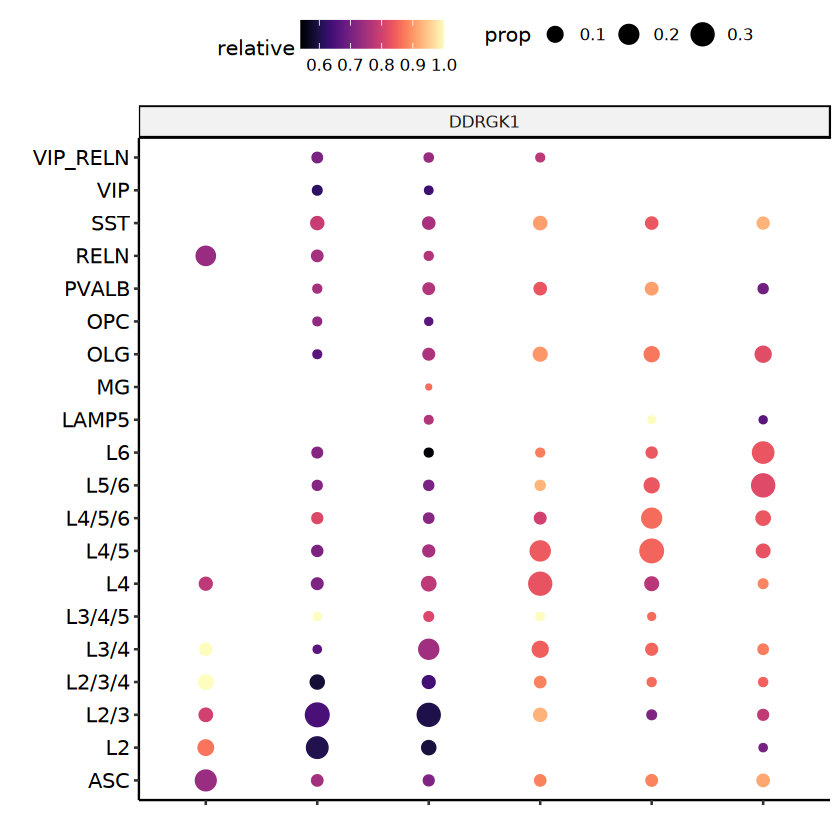

file saved to result/figure4/spatial_contribution_layer_case_DDRGK1-WeiLab-1_05_02.pdf



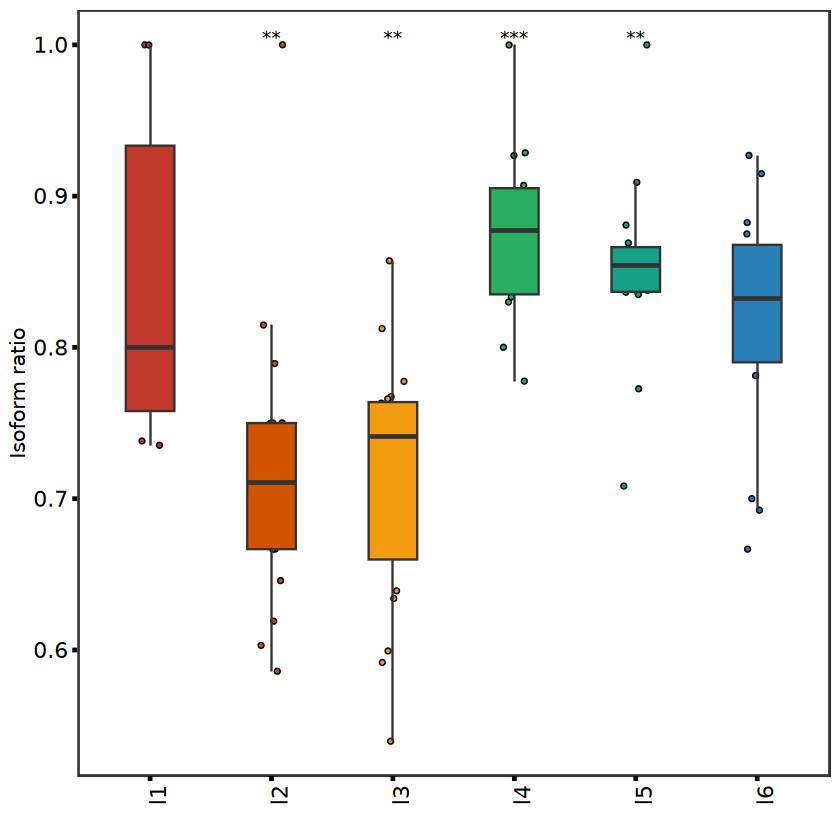

In [866]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("XM_005568473.2")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtslf.case = transtslf[transtslf$transcript_id %in% transex,]
transtslf.case = transtslf.case[transtslf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtslf.case,aes(x = layer,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtslf.case,aes(x = layer,y = relative,fill = layer)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_layer_case_DDRGK1-WeiLab-1_05_02.pdf",width = 5,height = 8)

Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"


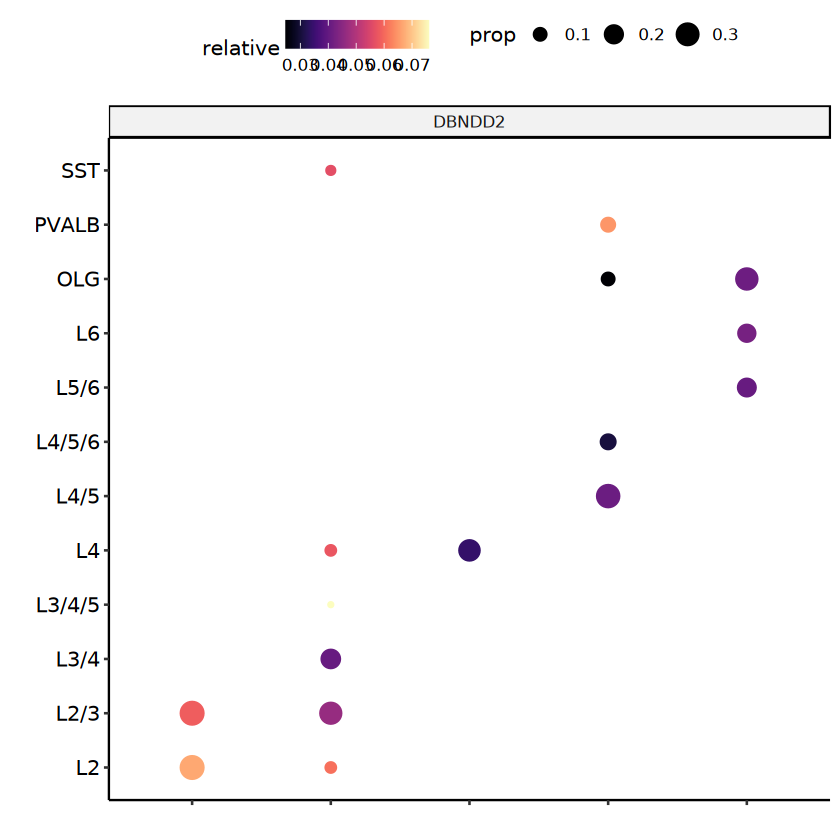

Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
file saved to result/figure4/spatial_contribution_layer_case_DBNDD2_05_02.pdf



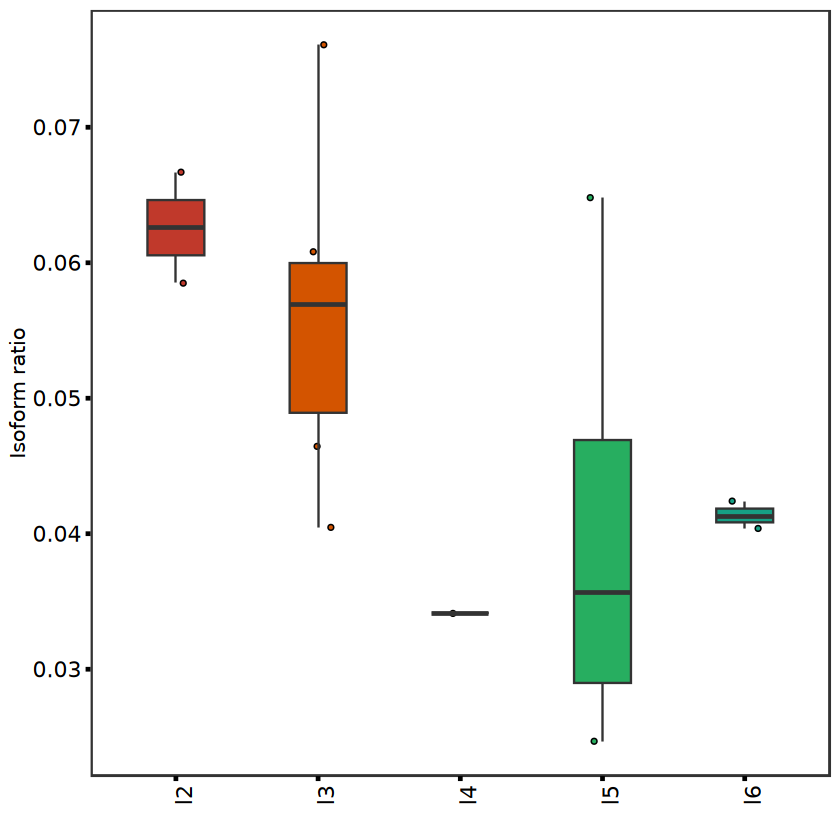

In [875]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("XM_005569136.2")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtslf.case = transtslf[transtslf$transcript_id %in% transex,]
transtslf.case = transtslf.case[transtslf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtslf.case,aes(x = layer,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtslf.case,aes(x = layer,y = relative,fill = layer)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_layer_case_DBNDD2_05_02.pdf",width = 5,height = 8)

In [873]:
transtslf[transtslf$gene_id == "DBNDD2",]

gene_id,transcript_id,areatr,count,genecount,layer,subclass,relative,prop,drp,drb
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
DBNDD2,DBNDD2-WeiLab-1,l2-L2,11,165,l2,L2,0.06666667,0.33333333,0.113945578,0.002946593
DBNDD2,DBNDD2-WeiLab-1,l2-L2/3,11,188,l2,L2/3,0.05851064,0.33333333,0.186766056,0.006012689
DBNDD2,DBNDD2-WeiLab-1,l3-L2,11,181,l3,L2,0.06077348,0.07482993,-0.144557823,-0.002946593
DBNDD2,DBNDD2-WeiLab-1,l3-L2/3,41,882,l3,L2/3,0.04648526,0.27891156,0.132344288,-0.006012689
DBNDD2,DBNDD2-WeiLab-1,l3-L3/4,31,766,l3,L3/4,0.04046997,0.21088435,0.105235931,0.000000000
DBNDD2,DBNDD2-WeiLab-1,l3-L3/4/5,7,92,l3,L3/4/5,0.07608696,0.04761905,0.013844797,0.000000000
DBNDD2,DBNDD2-WeiLab-1,l3-L4,11,191,l3,L4,0.05759162,0.07482993,-0.057609797,0.011722641
DBNDD2,DBNDD2-WeiLab-1,l3-SST,9,160,l3,SST,0.05625000,0.06122449,0.015083903,0.000000000
DBNDD2,DBNDD2-WeiLab-1,l4-L4,7,205,l4,L4,0.03414634,0.25925926,0.126819530,-0.011722641


In [ ]:
testdf = read.delim("../script/map_ngs_nano_4.0/data/ont_revo_MBP_test_res",skip = 1,header = F)
testdft = fread("../script/map_ngs_nano_4.0/data/ont_revo_MBP_test",header = F)
length(unique(testdft$V1))
length(unique(testdf$V1))
summary(testdf$V5)
length(unique(testdf[testdf$V5<=5,]$V1))/length(unique(testdft$V1))

In [ ]:
testdf = read.delim("../script/map_ngs_nano_4.0/data/cyclone_revo_MBP_test_res",skip = 1,header = F)
testdft = fread("../script/map_ngs_nano_4.0/data/cyclone_revo_MBP_test",header = F)
length(unique(testdft$V1))
length(unique(testdf$V1))
summary(testdf$V5)
length(unique(testdf[testdf$V5<=5,]$V1))/length(unique(testdft$V1))

### Module case stat

#### module 1 superficial-GLU vs deep-GLU

In [352]:
#Calculate superficial layer vs deep layer
isosigl = isosigls$layer
isosigl$group = "superficial"
isosigl[isosigl$areatr %in% paste0("l",4:6),]$group = "deep"
isosigl.st = isosigl %>% group_by(gene_id,transcript_id) %>% summarise(ms = mean(relative[group == "superficial"]),
                                                                      md = mean(relative[group != "superficial"]),
                                                                      dr = ms - md,
                                                                       counts = sum(count[group == "superficial"]),
                                                                       countd = sum(count[group != "superficial"]),
                                                                       pvalue =  tryCatch(t.test(relative[group == "superficial"],
                                                                                     relative[group != "superficial"])$p.value, error = function(e)1))
isosigl.st = isosigl.st[isosigl.st$counts > 30 & isosigl.st$countd > 30 ,]                                                                                  
length(unique(isosigl.st$gene_id))

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


[1] 2790

In [429]:
isosigl.st$padj = p.adjust(isosigl.st$pvalue)
#isosigl.st[isosigl.st$pvalue < 0.01 & abs(isosigl.st$dr) > 0.1,]
isosigl.st.hub = isosigl.st[isosigl.st$pvalue < 0.05 & abs(isosigl.st$dr) > 0.05 ,]
length(unique(isosigl.st.hub$gene_id))
isosigl.st.hub

[1] 87

gene_id,transcript_id,ms,md,dr,counts,countd,pvalue,padj
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
ABI1,XM_005564816.2,0.75009946,0.69150726,0.05859219,1913,1298,0.047175943,1
AKAP17A,XM_005595658.2,0.20877397,0.11926733,0.08950664,104,53,0.028188934,1
AKAP17A,XM_005595660.2,0.79122603,0.88073267,-0.08950664,447,396,0.028188934,1
APIP,XM_005578209.2,0.64181684,0.73470918,-0.09289234,702,783,0.026686561,1
ARPP21,XM_005545495.2,0.27970706,0.13471368,0.14499338,4418,1555,0.028702595,1
ARPP21,XM_015444956.1,0.41462198,0.57737412,-0.16275215,5755,6744,0.005145743,1
ATP1B3,XM_015444365.1,0.59993214,0.66367181,-0.06373967,1087,1065,0.042105979,1
BABAM1,XM_005588361.2,0.66707016,0.72038980,-0.05331965,3084,2587,0.037249561,1
BTBD17,XM_005584838.2,0.88674540,0.79121278,0.09553262,290,159,0.007700795,1


In [118]:
#load mdg from module file
spmd = read.csv("result/figure2/sigiso_layer_transcript_dr_cluster_tab_05_01.csv")
mdg1 = spmd[spmd$cluster %in% 5,]
head(spmd)
mdg1$gene_id

,gene_id,transcript_id,cluster
,<chr>,<chr>,<int>
1,ABCA5,XM_005584800.2,3
2,ABCB8,XM_005551170.2,4
3,ABHD18,XM_015450817.1,6
4,ADAL,XM_005559347.2,4
5,ADARB2,ADARB2-WeiLab-1,2
6,ADGRE5,XM_005588241.2,1


[1] "ARHGAP17"        "ARPP21"          "ATXN7L1"         "BBS1"           
  [5] "BCAS1"           "BambuGene122611" "BambuGene132798" "BambuGene2416"  
  [9] "BambuGene31342"  "BambuGene49690"  "BambuGene74643"  "C15H9orf24"     
 [13] "C19H19orf48"     "C8H8orf82"       "CDH20"           "CDK18"          
 [17] "CERCAM"          "DCAF12"          "DDRGK1"          "DHX8"           
 [21] "DIAPH3"          "EPB41"           "EXOSC3"          "FAM122B"        
 [25] "FAM189A1"        "FAM92B"          "FOXH1"           "FRMD3"          
 [29] "GBGT1"           "GDPD1"           "GMPPB"           "GOLPH3L"        
 [33] "GPC6"            "GRIN3A"          "GSTM4"           "HHIP"           
 [37] "ING5"            "JRK"             "KIAA1586"        "KIAA2012"       
 [41] "L3MBTL4"         "LOC102115727"    "LOC102119828"    "LOC102121717"   
 [45] "LOC102125244"    "LOC102127051"    "LOC102127469"    "LOC102132317"   
 [49] "LOC102132457"    "LOC102136791"    "LOC102139497"    "LOC102140280"   
 [53] "LOC102140491"    "LOC102143207"    "LOC102143483"    "LOC102145544"   
 [57] "LOC102146764"    "LOC107126709"    "LOC107127393"    "LOC107127837"   
 [61] "LOC107128891"    "LOC107129611"    "LOC107130005"    "LOC107130229"   
 [65] "LOC107130376"    "LOC107130500"    "LRRC24"          "MAG"            
 [69] "MATN2"           "MOG"             "MRPL54"          "NAIF1"          
 [73] "NCKAP5"          "NINJ2"           "NUDT5"           "NUDT7"          
 [77] "OGFOD2"          "OXSM"            "P2RX6"           "PAAF1"          
 [81] "PCDHB4"          "PDCD2L"          "PHF11"           "PLEKHG3"        
 [85] "PON3"            "PRR5L"           "PSMC3IP"         "RASGRP3"        
 [89] "RBBP9"           "RIPPLY2"         "SERPINB9"        "SGK1"           
 [93] "SHROOM4"         "SLC45A3"         "ST18"            "TBC1D32"        
 [97] "THOC3"           "TMEM98"          "TNXB"            "WDR89"          
[101] "YTHDC2"          "ZBED3"           "ZNF334"          "ZNF555"

[1] "ARPP21"       "BBS1"         "BCAS1"        "DCAF12"       "DDRGK1"      
 [6] "EXOSC3"       "GMPPB"        "GSTM4"        "KIAA1586"     "LOC102132457"
[11] "LOC102136791" "LOC102146764" "LOC107130376" "LOC107130427" "LOC107130500"
[16] "LRRC24"       "MATN2"        "MOG"          "PAAF1"        "PCDHB4"      
[21] "PLEKHG3"      "SGK1"         "ST18"         "TNXB"

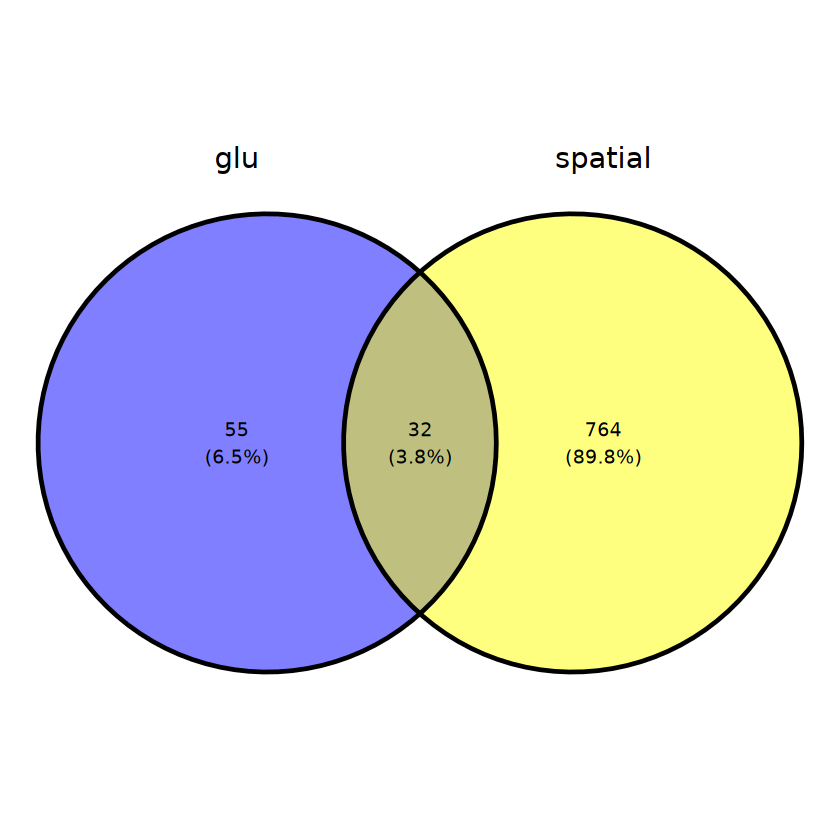

In [425]:
isosigi = isosigls.cl$GLU_GLU
glug = unique(isosigi[isosigi$sig != "N",]$gene_id)
library(ggvenn)
ggvenn(list("glu" = isosigl.st.hub$gene_id, "spatial" = spmd$gene_id))
intersect(glug,mdg1$gene_id)

[1] 104

[1] 104

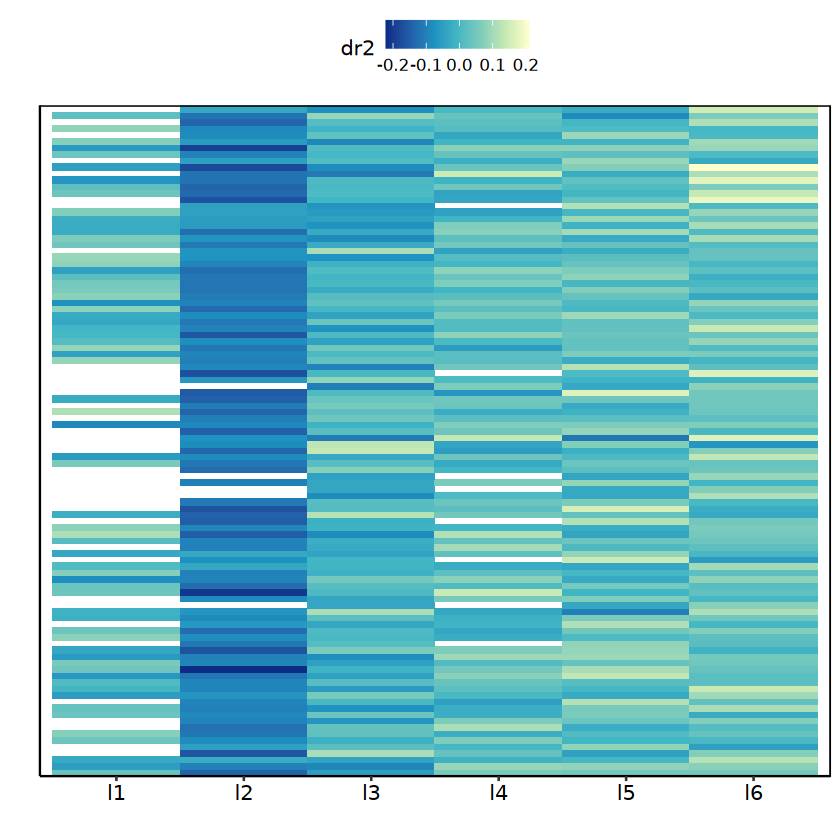

In [823]:
#mdg1 = c(unique(isosigl.st.hub$gene_id),"ARPP19","MATN2")
isosigs = isosigls$layer
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg1$gene_id,]
length(unique(isosigs$gene_id))
#isosigsf = isosigs[isosigs$dr2 > 0.04,]
hubtrans = mdg1$transcript_id
#hubtrans = isosigl.st.hub$transcript_id
hubtrans = c(hubtrans,"XM_015452431.1","MATN2-WeiLab-1")
#hubtrans = c("XM_005545495.2","XM_015444963.1","XM_015444956.1")
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
#isosigs = isosigs[isosigs$transcript_id %in% genetrstf$transcript_id,]
isosigs = isosigs[order(isosigs$gene_id,isosigs$areatr,isosigs$dr2),]
length(unique(isosigs$gene_id))
pmd1cs = ggplot(isosigs,aes(x = areatr, y = gene_id, fill = dr2)) + 
geom_tile() +
scale_fill_distiller(palette = "YlGnBu") +
#scale_fill_gradient2(low = "white",high = rgb(137,1,4,maxColorValue = 255)) + 
scale_size_continuous(range = c(0.01,5)) +
theme_pubr() + labs(x = "",y = "") +
theme(axis.text.y = element_blank(),
      axis.ticks.y = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
     panel.border = element_rect(fill = NA))
pmd1cs
#ggexport(pmd1cs,filename = "result/figure4/moduel1_cases_layer_plot_24_04_15.pdf",width = 3,height = 5)

file saved to result/figure4/moduel1_cases_layer_boxplot_24_05_02.pdf



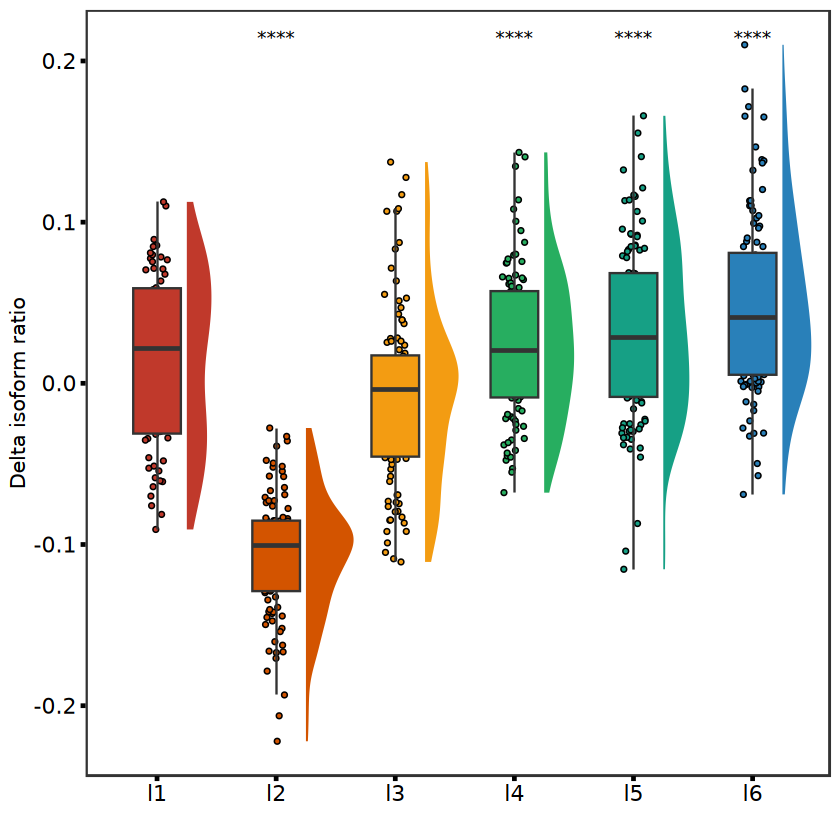

In [816]:
pmd1cs2 = ggplot(isosigs,aes(x = areatr, y = dr2, fill = areatr))+
  geom_jitter(shape=21,size=1,width=0.1) +
  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  theme_bw()+
  theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
pmd1cs2
ggexport(pmd1cs2,filename = "result/figure4/moduel1_cases_layer_boxplot_24_05_02.pdf",width = 5,height = 3)

In [119]:
isosub2 = fsrawdp %>% group_by(subclass,gene_id) %>% 
    mutate(readnumt = length(unique(readid))) %>% 
    group_by(subclass,gene_id,transcript_id)  %>% 
    summarise(readnum = length(unique(readid)),
              readnumt = readnumt[1],
              relative = readnum/readnumt)
isosub2 = isosub2 %>% group_by(transcript_id) %>% 
    mutate(meanrelative = mean(relative),
           otherrelative = (sum(relative) - relative)/(n() - 1))
isosub2 = isosub2 %>% group_by(gene_id) %>% 
    mutate(readnorm = readnumt/sum(readnumt[!duplicated(subclass)]))
isosub2f = isosub2[isosub2$subclass != "" & isosub2$readnumt > 5,]
head(isosub2f)

`summarise()` has grouped output by 'subclass', 'gene_id'. You can override
using the `.groups` argument.


subclass,gene_id,transcript_id,readnum,readnumt,relative,meanrelative,otherrelative,readnorm
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
ASC,A2ML1,XM_015430338.1,9,9,1.0000,0.97101449,0.96521739,0.25000000
ASC,AAAS,AAAS-WeiLab-1,2,16,0.1250,0.06812125,0.06243338,0.01362862
ASC,AAAS,XM_005571001.1,13,16,0.8125,0.82595946,0.82670721,0.01362862
ASC,AAAS,XM_015430972.1,1,16,0.0625,0.03143181,0.02521817,0.01362862
ASC,AACS,NM_001284010.1,75,80,0.9375,0.92985576,0.92950829,0.01880141
ASC,AACS,XM_015430724.1,5,80,0.0625,0.08962875,0.09122456,0.01880141


[1] 104

file saved to result/figure4/moduel1_subclass_boxplot_24_05_02.pdf



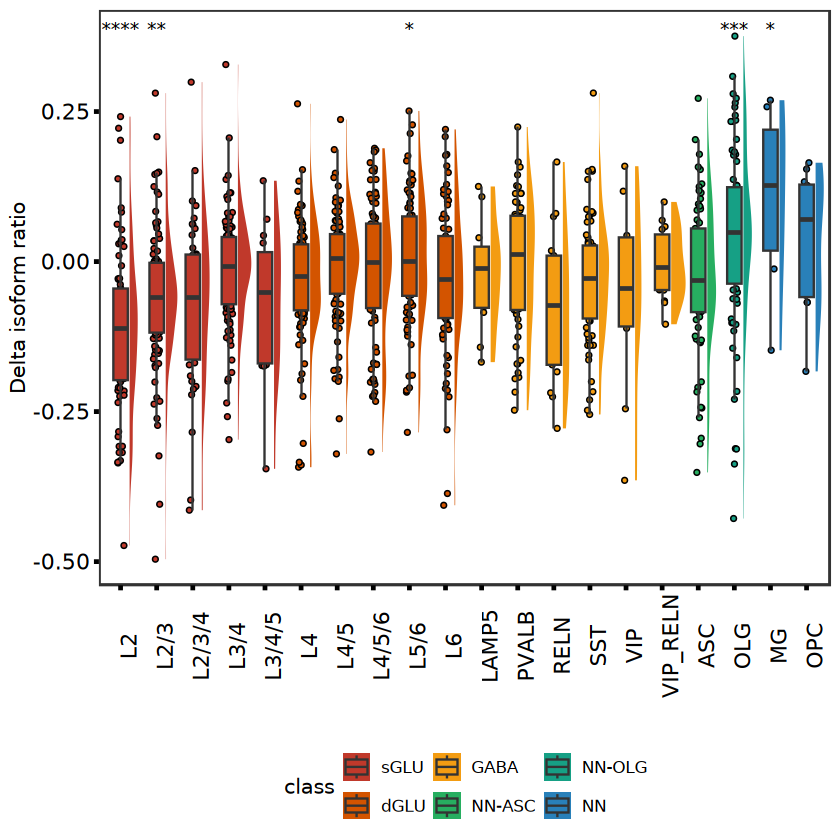

In [824]:
#boxplot stat
isosigs = isosub2f
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg1$gene_id,]
hubtrans = mdg1$transcript_id
hubtrans = c(hubtrans,"XM_015452431.1","MATN2-WeiLab-1")
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs$class = subclassan[match(isosigs$subclass,subclassan$subclass),]$class
isosigs$class = factor(isosigs$class,levels = c('sGLU','dGLU','GABA','NN-ASC','NN-OLG','NN'))
isosigs = isosigs[order(isosigs$class,isosigs$subclass),]
isosigs$subclass = factor(isosigs$subclass,levels = unique(isosigs$subclass))
isosigs = isosigs %>% group_by(subclass) %>% filter(length(unique(transcript_id)) > 1)
length(unique(isosigs$gene_id))

psubc3 = ggplot(isosigs,aes(x = subclass, y = dr2, fill = class))+
  geom_jitter(aes(fill = class),shape=21,size=1,width=0.1) +
  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  theme_bw()+
  theme(panel.grid = element_blank(),legend.position = "bottom",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
psubc3
ggexport(psubc3,filename = "result/figure4/moduel1_subclass_boxplot_24_05_02.pdf",width = 5,height = 5)

[1] 1


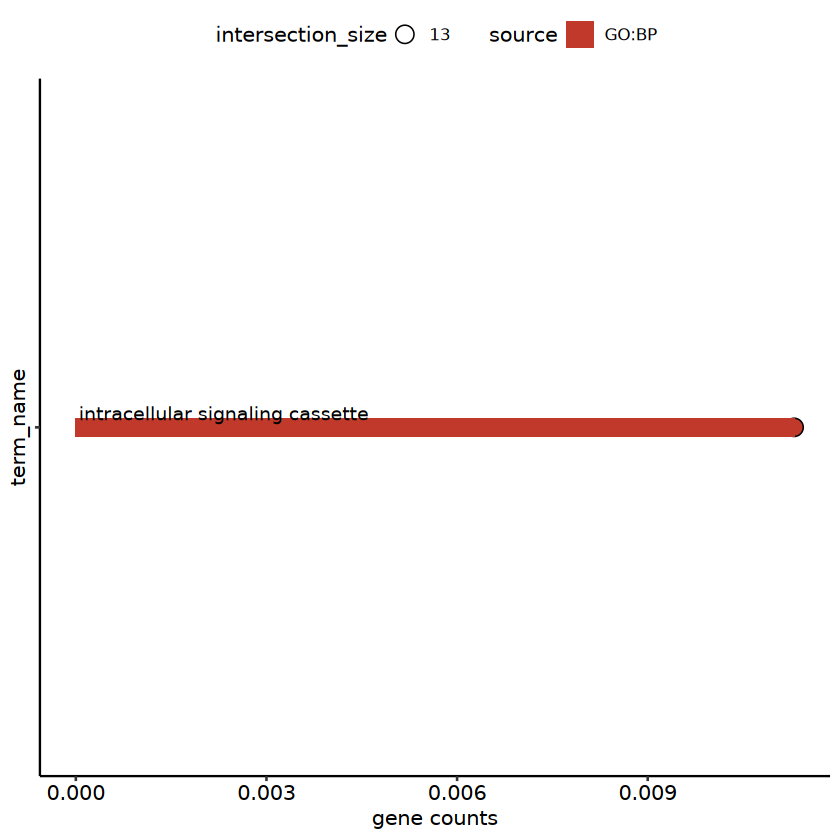

In [427]:
go1 = MyGOCal(unique(isosigl.st.hub$gene_id),5)
pgi = ggplot(go1,
               aes(x = gene_ratio, y=term_name,fill = source)) + 
        geom_point(aes(size = intersection_size),shape = 21) +
        geom_bar(stat = "identity",width = 0.03) +
        geom_text(aes(label = term_name,x = 0),hjust = -0.01,vjust = -0.5) +
        scale_fill_manual(values = mycolor) +
 #       scale_fill_viridis(direction = 1,option = "A") +
        #scale_fill_distiller(direction = 1,palette = "Greens") +
    # scale_y_discrete(labels = rev(unique(godftf$term_name))) +
        xlab("gene counts") +
        theme_pubr() + theme(legend.position = "top",axis.text.y = element_blank())
#        ggtitle(mytitle)
pgi

In [120]:
isosub = fsrawdp %>% group_by(layer,subclass,gene_id) %>% 
    mutate(readnumt = length(unique(readid)),cellt = length(unique(cell_id))) %>% 
    group_by(layer,subclass,gene_id,transcript_id)  %>% 
    summarise(readnum = length(unique(readid)),
              readnumt = readnumt[1],
              cellt = cellt[1],
              relative = readnum/readnumt)
isosub = isosub %>% group_by(transcript_id) %>% 
    mutate(meanrelative = mean(relative),
           otherrelative = (sum(relative) - relative)/(n() - 1))
isosub = isosub %>% group_by(transcript_id,layer) %>% 
    mutate(readnorm = readnumt/sum(readnumt),
          cellnorm = cellt/sum(cellt))
isosubf = isosub[isosub$subclass != "" & isosub$readnumt > 5,]
head(isosub)

`summarise()` has grouped output by 'layer', 'subclass', 'gene_id'. You can
override using the `.groups` argument.


layer,subclass,gene_id,transcript_id,readnum,readnumt,cellt,relative,meanrelative,otherrelative,readnorm,cellnorm
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
l1,,A2ML1,XM_015430338.1,5,5,1,1.00000000,0.9384615,0.9333333,0.5000000,0.2000000
l1,,A3GALT2,XM_005544050.2,1,1,1,1.00000000,1.0000000,1.0000000,1.0000000,1.0000000
l1,,A4GALT,XM_015457101.1,10,12,1,0.83333333,0.9443687,0.9478385,0.8571429,0.3333333
l1,,A4GALT,XM_015457102.1,2,12,1,0.16666667,0.4029861,0.4244697,1.0000000,1.0000000
l1,,AAAS,AAAS-WeiLab-1,2,37,1,0.05405405,0.1731996,0.1791568,0.9487179,0.3333333
l1,,AAAS,AAAS-WeiLab-2,1,37,1,0.02702703,0.2078272,0.2168672,1.0000000,1.0000000


file saved to result/figure4/moduel1_cases_subclass_plot_24_05_20.pdf



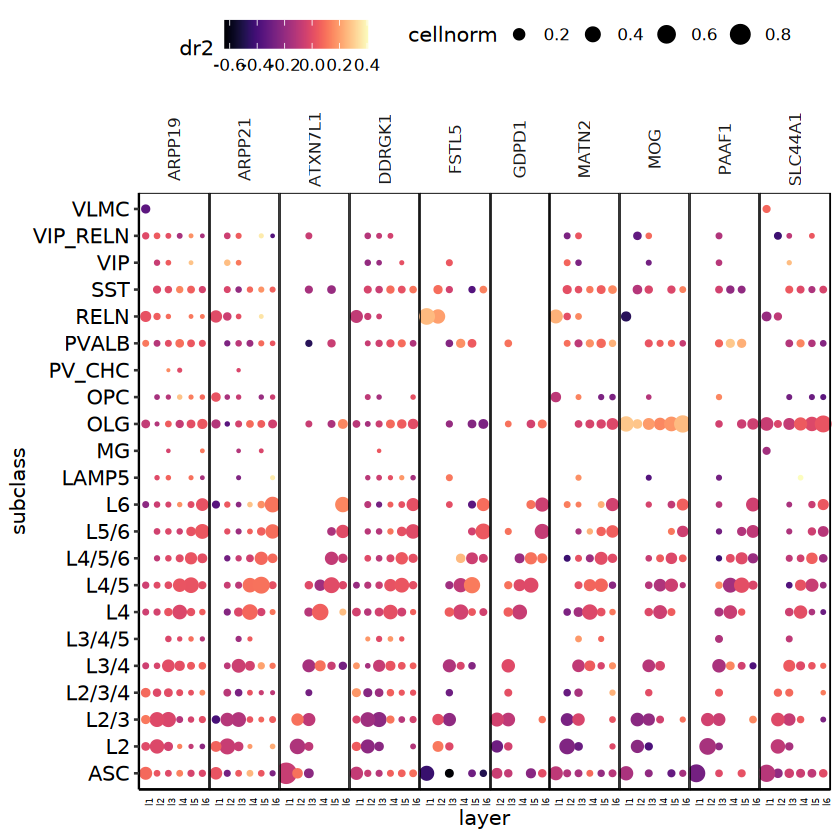

In [122]:
#case plot
# 'ARHGAP17''ARPP21''ATXN7L1''BBS1''BCAS1''BambuGene116282''BambuGene122611''BambuGene132798''BambuGene2416''BambuGene29966'
#'BambuGene31342''BambuGene38198''BambuGene56792''BambuGene73222''BambuGene74643''C15H9orf24''C19H19orf48''C8H8orf82''CDH20''CDK18'
#'CERCAM''DCAF12''DDRGK1''DHX8''DIAPH3''EPB41''EXOSC3''FAM122B''FAM189A1''FAM92B''FOXH1''FRMD3''FSTL5''GBGT1''GDPD1''GMPPB''GOLPH3L'
#'GPC6''GRIN3A''GSTM4''HHIP''ING5''JRK''KIAA1586''KIAA2012''L3MBTL4''LOC102115727''LOC102119828''LOC102121717'
#'LOC102125244''LOC102127051''LOC102127469''LOC102129025''LOC102132317''LOC102132457''LOC102136791''LOC102139497'
#'LOC102140280''LOC102140491''LOC102143207''LOC102143483''LOC102145544''LOC102146764''LOC107126709''LOC107127393'
#'LOC107127837''LOC107128891''LOC107129611''LOC107130005''LOC107130229''LOC107130376''LOC107130427''LOC107130500'
#'LRRC24''MAG''MATN2''MOG''MRPL54''NAIF1''NCKAP5''NINJ2''NUDT5''NUDT7''OGFOD2''OXSM''P2RX6''PAAF1''PCDHB4''PDCD2L''PHF11''PLEKHG3''PON3'
# 'PRR5L''PSMC3IP''RASGRP3''RBBP9''RIPPLY2''SERPINB9''SGK1''SHROOM4''SLC45A3''ST18''TBC1D32'
# 'THOC3''TMEM98''TNXB''WDR89''YTHDC2''ZBED3''ZNF334''ZNF555'
#mdg1 = c("ARPP19","ARPP21","C15H9orf142","DDRGK1","EIF2B3","IGFLR1","MATN2","SLC44A1","ZSCAN31")
mdg1n = c('ARPP19',"ARPP21","DDRGK1","ATXN7L1",'SLC44A1','FSTL5','GDPD1','BambuGene116282','MATN2','PAAF1')
isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg1n,]
#hubtrans = mdg1$transcript_id
#hubtrans = c(hubtrans,"XM_015452431.1","MATN2-WeiLab-1")
isosigs = isosigs %>% group_by(layer,gene_id) %>% filter(meanrelative == max(meanrelative))
#isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs = isosigs[order(isosigs$gene_id,isosigs$subclass,isosigs$dr2),]
pmd1cs3 = ggplot(isosigs,aes(x = subclass, y = layer, color = dr2, size = cellnorm)) + 
geom_point() +
scale_color_viridis(option = "A") +
facet_grid(~gene_id,scales = "free",space = "free") + 
scale_size_continuous(range = c(0.1,5)) +
theme_pubr() + 
theme(axis.text.x = element_text(angle = 90,size = 5),
      axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(angle = 90),
     panel.border = element_rect(fill = NA)) +
coord_flip()
pmd1cs3
ggexport(pmd1cs3,filename = "result/figure4/moduel1_cases_subclass_plot_24_05_20.pdf",width = 8,height = 5)

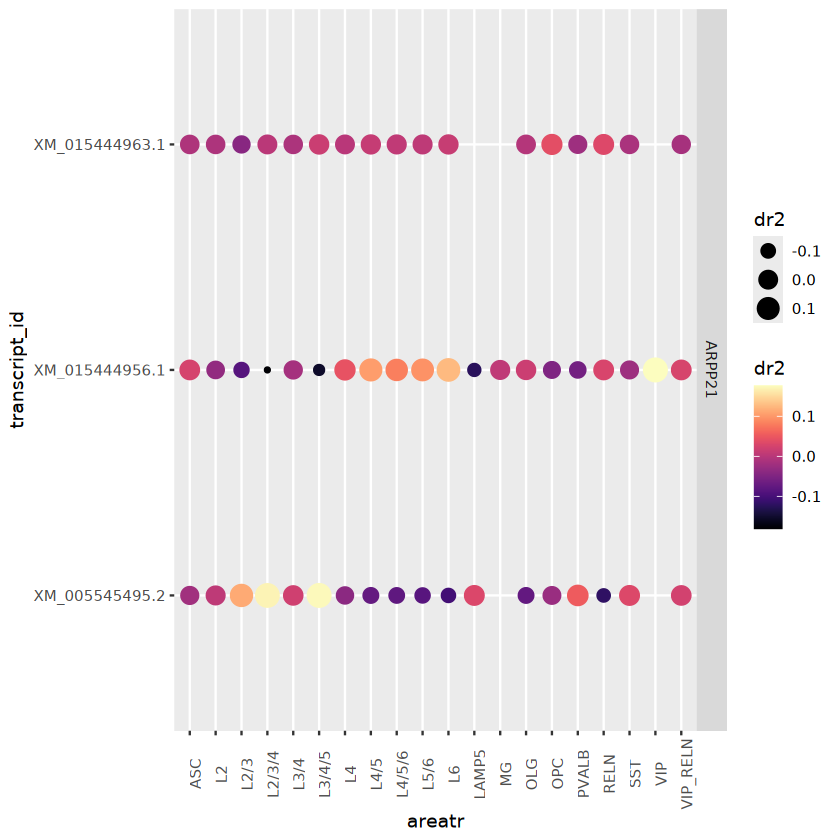

In [408]:
mdg1 = c('ARPP21')
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg1,]
#isosigsf = isosigs[isosigs$dr2 > 0.05,]
hubtrans = isosigs$transcript_id
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs = isosigs[isosigs$transcript_id %in% fsrawdp$transcript_id,]
ggplot(isosigs,aes(y = transcript_id, x = areatr, color = dr2, size = dr2)) + geom_point() +
facet_grid(gene_id~.,scales = "free") +
scale_color_viridis(option = "A") + theme(axis.text.x = element_text(angle = 90))

#### Module2 ASC layer1

In [785]:
#gene select
isosigl2 = isosigls$layer
isosigl2 = isosigl2[isosigl2$count > 10,]
isosigl2.hub = isosigl2[isosigl2$areatr == "l1" & isosigl2$sig == "Up",]
isosigl2.hub = isosigl2[isosigl2$transcript_id %in%isosigl2.hub$transcript_id ,]
isosigl2.hub = isosigl2.hub %>% group_by(transcript_id) %>% filter(length(areatr[sig == "Up"]) == 1)
length(unique(isosigl2.hub$transcript_id))
unique(isosigl2.hub$gene_id)

[1] 156

[1] "ACTA2"           "AKT3"            "APC"             "ARL6IP4"        
 [5] "ARPP21"          "ASPH"            "BambuGene103646" "BambuGene37959" 
 [9] "C15H9orf9"       "CA11"            "CAMTA1"          "CAPRIN1"        
[13] "CBR4"            "CLTA"            "CLTB"            "CTNNA2"         
[17] "DCLK1"           "DEGS2"           "DLG2"            "DNAJC7"         
[21] "DTNA"            "ERC2"            "FAM53B"          "FAM89A"         
[25] "GPM6B"           "HNRNPU"          "LAMP2"           "LOC101866646"   
[29] "LOC102130415"    "LOC102132052"    "LOC102133073"    "LOC102133863"   
[33] "LOC102136493"    "LOC102141554"    "LSMEM2"          "MACROD1"        
[37] "MAP4"            "MTERF2"          "MVB12B"          "MYL6"           
[41] "NEK11"           "NPM1"            "NTRK2"           "PAK3"           
[45] "PCDH7"           "PCID2"           "RABGAP1L"        "RBFOX2"         
[49] "RNF130"          "RPS24"           "RTN3"            "SATB1"          
[53] "SEPT8"           "SGCE"            "SLC11A2"         "SLC6A13"        
[57] "SRSF5"           "TLN1"            "TMEM203"         "TMEM223"        
[61] "TNNC1"           "TPM1"            "TPM2"

In [800]:
mdg2 = spmd[spmd$cluster %in% c(1),]
length(unique(mdg2$gene_id))

[1] 212

file saved to result/figure4/moduel2_cases_layer_plot_24_04_28.pdf



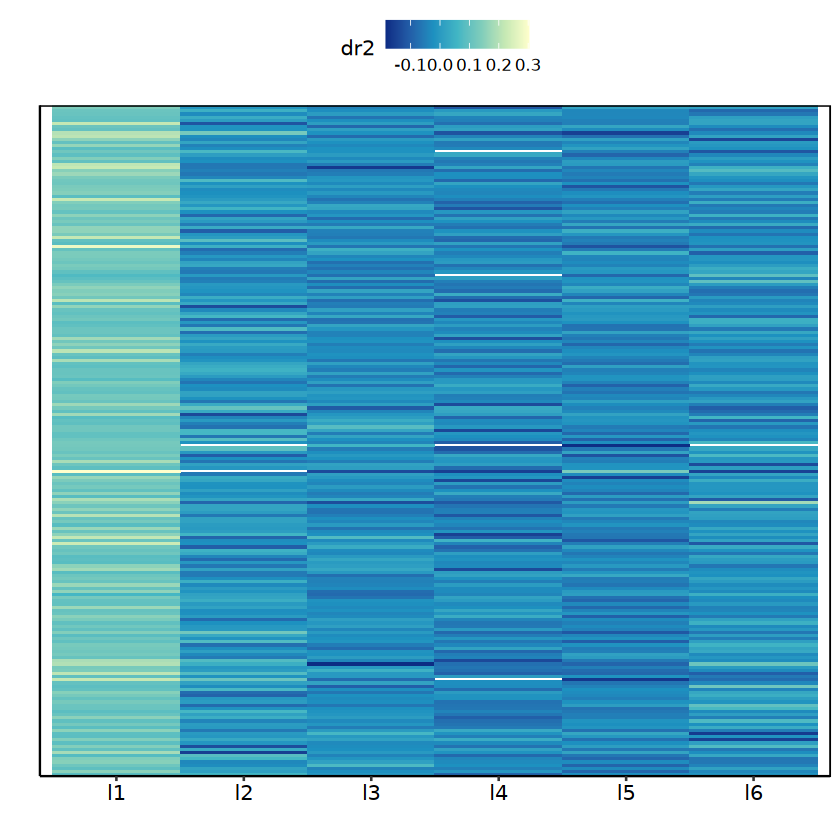

In [825]:
#mdg2 = c(unique(isosigl2.hub$gene_id))
isosigs = isosigls$layer
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg2$gene_id,]
hubtrans = mdg2$transcript_id
hubtrans = c(hubtrans)
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
#isosigs = isosigs[isosigs$transcript_id %in% genetrstf$transcript_id,]
isosigs = isosigs[order(isosigs$gene_id,isosigs$areatr,isosigs$dr2),]
pmd2cs = ggplot(isosigs,aes(x = areatr, y = gene_id, fill = dr2)) + 
geom_tile() +
scale_fill_distiller(palette = "YlGnBu") +
#scale_fill_gradient2(low = "white",high = rgb(137,1,4,maxColorValue = 255)) + 
scale_size_continuous(range = c(0.01,5)) +
theme_pubr() + labs(x = "",y = "") +
theme(axis.text.y = element_blank(),
      axis.ticks.y = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
     panel.border = element_rect(fill = NA))
pmd2cs
ggexport(pmd2cs,filename = "result/figure4/moduel2_cases_layer_plot_24_04_28.pdf",width = 3,height = 5)

file saved to result/figure4/moduel2_cases_layer_boxplot_24_05_03.pdf



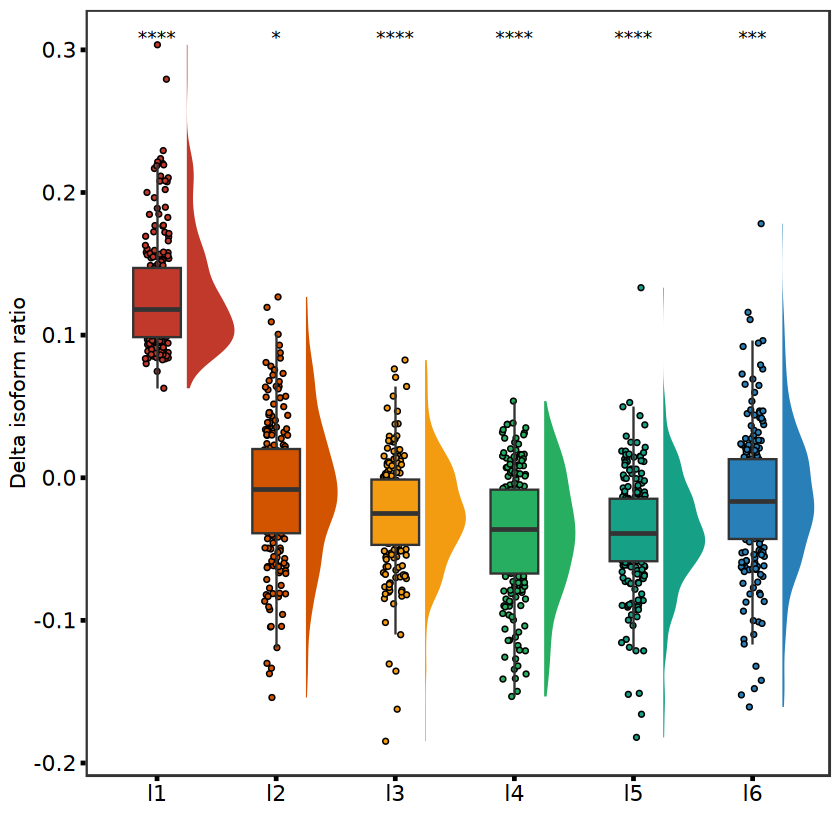

In [818]:
pmd2cs2 = ggplot(isosigs,aes(x = areatr, y = dr2, fill = areatr))+
  geom_jitter(shape=21,size=1,width=0.1) +
  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  theme_bw()+
  theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
pmd2cs2
ggexport(pmd2cs2,filename = "result/figure4/moduel2_cases_layer_boxplot_24_05_03.pdf",width = 5,height = 3)

In [ ]:
# isosub2 = fsrawdp %>% group_by(subclass,gene_id) %>% 
#     mutate(readnumt = length(unique(readid))) %>% 
#     group_by(subclass,gene_id,transcript_id)  %>% 
#     summarise(readnum = length(unique(readid)),
#               readnumt = readnumt[1],
#               relative = readnum/readnumt)
# isosub2 = isosub2 %>% group_by(transcript_id) %>% 
#     mutate(meanrelative = mean(relative),
#            otherrelative = (sum(relative) - relative)/(n() - 1))
# isosub2 = isosub2 %>% group_by(gene_id) %>% 
#     mutate(readnorm = readnumt/sum(readnumt[!duplicated(subclass)]))
# isosub2f = isosub2[isosub2$subclass != "" & isosub2$readnumt > 5,]
# head(isosub2f)

file saved to result/figure4/moduel2_subclass_boxplot_24_05_03.pdf



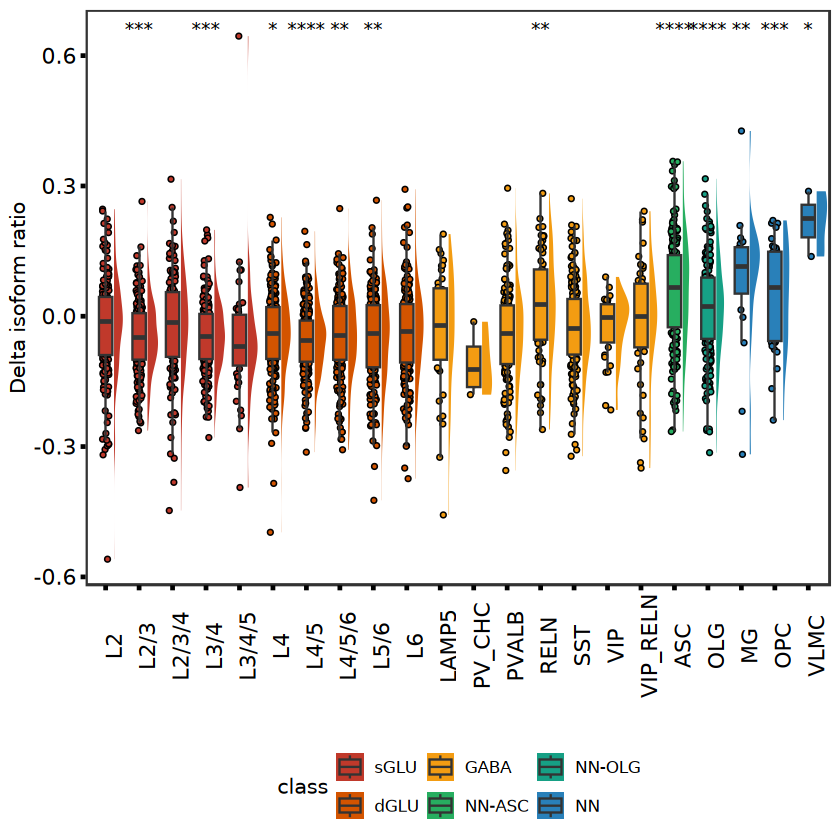

In [826]:
isosub2f = isosub2[isosub2$subclass != "" & isosub2$readnumt > 10,]
isosigs = isosub2f
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg2$gene_id,]
hubtrans = mdg2$transcript_id
hubtrans = c(hubtrans)
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs$class = subclassan[match(isosigs$subclass,subclassan$subclass),]$class
isosigs$class = factor(isosigs$class,levels = c('sGLU','dGLU','GABA','NN-ASC','NN-OLG','NN'))
isosigs = isosigs[order(isosigs$class,isosigs$subclass),]
isosigs$subclass = factor(isosigs$subclass,levels = unique(isosigs$subclass))
isosigs = isosigs %>% group_by(subclass) %>% filter(length(unique(transcript_id)) > 1)

pmd2cs2 = ggplot(isosigs,aes(x = subclass, y = dr2, fill = class))+
  geom_jitter(aes(fill = class),shape=21,size=1,width=0.1) +
  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  theme_bw()+
  theme(panel.grid = element_blank(),legend.position = "bottom",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
pmd2cs2
ggexport(pmd2cs2,filename = "result/figure4/moduel2_subclass_boxplot_24_05_03.pdf",width = 5,height = 5)

In [416]:
#case plot
# isosub = fsrawdp %>% group_by(layer,subclass,gene_id) %>% 
#     mutate(readnumt = length(unique(readid))) %>% 
#     group_by(layer,subclass,gene_id,transcript_id)  %>% 
#     summarise(readnum = length(unique(readid)),
#               readnumt = readnumt[1],
#               relative = readnum/readnumt)
# isosub = isosub %>% group_by(transcript_id) %>% 
#     mutate(meanrelative = mean(relative),
#            otherrelative = (sum(relative) - relative)/(n() - 1))
# isosub = isosub %>% group_by(gene_id) %>% 
#     mutate(readnorm = readnumt/sum(readnumt[!duplicated(paste0(layer,subclass))]))
# isosubf = isosub[isosub$subclass != "" & isosub$readnumt > 5,]
# head(isosub)
unique(mdg2$gene_id)

[1] "AHNAK"          "AIFM3"          "ARHGAP4"        "ARL15"         
  [5] "ARSE"           "ATF2"           "ATXN3"          "BCAT2"         
  [9] "BCCIP"          "BMP4"           "BORCS5"         "BambuGene18524"
 [13] "C1QTNF1"        "C4H6orf52"      "C7H14orf159"    "C7H14orf80"    
 [17] "CALD1"          "CAPG"           "CAPS"           "CBFB"          
 [21] "CC2D1B"         "CCDC146"        "CCDC80"         "CD151"         
 [25] "CDCA7L"         "CDK5RAP2"       "CEBPB"          "CEP89"         
 [29] "CEP97"          "CFAP99"         "CFH"            "CFLAR"         
 [33] "CHRNA7"         "CIB1"           "CMTM6"          "CNNM3"         
 [37] "COPZ2"          "CREBZF"         "CSF1"           "CTDSP1"        
 [41] "DAAM2"          "DCN"            "DRAM2"          "DTNA"          
 [45] "EXD3"           "FAHD1"          "FAM200A"        "FAM53B"        
 [49] "FAM71E1"        "FAM89A"         "FAT1"           "FBXL6"         
 [53] "FKBP15"         "FMNL2"          "GAN"            "GCC1"          
 [57] "GMFG"           "GPALPP1"        "GPM6B"          "GREB1"         
 [61] "GRK5"           "GSN"            "HDAC7"          "HDDC3"         
 [65] "HEMK1"          "HEPH"           "HMGXB4"         "HPS1"          
 [69] "HRASLS"         "HSPA1L"         "IFT20"          "IFT88"         
 [73] "IGF2"           "IGSF9B"         "IKBIP"          "INTS10"        
 [77] "ITGA7"          "ITGB4"          "KLF3"           "KLHL13"        
 [81] "KRBOX1"         "LIMS1"          "LITAF"          "LMO2"          
 [85] "LOC101867429"   "LOC101925857"   "LOC101925999"   "LOC102123081"  
 [89] "LOC102123548"   "LOC102124971"   "LOC102127888"   "LOC102128527"  
 [93] "LOC102133354"   "LOC102133992"   "LOC102134966"   "LOC102134982"  
 [97] "LOC102136393"   "LOC102136402"   "LOC102140005"   "LOC102143000"  
[101] "LOC102143904"   "LOC102145389"   "LOC107127262"   "LOC107128120"  
[105] "LOC107128232"   "LPP"            "LSAMP"          "LTBP1"         
[109] "LYPLAL1"        "LYST"           "MAD1L1"         "MAGIX"         
[113] "MAP2K6"         "MAP4"           "MBTPS2"         "MEGF11"        
[117] "MPHOSPH9"       "MRVI1"          "MSI2"           "MTHFS"         
[121] "MTM1"           "MX1"            "MYO1C"          "NAA35"         
[125] "NAV2"           "NETO1"          "NEXN"           "NHSL1"         
[129] "NTRK2"          "NUDT22"         "P2RX5"          "PACRG"         
[133] "PALD1"          "PALLD"          "PCSK7"          "PEBP4"         
[137] "PECAM1"         "PHB2"           "PHKA1"          "PIGP"          
[141] "PKN2"           "PLEKHB1"        "PNCK"           "PNOC"          
[145] "PPIC"           "PPP2R1B"        "PQLC2"          "PQLC3"         
[149] "PRKRIP1"        "PXN"            "RAB34"          "RABGEF1"       
[153] "RARRES2"        "RASSF2"         "RBMS1"          "RBMS2"         
[157] "RIN2"           "RNF130"         "RPS24"          "RPS6KA1"       
[161] "RRBP1"          "RTTN"           "RUNX2"          "SAAL1"         
[165] "SDSL"           "SEMA3B"         "SEMA5A"         "SERTAD2"       
[169] "SLC11A2"        "SLC25A18"       "SLC25A48"       "SLC26A11"      
[173] "SLC31A2"        "SLC38A5"        "SLC39A13"       "SLCO1A2"       
[177] "SLCO1C1"        "SLCO3A1"        "SMARCE1"        "SNAP23"        
[181] "SORBS3"         "SRSF5"          "ST3GAL1"        "ST3GAL4"       
[185] "STAB1"          "STAT3"          "TEP1"           "TJP1"          
[189] "TJP2"           "TLN1"           "TNC"            "TPM2"          
[193] "TRA2A"          "TRPT1"          "TSPAN9"         "TTC38"         
[197] "TTI1"           "TYK2"           "TYROBP"         "UBXN2A"        
[201] "UCP2"           "VWF"            "WNK2"           "XIAP"          
[205] "ZBTB7B"         "ZNF107"         "ZNF226"         "ZNF415"        
[209] "ZNF454"         "ZSCAN1"

In [117]:
#mdg2n = c('LAMP2','MYL6','NTRK2','SLC11A2','ASPH','CAMTA1','CLTA','RNF130','SGCE','PCDH7')
mdg2n = c('AHNAK','AIFM3','CIB1','MYL6','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg2n,]
hubtrans = c(mdg2$transcript_id,"MYL6-WeiLab-1")
hubtrans = c(hubtrans)
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs = isosigs[order(isosigs$gene_id,isosigs$subclass,isosigs$dr2),]
pmd2cs3 = ggplot(isosigs,aes(x = subclass, y = layer, color = dr2, size = cellnorm)) + 
geom_point() +
scale_color_viridis(option = "A") +
facet_grid(~gene_id,scales = "free",space = "free") + 
scale_size_continuous(range = c(0.1,5)) +
theme_pubr() + 
theme(axis.text.x = element_text(angle = 90,size = 5),
      axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(angle = 90),
     panel.border = element_rect(fill = NA)) +
coord_flip()
pmd2cs3
ggexport(pmd2cs3,filename = "result/figure4/moduel2_cases_subclass_plot_24_05_20.pdf",width = 8,height = 5)

ERROR: Error in eval(expr, envir, enclos): object 'mdg2' not found


file saved to result/figure4/moduel_cases_subclass_plot_24_05_02.pdf



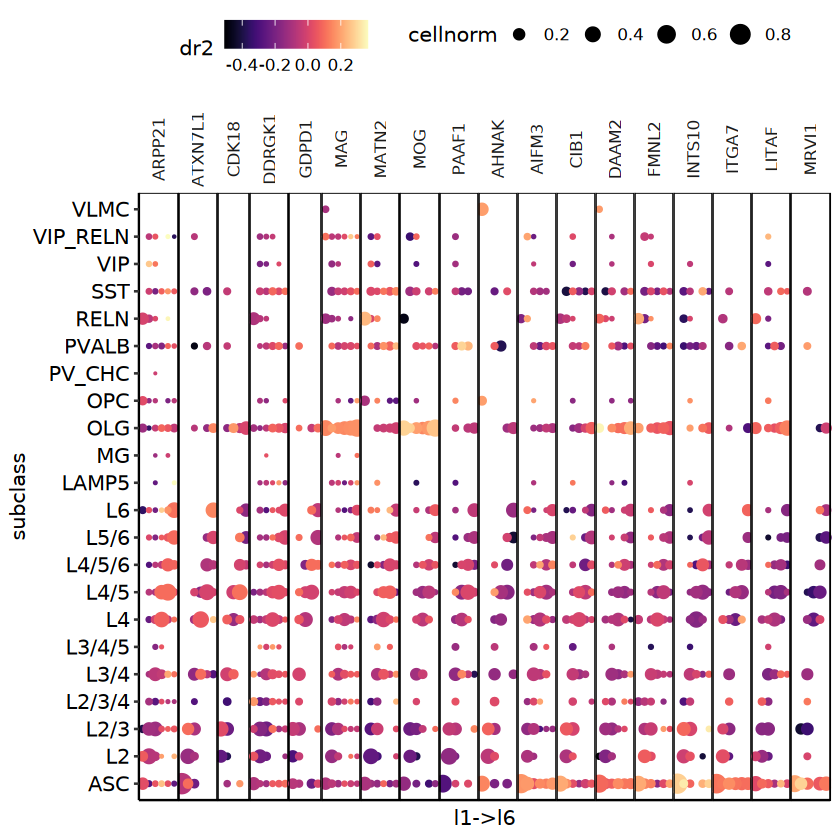

In [887]:
#mdg2n = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg2n,]
hubtrans = mdg2$transcript_id
hubtrans = c(hubtrans,"MYL6-WeiLab-1")
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs2 = isosigs[order(isosigs$gene_id,isosigs$subclass,isosigs$dr2),]

isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg1n,]
hubtrans = mdg1$transcript_id
hubtrans = c(hubtrans,"XM_015452431.1","MATN2-WeiLab-1")
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs1 = isosigs[order(isosigs$gene_id,isosigs$subclass,isosigs$dr2),]

isosigs1$group = "cluster1"
isosigs2$group = "cluster2"
isosigs = rbind(isosigs1,isosigs2)
isosigs = isosigs[order(isosigs$group,isosigs$gene_id),]
isosigs$gene_id = factor(isosigs$gene_id,levels = unique(isosigs$gene_id))

pmdcs = ggplot(isosigs,aes(x = subclass, y = layer, color = dr2, size = cellnorm)) + 
geom_point() +
scale_color_viridis(option = "A") +
facet_grid(~gene_id,scales = "free",space = "free") + 
scale_size_continuous(range = c(0.1,5)) +
theme_pubr() + 
theme(axis.text.x = element_blank(),
      axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(angle = 90),
     panel.border = element_rect(fill = NA)) + ylab("l1->l6") +
coord_flip()
pmdcs
ggexport(pmdcs,filename = "result/figure4/moduel_cases_subclass_plot_24_05_02.pdf",width = 14,height = 5)

#### Module3 OLG layer6

In [840]:
#gene select
isosigl3 = isosigls$layer
isosigl3 = isosigl3[isosigl3$count > 10,]
isosigl3.hub = isosigl3[isosigl3$areatr == "l6" & isosigl3$sig == "Up",]
isosigl3.hub = isosigl3[isosigl3$transcript_id %in%isosigl3.hub$transcript_id ,]
isosigl3.hub = isosigl3.hub %>% group_by(transcript_id) %>% filter(length(areatr[sig == "Up" & areatr %in% paste0("l",2:5)]) == 0)
length(unique(isosigl3.hub$transcript_id))
unique(isosigl3.hub$gene_id)

[1] 40

[1] "AP4E1"          "BIN1"           "BambuGene44498" "DNM3"          
 [5] "FGFR2"          "FNBP1"          "GRIA4"          "GRIN2B"        
 [9] "LOC101866646"   "LOC102132052"   "LOC102140491"   "LOC102142523"  
[13] "LRRC8B"         "MAP4"           "PDLIM7"         "PVRL3"         
[17] "R3HCC1L"        "SLC11A2"        "TLN1"           "ZNF235"        
[21] "ZNF382"         "ZNF629"

file saved to result/figure4/moduel3_cases_layer_plot_24_04_15.pdf



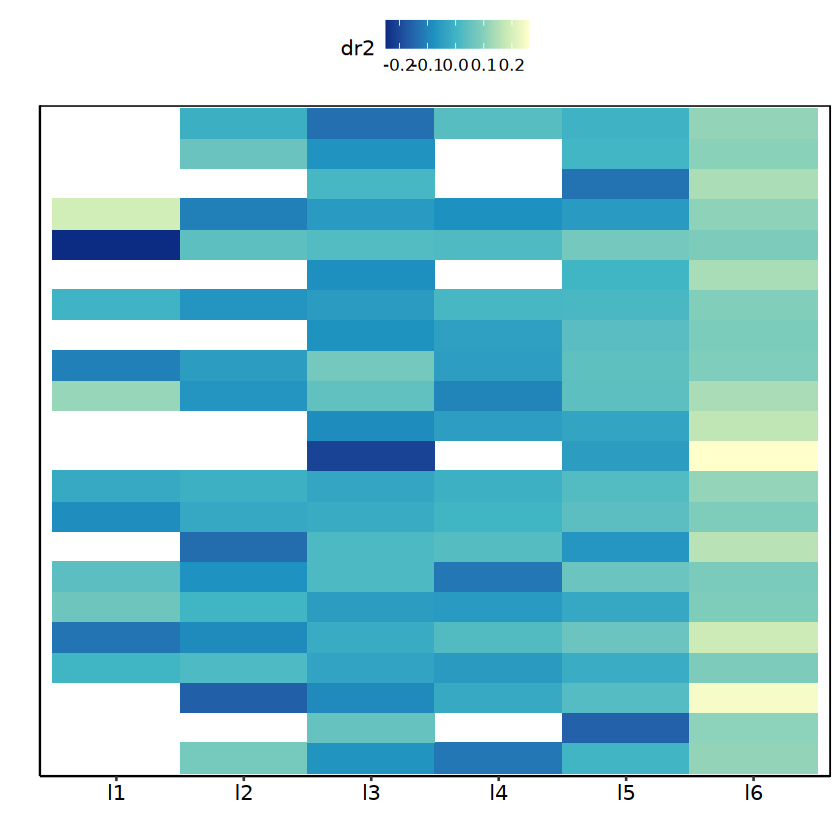

In [841]:
mdg3 = c(unique(isosigl3.hub$gene_id))
isosigs = isosigls$layer
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg3,]
hubtrans = isosigl3.hub$transcript_id
hubtrans = c(hubtrans)
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
#isosigs = isosigs[isosigs$transcript_id %in% genetrstf$transcript_id,]
isosigs = isosigs[order(isosigs$gene_id,isosigs$areatr,isosigs$dr2),]
pmd3cs = ggplot(isosigs,aes(x = areatr, y = gene_id, fill = dr2)) + 
geom_tile() +
scale_fill_distiller(palette = "YlGnBu") +
#scale_fill_gradient2(low = "white",high = rgb(137,1,4,maxColorValue = 255)) + 
scale_size_continuous(range = c(0.01,5)) +
theme_pubr() + labs(x = "",y = "") +
theme(axis.text.y = element_blank(),
      axis.ticks.y = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
     panel.border = element_rect(fill = NA))
pmd3cs
ggexport(pmd3cs,filename = "result/figure4/moduel3_cases_layer_plot_24_04_15.pdf",width = 3,height = 5)

file saved to result/figure4/moduel3_subclass_boxplot_24_04_15.pdf



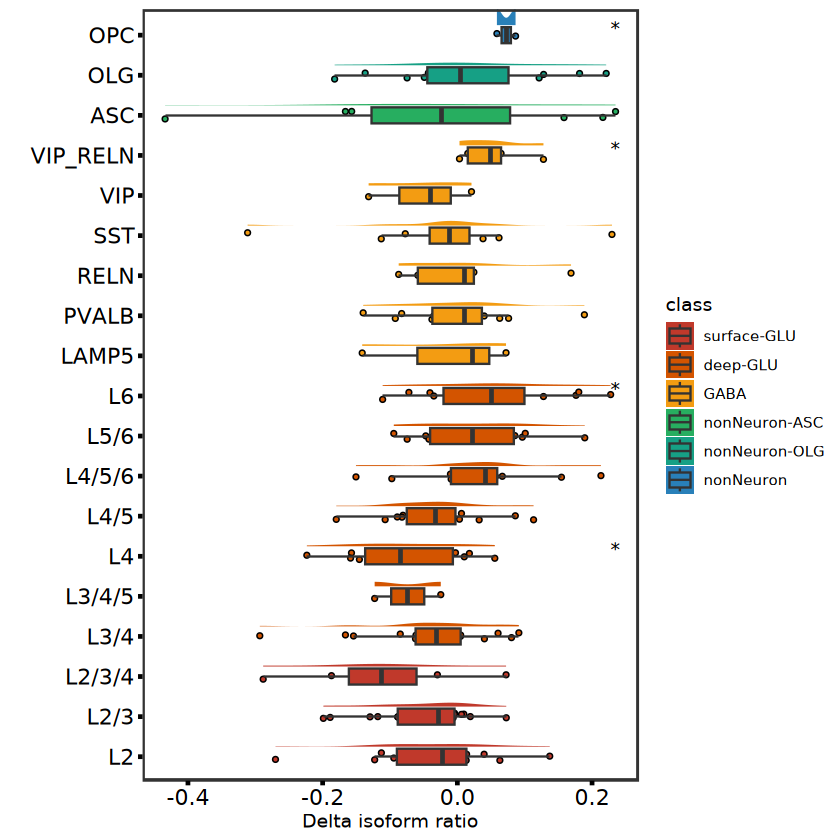

In [842]:
isosub2f = isosub2[isosub2$subclass != "" & isosub2$readnumt > 10,]
isosigs = isosub2f
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg3,]
hubtrans = isosigl3.hub$transcript_id
hubtrans = c(hubtrans)
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs$class = subclassan[match(isosigs$subclass,subclassan$subclass),]$class
isosigs$class = factor(isosigs$class,levels = c('surface-GLU','deep-GLU','GABA','nonNeuron-ASC','nonNeuron-OLG','nonNeuron'))
isosigs = isosigs[order(isosigs$class,isosigs$subclass),]
isosigs$subclass = factor(isosigs$subclass,levels = unique(isosigs$subclass))
isosigs = isosigs %>% group_by(subclass) %>% filter(length(unique(transcript_id)) > 1)

pmd3cs2 = ggplot(isosigs,aes(x = subclass, y = dr2, fill = class))+
  geom_jitter(aes(fill = class),shape=21,size=1,width=0.1) +
  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  theme_bw()+
  theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("") +
coord_flip()
pmd3cs2
ggexport(pmd2cs2,filename = "result/figure4/moduel3_subclass_boxplot_24_04_15.pdf",width = 6,height = 5)

file saved to result/figure4/moduel3_cases_subclass_plot_24_04_15.pdf



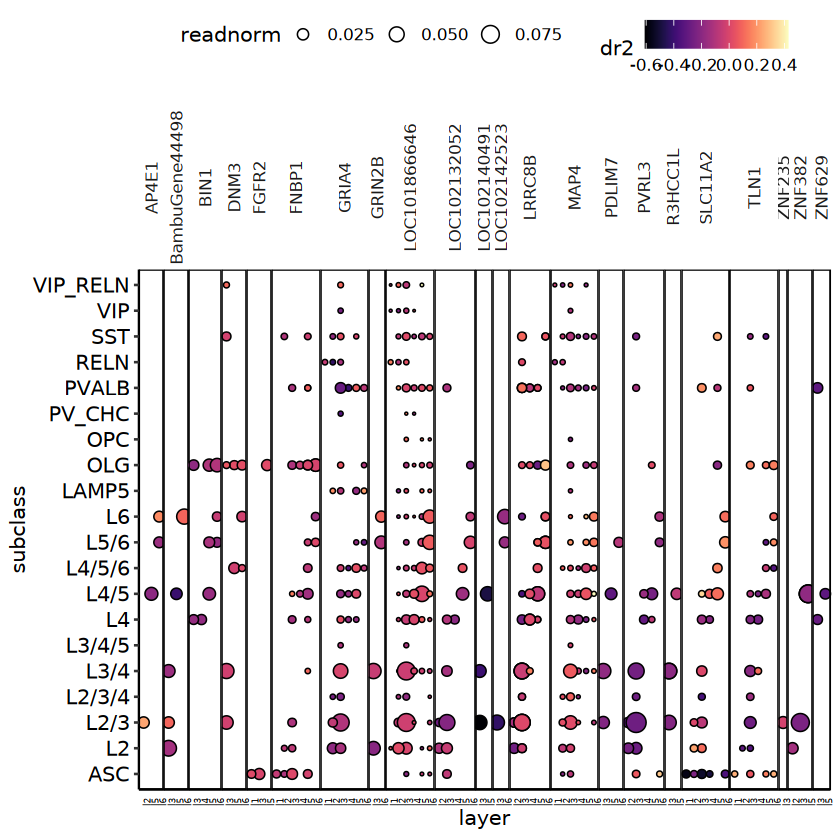

In [843]:
mdg3n = c(unique(isosigl3.hub$gene_id))
isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% mdg3n,]
hubtrans = isosigl3.hub$transcript_id
hubtrans = c(hubtrans)
isosigs = isosigs[isosigs$transcript_id %in% hubtrans,]
isosigs = isosigs[order(isosigs$gene_id,isosigs$subclass,isosigs$dr2),]
pmd3cs3 = ggplot(isosigs,aes(x = subclass, y = layer, fill = dr2, size = readnorm)) + 
geom_point(shape = 21) +
scale_fill_viridis(option = "A") +
facet_grid(~gene_id,scales = "free",space = "free") + 
scale_size_continuous(range = c(0.1,5)) +
theme_pubr() + 
theme(axis.text.x = element_text(angle = 90,size = 5),
      axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(angle = 90),
     panel.border = element_rect(fill = NA)) +
coord_flip()
pmd3cs3
ggexport(pmd2cs3,filename = "result/figure4/moduel3_cases_subclass_plot_24_04_15.pdf",width = 8,height = 5)

In [827]:
isosubf[isosubf$gene_id %in% "CIRBP",]

layer,subclass,gene_id,transcript_id,readnum,readnumt,relative,meanrelative,otherrelative,readnorm
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
l1,ASC,CIRBP,CIRBP-WeiLab-1,1,45,0.02222222,0.09048715,0.09162490,0.0035618173
l1,ASC,CIRBP,XM_015440514.1,14,45,0.31111111,0.66977924,0.67260339,0.0035618173
l1,ASC,CIRBP,XR_001486967.1,28,45,0.62222222,0.33938535,0.33671708,0.0035618173
l1,ASC,CIRBP,XR_001486969.1,2,45,0.04444444,0.07766122,0.07827635,0.0035618173
l1,L2,CIRBP,CIRBP-WeiLab-1,1,7,0.14285714,0.09048715,0.08961432,0.0005540605
l1,L2,CIRBP,XM_015440514.1,2,7,0.28571429,0.66977924,0.67280337,0.0005540605
l1,L2,CIRBP,XR_001486967.1,3,7,0.42857143,0.33938535,0.33854397,0.0005540605
l1,L2,CIRBP,XR_001486969.1,1,7,0.14285714,0.07766122,0.07645389,0.0005540605
l1,L4/5/6,CIRBP,XM_015440514.1,5,6,0.83333333,0.66977924,0.66849141,0.0004749090


#### ARPP21 diger

In [104]:
geneex = "ARPP21"
fileid = paste0("result/figure4/",geneex,"_layer_case_24_04_29.pdf")
isosigi = isosigls$layer
fsrawdp$areatr = fsrawdp$layer
fsrawdp$chunk = fsrawdp$lobe
pc1 = CasePlotTotalClass(fsrawdp,isosigi,gtf,geneex,hubtrans = c("XM_005545495.2","XM_015444963.1","XM_015444956.1"))
pc1
ggexport(pc1,filename = fileid,width = 8,height = 6)

[1] "#B1C6C8" "#C36EC5" "#BBD874"


ERROR: Error in CasePlotTotalClass(fsrawdp, isosigi, gtf, geneex, hubtrans = c("XM_005545495.2", : object 'longbed' not found


[1] "#BE6BC7" "#B5D97C" "#B4C5C8"
# A tibble: 6 × 13
# Groups:   group [3]
  readid   seqnames  start    end width strand score group transcript_id readord
  <chr>    <fct>     <int>  <int> <int> <fct>  <dbl> <chr> <chr>         <chr>  
1 m84075_… NC_0222… 1.16e7 1.16e7   787 -         60 l3    XM_005545487… XM_005…
2 9a19f60… NC_0222… 1.16e7 1.16e7   786 +         60 l5    XM_005545487… XM_005…
3 2fe919a… NC_0222… 1.16e7 1.16e7   781 +         60 l3    XM_005545487… XM_005…
4 f07a183… NC_0222… 1.16e7 1.16e7   780 -         60 l5    XM_005545487… XM_005…
5 m84129_… NC_0222… 1.16e7 1.16e7   760 -         60 l2    XM_005545487… XM_005…
6 20ff10b… NC_0222… 1.16e7 1.16e7   402 -         60 l3    XM_005545487… XM_005…
# ℹ 3 more variables: orid <dbl>, oridnorm <dbl>, sig <chr>


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 1313 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 653 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 12 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 52 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 216 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 46 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 139 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 150 rows containing missing values or values outside the scale r

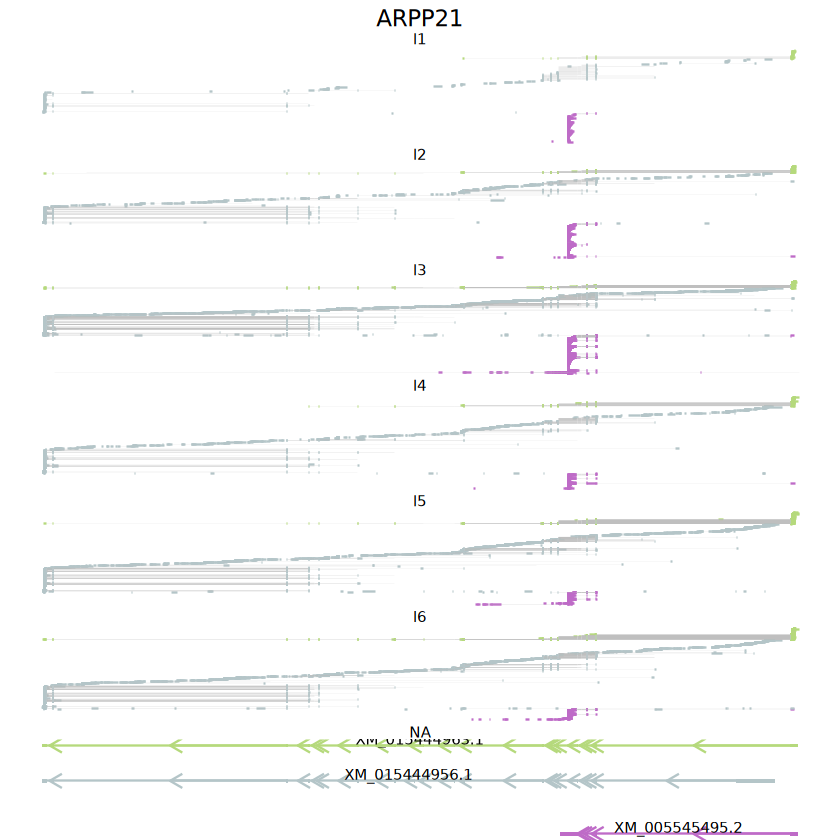

In [855]:
hubtrans = c("XM_005545495.2","XM_015444963.1","XM_015444956.1")
transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
if(!is.null(hubtrans)){
        transname = hubtrans
}
    mycolors = distinctColorPalette(length(transname))
    print(mycolors)
    names(mycolors) = transname
    grtdfl = BuildPlotBed(fsrawsp,longbed,'areatr',geneex,NULL)
    print(head(grtdfl))
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub = T,mycolors)
pci1
ggexport(pci1,filename = "result/figure4/read_annotation_ARPP21_24_04_16.pdf",
           width = 6,height = 20)

In [106]:
#case plot
isosub = fsrawdp %>% group_by(layer,subclass,gene_id) %>% 
    mutate(readnumt = length(unique(readid))) %>% 
    group_by(layer,subclass,gene_id,transcript_id)  %>% 
    summarise(readnum = length(unique(readid)),
              readnumt = readnumt[1],
              relative = readnum/readnumt)
isosub = isosub %>% group_by(transcript_id) %>% 
    mutate(meanrelative = mean(relative),
           otherrelative = (sum(relative) - relative)/(n() - 1))
isosub = isosub %>% group_by(gene_id) %>% 
    mutate(readnorm = readnumt/sum(readnumt[!duplicated(paste0(layer,subclass))]))
isosubf = isosub[isosub$subclass != "" & isosub$readnumt > 5,]

`summarise()` has grouped output by 'layer', 'subclass', 'gene_id'. You can
override using the `.groups` argument.


file saved to result/figure4/ARPP21_diger_isoform_subclass_dr_bubble_plot_05_16.pdf



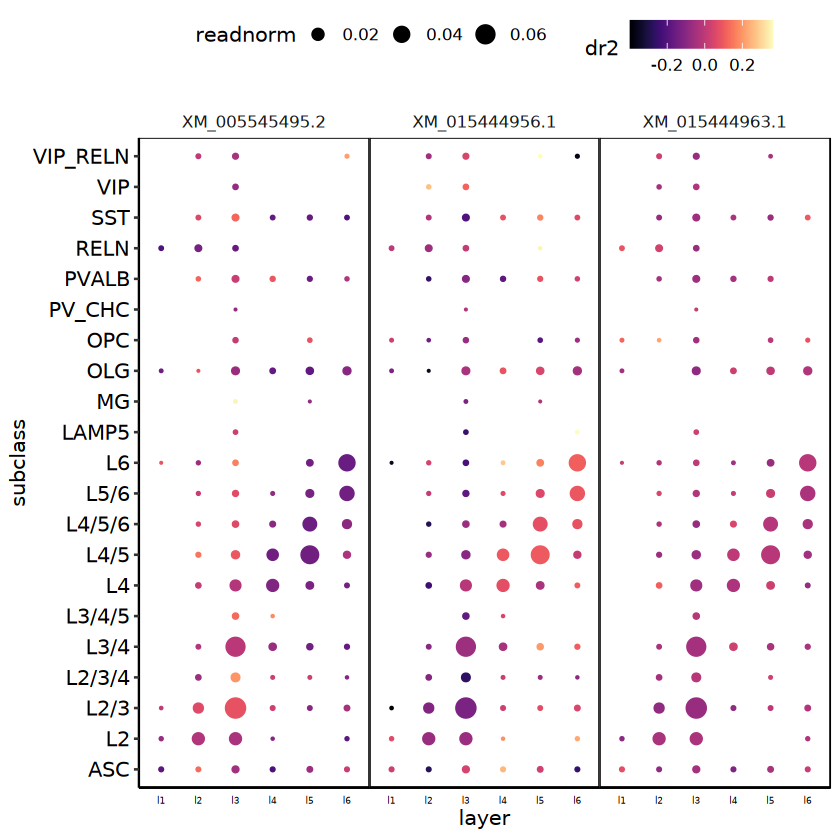

In [110]:
#cell stat
geneex = "ARPP21"
isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% geneex,]
#isosigsf = isosigs[isosigs$dr2 > 0.05,]
isosigs = isosigs[isosigs$transcript_id %in% c("XM_005545495.2","XM_015444963.1","XM_015444956.1"),]
pmd4cs3 = ggplot(isosigs,aes(x = subclass, y = layer, color = dr2, size = readnorm)) + 
geom_point() +
scale_color_viridis(option = "A") +
facet_grid(~transcript_id,scales = "free",space = "free") + 
scale_size_continuous(range = c(0.1,5)) +
theme_pubr() + 
theme(axis.text.x = element_text(size = 5),
      axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(),
     panel.border = element_rect(fill = NA)) +
coord_flip()
pmd4cs3
ggexport(pmd4cs3,filename = "result/figure4/ARPP21_diger_isoform_subclass_dr_bubble_plot_05_16.pdf",width = 6,height = 5)

`summarise()` has grouped output by 'layer', 'subclass', 'gene_id'. You can
override using the `.groups` argument.
file saved to result/figure4/DBNDD2_diger_isoform_subclass_dr_bubble_plot_05_16.pdf



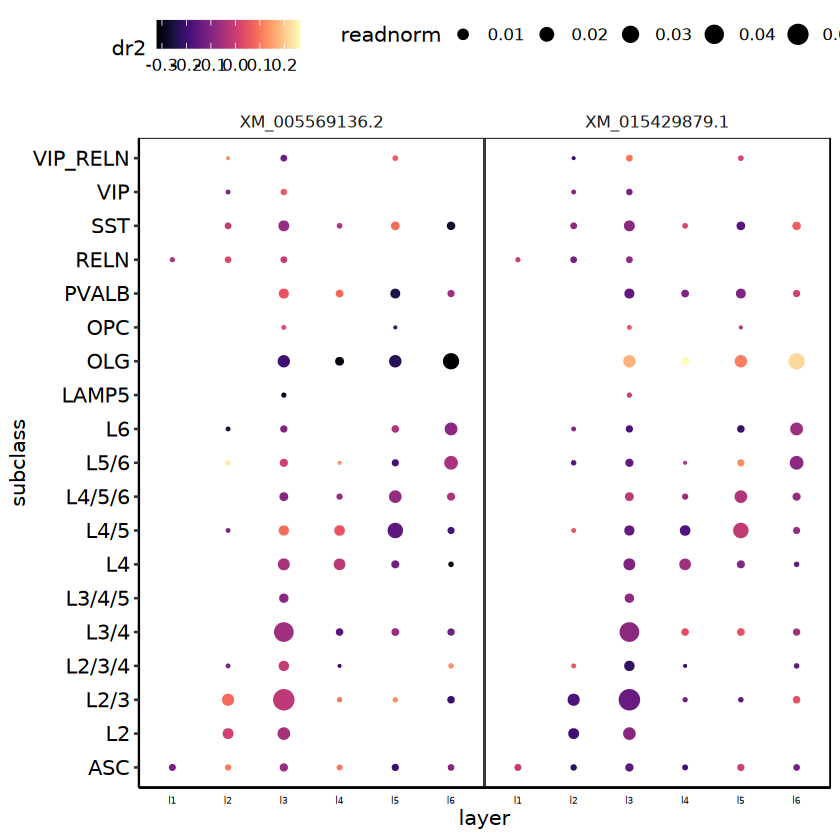

In [112]:
#cell stat
#case plot
fsrawdpf = qread("data/reads_full_anotation/main_data_read_total_annotation_read_onlyunique_24_05_16.qs")
isosub = fsrawdpf %>% group_by(layer,subclass,gene_id) %>% 
    mutate(readnumt = length(unique(readid))) %>% 
    group_by(layer,subclass,gene_id,transcript_id)  %>% 
    summarise(readnum = length(unique(readid)),
              readnumt = readnumt[1],
              relative = readnum/readnumt)
isosub = isosub %>% group_by(transcript_id) %>% 
    mutate(meanrelative = mean(relative),
           otherrelative = (sum(relative) - relative)/(n() - 1))
isosub = isosub %>% group_by(gene_id) %>% 
    mutate(readnorm = readnumt/sum(readnumt[!duplicated(paste0(layer,subclass))]))
isosubf = isosub[isosub$subclass != "" & isosub$readnumt > 5,]

geneex = "DBNDD2"
isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% geneex,]
#isosigsf = isosigs[isosigs$dr2 > 0.05,]
isosigs = isosigs[isosigs$transcript_id %in% c("XM_005569136.2","XM_015429879.1"),]
pmd4cs3 = ggplot(isosigs,aes(x = subclass, y = layer, color = dr2, size = readnorm)) + 
geom_point() +
scale_color_viridis(option = "A") +
facet_grid(~transcript_id,scales = "free",space = "free") + 
scale_size_continuous(range = c(0.1,5)) +
theme_pubr() + 
theme(axis.text.x = element_text(size = 5),
      axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(),
     panel.border = element_rect(fill = NA)) +
coord_flip()
pmd4cs3
ggexport(pmd4cs3,filename = "result/figure4/DBNDD2_diger_isoform_subclass_dr_bubble_plot_05_16.pdf",width = 6,height = 5)

Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
file saved to result/figure4/DBNDD2_diger_isoform_subclass_dr_box_plot_05_16.pdf



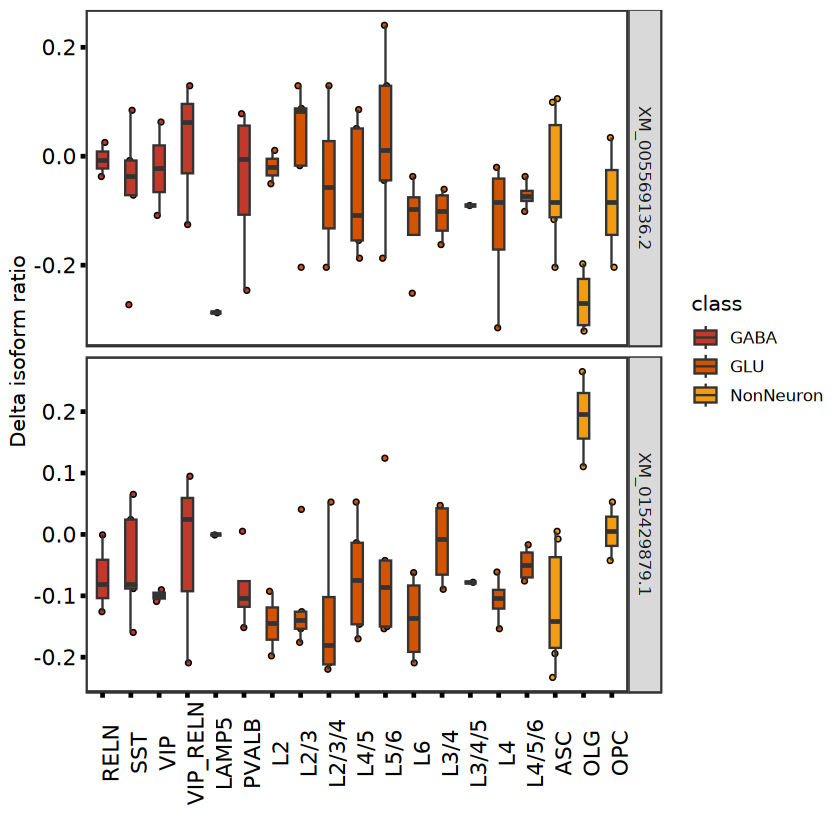

In [116]:
isosigs$class = cellan[match(isosigs$subclass,cellan$subclass),]$class
isosigs = isosigs[order(isosigs$class),]
#isosigs[isosigs$subclass %in% c("L3/4","L3/4/5"),]$class = "surface-GLU"
isosigs$subclass = factor(isosigs$subclass,levels = unique(isosigs$subclass))
pmd4cs3 = ggplot(isosigs,aes(x = subclass, y = dr2, fill = class))+
  geom_jitter(aes(fill = class),shape=21,size=1,width=0.1) +
  #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  facet_grid(transcript_id~.,scales = "free") +
  theme_bw()+
  theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
#coord_flip()
pmd4cs3
ggexport(pmd4cs3,filename = "result/figure4/DBNDD2_diger_isoform_subclass_dr_box_plot_05_16.pdf",width = 6,height = 5)

In [861]:
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% geneex,]
head(isosigs)

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj,dr2
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
ARPP21,XM_005545480.2,ASC,42,176,0.2386364,0.2331164,0.2328098,0.005826592,Y,2.261909e-313,1.338924e-310,0.005519929
ARPP21,XM_005545480.2,L2,136,685,0.1985401,0.2331164,0.2350373,-0.036497194,Y,2.261909e-313,1.338924e-310,-0.034576289
ARPP21,XM_005545480.2,L2/3,253,1388,0.1822767,0.2331164,0.2359409,-0.053664210,Y,2.261909e-313,1.338924e-310,-0.050839778
ARPP21,XM_005545480.2,L2/3/4,33,183,0.1803279,0.2331164,0.2360491,-0.055721264,Y,2.261909e-313,1.338924e-310,-0.052788566
ARPP21,XM_005545480.2,L3/4,204,1105,0.1846154,0.2331164,0.2358109,-0.051195553,Y,2.261909e-313,1.338924e-310,-0.048501050
ARPP21,XM_005545480.2,L3/4/5,12,55,0.2181818,0.2331164,0.2339461,-0.015764317,Y,2.261909e-313,1.338924e-310,-0.014934616


file saved to result/figure4/ARPP21_diger_isoform_subclass_dr_barplot_04_29.pdf



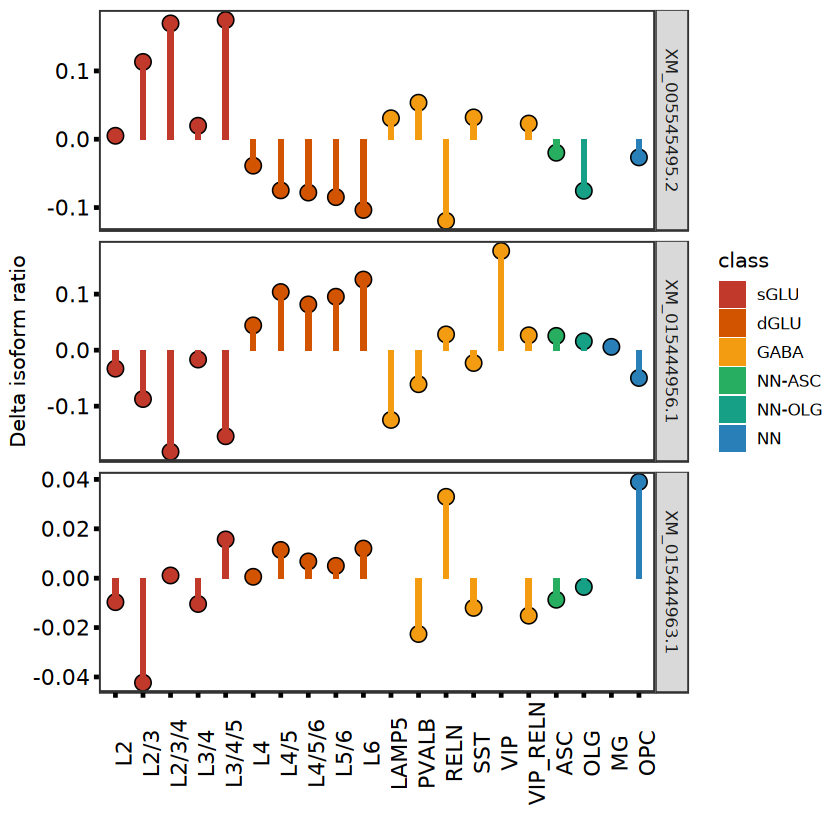

In [455]:
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% geneex,]
#isosigsf = isosigs[isosigs$dr2 > 0.05,]
isosigs = isosigs[isosigs$transcript_id %in% c("XM_005545495.2","XM_015444963.1","XM_015444956.1"),]
colnames(isosigs)[3] = "subclass"

isosigs$class = subclassan[match(isosigs$subclass,subclassan$subclass),]$class
#isosigs[isosigs$subclass %in% c("L3/4","L3/4/5"),]$class = "surface-GLU"
isosigs$class = factor(isosigs$class,levels = c('sGLU','dGLU','GABA','NN-ASC','NN-OLG','NN'))
isosigs = isosigs[order(isosigs$class,isosigs$subclass),]
isosigs$subclass = factor(isosigs$subclass,levels = unique(isosigs$subclass))
isosigs = isosigs[isosigs$count > 5,]

pmd4cs5 = ggplot(isosigs,aes(x = subclass, y = dr2, fill = class))+
  geom_point(aes(fill = class),shape=21,size = 4) +
#  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_bar(width=0.2,size=0.5, stat = "identity") +
  facet_grid(transcript_id~.,scales = "free") +
  theme_bw()+
  theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
#coord_flip()
pmd4cs5
ggexport(pmd4cs5,filename = "result/figure4/ARPP21_diger_isoform_subclass_dr_barplot_04_29.pdf",width = 6,height = 5)

file saved to result/figure4/ARPP21_diger_isoform_subclass_dr_barplot_04_29.pdf



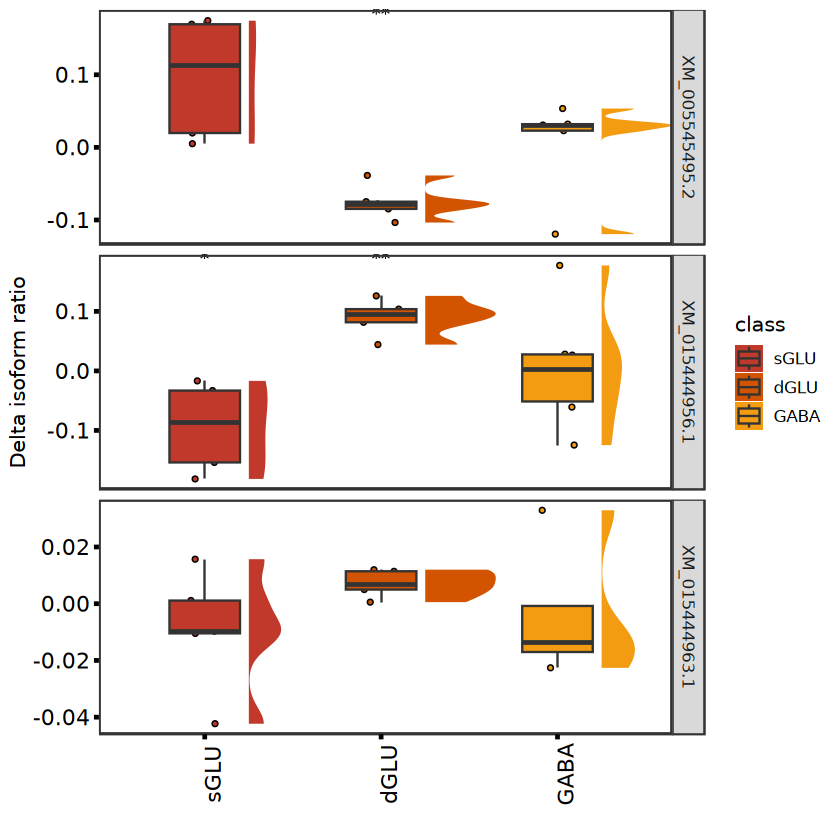

In [456]:
pmd4cs6 = ggplot(isosigs[isosigs$class %in% c('sGLU','dGLU','GABA'),],aes(x = class, y = dr2, fill = class))+
  geom_jitter(aes(fill = class),shape=21,size=1,width=0.1) +
  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  facet_grid(transcript_id~.,scales = "free") +
  theme_bw()+
  theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
#coord_flip()
pmd4cs6
ggexport(pmd4cs6,filename = "result/figure4/ARPP21_diger_isoform_subclass_dr_barplot_04_29.pdf",width = 6,height = 5)

In [904]:
qsave(list("md1" = isosigl.st,"md2" = isosigl2,"md3" = isosigl3),file = "result/figure4/module_hub_gene_list_24_04_16.qs")

### Analysis Spatial and Cell interact

In [20]:
cellprop.layer = fsraw[fsraw$class != "",] %>% group_by(layer,class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.layer = cellprop.layer %>% group_by(layer) %>% mutate(cellprop = cellnum/sum(cellnum))

cellprop.lobe = fsraw[fsraw$class != "",] %>% group_by(lobe,class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.lobe = cellprop.lobe %>% group_by(lobe) %>% mutate(cellprop = cellnum/sum(cellnum))
head(cellprop.lobe)

`summarise()` has grouped output by 'layer', 'class'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'lobe', 'class'. You can override using the
`.groups` argument.


lobe,class,subclass,cellnum,cellprop
<chr>,<chr>,<chr>,<int>,<dbl>
auditory,GABA,LAMP5,337,0.009658651
auditory,GABA,PVALB,1750,0.050156201
auditory,GABA,PV_CHC,78,0.002235534
auditory,GABA,RELN,716,0.020521051
auditory,GABA,SST,1724,0.049411023
auditory,GABA,VIP,301,0.008626867


file saved to result/figure4/cellprop_stat_24_04_03.pdf



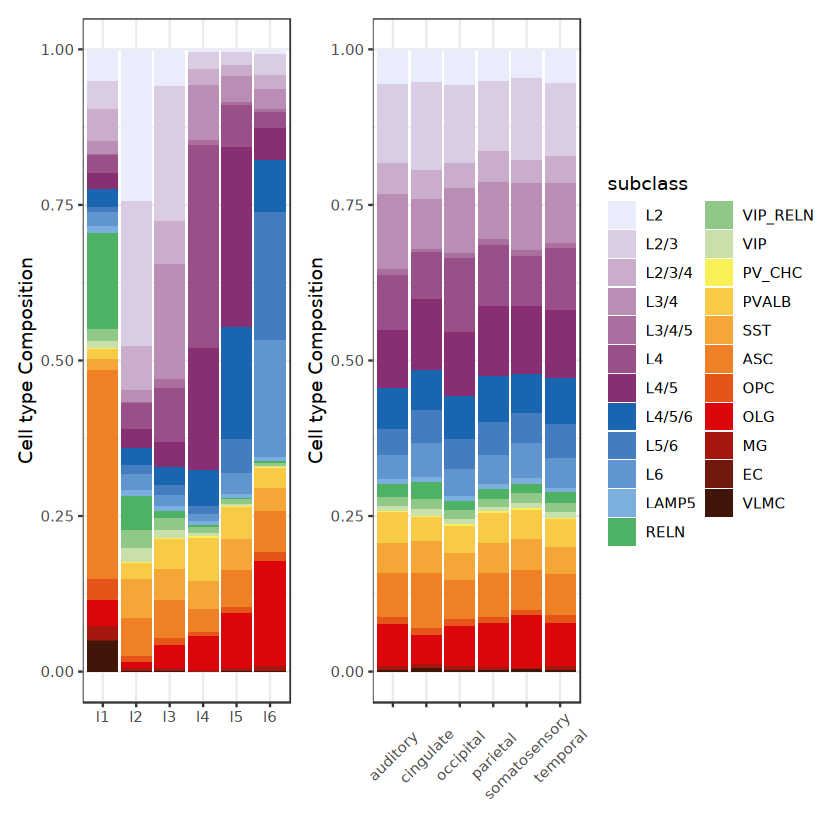

In [23]:
cellprop.layer$subclass = factor(cellprop.layer$subclass,levels = suborder)
cellprop.lobe$subclass = factor(cellprop.lobe$subclass,levels = suborder)
pst1 = ggplot(cellprop.layer,aes(x = layer,y = cellprop,fill = subclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + NoLegend()
pst2 = ggplot(cellprop.lobe,aes(x = lobe,y = cellprop,fill = subclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + theme(axis.text.x = element_text(angle = 45,vjust = 0.5))
pst = pst1 + pst2
pst
ggexport(pst,filename = "result/figure4/cellprop_stat_24_04_03.pdf",width = 7,height = 4)

In [24]:
qsave(list("layer" = cellprop.layer,"lobe" = cellprop.lobe), file = "result/figure4/cell_prop_longread.qs")

In [239]:
#stat with celltype module
fsraw$myclass = subclassan[match(fsraw$subclass,subclassan$subclass),]$class
cellprop.layer.md = fsraw[fsraw$myclass != "",] %>% group_by(layer,myclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.layer.md = cellprop.layer.md %>% group_by(layer) %>% mutate(cellprop = cellnum/sum(cellnum))
cellprop.lobe.md = fsraw[fsraw$myclass != "",] %>% group_by(lobe,myclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.lobe.md = cellprop.lobe.md %>% group_by(lobe) %>% mutate(cellprop = cellnum/sum(cellnum))


`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'lobe'. You can override using the
`.groups` argument.
ERROR while rich displaying an object: Error:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error:
! object 'myclass' not found

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2re

ERROR: [1m[33mError[39m:[22m
[1m[22m[33m![39m Problem while computing aesthetics.
[36mℹ[39m Error occurred in the 1st layer.
[1mCaused by error:[22m
[33m![39m object 'myclass' not found


file saved to result/figure4/cellprop_stat_my_module_24_04_03.pdf



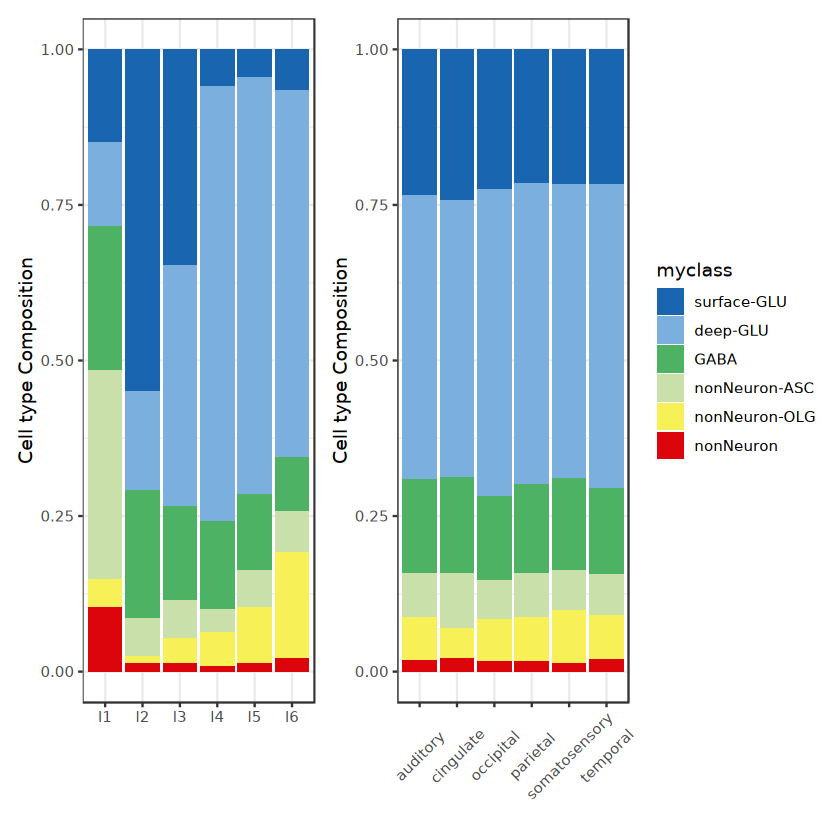

In [243]:
cellprop.layer.md$myclass = factor(cellprop.layer.md$myclass,levels = c('surface-GLU','deep-GLU','GABA','nonNeuron-ASC','nonNeuron-OLG','nonNeuron'))
cellprop.lobe.md$myclass = factor(cellprop.lobe.md$myclass,levels = c('surface-GLU','deep-GLU','GABA','nonNeuron-ASC','nonNeuron-OLG','nonNeuron'))
cellprop.lobe.md = cellprop.lobe.md[!is.na(cellprop.lobe.md$myclass),]
cellprop.layer.md = cellprop.layer.md[!is.na(cellprop.layer.md$myclass),]
pst1 = ggplot(cellprop.layer.md,aes(x = layer,y = cellprop,fill = myclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + NoLegend()
pst2 = ggplot(cellprop.lobe.md,aes(x = lobe,y = cellprop,fill = myclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + theme(axis.text.x = element_text(angle = 45,vjust = 0.5))
pst = pst1+pst2
pst
ggexport(pst,filename = "result/figure4/cellprop_stat_my_module_24_04_03.pdf",width = 7,height = 4)

In [244]:
qsave(list("layer" = cellprop.layer.md,"lobe" = cellprop.lobe.md), file = "result/figure4/cell_prop_md_longread.qs")

In [ ]:
# 导入所需的包
library(rpart)
library(randomForest)

# 1. 准备数据集（假设你的数据框名为df，包含两个因素 factor1 和 factor2，以及数值变量 target）
# 例如：
# df <- data.frame(factor1 = factor(c("A", "B", "A", "B")),
#                  factor2 = factor(c("X", "Y", "Y", "X")),
#                  target = c(10, 15, 20, 25))

# 2. 拆分数据集为训练集和测试集（这里假设70%的数据用于训练，30%用于测试）
set.seed(123) # 设置随机种子以确保结果可复现
train_index <- sample(1:nrow(cpcclst.cellf), 0.7 * nrow(cpcclst.cellf))
train_data <- cpcclst.cellf[train_index, ]
test_data <- cpcclst.cellf[-train_index, ]

# 3. 构建决策树模型
tree_model <- rpart(readrate ~ subclass + lobe, data = train_data)

# 4. 查看特征重要性
# 获取特征重要性
tree_importance <- tree_model$variable.importance

# 5. 可视化特征重要性
barplot(tree_importance, main = "Feature Importance (Decision Tree)", xlab = "Features", ylab = "Importance")

# 6. 构建随机森林模型
rf_model <- randomForest(readrate ~ subclass + lobe, data = train_data)

# 7. 查看特征重要性
# 获取特征重要性
rf_importance <- importance(rf_model)

# 8. 可视化特征重要性
varImpPlot(rf_model, main = "Feature Importance (Random Forest)")


In [10]:
isosigan = read.csv("result/figure3/sigiso_subclass_transcript_dr_cluster_tab.csv")
head(isosigan)
length(unique(isosigan$gene_id))

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj,dr2,cluster,class
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,ACBD7,ACBD7-WeiLab-2,ASC,63,90,0.7000000,0.5847059,0.5462745,0.15372549,N,0.1035015,1,0.11529412,1,nonNeuron-ASC
2,ACBD7,ACBD7-WeiLab-2,L2/3,19,34,0.5588235,0.5847059,0.5933333,-0.03450980,N,0.1035015,1,-0.02588235,1,surface-GLU
3,ACBD7,ACBD7-WeiLab-2,L3/4,14,25,0.5600000,0.5847059,0.5929412,-0.03294118,N,0.1035015,1,-0.02470588,1,surface-GLU
4,ACBD7,ACBD7-WeiLab-2,L4,13,25,0.5200000,0.5847059,0.6062745,-0.08627451,N,0.1035015,1,-0.06470588,1,L4
5,AKAP9,XM_015447760.1,ASC,192,216,0.8888889,0.7486167,0.7403654,0.14852351,N,1.0000000,1,0.14027220,1,nonNeuron-ASC
6,AKAP9,XM_015447760.1,L2,136,203,0.6699507,0.7486167,0.7532441,-0.08329335,N,1.0000000,1,-0.07866595,1,surface-GLU


[1] 298

In [31]:
isosig = isosigls$subclass

gvls = list()
hubtrans = NULL
hubgene = NULL
for(i in 1:length(isosigls.cl)){
    tdtui = isosigls.cl[[i]]
    hubtrans = unique(c(hubtrans,unique(tdtui[tdtui$sig != "N",]$transcript_id)))
    hubgene = unique(c(hubgene,unique(tdtui[tdtui$sig != "N",]$gene_id)))
    print(names(isosigls.cl)[i])
}
length(hubgene)
isosig.hub = isosig[isosig$gene_id %in% hubgene,]

[1] "Neuron_NonNeuron"
[1] "GABA_NonNeuron"
[1] "GLU_NonNeuron"
[1] "GABA_GLU"
[1] "GABA_GABA"
[1] "GLU_GLU"
[1] "NonNeuron_NonNeuron"


[1] 708

[1] "ACTA2"           "AKT3"            "AP4E1"           "APBA3"          
 [5] "APC"             "BambuGene127834" "BambuGene37959"  "BambuGene44498" 
 [9] "CA11"            "CALM3"           "CBR4"            "CCDC71"         
[13] "CENPV"           "CISD3"           "CRYAB"           "DAZAP2"         
[17] "DCLK1"           "EEF1E1"          "ERC2"            "FAM173A"        
[21] "FBXO15"          "GAP43"           "GRIA4"           "GRIN2B"         
[25] "HOMER2"          "IDH3B"           "IGFLR1"          "IQSEC2"         
[29] "LOC101866646"    "LOC102122770"    "LOC102133073"    "LOC102133863"   
[33] "LOC102136493"    "LOC102137214"    "LOC102140491"    "LOC102142523"   
[37] "LRRC8B"          "MACROD1"         "MAP6"            "MATR3"          
[41] "MRPS33"          "MTERF2"          "NPM1"            "PAK3"           
[45] "PCID2"           "PDLIM7"          "PSMA2_1"         "PTGDS"          
[49] "QDPR"            "R3HCC1L"         "RPL14"           "RPL19"          
[53] "RPL21"           "RPL41"           "RPL9"            "RPS10"          
[57] "RPS12"           "RPS7"            "SATB1"           "SH3BGRL3"       
[61] "SLC6A13"         "SNX3"            "STAT2"           "TAPBPL"         
[65] "TNFSF10"         "TNNC1"           "TPM3"            "TRAPPC1"        
[69] "UCHL1"           "YWHAE"           "YWHAH"           "ZNF235"         
[73] "ZNF382"          "ZNF629"

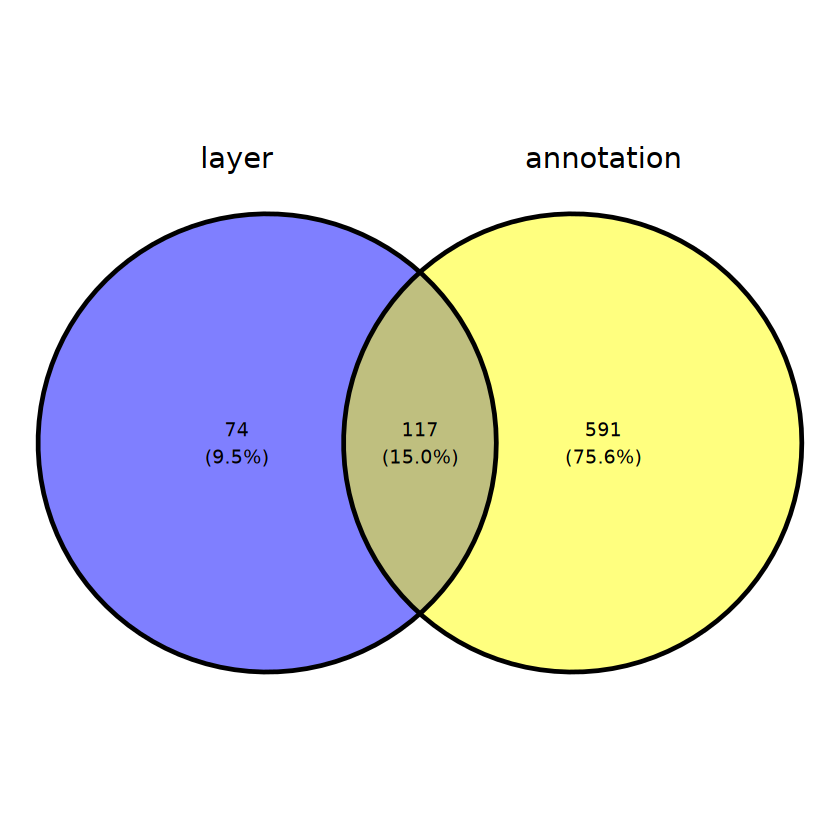

In [33]:
isosigl = isosigls$layer
isosigl = isosigl[isosigl$sig != "N",]
library(ggvenn)
ggvenn(list("layer" = isosigl$gene_id,"annotation" = hubgene))
unique(isosigl[!isosigl$gene_id %in% hubgene,]$gene_id)

In [52]:
isocmpdf = NULL
hutrans = unique(isocmp$transcript_id)
length(hutrans)
for(i in 1:length(hutrans)){
    isoli = isosigl[isosigl$transcript_id == hutrans[i],]
    isoci = isocmp[isocmp$transcript_id == hutrans[i],]
    isocmpdfi = isoci
    for(j in 1:nrow(isoli)){
        isocmpdfi$dr2.layer = isoli[j,]$dr2
        isocmpdfi$dist = isocmpdfi$dr2 - isocmpdfi$dr2.layer
        isocmpdfi$group = isoli[j,]$areatr
        isocmpdfi = isocmpdfi[,c("gene_id","transcript_id","areatr","group","sig","dr2","dr2.layer","dist")]
        isocmpdf = rbind(isocmpdf,isocmpdfi)
    }
}

[1] 983

In [156]:
isocell = read.csv("result/figure3/sigiso_subclass_transcript_dr_cluster_tab.csv")

[1] 322

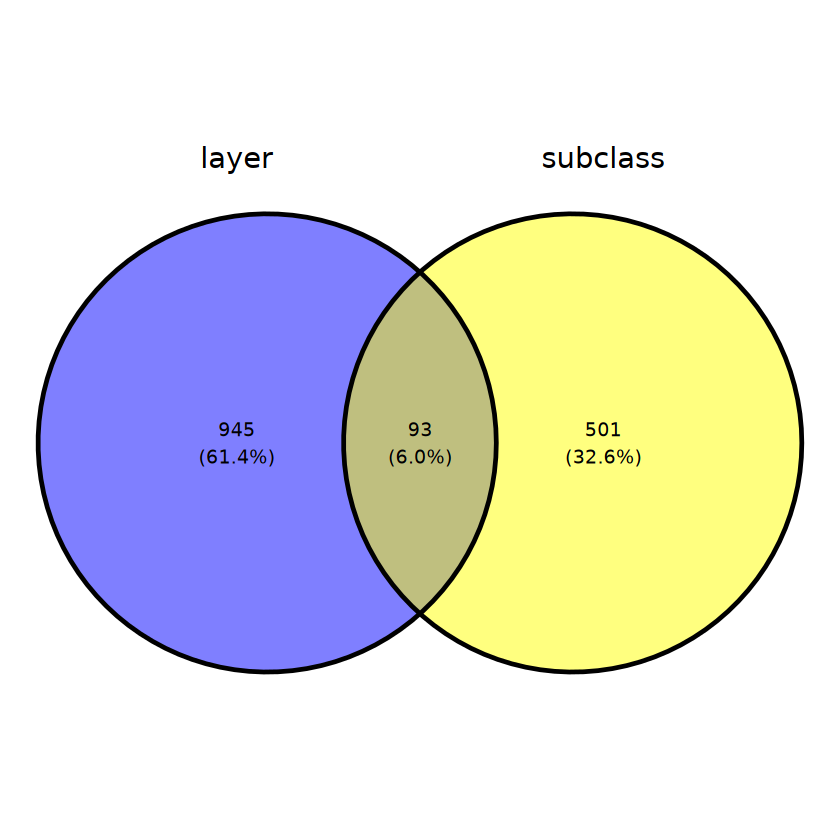

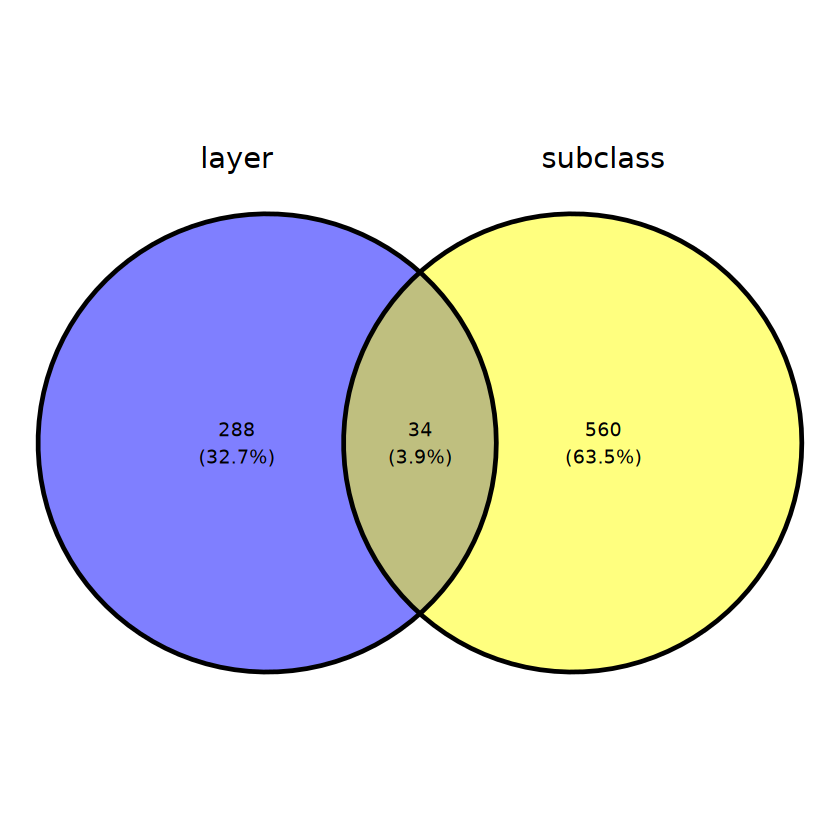

In [210]:
#layer as cluster
isosigl$dr2 = isosigl$relative - isosigl$meanrelative
ggvenn(list("layer" = isosigl$transcript_id, "subclass" = isocell$transcript_id))
isosigl$dr2 = isosigl$relative - isosigl$meanrelative
#isosigf = isosigl[isosigl$transcript_id %in% hubtrans,]
#isosigf2 = isosigf2[isosigf2$sig != "N",]
isosigf2 = isosigl %>% group_by(transcript_id) %>% filter(max(abs(dr2)) > 0.1)
#isosigf2 = isosigf2 %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
length(unique(isosigf2$transcript_id))
isosigf.mx = dcast(isosigf2,transcript_id~areatr,value.var = "dr2",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
ggvenn(list("layer" = isosigf2$transcript_id, "subclass" = isocell$transcript_id))
#isosigf.mx = isosigf.mx[,!colnames(isosigf.mx) %in% c("MG","PV_CHC","EC","VLMC")]
#isosigf.mx = isosigf.mx[,!colnames(isosigf.mx) %in% c("EC","VLMC")]
library(ComplexHeatmap)

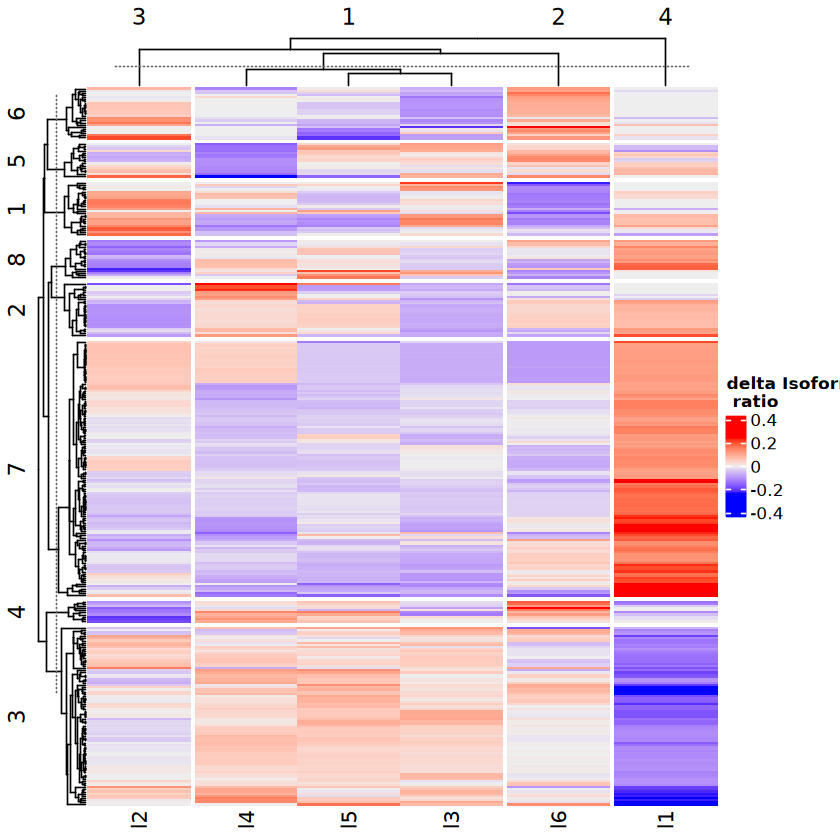

In [214]:
n = 8
fit = kmeans(isosigf.mx,n)
split <- factor(as.character(fit$cluster), levels=as.character(c(1:n)))
#reorder.hmap <- Heatmap(as.matrix(cellmxfn), split=split, cluster_row_slices = FALSE,
#                          show_row_names = F,column_order = cellorder)
#reorder.hmap
isosigf.mx = as.matrix(isosigf.mx)
pcloneht = Heatmap(isosigf.mx,show_row_names = F,column_km = 4,split=split,name = "delta Isoform\n ratio")
pcloneht

clusteran = data.frame("cluster" = split,"transcript_id" = rownames(isosigf.mx))
isosigf2$cluster = clusteran[match(isosigf2$transcript_id,clusteran$transcript_id),]$cluster

[1] 84

Warning message:
"Duplicated aesthetics after name standardisation: size"
Warning message:
"Removed 1 row containing non-finite outside the scale range
(`stat_ydensity()`)."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Removed 1 row containing non-finite outside the scale range (`stat_boxplot()`)."
Warning message:
"Removed 1 row containing non-finite outside the scale range
(`stat_compare_means()`)."
Warning message:
"Removed 1 row containing non-finite outside the scale range
(`stat_ydensity()`)."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Removed 1 row containing non-finite outside the scale range (`stat_boxplot()`)."
Warning message:
"Removed 1 row containing non-finite outside the scale range
(`stat_compare_means()`)."
file saved to result/figure4/sigiso_layer_transcript_dr_cluster_heatmap_module_ana_24_04_02.pdf



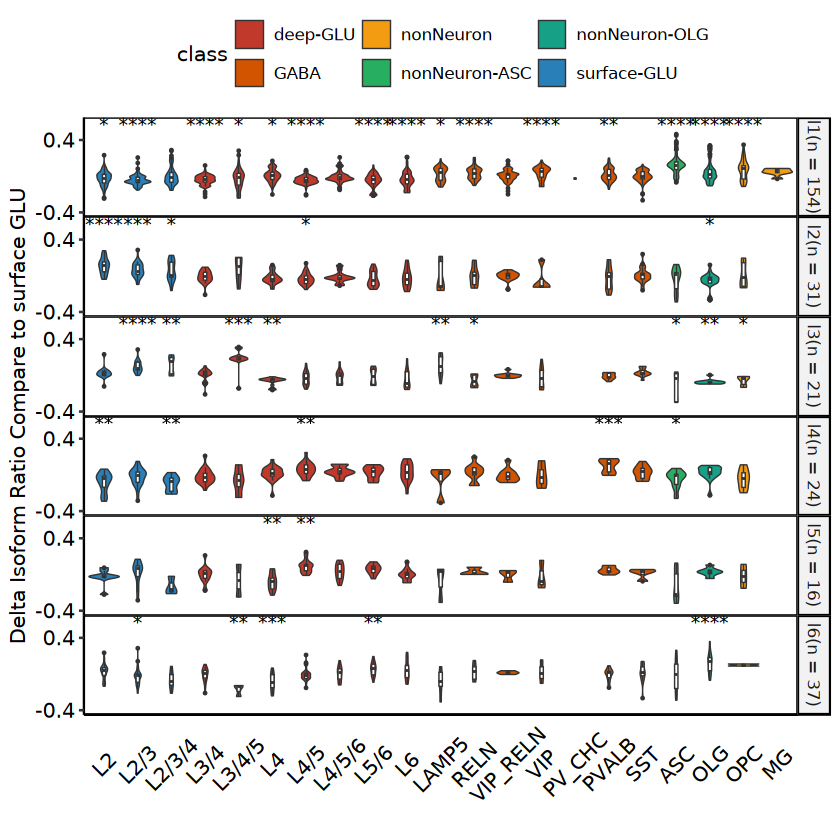

In [251]:
isosigf2 = isosigl
isosigf2$sig = "N"
isosigf2[isosigf2$dr > 0.1,]$sig = "Y"
layersigan = unique(isosigf2[,c("gene_id","transcript_id","areatr","sig")])
layersigan = layersigan[layersigan$sig == "Y",]
colnames(layersigan)[3] = "cluster"

isosigsub = isosigls$subclass
isosigsub$dr2 = isosigsub$relative - isosigsub$meanrelative
isosigsub = merge(isosigsub,layersigan[,-1],by = "transcript_id")
#isosigsub$cluster = clusteran[match(isosigsub$transcript_id,clusteran$transcript_id),]$cluster
isosigsub$class = subclassan[match(isosigsub$areatr,subclassan$subclass),]$class
#unique(isosigsub$areatr)
isosigsub$areatr = factor(isosigsub$areatr,levels = suborder[suborder %in% isosigsub$areatr])
isosigcmp = isosigsub[!is.na(isosigsub$cluster),]
isosigcmp = isosigcmp %>% group_by(cluster) %>% mutate(clusteran = paste0(cluster,"(n = ",length(unique(transcript_id)),")"))
#unique(isosigcmp$areatr)
#isosigcmp = isosigcmp %>% group_by(cluster,areatr) %>% filter(n() > 1)
length(unique(isosigcmp$gene_id))
pmst = ggplot(isosigcmp,aes(x = areatr,y = dr2,fill = class)) + 
geom_violin(size = 0.3,drop = FALSE) +
geom_boxplot(size = 0.3,fill = "white",width=0.1,cex=0.8,outlier.size = 0.3) +
facet_grid(clusteran~.,scales = "free") + theme_pubr() + xlab("") + ylab("Delta Isoform Ratio Compare to surface GLU") +
scale_fill_flatui() + scale_y_continuous(breaks = c(-0.4,0.4),limits = c(-0.4,0.6)) +
stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = T,ref.group = ".all.",vjust = 0.7) +
theme(axis.ticks.x = element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5),
      panel.spacing = unit(0,'lines'),
      panel.border = element_rect(fill = NA)) 
pmst
ggexport(pmst,filename = "result/figure4/sigiso_layer_transcript_dr_cluster_heatmap_module_ana_24_04_02.pdf",width = 6,height = 7)

In [384]:
#cell composition stat of gene
transtcs.layer = fsraw %>% group_by(gene_id, layer,subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,layer,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs.layer = transtcs.layer[!is.na(transtcs.layer$subclass) & transtcs.layer$subclass != "",] %>% 
group_by(gene_id, layer) %>% mutate(cellprop = cellnum/(sum(cellnum)))

transtcs.lobe = fsraw %>% group_by(gene_id, lobe, subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,lobe,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs.lobe = transtcs.lobe[!is.na(transtcs.lobe$subclass) & transtcs.lobe$subclass != "",] %>% 
group_by(gene_id, lobe) %>% mutate(cellprop = cellnum/(sum(cellnum)))
head(transtcs.lobe)

`summarise()` has grouped output by 'gene_id', 'transcript_id', 'layer'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id', 'lobe'. You can
override using the `.groups` argument.


gene_id,transcript_id,lobe,subclass,count,genecount,cellnum,cellprop
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>
A1BG,XM_015441069.1,temporal,L2,1,1,1,0.3333333
A1BG,XM_015441069.1,temporal,L4/5,1,1,1,0.3333333
A1BG,XM_015441069.1,temporal,SST,1,1,1,0.3333333
A2ML1,XM_005570054.2,cingulate,L2/3,1,1,1,0.3333333
A2ML1,XM_005570054.2,occipital,ASC,1,1,1,0.1111111
A2ML1,XM_005570054.2,occipital,L4/5/6,1,1,1,0.1111111


In [326]:
#select similar pattern as between layer and cell
head(transtcs.sigl)

,transcript_id,layer,myclass,gene_id,count,genecount,cellnum,cellprop,meancellprop,othercellprop,relative,dr2,dr.cp
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AP4E1-WeiLab-2,l6,deep-GLU,AP4E1,9,24,22,0.20183486,0.07543323,0.05963303,0.3750000,0.009989648,0.12640163
2,AP4E1-WeiLab-2,l6,deep-GLU,AP4E1,9,24,22,0.20183486,0.07543323,0.05963303,0.3750000,-0.021066253,0.12640163
3,BambuGene103646-WeiLab-1,l1,GABA,BambuGene103646,9,13,12,0.21818182,0.11111111,0.09772727,0.6923077,-0.096553190,0.10707071
4,BambuGene103646-WeiLab-1,l1,GABA,BambuGene103646,9,13,12,0.21818182,0.11111111,0.09772727,0.6923077,-0.008257685,0.10707071
5,BambuGene103646-WeiLab-1,l1,GABA,BambuGene103646,9,13,12,0.21818182,0.11111111,0.09772727,0.6923077,0.165717872,0.10707071
6,BambuGene103646-WeiLab-1,l1,nonNeuron-ASC,BambuGene103646,5,7,4,0.07272727,0.11111111,0.11590909,0.7142857,0.182811890,-0.03838384


In [381]:
transt.cs.l = transtcs.layer[transtcs.layer$transcript_id %in% isosigl$transcript_id,]
transt.cs.l = transt.cs.l[transt.cs.l$myclass != "",]
#transt.cs.l = transt.cs.l[transt.cs.l$genecount > 10,]
transt.cs.l = transt.cs.l %>% group_by(gene_id,layer) %>% 
      mutate(meancellprop = mean(cellprop),
             othercellprop = (sum(cellprop) - cellprop)/(n() - 1))
transt.cs.l$dr.cp = transt.cs.l$cellprop - transt.cs.l$meancellprop

#transt.is.cl = isosigcmp[,c("transcript_id","cluster","class","dr2")]
#colnames(transt.is.cl)[2:4] = c("layer","myclass","dr.rcl")
transt.cs.l$relative = transt.cs.l$count/transt.cs.l$genecount
transt.cs.l = transt.cs.l %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
            otherrelative = (sum(relative) - relative)/(n() - 1))
transt.cs.l$dr.rcl = transt.cs.l$relative - transt.cs.l$meanrelative

transt.is.l = isosigls$layer
transt.is.l$dr.rl = transt.is.l$relative - transt.is.l$meanrelative
transt.is.l = transt.is.l[transt.is.l$sig != "N" & transt.is.l$dr.rl > 0.1,]
transt.is.l = transt.is.l[,c("transcript_id","areatr","dr.rl")]
colnames(transt.is.l)[2] = c("layer")
#transtcs.siglt = transtcs.siglt[transtcs.siglt$sig != "N",c("transcript_id","areatr","dr.rl")]
#transtcs.siglt = transtcs.siglt[transtcs.siglt$dr.rl > 0.1,]
transt.cs.l = merge(transt.cs.l,transt.is.l,by = c("transcript_id","layer"))
transt.cs.l$dr.rp = transt.cs.l$dr.rcl - transt.cs.l$dr.rl
head(transt.cs.l)
length(unique(transt.is.l$transcript_id))


,transcript_id,layer,gene_id,myclass,count,genecount,cellnum,cellprop,meancellprop,othercellprop,dr.cp,relative,meanrelative,otherrelative,dr.rcl,dr.rl,dr.rp
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AP4E1-WeiLab-2,l6,AP4E1,deep-GLU,9,24,22,0.20183486,0.07543323,0.05963303,0.12640163,0.3750000,0.3781953,0.3784616,-0.003195334,0.1125214,-0.11571670
2,AP4E1-WeiLab-2,l6,AP4E1,nonNeuron-ASC,1,3,3,0.02752294,0.07543323,0.08142202,-0.04791030,0.3333333,0.3781953,0.3819338,-0.044862001,0.1125214,-0.15738337
3,AP4E1-WeiLab-2,l6,AP4E1,nonNeuron-OLG,4,12,10,0.09174312,0.07543323,0.07339450,0.01630989,0.3333333,0.3781953,0.3819338,-0.044862001,0.1125214,-0.15738337
4,APBA3-WeiLab-1,l4,APBA3,nonNeuron,2,2,1,0.04166667,0.16666667,0.19166667,-0.12500000,1.0000000,0.4564815,0.3477778,0.543518519,0.1321773,0.41134123
5,APBA3-WeiLab-1,l4,APBA3,GABA,1,2,2,0.08333333,0.16666667,0.18333333,-0.08333333,0.5000000,0.4564815,0.4477778,0.043518519,0.1321773,-0.08865877
6,APBA3-WeiLab-1,l4,APBA3,deep-GLU,2,9,9,0.37500000,0.16666667,0.12500000,0.20833333,0.2222222,0.4564815,0.5033333,-0.234259259,0.1321773,-0.36643655


[1] 216

In [385]:
head(transtcs.layer)

gene_id,transcript_id,layer,subclass,count,genecount,cellnum,cellprop
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>
A1BG,XM_015441069.1,l2,L2,1,1,1,1.00000000
A1BG,XM_015441069.1,l3,L4/5,1,1,1,0.50000000
A1BG,XM_015441069.1,l3,SST,1,1,1,0.50000000
A2ML1,XM_005570054.2,l1,ASC,2,4,3,0.25000000
A2ML1,XM_005570054.2,l1,L4/5/6,1,1,1,0.08333333
A2ML1,XM_005570054.2,l3,ASC,1,1,1,0.09090909


Warning message:
"Duplicated aesthetics after name standardisation: size"
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Duplicated aesthetics after name standardisation: size"


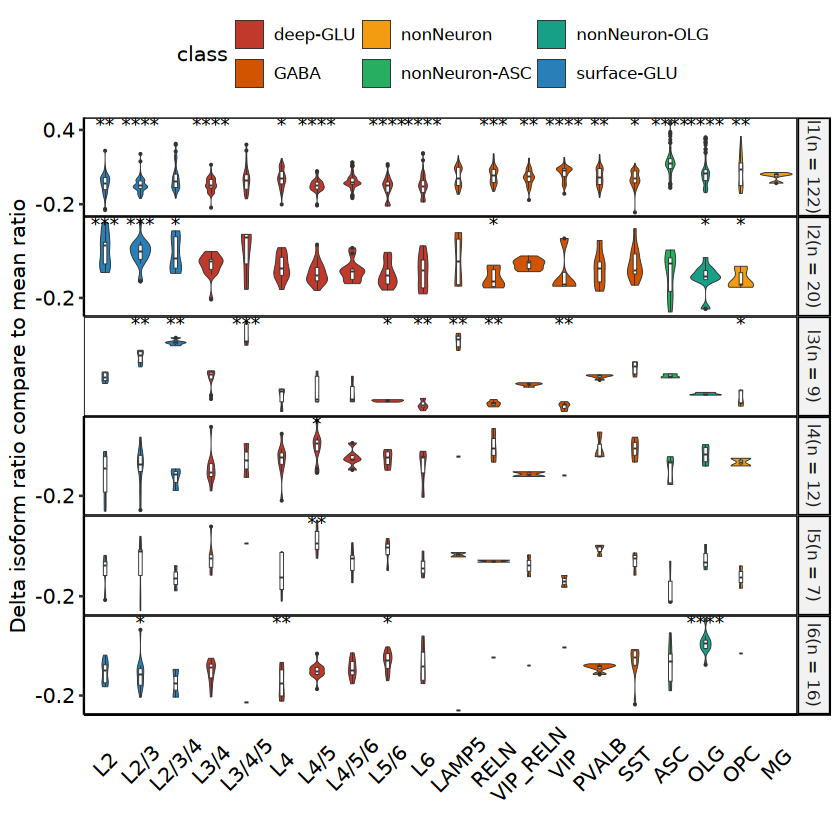

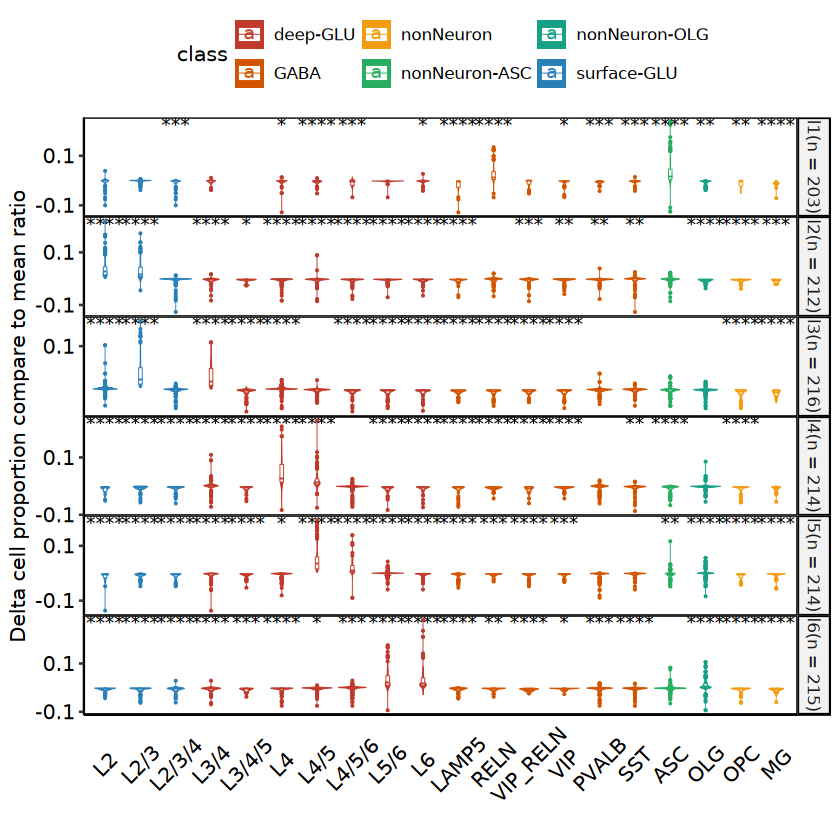

In [400]:
layersigan = isosigls$layer
layersigan$dr.rl = layersigan$relative - layersigan$meanrelative
layersigan = layersigan[layersigan$sig != "N" & layersigan$dr.rl > 0.1,]
layersigan = unique(layersigan[,c("gene_id","transcript_id","areatr")])
colnames(layersigan)[3] = c("cluster")

transt.cs.l = transtcs.layer[transtcs.layer$transcript_id %in% isosigl$transcript_id,]
transt.cs.l = transt.cs.l[transt.cs.l$subclass != "",]
#transt.cs.l = transt.cs.l[transt.cs.l$genecount > 10,]
transt.cs.l = transt.cs.l %>% group_by(gene_id,layer) %>% 
      mutate(meancellprop = mean(cellprop),
             othercellprop = (sum(cellprop) - cellprop)/(n() - 1))
transt.cs.l$dr.cp = transt.cs.l$cellprop - transt.cs.l$meancellprop
sigcellpop = unique(transt.cs.l[,c("transcript_id","layer","subclass","dr.cp","cellprop")])
sigcellpop = sigcellpop[sigcellpop$transcript_id %in% layersigan$transcript_id,]
sigcellpop$class = subclassan[match(sigcellpop$subclass,subclassan$subclass),]$class
sigcellpop$subclass = factor(sigcellpop$subclass,levels = suborder[suborder %in% sigcellpop$subclass])


isosigsub = isosigls$subclass
isosigsub$dr2 = isosigsub$relative - isosigsub$meanrelative
isosigsub = merge(isosigsub,layersigan[,-1],by = "transcript_id")
isosigsub$class = subclassan[match(isosigsub$areatr,subclassan$subclass),]$class
isosigsub$areatr = factor(isosigsub$areatr,levels = suborder[suborder %in% isosigsub$areatr])
isosigcmp = isosigsub[!is.na(isosigsub$cluster),]


isosigcmp = isosigcmp %>% group_by(cluster) %>% mutate(clusteran = paste0(cluster,"(n = ",length(unique(transcript_id)),")"))

pmst2 = ggplot(isosigcmp,aes(x = areatr,y = dr2,fill = class)) + 
geom_violin(size = 0.2,drop = FALSE) +
geom_boxplot(size = 0.2,fill = "white",width=0.1,cex=0.8,outlier.size = 0.1) +
facet_grid(clusteran~.,scales = "free") + theme_pubr() + xlab("") + ylab("Delta isoform ratio compare to mean ratio") +
scale_fill_flatui() + scale_y_continuous(breaks = c(-0.2,0.4)) +
stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = T,ref.group = ".all.",vjust = 0.7) +
theme(axis.ticks.x = element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5),
      panel.spacing = unit(0,'lines'),
      panel.border = element_rect(fill = NA)) 
pmst2

sigcellpop = sigcellpop[sigcellpop$subclass %in% isosigcmp$areatr,]
sigcellpop = sigcellpop %>% group_by(layer) %>% mutate(clusteran = paste0(layer,"(n = ",length(unique(transcript_id)),")"))
pmst = ggplot(sigcellpop,aes(x = subclass,y = dr.cp,fill = class,color = class)) + 
geom_violin(size = 0.2,drop = FALSE) +
geom_boxplot(size = 0.2,fill = "white",width=0.1,cex=0.8,outlier.size = 0.1) +
facet_grid(clusteran~.,scales = "free") + theme_pubr() + xlab("") + ylab("Delta cell proportion compare to mean ratio") +
scale_fill_flatui() + 
scale_color_flatui() + 
scale_y_continuous(breaks = c(-0.1,0.1)) +
stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = T,ref.group = ".all.",vjust = 0.7) +
theme(axis.ticks.x = element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5),
      panel.spacing = unit(0,'lines'),
      panel.border = element_rect(fill = NA)) 
pmst

# pmst3 = ggplot(transt.cs.l,aes(x = subclass,y = dr.rp,fill = subclass)) + 
# geom_violin(size = 0.3,drop = FALSE) +
# geom_boxplot(size = 0.3,fill = "white",width=0.1,cex=0.8,outlier.size = 0.3) +
# facet_grid(layer~.,scales = "free") + theme_pubr() + xlab("") + ylab("Delta Isoform Ratio Compare to surface GLU") +
# scale_fill_flatui() + scale_y_continuous() +
# stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = T,ref.group = ".all.",vjust = 0.7) +
# theme(axis.ticks.x = element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5),
#       panel.spacing = unit(0,'lines'),
#       panel.border = element_rect(fill = NA)) 
# pmst3

In [401]:
ggexport(pmst + pmst2, filename = "result/figure4/layer_subclass_interact_analysis_24_04_06.pdf",width = 10,height = 6)

Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
file saved to result/figure4/layer_subclass_interact_analysis_24_04_06.pdf



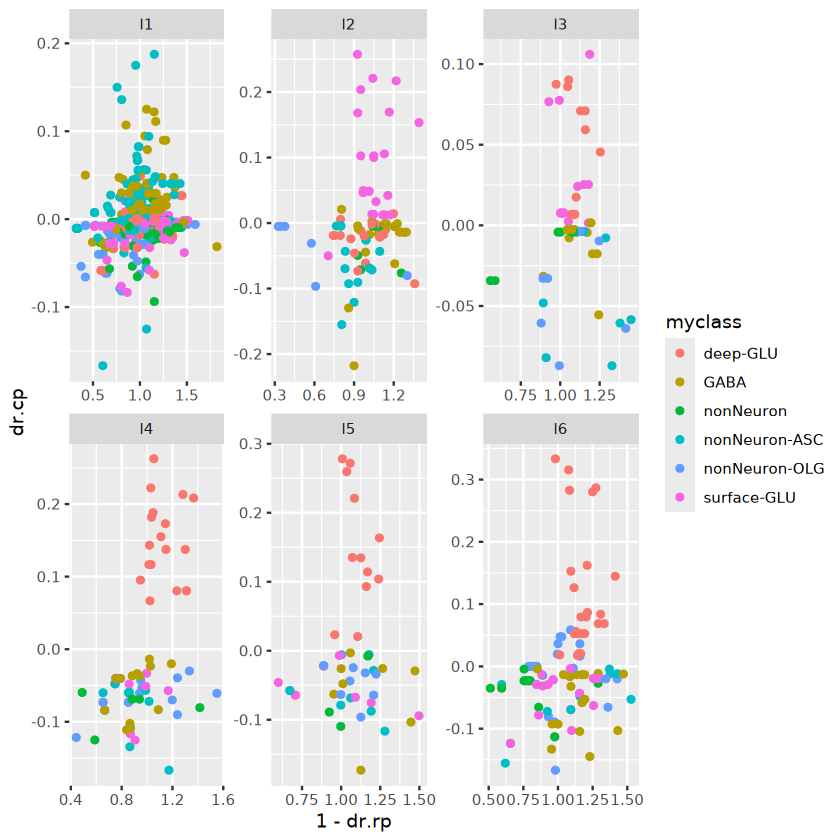

In [370]:
#transt.cs.lf = transt.cs.l[transt.cs.l$dr.cp > 0.05,]
ggplot(transt.cs.l,aes(x = 1-dr.rp,y = dr.cp,color = myclass)) + geom_point() + 
facet_wrap(layer~.,scales = "free")

In [245]:
fsraw$areatr = fsraw$myclass
transt = fsraw %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
transt = transt[transt$areatr != "" &
                          !is.na(transt$areatr),]
transt = transt[!is.na(transt$areatr),]
transt = transt[transt$areatr != "",]
transt$relative = transt$count/transt$genecount
transtf = transt[transt$genecount > 20,]
isosigt = transtf %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
             otherrelative = (sum(relative) - relative)/(n() - 1))
isosigt$dr2 = isosigt$relative - isosigt$meanrelative
isosigt$dr = isosigt$relative - isosigt$otherrelative
head(isosigt)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr2,dr
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAAS,AAAS-WeiLab-1,GABA,37,39,0.9487179,0.8922993,0.8640900,0.056418619,0.084627929
AAAS,AAAS-WeiLab-1,deep-GLU,123,146,0.8424658,0.8922993,0.9172161,-0.049833576,-0.074750364
AAAS,AAAS-WeiLab-1,surface-GLU,31,35,0.8857143,0.8922993,0.8955919,-0.006585044,-0.009877565
AAAS,AAAS-WeiLab-2,GABA,34,39,0.8717949,0.9203439,0.9446184,-0.048549016,-0.072823524
AAAS,AAAS-WeiLab-2,deep-GLU,134,146,0.9178082,0.9203439,0.9216117,-0.002535668,-0.003803502
AAAS,AAAS-WeiLab-2,surface-GLU,34,35,0.9714286,0.9203439,0.8948015,0.051084684,0.076627026


`summarise()` has grouped output by 'cluster'. You can override using the
`.groups` argument.


[1] -0.1879734

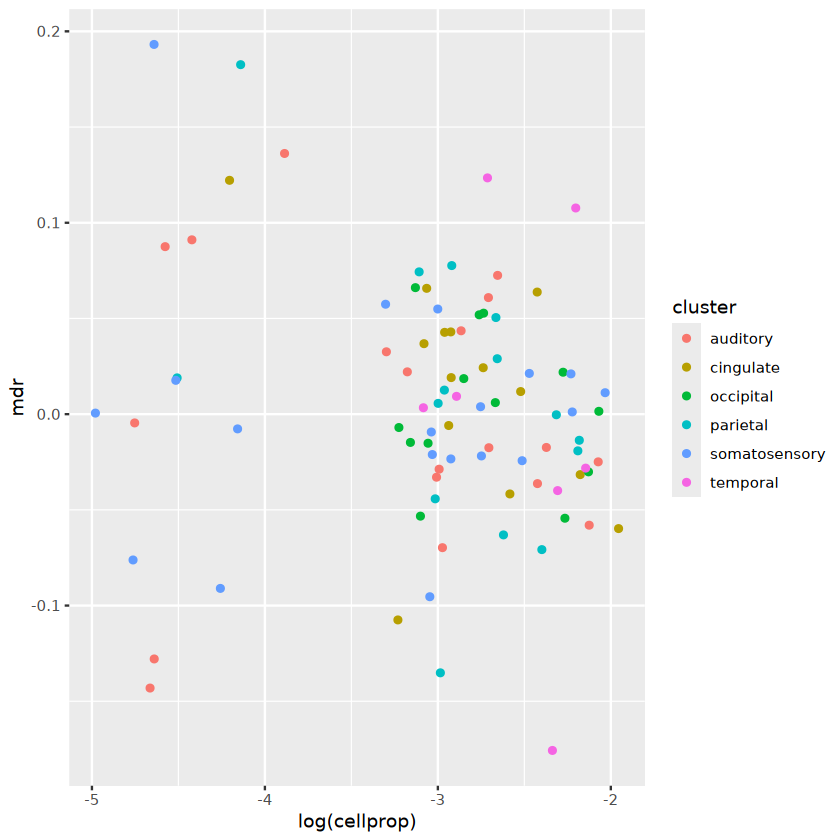

In [261]:
cellprop.lobet = cellprop.lobe
colnames(cellprop.lobet)[c(1,3)] = c("cluster","areatr")
isosigcmp2.st = isosigcmp2 %>% group_by(cluster,areatr) %>% summarise(mdr = mean(dr2))
isosigcmp2.st = merge(isosigcmp2.st,cellprop.lobet,by = c("cluster","areatr"))
cor(isosigcmp2.st$cellprop,isosigcmp2.st$mdr)
ggplot(isosigcmp2.st,aes(x = log(cellprop),y = mdr,color = cluster)) + geom_point()

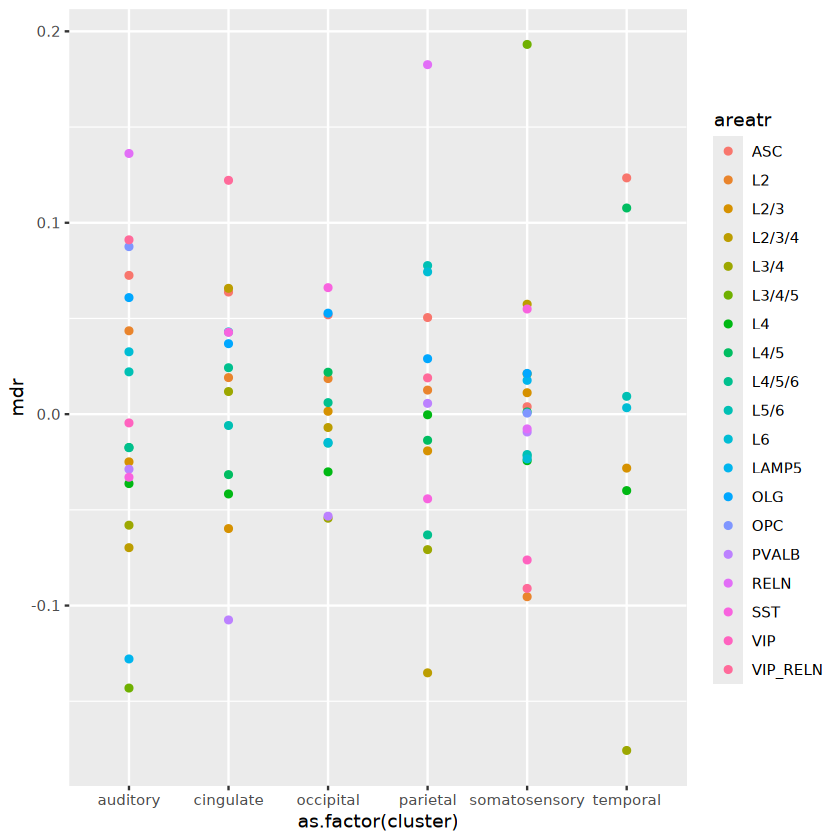

In [267]:
ggplot(isosigcmp2.st,aes(x = as.factor(cluster),y = mdr,color = areatr)) + geom_point()

In [576]:
#case plot 
#DDRGK1
geneex = "DDRGK1"
transtcs = fsraw[fsraw$gene_id %in% geneex,] %>% group_by(gene_id, layer,subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,layer,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs = transtcs %>% group_by(gene_id, layer) %>% mutate(cellprop = cellnum/(sum(cellnum)))
transtcs$relative = transtcs$count/transtcs$genecount


`summarise()` has grouped output by 'gene_id', 'transcript_id', 'layer'. You
can override using the `.groups` argument.


Warning message:
"Duplicated aesthetics after name standardisation: size"


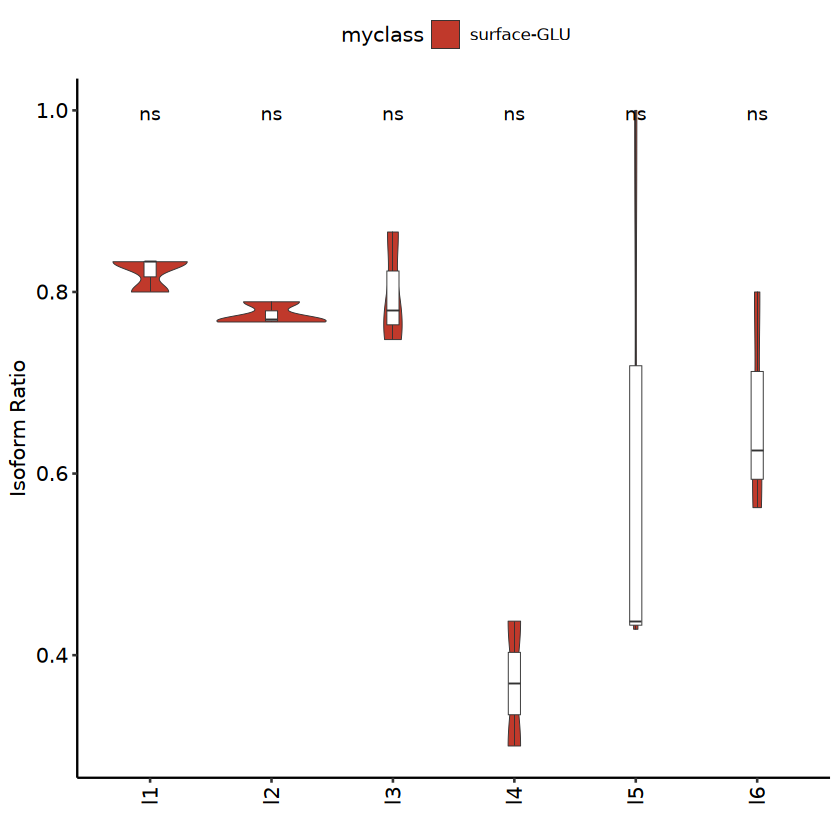

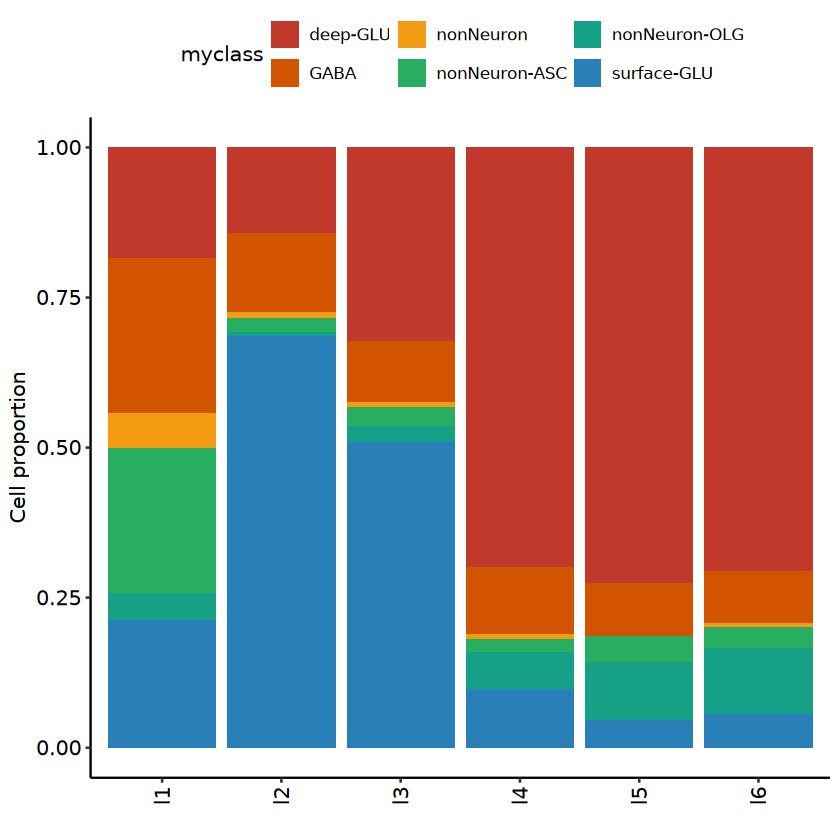

In [578]:
#transtcs = transtcs[transtcs$genecount > 20,]
transtcs$myclass = subclassan[match(transtcs$subclass,subclassan$subclass),]$class
p1 = ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & 
                transtcs$myclass %in% c("surface-GLU") & 
                transtcs$subclass != "",],
       aes(x = layer,y = relative,fill = myclass)) + 
geom_violin(size = 0.2) +
geom_boxplot(fill = "white",
             size = 0.2,width=0.1,cex=0.8,outlier.size = 0.1) +
#facet_grid(myclass~.,scales = "free") +
scale_fill_flatui() +
stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = F,ref.group = ".all.",vjust = 0.7) +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
xlab("") + ylab("Isoform Ratio")
p1 
p2 = ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & 
                transtcs$subclass != "",],aes(x = layer,y = cellprop,fill = myclass)) + 
geom_bar(stat = "identity",position = "fill") +
scale_fill_flatui() +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
xlab("") + ylab("Cell proportion")
p2
#ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & transtcs$subclass != "",],aes(x = subclass,y = relative)) + 
#geom_boxplot() +
#theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))

In [579]:
ggexport(p1,filename = "result/figure4/explain_case_DDRGK1_boxplot_layer_24_04_07.pdf",width = 5,height = 4)
ggexport(p2,filename = "result/figure4/explain_case_DDRGK1_cellpop_barplot_layer_24_04_07.pdf",width = 3,height = 5)

file saved to result/figure4/explain_case_DDRGK1_boxplot_layer_24_04_07.pdf

file saved to result/figure4/explain_case_DDRGK1_cellpop_barplot_layer_24_04_07.pdf



In [583]:
head(transtcs)

gene_id,transcript_id,layer,subclass,count,genecount,cellnum,cellprop,relative,myclass
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>
ARPP19,NM_001283415.1,l1,,215,597,1,0.001831502,0.3601340,NA
ARPP19,NM_001283415.1,l1,ASC,4,18,16,0.029304029,0.2222222,nonNeuron-ASC
ARPP19,NM_001283415.1,l1,L2,1,10,8,0.014652015,0.1000000,surface-GLU
ARPP19,NM_001283415.1,l1,L2/3,4,10,10,0.018315018,0.4000000,surface-GLU
ARPP19,NM_001283415.1,l1,L2/3/4,5,13,13,0.023809524,0.3846154,surface-GLU
ARPP19,NM_001283415.1,l1,L4,2,5,3,0.005494505,0.4000000,deep-GLU


`summarise()` has grouped output by 'gene_id', 'transcript_id', 'layer'. You
can override using the `.groups` argument.


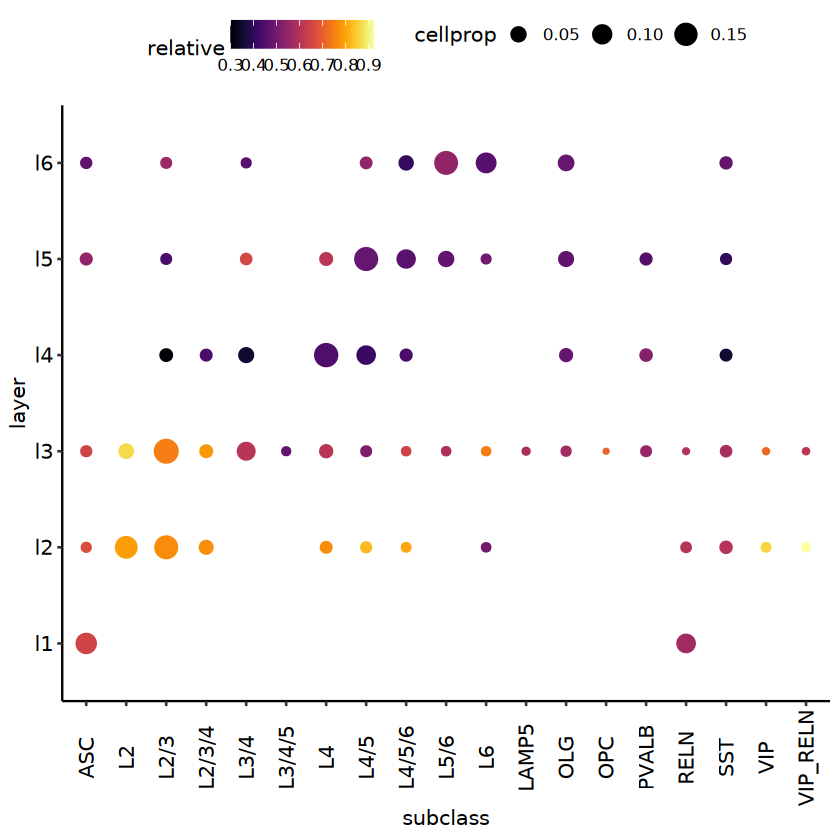

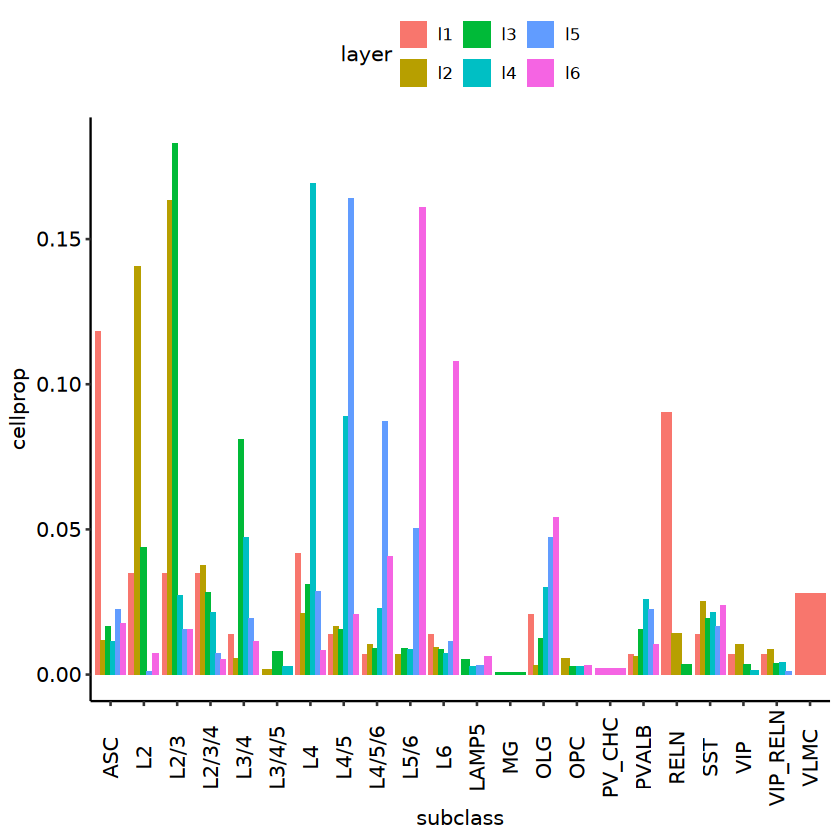

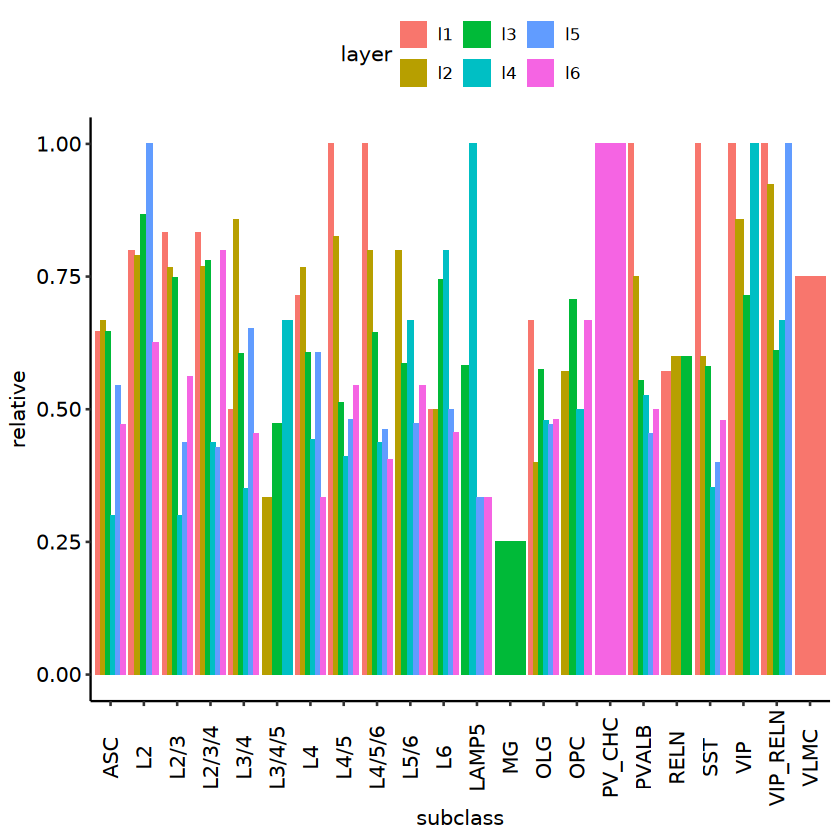

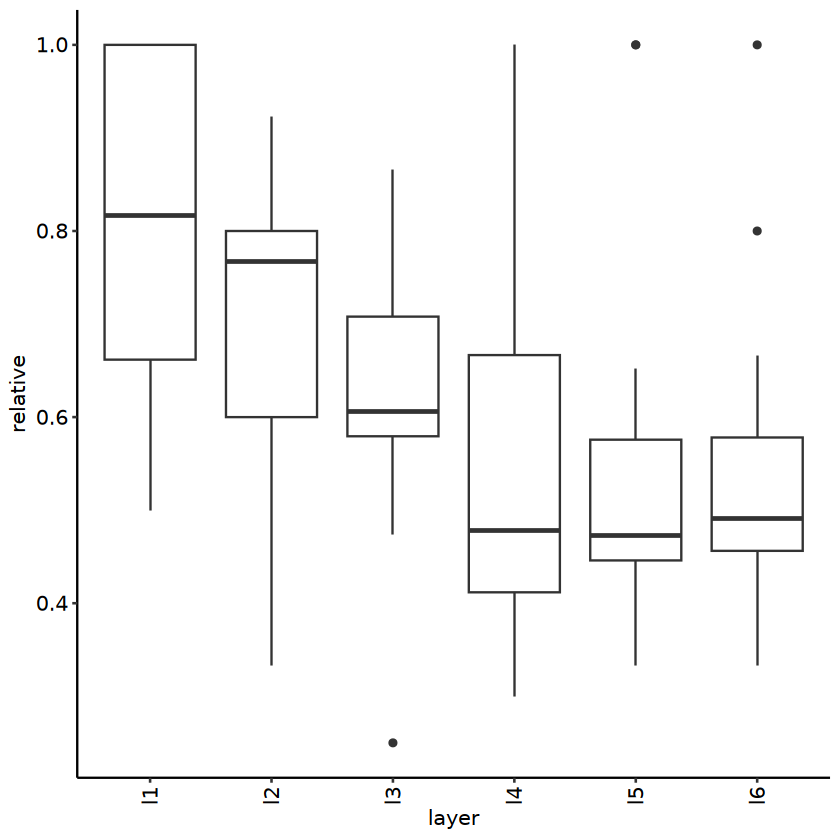

In [592]:
geneex = "DDRGK1"
transtcs = fsraw[fsraw$gene_id %in% geneex,] %>% group_by(gene_id, layer,subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,layer,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs = transtcs %>% group_by(gene_id, layer) %>% mutate(cellprop = cellnum/(sum(cellnum)))
transtcs$relative = transtcs$count/transtcs$genecount
transtcs$myclass = subclassan[match(transtcs$subclass,subclassan$subclass),]$class
ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & transtcs$subclass != "" & transtcs$genecount > 10,],aes(x = subclass,y =layer, color = relative,size = cellprop)) + 
geom_point() +
scale_color_viridis(option = "B") +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))

ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & transtcs$subclass != "",],aes(x = subclass,fill = 
                                                                                            -*/ layer,y = cellprop)) + 
geom_bar(stat = "identity",position = "dodge") +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))

ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & transtcs$subclass != "",],aes(x =   -+-+ subclass,fill = layer,y = relative)) + 
geom_bar(stat = "identity",position = "dodge") +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))

ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & transtcs$subclass != "",],aes(x = layer,y = relative)) + 
geom_boxplot() +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))

`summarise()` has grouped output by 'gene_id', 'transcript_id', 'layer'. You
can override using the `.groups` argument.


gene_id,transcript_id,layer,subclass,count,genecount,cellnum,cellprop,relative,myclass
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>
MYL6,MYL6-WeiLab-1,l1,,298,615,1,0.0030120482,0.4845528,NA
MYL6,MYL6-WeiLab-1,l1,ASC,12,19,17,0.0512048193,0.6315789,nonNeuron-ASC
MYL6,MYL6-WeiLab-1,l1,L2,3,6,6,0.0180722892,0.5000000,surface-GLU
MYL6,MYL6-WeiLab-1,l1,L2/3,1,3,3,0.0090361446,0.3333333,surface-GLU
MYL6,MYL6-WeiLab-1,l1,L2/3/4,3,7,6,0.0180722892,0.4285714,surface-GLU
MYL6,MYL6-WeiLab-1,l1,L4,2,4,4,0.0120481928,0.5000000,deep-GLU
MYL6,MYL6-WeiLab-1,l1,L4/5,3,4,3,0.0090361446,0.7500000,deep-GLU
MYL6,MYL6-WeiLab-1,l1,L4/5/6,3,6,5,0.0150602410,0.5000000,deep-GLU
MYL6,MYL6-WeiLab-1,l1,L5/6,1,1,1,0.0030120482,1.0000000,deep-GLU


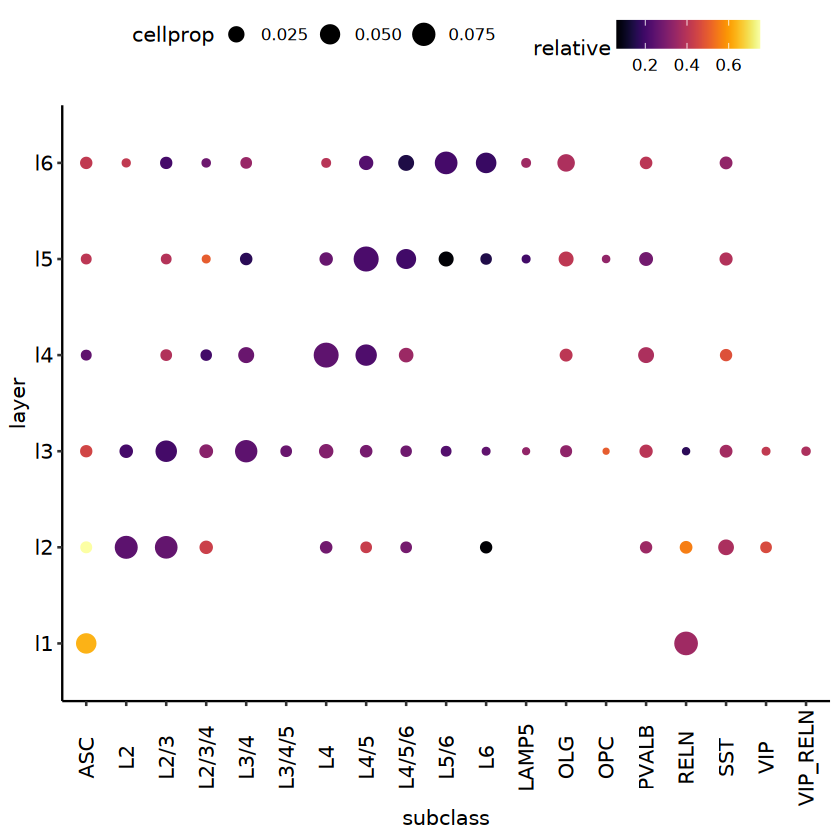

In [591]:
geneex = "MYL6"
transtcs = fsraw[fsraw$gene_id %in% geneex,] %>% group_by(gene_id, layer,subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,layer,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs = transtcs %>% group_by(gene_id, layer) %>% mutate(cellprop = cellnum/(sum(cellnum)))
transtcs$relative = transtcs$count/transtcs$genecount
transtcs$myclass = subclassan[match(transtcs$subclass,subclassan$subclass),]$class
transtcs
ggplot(transtcs[transtcs$transcript_id == "MYL6-WeiLab-1" & transtcs$subclass != "" & transtcs$genecount > 10,],aes(x = subclass,y =layer, color = relative,size = cellprop)) + 
geom_point() +
scale_color_viridis(option = "B") +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))


`summarise()` has grouped output by 'gene_id', 'transcript_id', 'layer'. You
can override using the `.groups` argument.


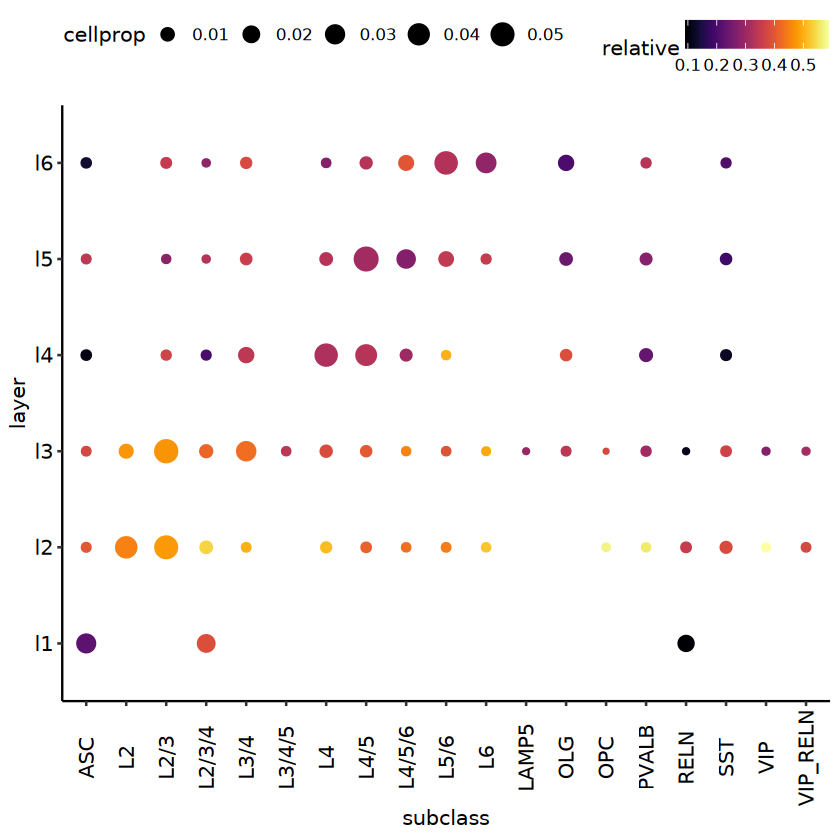

In [590]:
geneex = "ARPP19"
transtcs = fsraw[fsraw$gene_id %in% geneex,] %>% group_by(gene_id, layer,subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,layer,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs = transtcs %>% group_by(gene_id, layer) %>% mutate(cellprop = cellnum/(sum(cellnum)))
transtcs$relative = transtcs$count/transtcs$genecount
transtcs$myclass = subclassan[match(transtcs$subclass,subclassan$subclass),]$class
ggplot(transtcs[transtcs$transcript_id == "NM_001283415.1" & transtcs$subclass != "" & transtcs$genecount > 10,],aes(x = subclass,y =layer, color = relative,size = cellprop)) + 
geom_point() +
scale_color_viridis(option = "B") +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))


In [ ]:
isosigb = isosigls$lobe
isosigb = isosigb[isosigb$sig != "N",]
isosigb$sig = "N"
isosigb[isosigb$dr > 0.1,]$sig = "Y"
lobesigan = unique(isosigb[,c("gene_id","transcript_id","areatr","sig")])
lobesigan = lobesigan[lobesigan$sig == "Y",]
colnames(lobesigan)[3] = "cluster"

isosigsub = isosigt
isosigsub$dr2 = isosigsub$relative - isosigsub$meanrelative
isosigsub = merge(isosigsub,lobesigan[,-1],by = "transcript_id")
#isosigsub$cluster = clusteran[match(isosigsub$transcript_id,clusteran$transcript_id),]$cluster
#isosigsub$class = subclassan[match(isosigsub$areatr,subclassan$subclass),]$class
#isosigsub$areatr = factor(isosigsub$areatr,levels = suborder[suborder %in% isosigsub$areatr])
isosigcmp = isosigsub[!is.na(isosigsub$cluster),]
isosigcmp = isosigcmp %>% group_by(cluster) %>% mutate(clusteran = paste0(cluster,"(n = ",length(unique(transcript_id)),")"))
#unique(isosigcmp$areatr)
#isosigcmp = isosigcmp %>% group_by(cluster,areatr) %>% filter(n() > 1)
length(unique(isosigcmp$gene_id))
head(isosigcmp)
pmst = ggplot(isosigcmp,aes(x = areatr,y = dr2,fill = areatr)) + 
geom_violin(size = 0.3,drop = FALSE) +
geom_boxplot(size = 0.3,fill = "white",width=0.1,cex=0.8,outlier.size = 0.3) +
facet_grid(clusteran~.,scales = "free") + theme_pubr() + xlab("") + ylab("Delta Isoform Ratio Compare to surface GLU") +
scale_fill_flatui() + scale_y_continuous(breaks = c(-0.4,0.4),limits = c(-0.4,0.6)) +
stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = T,ref.group = ".all.",vjust = 0.7) +
theme(axis.ticks.x = element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5),
      panel.spacing = unit(0,'lines'),
      panel.border = element_rect(fill = NA)) + NoLegend()
pmst
ggexport(pmst,filename = "result/figure4/sigiso_lobe_transcript_dr_cluster_heatmap_module2_ana_24_04_02.pdf",width = 6,height = 7)

In [250]:
isosigf2.mod = merge(lobesigan,unique(isocell[,c("gene_id","cluster")]),by = "gene_id")
isosigf2.mod %>% group_by(cluster.x,cluster.y) %>% summarise(genenum = length(unique(gene_id)))

`summarise()` has grouped output by 'cluster.x'. You can override using the
`.groups` argument.


cluster.x,cluster.y,genenum
<chr>,<int>,<int>
auditory,1,1
auditory,4,2
auditory,5,2
auditory,6,1
cingulate,4,2
occipital,4,1
occipital,5,1
parietal,4,1
somatosensory,1,1


Warning message:
"Duplicated aesthetics after name standardisation: size"
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Duplicated aesthetics after name standardisation: size"
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."


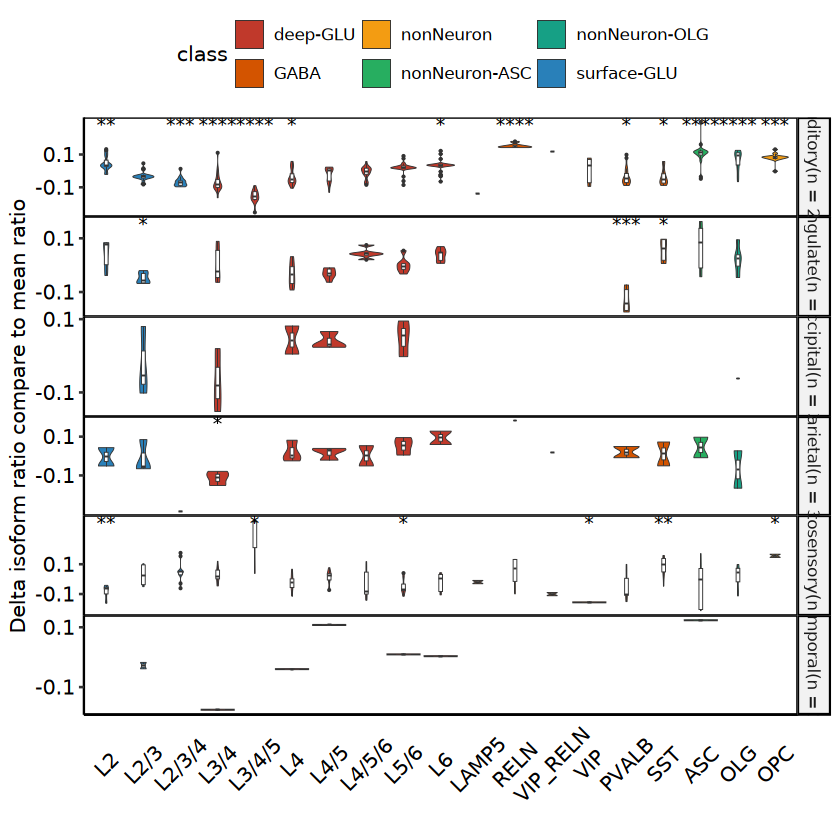

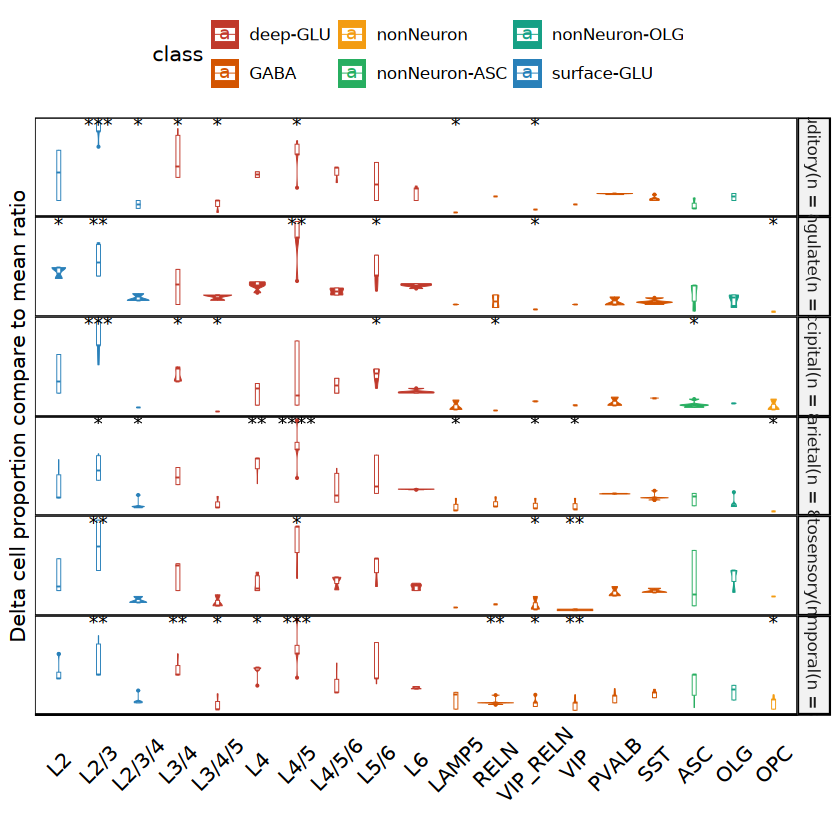

In [405]:
layersigan = isosigls$lobe
layersigan$dr.rl = layersigan$relative - layersigan$meanrelative
layersigan = layersigan[layersigan$sig != "N" & layersigan$dr.rl > 0.1,]
layersigan = unique(layersigan[,c("gene_id","transcript_id","areatr")])
colnames(layersigan)[3] = c("cluster")

transt.cs.l = transtcs.lobe[transtcs.lobe$transcript_id %in% isosigl$transcript_id,]
transt.cs.l = transt.cs.l[transt.cs.l$subclass != "",]
#transt.cs.l = transt.cs.l[transt.cs.l$genecount > 10,]
transt.cs.l = transt.cs.l %>% group_by(gene_id,lobe) %>% 
      mutate(meancellprop = mean(cellprop),
             othercellprop = (sum(cellprop) - cellprop)/(n() - 1))
transt.cs.l$dr.cp = transt.cs.l$cellprop - transt.cs.l$meancellprop
sigcellpop = unique(transt.cs.l[,c("transcript_id","lobe","subclass","dr.cp","cellprop")])
sigcellpop = sigcellpop[sigcellpop$transcript_id %in% layersigan$transcript_id,]
sigcellpop$class = subclassan[match(sigcellpop$subclass,subclassan$subclass),]$class
sigcellpop$subclass = factor(sigcellpop$subclass,levels = suborder[suborder %in% sigcellpop$subclass])

isosigsub = isosigls$subclass
isosigsub$dr2 = isosigsub$relative - isosigsub$meanrelative
isosigsub = merge(isosigsub,layersigan[,-1],by = "transcript_id")
isosigsub$class = subclassan[match(isosigsub$areatr,subclassan$subclass),]$class
isosigsub$areatr = factor(isosigsub$areatr,levels = suborder[suborder %in% isosigsub$areatr])
isosigcmp = isosigsub[!is.na(isosigsub$cluster),]

isosigcmp = isosigcmp %>% group_by(cluster) %>% mutate(clusteran = paste0(cluster,"(n = ",length(unique(transcript_id)),")"))
pmst2 = ggplot(isosigcmp,aes(x = areatr,y = dr2,fill = class)) + 
geom_violin(size = 0.2,drop = FALSE) +
geom_boxplot(size = 0.2,fill = "white",width=0.1,cex=0.8,outlier.size = 0.1) +
facet_grid(clusteran~.,scales = "free") + theme_pubr() + xlab("") + ylab("Delta isoform ratio compare to mean ratio") +
scale_fill_flatui() + scale_y_continuous(breaks = c(-0.1,0.1)) +
stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = T,ref.group = ".all.",vjust = 0.7) +
theme(axis.ticks.x = element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5),
      panel.spacing = unit(0,'lines'),
      panel.border = element_rect(fill = NA)) 
pmst2

sigcellpop = sigcellpop[sigcellpop$subclass %in% isosigcmp$areatr,]
sigcellpop = sigcellpop %>% group_by(lobe) %>% mutate(clusteran = paste0(lobe,"(n = ",length(unique(transcript_id)),")"))
pmst = ggplot(sigcellpop,aes(x = subclass,y = dr.cp,fill = class,color = class)) + 
geom_violin(size = 0.2,drop = FALSE) +
geom_boxplot(size = 0.2,fill = "white",width=0.1,cex=0.8,outlier.size = 0.1) +
facet_grid(clusteran~.,scales = "free") + theme_pubr() + xlab("") + ylab("Delta cell proportion compare to mean ratio") +
scale_fill_flatui() + 
scale_color_flatui() + 
scale_y_continuous(breaks = c(-0.1,0.1)) +
stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = T,ref.group = ".all.",vjust = 0.7) +
theme(axis.ticks.x = element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5),
      panel.spacing = unit(0,'lines'),
      panel.border = element_rect(fill = NA)) 
pmst

# pmst3 = ggplot(transt.cs.l,aes(x = subclass,y = dr.rp,fill = subclass)) + 
# geom_violin(size = 0.3,drop = FALSE) +
# geom_boxplot(size = 0.3,fill = "white",width=0.1,cex=0.8,outlier.size = 0.3) +
# facet_grid(layer~.,scales = "free") + theme_pubr() + xlab("") + ylab("Delta Isoform Ratio Compare to surface GLU") +
# scale_fill_flatui() + scale_y_continuous() +
# stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = T,ref.group = ".all.",vjust = 0.7) +
# theme(axis.ticks.x = element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5),
#       panel.spacing = unit(0,'lines'),
#       panel.border = element_rect(fill = NA)) 
# pmst3

In [406]:
ggexport(pmst + pmst2, filename = "result/figure4/lobe_subclass_interact_analysis_24_04_06.pdf",width = 10,height = 6)

Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
Warning message:
"Cannot compute density for groups with fewer than two datapoints."
file saved to result/figure4/lobe_subclass_interact_analysis_24_04_06.pdf



### DDRGK1 spatial case plot

In [39]:
MarkerSpPlot = function(npclfdp.cell,npclfdp.cellb,geneex){
    markdf = npclfdp.cell[npclfdp.cell$gene_id %in% geneex,]
    markdfb = npclfdp.cellb[!npclfdp.cellb$cell_id %in% markdf$cell_id,]
    markdf$transcript_id = paste0(markdf$gene_id,"-",markdf$transcript_id)
    markdf = markdf %>% group_by(cell_id,gene_id) %>% mutate(readrate = readnum/sum(readnum))
    markdf = markdf[markdf$readrate > 0.5,]
    markdfst = markdf %>% group_by(transcript_id) %>% summarise(cellnum = length(cell_id))
    markdfst$cellpop = markdfst$cellnum/sum(markdfst$cellnum)
    markdfst = markdfst[markdfst$cellpop > 0.01,]
    markdf = markdf[markdf$transcript_id %in% markdfst$transcript_id,]
    
    pmkpti = ggplot() +
      scattermore::geom_scattermore(
        data = markdfb,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.1
      ) +
      geom_point(data = markdf,
                 aes(x,y,shape = myclass,color = transcript_id),
                size = 1) + 
      # facet_wrap(~gene_id,nrow = 2) +
      theme_void() + 
      scale_fill_discreterainbow() +
      scale_color_discreterainbow() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 6)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 2)) +
      scale_y_reverse() + scale_x_reverse()
    pmkpti
    return(pmkpti)
}

In [870]:
#case plot
fsrawdp.cell = fsrawdp[fsrawdp$class != "",] %>% 
    group_by(cell_id,gene_id,transcript_id,class,subclass) %>%
    summarise(x = mean(x),y = mean(y),
              readnum = length(unique(readid)))
fsrawdp.cellb = qread("data//reads_full_anotation/longread_cell_position_24_03_29.qs")




`summarise()` has grouped output by 'cell_id', 'gene_id', 'transcript_id',
'class'. You can override using the `.groups` argument.


In [47]:
pref = qread("../ref/area_figure_an.qs")

fsrawdp.cell = qread("data/reads_full_anotation/main_data_read_total_annotation_dedup_forplot_onlycortex_24_05_01.qs")
#fsrawdp.cell = qread("data/reads_full_anotation/longread_cell_isoform_without_subcortical_24_03_29.qs")
fsrawdp.cellb = qread("data//reads_full_anotation/longread_cell_position_24_03_29.qs")

In [33]:
fsrawdp.cell = fsrawdp[fsrawdp$class != "",] %>% 
    group_by(cell_id,gene_id,transcript_id,layer,lobe,class,subclass) %>%
    summarise(x = mean(x),y = mean(y),
              readnum = length(unique(readid)))
qsave(fsrawdp.cell,"data/reads_full_anotation/longread_cell_isoform_without_subcortical_24_03_29.qs")

`summarise()` has grouped output by 'cell_id', 'gene_id', 'transcript_id',
'layer', 'lobe', 'class'. You can override using the `.groups` argument.


In [48]:
fsrawdp.cell = fsrawdp.cell[fsrawdp.cell$class != "",] %>% 
    group_by(cell_id,gene_id,transcript_id,layer,lobe,class,subclass) %>%
    summarise(x = mean(x),y = mean(y),
              readnum = length(unique(readid)))

`summarise()` has grouped output by 'cell_id', 'gene_id', 'transcript_id',
'layer', 'lobe', 'class'. You can override using the `.groups` argument.


In [49]:
#fsrawdp.cell$myclass = subclassan[match(fsrawdp.cell$subclass,subclassan$subclass),]$class

fsrawdp.cellf = fsrawdp.cell[fsrawdp.cell$subclass %in% c("L2/3/4","L2/3","L3/4"),]


markdf = fsrawdp.cellf[fsrawdp.cellf$gene_id %in% "DDRGK1",]
markdfb = fsrawdp.cellb[!fsrawdp.cellb$cell_id %in% markdf$cell_id,]
markdf$transcript_id = paste0(markdf$gene_id,"-",markdf$transcript_id)
# markdf = markdf %>% group_by(cell_id,gene_id,transcript_id,layer,lobe,class,subclass) %>%
#     summarise(x = mean(x),y = mean(y),readnum = length(unique(readid)))
markdf = markdf %>% group_by(cell_id,gene_id) %>% mutate(readrate = readnum/sum(readnum))
markdf = markdf[markdf$readrate > 0.5,]
markdfst = markdf %>% group_by(transcript_id) %>% summarise(cellnum = length(cell_id))
markdfst$cellpop = markdfst$cellnum/sum(markdfst$cellnum)
markdfst = markdfst[markdfst$cellpop > 0.01,]
markdf = markdf[markdf$transcript_id %in% markdfst$transcript_id,]

file saved to result/figure4/DDRGK1_spatial_plot_different_crosslayer_cellclass_24_05_30.pdf



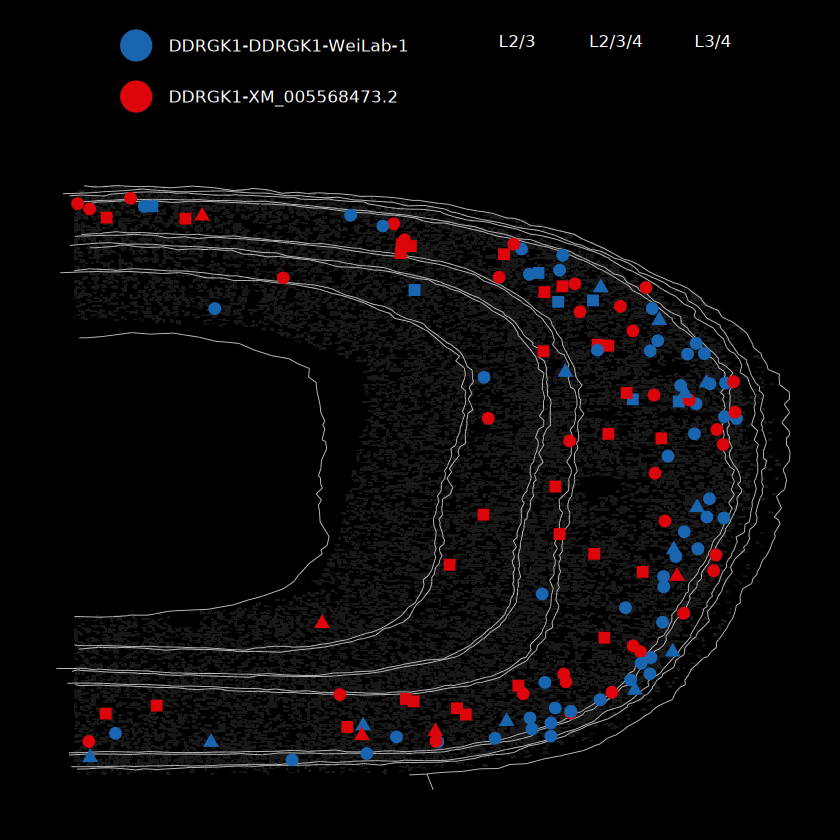

In [50]:
zoomaxis = c(10000,3000,41000,20000)
#zoomaxis = c(10000,3000,70000,40000)
#zoomaxis = c(130000,1000,100000,2000)
myedges = pref$layeredges
markdfzoom = markdf[markdf$x < zoomaxis[1] & markdf$x > zoomaxis[2] & markdf$y < zoomaxis[3] & markdf$y > zoomaxis[4],]
markdfbzoom = markdfb[markdfb$x < zoomaxis[1] & markdfb$x > zoomaxis[2] & markdfb$y < zoomaxis[3] & markdfb$y > zoomaxis[4],]
myedges = myedges[myedges$x1 < zoomaxis[1] & myedges$x1 > zoomaxis[2] & myedges$y1 < zoomaxis[3] & myedges$y1 > zoomaxis[4],]
pmkpti = ggplot() +
      scattermore::geom_scattermore(
        data = markdfbzoom,
        aes(x,y),
        color = "white",
        pointsize = 0.1
      ) +
     geom_segment(data = myedges, 
                   aes(x = x1, y = y1, xend = x2, yend = y2),
                   size = 0.2,
                   color = "grey") + theme_void() +
      geom_point(data = markdfzoom,
                 aes(x,y,color = transcript_id,shape = subclass),
                size = 3) + 
      theme_void() + 
      scale_fill_discreterainbow() +
      scale_color_discreterainbow() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 10)) +
      guides(color = guide_legend(override.aes = list(size=8),
                                  nrow = 2)) +
      scale_y_reverse() + scale_x_reverse()
pmkpti
ggexport(pmkpti,filename = "result/figure4/DDRGK1_spatial_plot_different_crosslayer_cellclass_24_05_30.pdf",width = 6,height = 6)

In [58]:
#stat plot
markdfst = markdf %>% group_by(subclass,layer,transcript_id) %>% summarise(readnum = sum(readnum))
markdfst = markdfst %>% group_by(subclass,layer) %>% mutate(readrate = readnum/sum(readnum))
pmkpt2 = ggplot(markdfst[markdfst$layer != "l1",],aes(x = layer, y = readrate,fill = subclass)) + 
geom_bar(stat = "identity",position = position_dodge(0.7),width = 0.1) +
geom_point(shape = 21,position = position_dodge(0.7)) +
theme_pubr() +
scale_fill_flatui() +
facet_grid(~transcript_id)
pmkpt2
ggexport(pmkpt2,filename = "result/figure4/DDRGK1_spatial_plot_different_crosslayer_cellclass_stat_24_05_30.pdf",width = 4,height = 4)

`summarise()` has grouped output by 'subclass', 'layer'. You can override using
the `.groups` argument.
file saved to result/figure4/DDRGK1_spatial_plot_different_crosslayer_cellclass_stat_24_05_30.pdf



file saved to result/figure4/MYL6_spatial_plot_different_cellclass_24_04_05.pdf



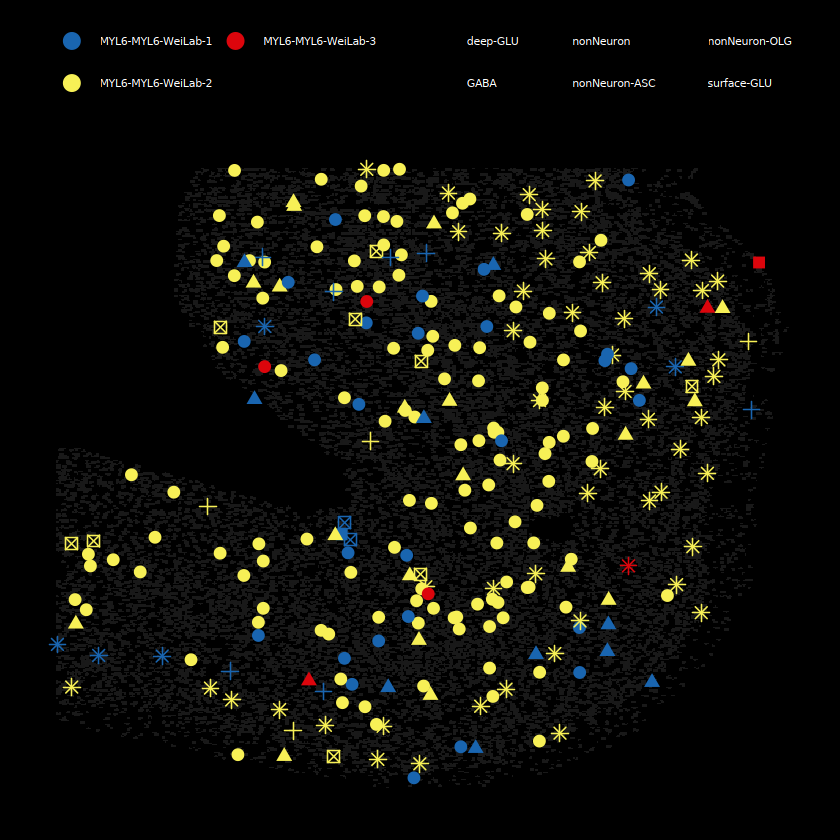

In [528]:
geneex = "MYL6"
fileid = paste0("result/figure4/",geneex,"_spatial_plot_different_cellclass_24_04_05.pdf")
pc2 = MarkerSpPlot(fsrawdp.cell[fsrawdp.cell$x < 10000 & fsrawdp.cell$x > 3000 & fsrawdp.cell$y < 70000 & fsrawdp.cell$y > 50000,],
                   fsrawdp.cellb[fsrawdp.cellb$x < 10000 & fsrawdp.cellb$x > 3000 & fsrawdp.cellb$y < 70000 & fsrawdp.cellb$y > 50000,],
                   geneex)
pc2
ggexport(pc2,filename = fileid,width = 6,height = 6)

In [441]:
head(fsrawdp.cell)

cell_id,gene_id,transcript_id,class,subclass,x,y,readnum
<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>
1,AAR2,XM_005568913.2,GLU,L6,51192,77807,1
1,ACACA,XM_005583932.2,GLU,L6,48966,77807,1
1,ADAM11,XM_005584444.2,GLU,L6,8427,77819,2
1,ANKRD12,XM_005587177.2,GLU,L6,51208,77803,1
1,AP2M1,XM_005546525.2,GLU,L6,48984,77801,1
1,ARMC1,XM_005563431.2,GLU,L6,51181,77807,1
